In [1]:
import paho.mqtt.client as mqtt
import threading
import os
import re
# import motionlocalizer.settings
import json
# import requests
from shapely.geometry import Polygon
from shapely.ops import cascaded_union
import xml.etree.ElementTree
import pprint
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Circle
import time as pythonTimer
import random
from random import randint
import scipy.stats as stats
from scipy.stats import multivariate_normal
import csv
import datetime
import pandas as pd

simworldname = 'simulationWorld2.xml' #ENVIROMENT
groundtruth = '28jun2.csv' #AGENT'S MOVEMENTS
motion_readings = '28Jun2_motion_events.txt'
# groundtruth = 'AgentDetailedTasksFile.csv' #AGENT'S MOVEMENTS

my_map = [(0.0, 0.0), (0.0, 10.6), (6.6, 10.6), (6.6, 0.0)]
grid_map = np.zeros((int(my_map[2][0]) * 10, int(my_map[2][1]) * 10))
distances = []

oracle = {}
oracle['time'] = []
oracle['location'] = []

analyzer = {}
analyzer['time'] = []
analyzer['gridmap'] = []
 
def start_localizing(event):
    global analyzer
    global oracle
    global grid_map
    run_localization(event)

def run_localization(event):
    global analyzer
    global oracle
    global grid_map
    # print("run_localization")
    Localizer(pythonTimer.time()).run(event)

In [2]:
def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx


# sensor_readings = open(motion_readings, "r")
sensor_readings = open(motion_readings, "r").readlines()

dataset_times = []
dataset_readings = []
for i in range(0,len(sensor_readings)):
    time = sensor_readings[i].split(';')[0]
    sensor_array = sensor_readings[i].split(';')[1]
    dataset_times.append(int(time))
    dataset_readings.append(sensor_array)

dataset = ['time', 'gt(x)', 'gt(y)', 'motion_readings']
with open(groundtruth, 'r') as user_data:
    reader = csv.reader(user_data, delimiter=',', quotechar=',')
    line = 0
    for row in reader:
        new_row = []
        if (reader.line_num != 1):
            ind = find_nearest(dataset_times[1:], int(row[0]))
            dataset = np.vstack((dataset, [float(row[0]), float(row[4]), float(row[5]), dataset_readings[line]]))
            line = line + 1

In [3]:
dataset

array([['time', 'gt(x)', 'gt(y)', 'motion_readings'],
       ['1498670641.0', '1.197742', '5.402001', '0000000000000000000000'],
       ['1498670642.0', '1.198065', '5.401716', '0000000000000000000000'],
       ...,
       ['1498677300.0', '3.4', '3.45', '0000000000000000000000'],
       ['1498677303.0', '3.4', '3.45', '0000000000000000000000'],
       ['1498677318.0', '3.4', '3.45', '0000000000000000000000']],
      dtype='<U32')

In [4]:
dataset

array([['time', 'gt(x)', 'gt(y)', 'motion_readings'],
       ['1498670641.0', '1.197742', '5.402001', '0000000000000000000000'],
       ['1498670642.0', '1.198065', '5.401716', '0000000000000000000000'],
       ...,
       ['1498677300.0', '3.4', '3.45', '0000000000000000000000'],
       ['1498677303.0', '3.4', '3.45', '0000000000000000000000'],
       ['1498677318.0', '3.4', '3.45', '0000000000000000000000']],
      dtype='<U32')

In [5]:
motions_order = [1, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 2, 20, 21, 22, 3, 4, 5, 6, 7, 8, 9]
motion_sensors = [1, 10, 11, 12, 13, 14, 2, 3, 4, 5, 6, 7, 8, 9]
motions_sensor_data = {}

sr_matrix = np.zeros([1, 14])
for i in range(1,len(dataset)):
    sensor_array = dataset[i][3]
    sr_row = []
    for j in range(0,len(sensor_array)):
        if (motions_order[j] <= 14):
            sr_row.append(int(sensor_array[j]))

    sr_matrix = np.vstack((sr_matrix,sr_row))

i = 0
for sensor in motions_order:
    if (sensor <= 14):
        motions_sensor_data[sensor] = []
        motions_sensor_data[sensor] = sr_matrix[:, i]
        i = i + 1
        
for sensor in motion_sensors:
    new_readings = []
    new_readings.append(motions_sensor_data[sensor][0])
    for i in range(1, len(motions_sensor_data[sensor])):
        if (new_readings[len(new_readings) - 1] == motions_sensor_data[sensor][i]):
            new_readings.append(0)
        else:
            new_readings.append(1)

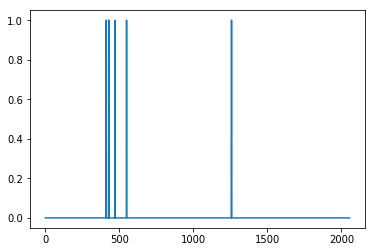

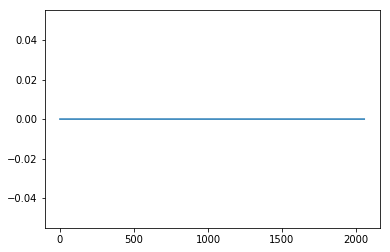

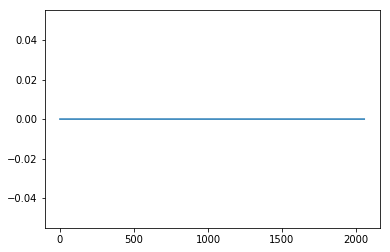

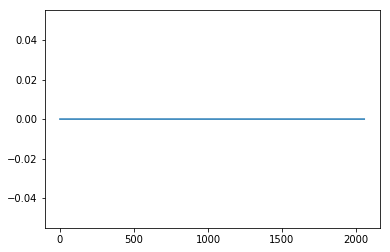

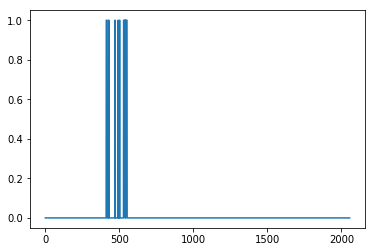

...

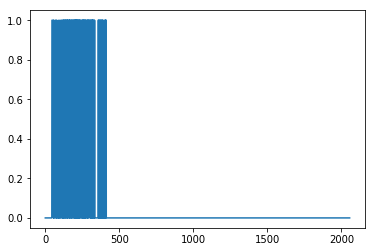

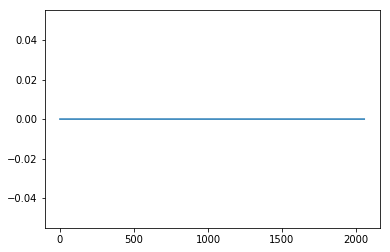

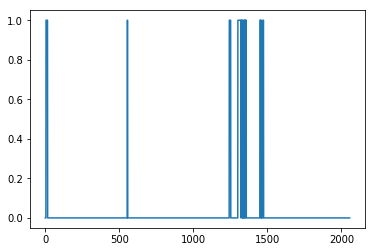

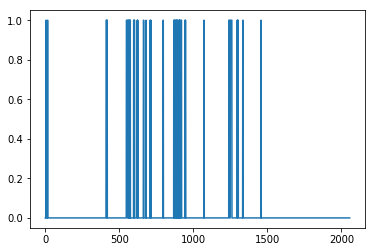

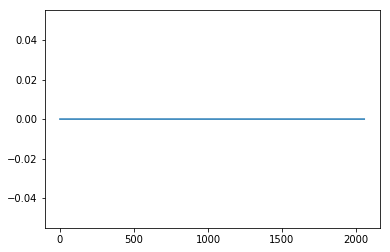

In [6]:
import matplotlib.pyplot as plt

for i in motion_sensors:
    plt.plot(list(range(0,len(motions_sensor_data[i]))), motions_sensor_data[i])
    plt.show()

In [7]:
##################################
####       Sensor Class       ####
##################################

class Sensor:
    sensor_type = ""
    sensor_id = ""
    x = float()
    y = float()
    z = float()

    def __str__(self):
        return 'type: %s,\n id: %s,\n x: %s,\n y: %s\n'%(self.sensor_type, self.sensor_id, self.x, self.y)

    def Initialize(self, element):
        self.x = (str(element.find('point').find('xcoord').text))
        self.y = (str(element.find('point').find('ycoord').text))
        self.sensor_id = (str(element.find('id').text))
        self.sensor_type = (str(element.find('type').text))     
            
        return 0
    
    
    '''
        This fucntion uses an 2D gaussian, that means: X~(x, mean, covarianceMatrix)
        Input:
        x = [xOracle, yOracle] (Actually we don't care about it anymore)
        mean = [xSimulator, ySimulator]
        covarianceMatrix= | r  0 | , where r is the circle radious
                          | 0  r |

        Returns: cdf of the normal distribution
        
    '''
    def GaussianFiredSensor(self, simulated_localization, real_localization):
        import math

        sensor_location = [float(self.x)/10, float(self.y)/10]
        cov = [[self.sensing_area, 0],[0, self.sensing_area]]        
        prob = multivariate_normal(simulated_localization, cov)
        probCdf = prob.cdf(sensor_location)
        
        # print("real: ", real_localization)
        # print("simu: ", simulated_localization)
              
        return probCdf
    
"""
System's sensors
All this classes are childrens from Sensor Class
"""
class MotionSensorBinary(Sensor):
    def __init__(self, element):
        Sensor.Initialize(self, element)
        # self.sensing_area = (str(element.find('radius').text))
        self.sensing_area = (str(120))

class RFID_Reader(Sensor):
    def __init__(self, element):
        Sensor.Initialize(self, element)
        self.sensing_area = (str(element.find('arcSize').text))

class MotionSensorAnalog(Sensor):
    def __init__(self, element):
        Sensor.Initialize(self, element)
        self.sensing_area = (str(element.find('radius').text))
        
class PressureSensorAnalog(Sensor):
    def __init__(self, element):
        Sensor.Initialize(self, element)
        self.sensing_area = (str(element.find('radius').text))
        self.object = str(element.find('object').text)
        
class BeaconSensor(Sensor):
    def __init__(self, element):
        Sensor.Initialize(self, element)
        self.sensing_area = (str(element.find('radius').text))
        self.measuredPower = -69
        self.RSSI = self.sensing_area
        self.N = 2 #Constant related with the air
        self.object = str(element.find('object').text)
        self.accelerometer = str(element.find('accelerometer').text)
        
    # https://iotandelectronics.wordpress.com/2016/10/07/how-to-calculate-distance-from-the-rssi-value-of-the-ble-beacon/
    def rssiToMeters(self):
        u = (float(self.measuredPower) - float(self.RSSI))/(10 * float(self.N))
        dist = 10 ** u
        
        return dist
    
   # def distanceToMeasure(self, dist):
     #   mp = self.RSSI + (10*n*math.log10(dist)
    #    return mp
    

In [8]:
#Event Class
class Event:
    source = ""
    timestamp = float()
    RSSI = 0
    objectAtt = ""
    accelerometer = False
    sensor = Sensor.sensor_id
    sensorType = Sensor.sensor_type
    data = int()
    hash = ""

    def __str__(self):
        return 'time: %s --> sensor: <%s>, sensor type: %s data: %s' % (
        str(self.timestamp), str(self.sensor), str(self.sensorType), str(self.data))

In [9]:
class GridMap:
    map = ""

In [10]:
#Debug function, not working - just forget about it
def checkTypeSensor(sensor):
    if(sensor.sensor_type == 'RFID_Reader'):
        this_sensor = RFID_Reader(sensor) 
        return this_sensor

    if(sensor.sensor_type == 'MotionSensorBinary'):
        this_sensor = MotionSensorBinary(sensor)
        #this_sensor = sensor
        return this_sensor

    if(sensor.sensor_type == 'MotionSensorAnalog'):
        this_sensor = MotionSensorAnalog(sensor)
        return this_sensor

    if(sensor.sensor_type == 'PressureSensorAnalog'):
        this_sensor = PressureSensorAnalog(sensor)
        return this_sensor
    
    return "none"

In [11]:
############################################
####       PARSE SIMULATION WORLD       ####
############################################

root = xml.etree.ElementTree.parse(simworldname).getroot()

grid2 = np.zeros((int(my_map[2][0]) * 1, int(my_map[2][1]) * 1))
grid2 = np.copy(grid_map)

# print(grid2)

sensors_list = []

for element in root:
    if(element.tag == 'sensors'):
        for sensor in element:
            #Choose the kind of sensor we have
            if(str(sensor.find('type').text) == 'RFID_Reader'):
                this_sensor = RFID_Reader(sensor)
                
            if(str(sensor.find('type').text) == 'MotionSensorBinary'):
                this_sensor = MotionSensorBinary(sensor)
                
            if(str(sensor.find('type').text) == 'MotionSensorAnalog'):
                this_sensor = MotionSensorAnalog(sensor)
            
            if(str(sensor.find('type').text) == 'PressureSensorAnalog'):
                this_sensor = PressureSensorAnalog(sensor)
            
            if(str(sensor.find('type').text) == 'BeaconSensor'):
                this_sensor = BeaconSensor(sensor)
                
            sensors_list.append(this_sensor)
            print(this_sensor.sensor_type + " " + this_sensor.x + " " + this_sensor.y + " " + this_sensor.sensor_id)
            
            # print(sensors_list[len(sensors_list) - 1])

BeaconSensor 479 405 sensorBC1
PressureSensorAnalog 479 405 sensorPS1
MotionSensorBinary 455 405 sensor1
MotionSensorBinary 479 284 sensor2
MotionSensorBinary 509 101 sensor3
MotionSensorBinary 183 389 sensor4
MotionSensorBinary 271 225 sensor5
MotionSensorBinary 91 225 sensor6
MotionSensorBinary 466 894 sensor7
MotionSensorBinary 426 626 sensor8
MotionSensorBinary 122 861 sensor9
MotionSensorBinary 244 1003 sensor10
MotionSensorBinary 215 711 sensor11
MotionSensorBinary 183 577 sensor12
MotionSensorBinary 574 527 sensor13
MotionSensorBinary 574 688 sensor14


In [12]:
############################################
####         LOCALIZATION CLASS         ####
############################################
simulated_sensor_readings = []

class Localizer(threading.Thread):
    to_be_localized_queue = []
    localizer_lock = threading.Lock()
    this_grid_map = []
    
    
    def __init__(self, time):
        self.time = time

    def run(self, event):
        global grid_map
        global analyzer
        global oracle
        global distances
        # print("Run")
        Localizer.to_be_localized_queue.append(self.time)
        with Localizer.localizer_lock:
            while len(Localizer.to_be_localized_queue) > 0:
                timestamp = Localizer.to_be_localized_queue[0]
                Localizer.to_be_localized_queue = Localizer.to_be_localized_queue[1:]
                self.localize(timestamp, event)
    
    def localizer_confidence(self):
        return 0.9

    def get_event_period(self):
        return 1.0

    def getLocations(self, time, event):
        global grid_map
        global analyzer
        global oracle
        global distances

        fired_sensors = []
        fired_sensors = self.FindFiredSensor(event, grid_map, event.timestamp)

          
        
        if len(fired_sensors) == 0:
            return
        
        counter = 0
        try:
            m1 = np.min(grid2[np.nonzero(grid2)])
            M1 = np.max(grid2[np.nonzero(grid2)])

            # print("Value in try:", m1)
            # print("Value in try:", M1)
            
        except:
            print("start!")
        
        for i in range(len(grid2[:,1])):
            for j in range(len(grid2[1,:])):
                for sensor in fired_sensors:
                                 
                    #my_sensor = checkTypeSensor(sensor)
                    my_sensor = sensor
                    r = float(my_sensor.sensing_area)/10
                    x = float(my_sensor.x)/10
                    y = float(my_sensor.y)/10
                    
                    circ = Circle((int(int(x)), int(int(y))), int(int(r)))
                    
                    if (circ.contains_point([i, j])):
                        grid2[i][j] += 1
        
        sumofpoints = sum(sum(grid2))/4
        
        if (sumofpoints == 0):
            print("no 1")
        else:
            grid2 = np.true_divide(grid2, sumofpoints)
        
        inferred_location = self.AskLocationFromLocalizer(grid2)
        real_location2 = self.AskLocationFromOracle(time)
   
        return inferred_location, real_location2, fired_sensors
        
    def localize(self, time, event):
                #finds the inferred an real locations, and what sensors were fired
#         inferred_location, real_location, fired_sensors = self.getLocations(event.timestamp, event)    
        
        # k = 0
        # i = len(fired_sensors2)
        
        # if(i > 0):
        #     i -= 1
        
        # while(i >= 0):         
        #     current_sensor = fired_sensors2[i]
            #get the probability from the gaussian filter
        #     probi = current_sensor.GaussianFiredSensor(inferred_location, real_location)
            
            # COMMENTED OUT FOR EXPERIMENTS
            # if(probi < 0.015):
                # del fired_sensors2[i]
        #     i -= 1
            #print(probi)
                
        # fired_sensors = fired_sensors2
        
        
        global grid_map
        global analyzer
        global oracle
        global distances

        fired_sensors = []
        fired_sensors = self.FindFiredSensor(event)
        if len(fired_sensors) == 0:
            return
        

        
        self.SimulateSensorReading(fired_sensors) 
        
        counter = 0
        try:
            m1 = np.min(grid_map[np.nonzero(grid_map)])
            M1 = np.max(grid_map[np.nonzero(grid_map)])

            # print("Value in try:", m1)
            # print("Value in try:", M1)
            
        except:
            print("start!")
        
        #Bruno's code here
        
        for i in range(len(grid_map[:,1])):
            for j in range(len(grid_map[1,:])):
                for sensor in fired_sensors:
                    circ = Circle((int(float(sensor.x)/10), int(float(sensor.y)/10)), int(float(sensor.sensing_area)/10))
                    if (circ.contains_point([i, j])):
                        grid_map[i][j] += 1
        
        sumofpoints = sum(sum(grid_map))/4
          
        if (sumofpoints == 0):
            print("no 2")
        else:
            grid_map = np.true_divide(grid_map, sumofpoints)
            
        analyzer['time'].append(event.timestamp)
        analyzer['gridmap'].append(grid_map)

        # plt.imshow(grid_map, cmap='hot', interpolation='nearest')
        # plt.show()
        
        dist = self.ReportError(event.timestamp, grid_map)
        distances.append(dist)
        
        # print(dist)
    
    def ReportError(self, time, recent_grid):
        global oracle
        
        inferred_location = self.AskLocationFromLocalizer(recent_grid)
        real_location = self.AskLocationFromOracle(time)
        
        print("infered loc:")
        print(inferred_location)
        print("real loc:")
        print(real_location)
        
        xlim=(0, 200)
        ylim=(0, 200)
        
        
        p1 = plt.scatter(real_location[0], real_location[1], marker='+', color='k', s=180, lw=3)
        p2 = plt.scatter(inferred_location[0], inferred_location[1], marker='s', color='r')
        
        plt.legend([p1, p2], ['Real Location', 'Estimated Location'], loc=4, numpoints=1)
        plt.xlim(*xlim)
        plt.ylim(*ylim)
        # print('final position error, variance:\n\t', mu - np.array([iters, iters]), var)
        plt.show()
        
        return np.linalg.norm(inferred_location - real_location)
        
    def SimulateSensorReading(self, fs):
        sensor_bins = [0] * 14
        
        for sensor in fs:
            if (sensor.sensor_type == 'MotionSensorBinary'):
                snum = int(sensor.sensor_id.replace('sensor',''))
                sensor_bins[motion_sensors.index(snum)] = 1
                
        simulated_sensor_readings.append(sensor_bins)
        print(len(simulated_sensor_readings))
    
    def AskLocationFromLocalizer(self, recent_grid):
        return np.mean(list(zip(*np.where(recent_grid == np.max(recent_grid)))), axis = 0)
    
    def AskLocationFromOracle(self, time):  
        point = np.mean(np.asarray(oracle['location'])[np.where(np.asarray(oracle['time']) == int(time))], axis = 0)
        #print("ponto: ", point, "time: ", time)
        return point
    
    """
    I'm implementing a randomic action fiture for the sensors, causing false-positive events. Basically, 
    to choose WHICH sensor will be deployed, I get an random number between [0 - (X - 1)], where X is the length 
    of the sensor list. To choose WHEN the sensor is deployed, I'll define a variable called "control = 123", and
    create a list of random 10 numbers between [0 - 150], everytime the list contains whe variable control, we
    switch to the random event.
    """
    def FindFiredSensor(self, event):
        fired_sensors2 = []
        firedsensor = event.sensor
        
        # COMMENTED OUT FOR EXPERIMENTS
        # listControl = random.sample(range(0, 150), 10)
        # control = 123
        
        # if(control in listControl):  
        #     rand = randint(0, len(sensors_list) - 1)
        #     current_sensor = sensors_list[rand]
        #     fired_sensors2.append(current_sensor)
        
        for i in range(len(sensors_list)):
            current_sensor = Sensor()
            current_sensor = sensors_list[i]
            if current_sensor.sensor_id == firedsensor:
                fired_sensors2.append(current_sensor)  
                
        return fired_sensors2


    def extract_fired_sensors(self, start, end):
        sensors = sensors_list
        fired_sensors = []
        for s in sensors:
            if Event.objects.filter(timestamp__gt=start, timestamp__lt=end, sensor=s).exists():
                fired_sensors.append(s)
                continue
            if Event.objects.filter(sensor=s).exists():
                last_event = Event.objects.filter(sensor=s).latest(field_name='timestamp')
                if int(last_event.data) == 1:
                    # print('latest is 1')
                    # print(s)
                    fired_sensors.append(s)

        return fired_sensors


In [13]:
#temporary:
# my_map = [(0.0, 0.0), (0.0, 5.7), (7.05, 5.7), (7.05, 0.0)]
# grid_map = np.zeros((int(my_map[2][0]) * 10, int(my_map[2][1]) * 10))



# print(np.max(grid_map))
# print("first input")
# result = "casiSimulator/sensor_readings/MotionSensorBinary/MotionSensorBinary-288.3-495.0 1538687434000,MotionSensorBinary,MotionSensorBinary-288.3-495.0,TRUE,TRUE1"
# event = ParseResult(result)
# start_localizing()
# print(np.max(grid_map[np.nonzero(grid_map)]))
# print(np.min(grid_map[np.nonzero(grid_map)]))
# plt.imshow(grid_map, cmap='hot', interpolation='nearest')
# plt.show()

# print('---------------------------')

# print(np.max(grid_map))
# print("second input")
# result1 = "casiSimulator/sensor_readings/MotionSensorBinary/MotionSensorBinary-511.6-343.6 1538687449000,MotionSensorBinary,MotionSensorBinary-511.6-343.6,TRUE,TRUE1"
# event = ParseResult(result1)
# start_localizing()
# print(np.max(grid_map[np.nonzero(grid_map)]))
# print(np.min(grid_map[np.nonzero(grid_map)]))
# plt.imshow(grid_map, cmap='hot', interpolation='nearest')
# plt.show()



In [14]:
#Debug function, sees what kind of activity we have
def typeAction(type):
    if(type == "Sleep"):
        print(type + "ENTREI")

    if(type == "walk"):
        print(type + "ENTREI")
        
    if(type == "Water"):
        print(type + "ENTREI")
        
    if(type == "Wash"):
        print(type + "ENTREI")
        
    if(type == "Entertainment"):
        print(type + "ENTREI")
        
    if(type == "Exercise"):
        print(type + "ENTREI")

    if(type == "Clean"):
        print(type + "ENTREI")
        
    if(type == "Eat"):
        print(type + "ENTREI")
        
    if(type == "Sit"):
        print(type + "ENTREI")

In [15]:
"""
Function to read the path in the csv file and turn it on an event.
The event is composed of: (sensor Id, data, hash, source, time)
Everytime that a sensor finds
"""
def readFileCSV():             
    for i in range(1, len(dataset)):
        no_event_flag = 1
        xtrace = float(dataset[i][1])
        ytrace = float(dataset[i][2])
        x = abs(float(xtrace)) * 10
        y = abs(float(ytrace)) * 10
        loc = [x, y]
        timetoadd = int(round(float(dataset[i][0])))
        
        if loc not in oracle['location'] and timetoadd not in oracle['time']:

            oracle['location'].append(loc)
            oracle['time'].append(timetoadd) 
        
        for sensor in sensors_list:
            # print(sensor.sensor_type)
            # if(sensor.sensor_type == "BeaconSensor"):
                # no_event_flag = 0
                # event = Event()
                # event.RSSI = sensor.RSSI #RSSI, just for beacons
                # event.accelerometer = sensor.accelerometer #if it's moving or not - jsut for beacon
                # event.objectAtt = sensor.object #Object where the sensor is
                
                # event.RSSI = 0 #RSSI, just for beacons
                # event.objectAtt = "" #Object where the sensor is
                # event.accelerometer = False #if it's moving or not - jsut for beacon
                # continue
                
            # elif(sensor.sensor_type == "PressureSensorAnalog"):
                # continue
                # no_event_flag = 0
                # event.objectAtt = sensor.object #Object where the sensor is
            
            if (sensor.sensor_type == "MotionSensorBinary"):    
                circ = Circle((int(int(sensor.x) / 10), int(int(sensor.y) / 10)), int(int(sensor.sensing_area) / 10))
                if (circ.contains_point([x, y])):
                    no_event_flag = 0
                    event = Event()
                    event.sensor = sensor.sensor_id #SensorId that created the event
                    event.data = "TRUE"  #data
                    event.hash = "|hash|" #hash
                    event.source = "xmlFile" #where is coming from
                    event.timestamp = int(round(float(dataset[i][0]))) #timestamp
                    event.sensorType = sensor.sensor_type #type of sensor

                    run_localization(event)
                    
            # else:
                # sensor_bins = [0] * 14
                # simulated_sensor_readings.append(sensor_bins)    
            
        if (no_event_flag == 1):
            sensor_bins = [0] * 14
            simulated_sensor_readings.append(sensor_bins)
        no_event_flag = 0
        
        

        

1
start!
infered loc:
[18.         57.02727273]
real loc:
[11.97742 54.02001]


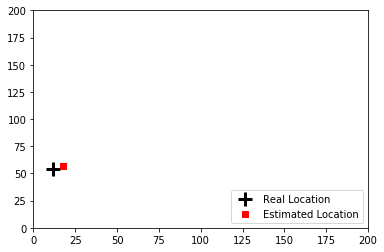

2
infered loc:
[18.         57.02727273]
real loc:
[11.98065 54.01716]


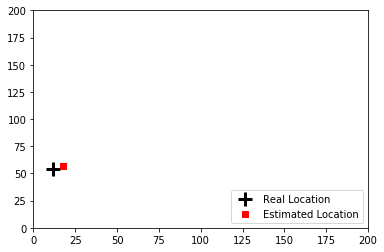

3
infered loc:
[18.         57.02727273]
real loc:
[11.98387 54.0143 ]


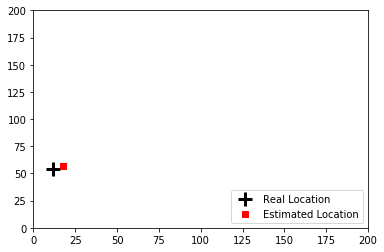

4
infered loc:
[18.         57.02727273]
real loc:
[11.9871  54.01144]


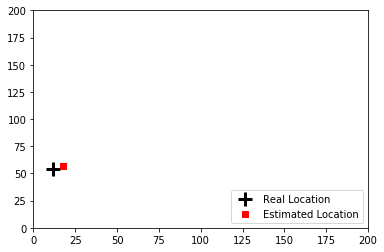

5
infered loc:
[18.         57.02727273]
real loc:
[11.99032 54.00858]


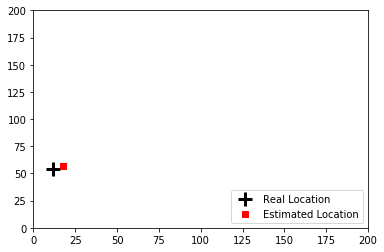

6
infered loc:
[18.         57.02727273]
real loc:
[11.99355 54.00572]


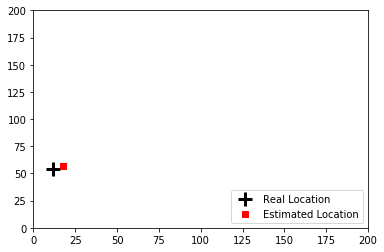

7
infered loc:
[18.         57.02727273]
real loc:
[12. 54.]


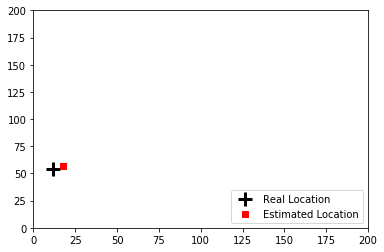

8
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


C:\Users\shada\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2957: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Users\shada\Anaconda3\lib\site-packages\numpy\core\_methods.py:73: RuntimeWarning: invalid value encountered in true_divide
  ret, rcount, out=ret, casting='unsafe', subok=False)


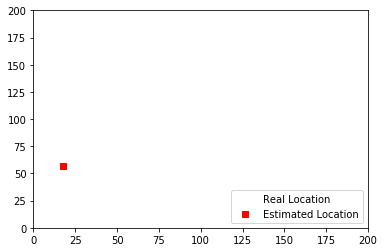

9
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


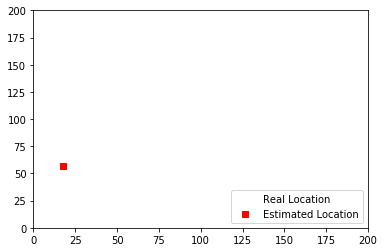

10
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


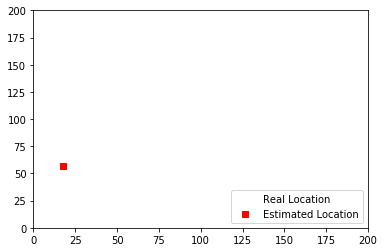

11
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


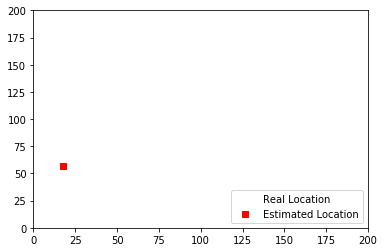

12
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


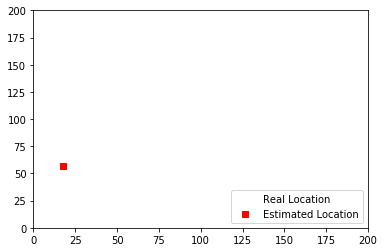

13
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


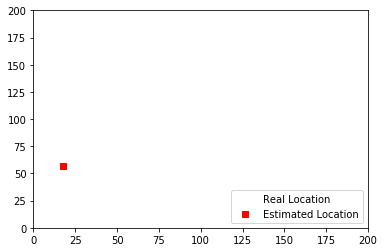

14
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


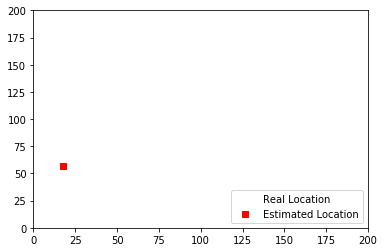

15
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


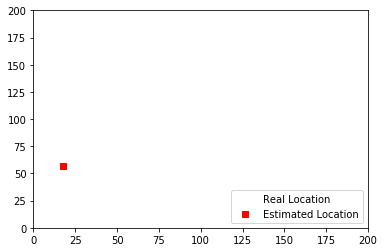

16
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


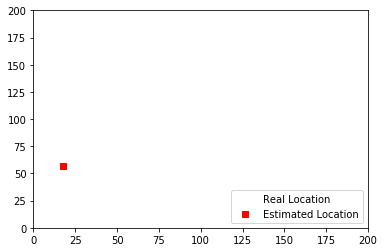

17
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


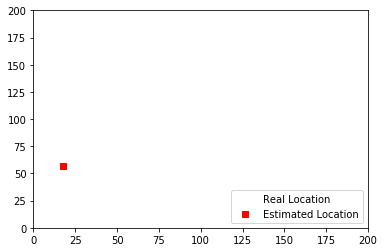

18
infered loc:
[18.         57.02727273]
real loc:
[15.66667 50.5    ]


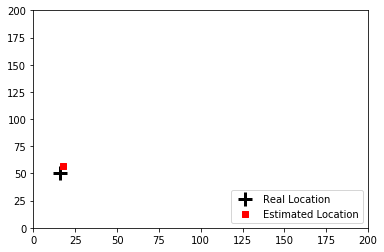

19
infered loc:
[18.         47.55555556]
real loc:
[26.66667 40.     ]


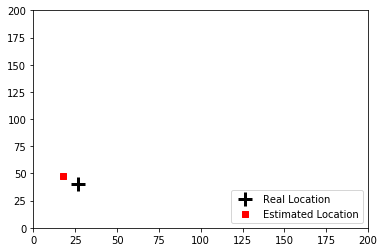

289
infered loc:
[45.         40.02727273]
real loc:
[41.8 42.6]


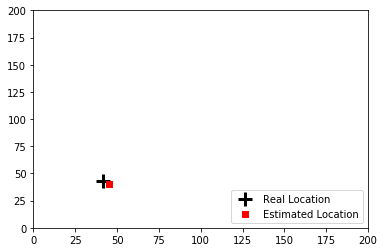

290
infered loc:
[50.92105263 46.07894737]
real loc:
[49.6 52.2]


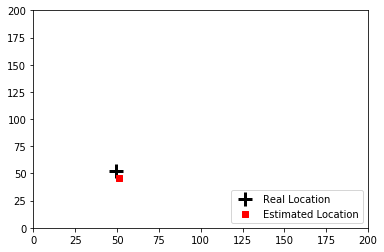

291
infered loc:
[54.921875 60.0625  ]
real loc:
[60. 65.]


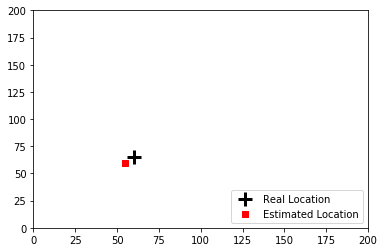

292
infered loc:
[54.921875 60.0625  ]
real loc:
[nan nan]


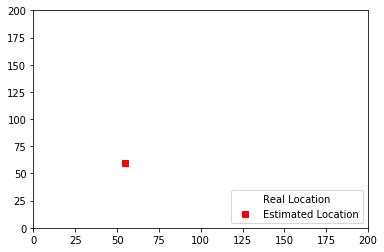

293
infered loc:
[54.921875 60.0625  ]
real loc:
[nan nan]


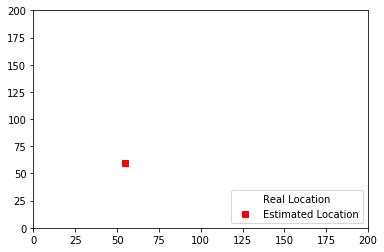

294
infered loc:
[54.921875 60.0625  ]
real loc:
[nan nan]


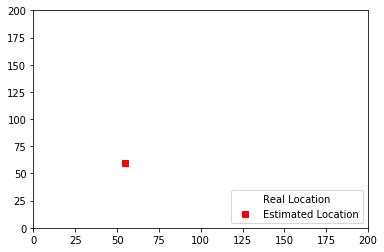

295
infered loc:
[54.921875 60.0625  ]
real loc:
[nan nan]


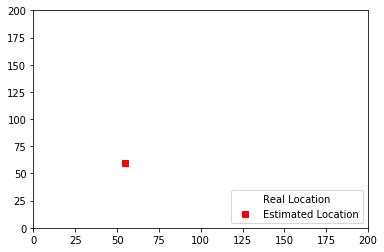

296
infered loc:
[54.921875 60.0625  ]
real loc:
[nan nan]


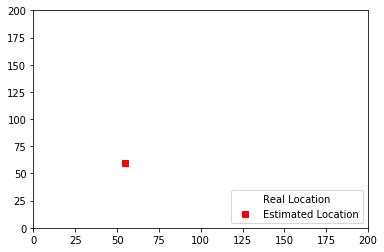

297
infered loc:
[54.921875 60.0625  ]
real loc:
[nan nan]


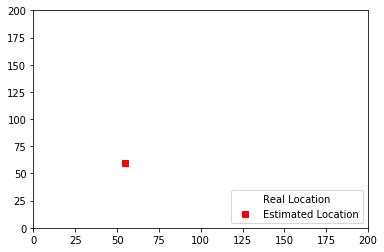

298
infered loc:
[54.921875 60.0625  ]
real loc:
[nan nan]


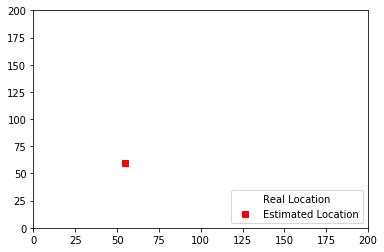

299
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


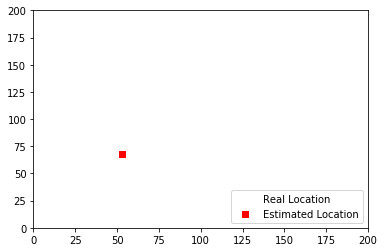

300
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


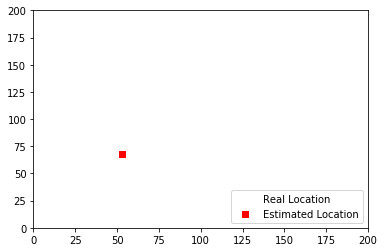

301
infered loc:
[49.40931373 10.27205882]
real loc:
[42.  5.]


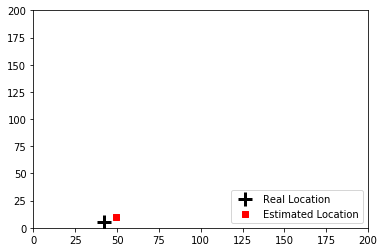

302
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


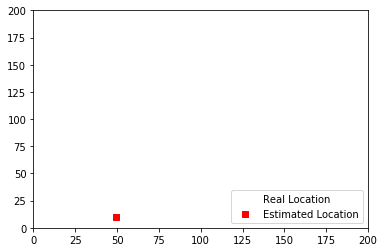

303
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


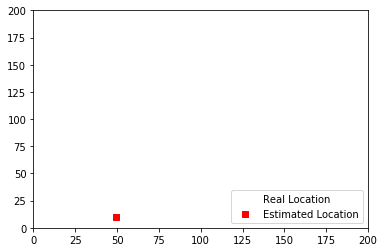

304
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


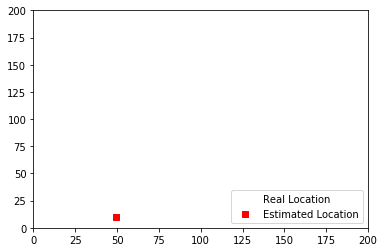

305
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


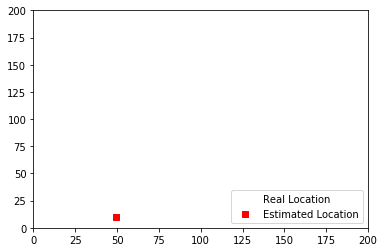

306
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


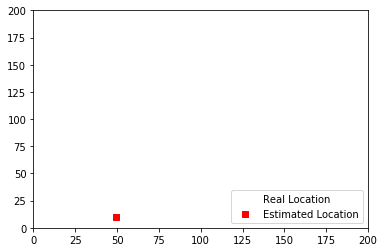

307
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


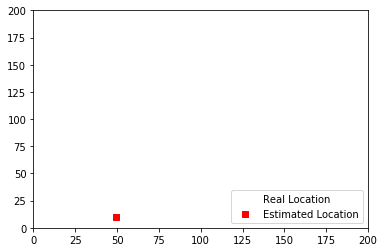

308
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


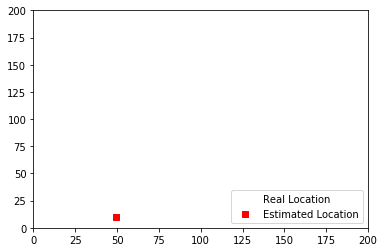

309
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


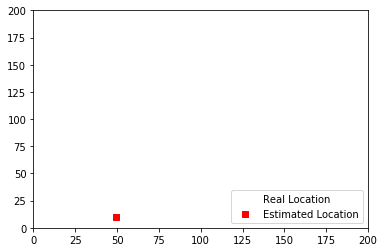

310
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


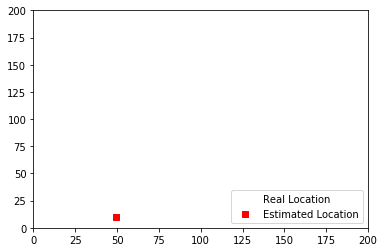

311
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


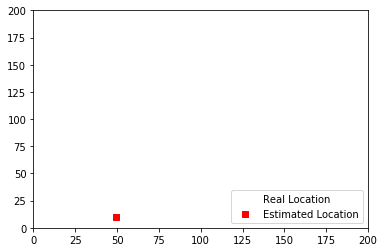

312
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


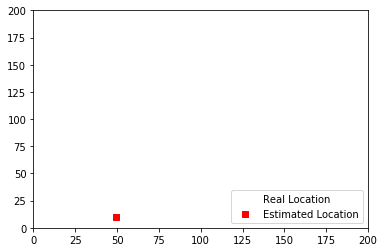

313
infered loc:
[49.40931373 10.27205882]
real loc:
[nan nan]


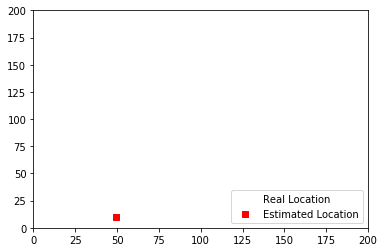

314
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


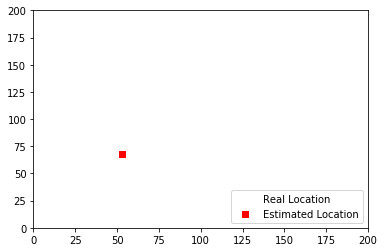

315
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


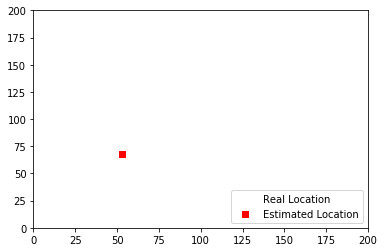

316
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


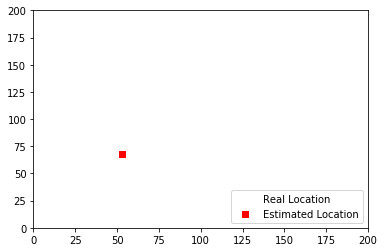

317
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


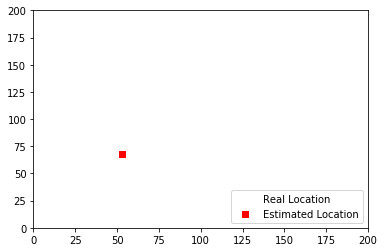

318
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


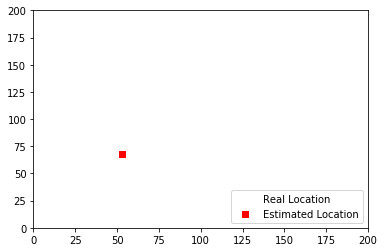

319
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


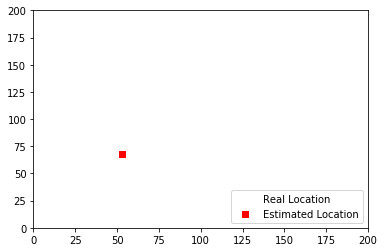

320
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


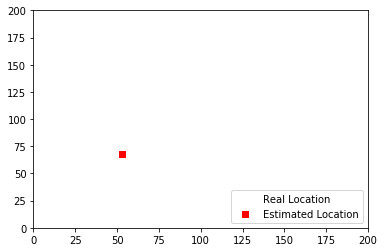

321
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


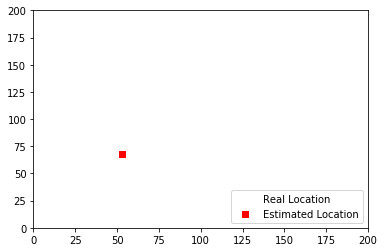

322
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


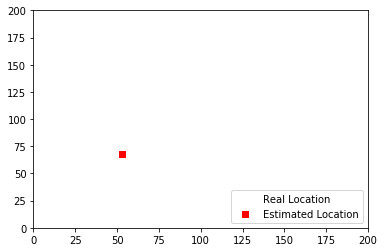

323
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


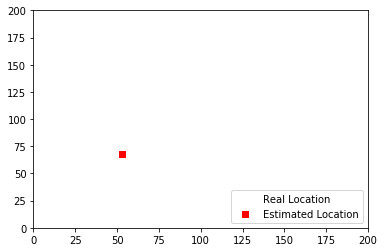

324
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


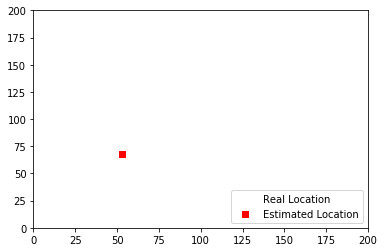

325
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


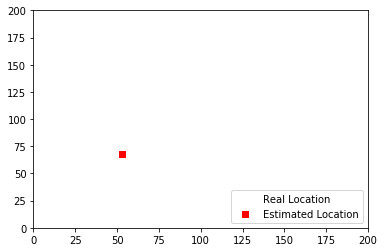

326
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


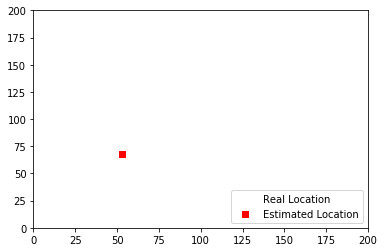

327
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


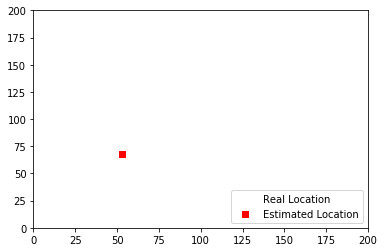

328
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


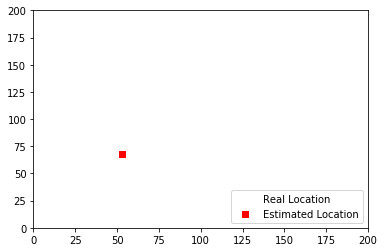

329
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


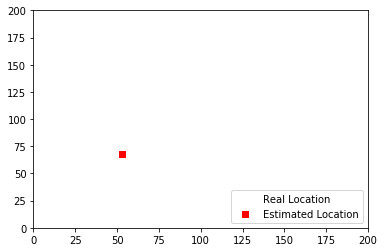

330
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


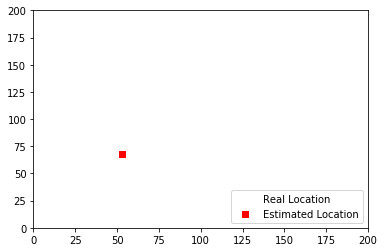

331
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


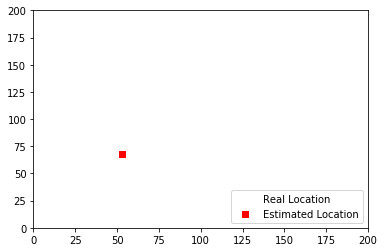

332
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


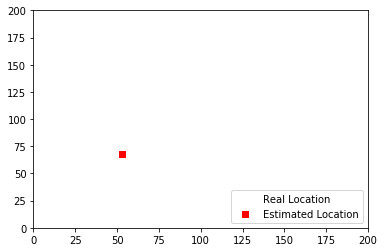

333
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


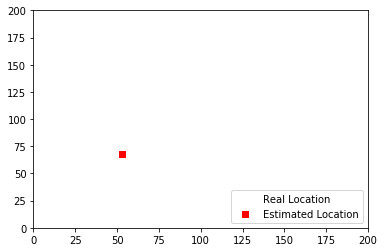

334
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


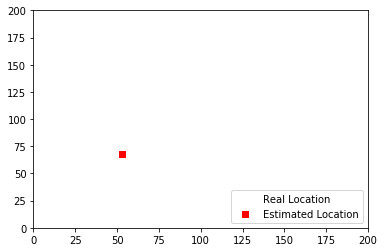

335
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


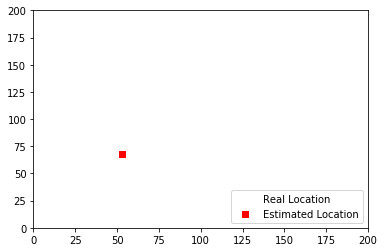

336
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


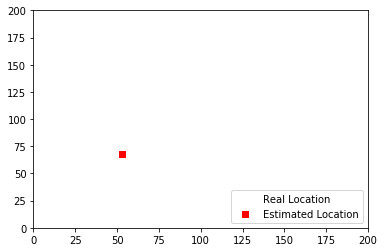

337
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


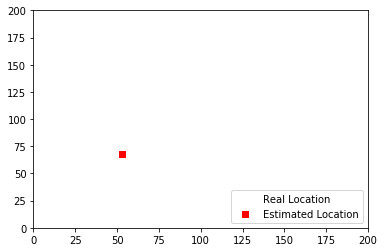

338
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


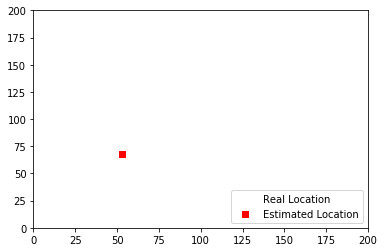

339
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


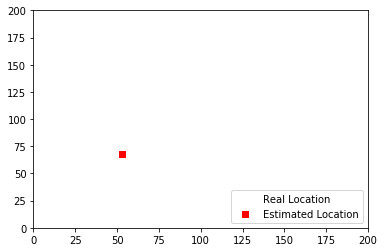

340
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


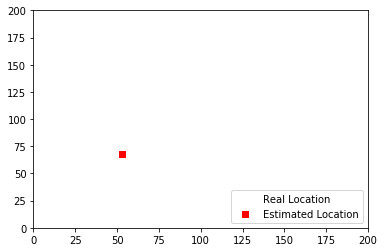

341
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


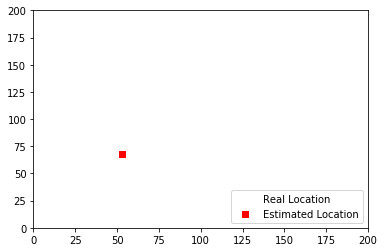

342
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


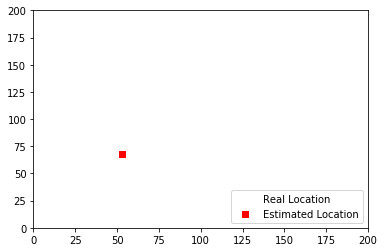

343
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


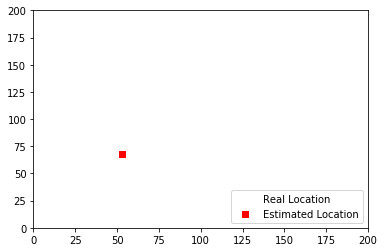

344
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


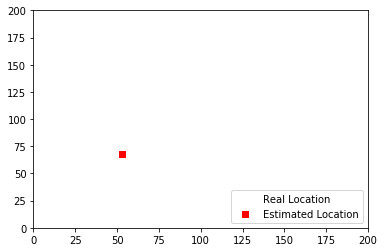

345
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


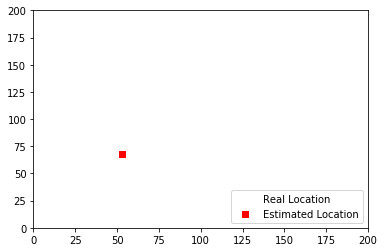

346
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


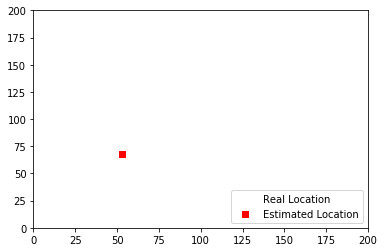

347
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


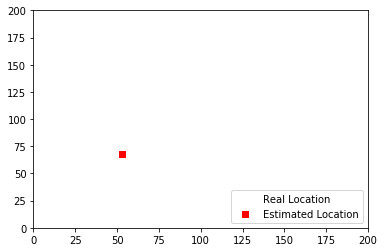

348
infered loc:
[53.26978417 68.04316547]
real loc:
[61.33333 68.     ]


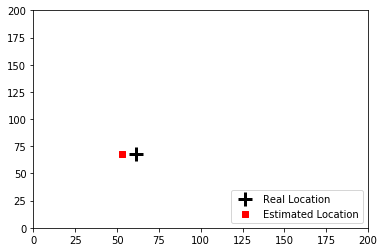

349
infered loc:
[53.26978417 68.04316547]
real loc:
[64. 74.]


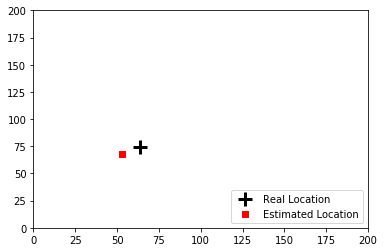

350
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


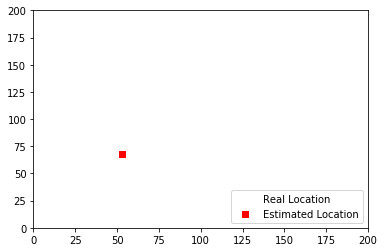

351
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


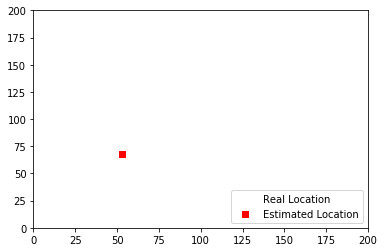

352
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


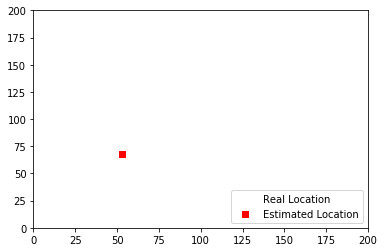

353
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


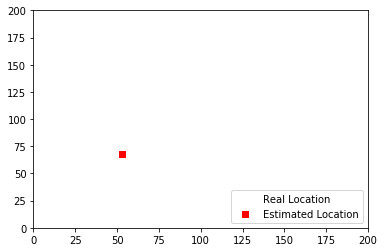

354
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


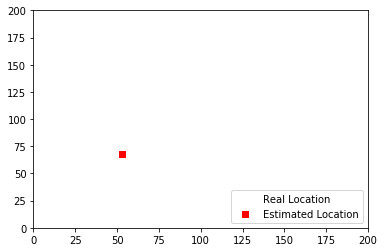

355
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


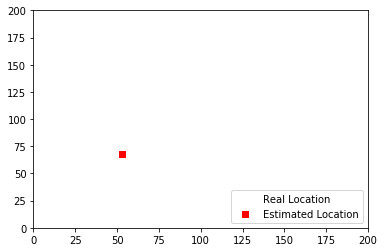

356
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


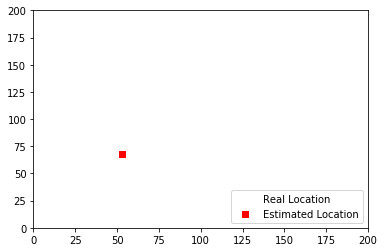

357
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


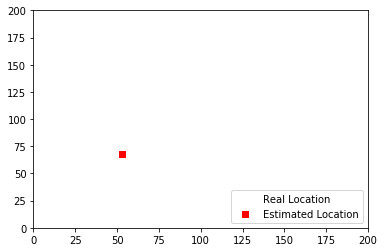

358
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


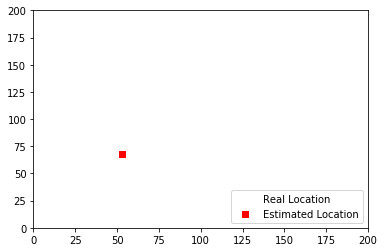

359
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


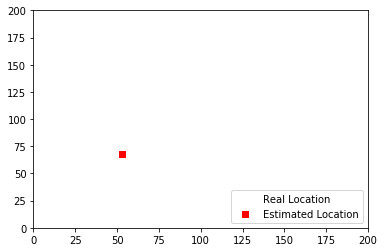

360
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


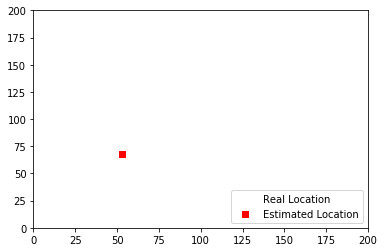

361
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


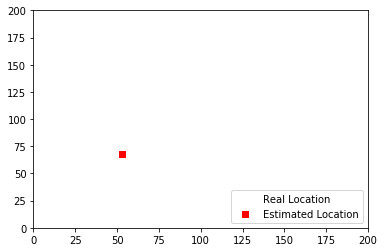

362
infered loc:
[53.26978417 68.04316547]
real loc:
[nan nan]


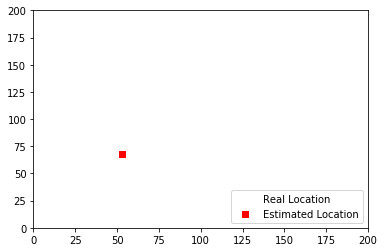

363
infered loc:
[54.921875 60.0625  ]
real loc:
[60. 49.]


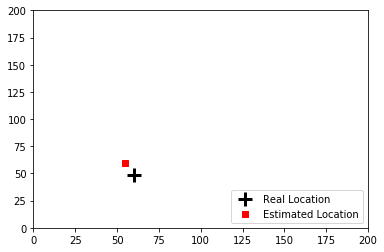

364
infered loc:
[51.71428571 60.23809524]
real loc:
[52.5     57.66667]


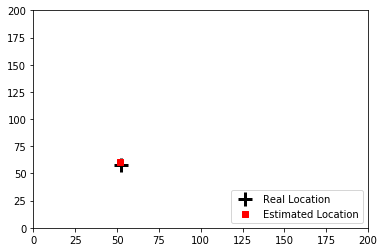

365
infered loc:
[51.71428571 60.23809524]
real loc:
[52.5     57.66667]


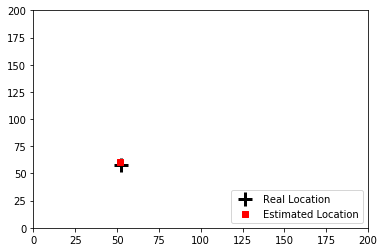

366
infered loc:
[51.71428571 60.23809524]
real loc:
[52.5     57.66667]


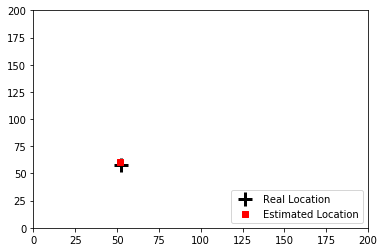

367
infered loc:
[51.71428571 60.23809524]
real loc:
[45.      66.33333]


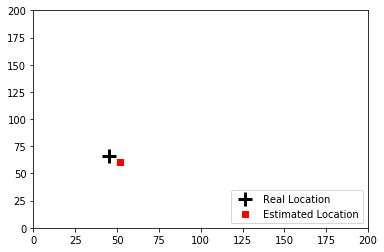

368
infered loc:
[51.71428571 60.23809524]
real loc:
[40.      72.11111]


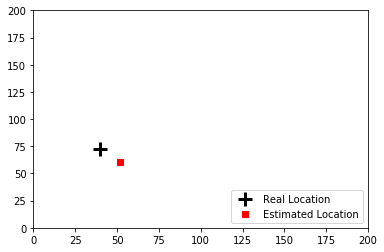

373
infered loc:
[51.71428571 60.23809524]
real loc:
[39.13636 73.10909]


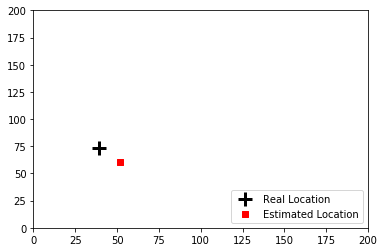

374
infered loc:
[51.71428571 60.23809524]
real loc:
[39.54545 72.63636]


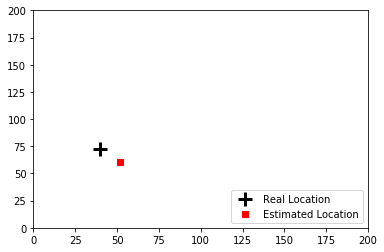

375
infered loc:
[51.71428571 60.23809524]
real loc:
[39.95455 72.16364]


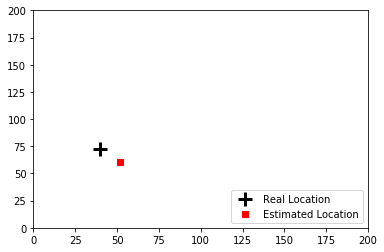

376
infered loc:
[51.71428571 60.23809524]
real loc:
[41.18182 70.74545]


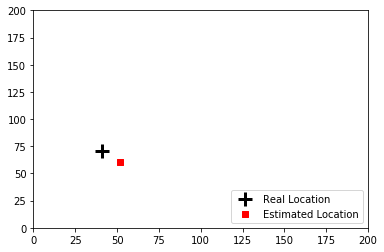

377
infered loc:
[49.5 65. ]
real loc:
[42.40909 69.32727]


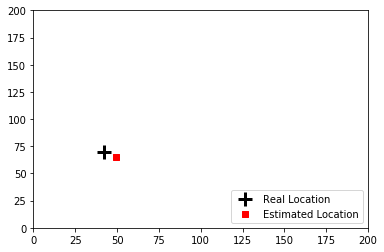

378
infered loc:
[42.         62.02727273]
real loc:
[43.63636 67.90909]


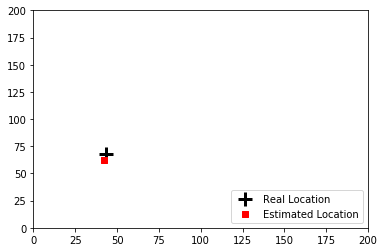

379
infered loc:
[42.         62.02727273]
real loc:
[44.86364 66.49091]


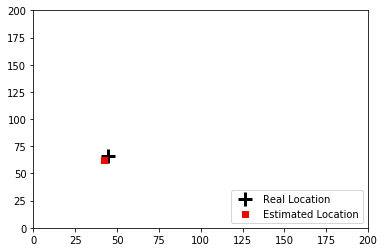

380
infered loc:
[42.         62.02727273]
real loc:
[45.27273 66.01818]


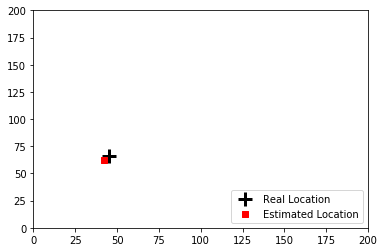

381
infered loc:
[49.5 65. ]
real loc:
[45.27273 66.01818]


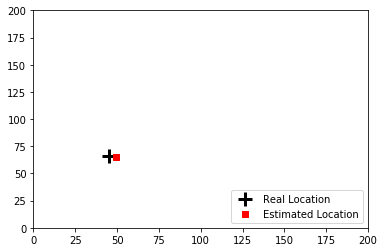

382
infered loc:
[49.5 65. ]
real loc:
[45.68182 65.54545]


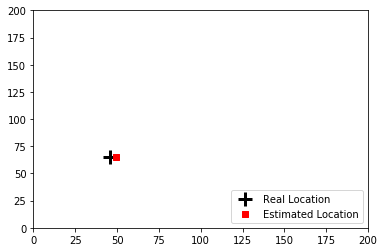

383
infered loc:
[49.5 65. ]
real loc:
[45.68182 65.54545]


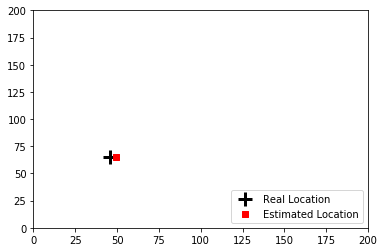

384
infered loc:
[49.5 65. ]
real loc:
[46.09091 65.07273]


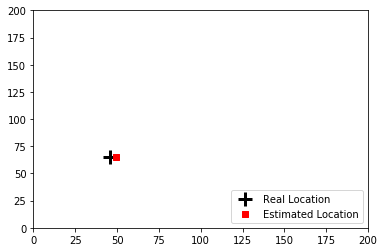

385
infered loc:
[49.5 65. ]
real loc:
[46.09091 65.07273]


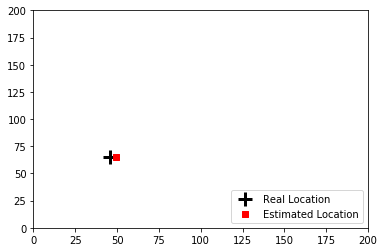

386
infered loc:
[49.5 65. ]
real loc:
[46.5 64.6]


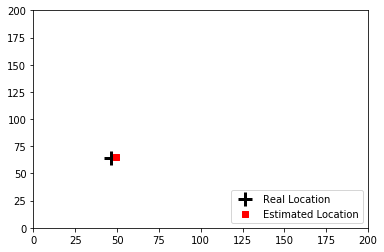

387
infered loc:
[49.5 65. ]
real loc:
[46.5 64.6]


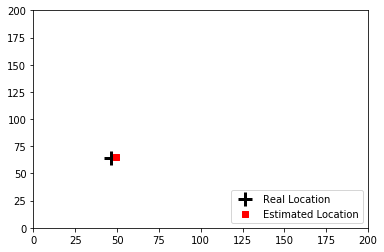

388
infered loc:
[49.5 65. ]
real loc:
[46.90909 64.12727]


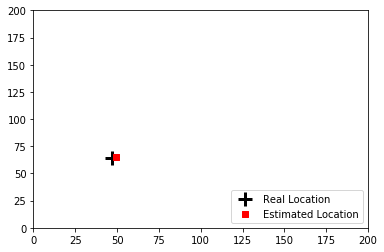

389
infered loc:
[49.5 65. ]
real loc:
[46.90909 64.12727]


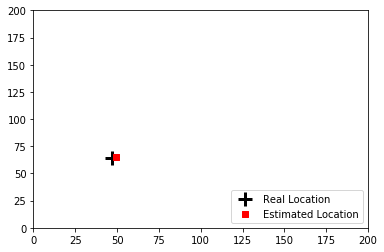

390
infered loc:
[49.5 65. ]
real loc:
[47.31818 63.65455]


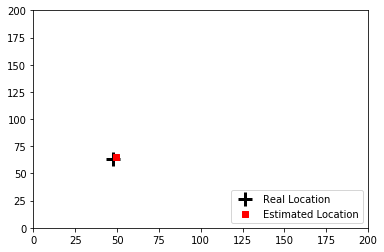

391
infered loc:
[49.5 65. ]
real loc:
[47.31818 63.65455]


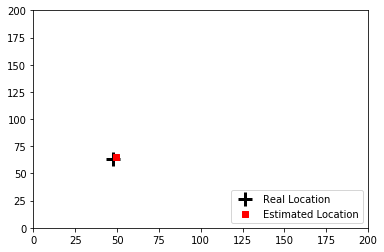

392
infered loc:
[49.5 65. ]
real loc:
[48.54545 62.23636]


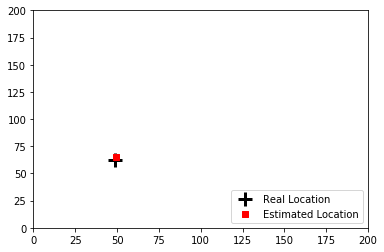

393
infered loc:
[49.5 65. ]
real loc:
[48.54545 62.23636]


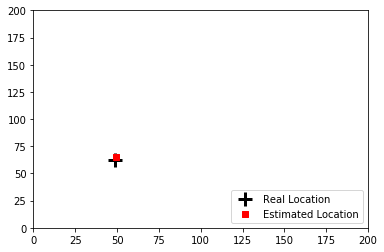

394
infered loc:
[49.5 65. ]
real loc:
[49.77273 60.81818]


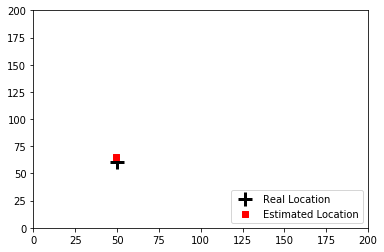

395
infered loc:
[51.71428571 60.23809524]
real loc:
[49.77273 60.81818]


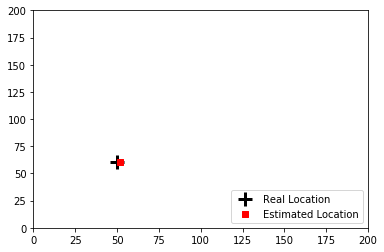

396
infered loc:
[51.71428571 60.23809524]
real loc:
[49.77273 60.81818]


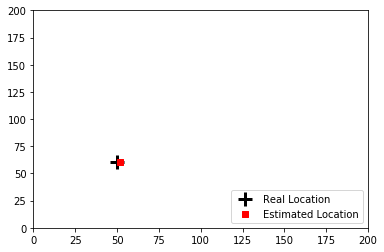

397
infered loc:
[51.71428571 60.23809524]
real loc:
[50.18182 60.34545]


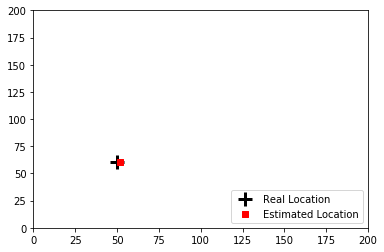

398
infered loc:
[51.71428571 60.23809524]
real loc:
[50.18182 60.34545]


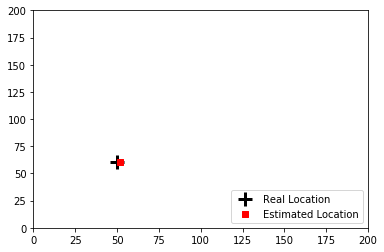

399
infered loc:
[51.71428571 60.23809524]
real loc:
[50.18182 60.34545]


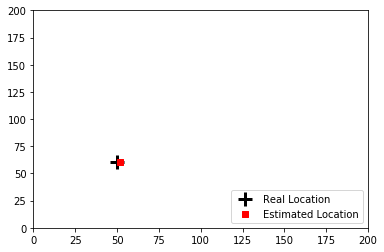

400
infered loc:
[51.71428571 60.23809524]
real loc:
[50.59091 59.87273]


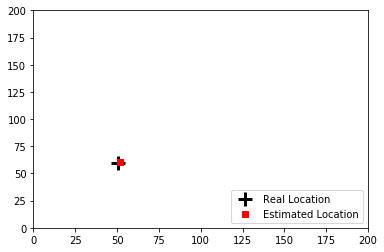

401
infered loc:
[51.71428571 60.23809524]
real loc:
[50.59091 59.87273]


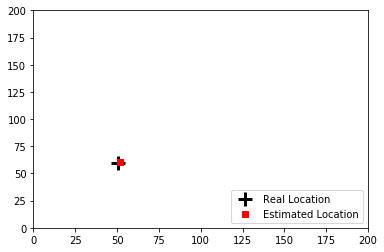

402
infered loc:
[51.71428571 60.23809524]
real loc:
[50.59091 59.87273]


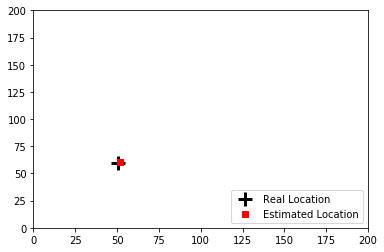

403
infered loc:
[51.71428571 60.23809524]
real loc:
[51.  59.4]


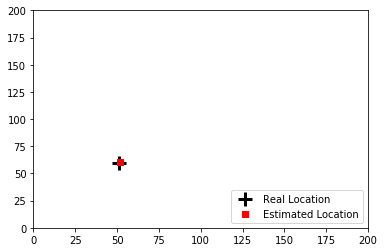

404
infered loc:
[51.71428571 60.23809524]
real loc:
[51.  59.4]


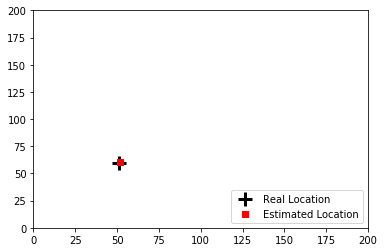

405
infered loc:
[51.71428571 60.23809524]
real loc:
[51.  59.4]


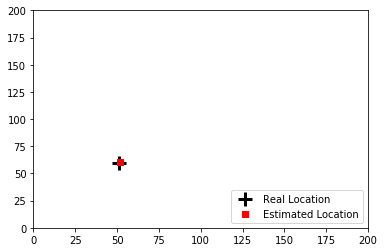

406
infered loc:
[51.71428571 60.23809524]
real loc:
[51.40909 58.92727]


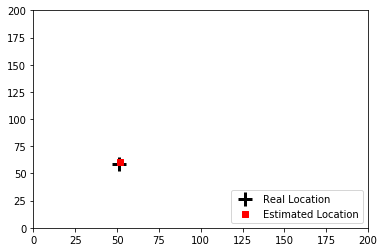

407
infered loc:
[51.71428571 60.23809524]
real loc:
[51.40909 58.92727]


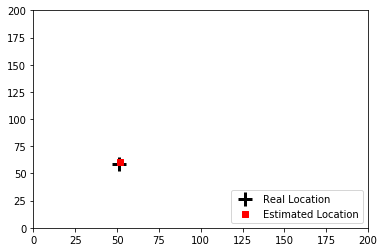

408
infered loc:
[51.71428571 60.23809524]
real loc:
[51.40909 58.92727]


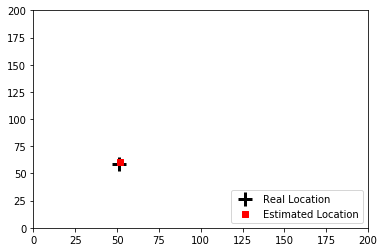

409
infered loc:
[51.71428571 60.23809524]
real loc:
[51.81818 58.45455]


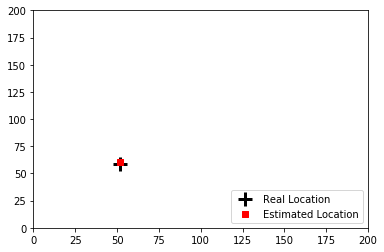

410
infered loc:
[51.71428571 60.23809524]
real loc:
[51.81818 58.45455]


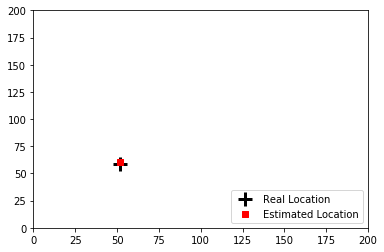

411
infered loc:
[51.71428571 60.23809524]
real loc:
[51.81818 58.45455]


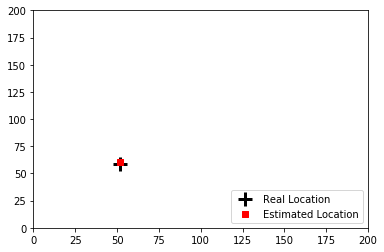

412
infered loc:
[51.71428571 60.23809524]
real loc:
[52.22727 57.98182]


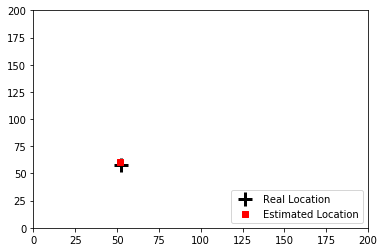

413
infered loc:
[51.71428571 60.23809524]
real loc:
[52.22727 57.98182]


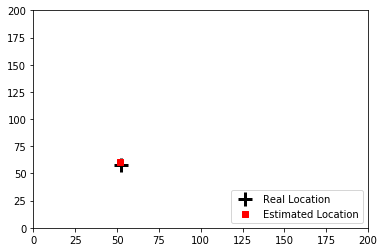

414
infered loc:
[51.71428571 60.23809524]
real loc:
[52.22727 57.98182]


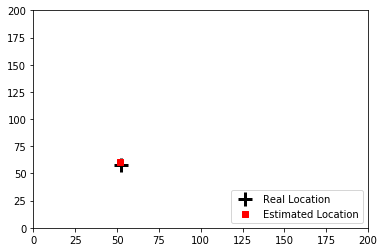

415
infered loc:
[51.71428571 60.23809524]
real loc:
[52.63636 57.50909]


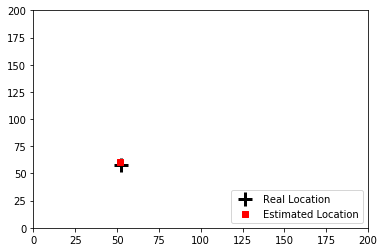

416
infered loc:
[51.71428571 60.23809524]
real loc:
[52.63636 57.50909]


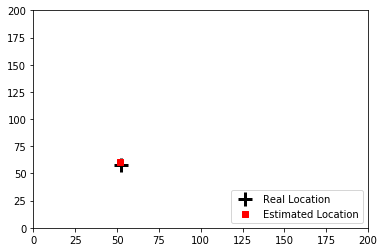

417
infered loc:
[51.71428571 60.23809524]
real loc:
[52.63636 57.50909]


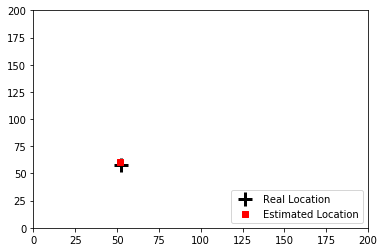

418
infered loc:
[51.71428571 60.23809524]
real loc:
[55.5 54.2]


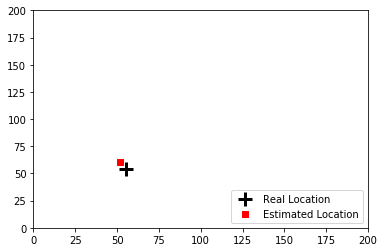

419
infered loc:
[51.71428571 60.23809524]
real loc:
[55.90909 53.72727]


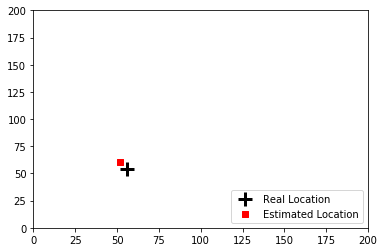

420
infered loc:
[51.71428571 60.23809524]
real loc:
[56.31818 53.25455]


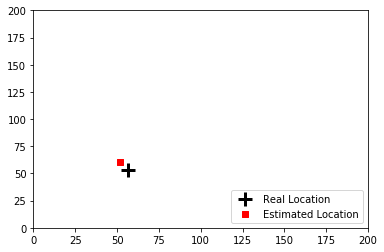

421
infered loc:
[51.71428571 60.23809524]
real loc:
[56.72727 52.78182]


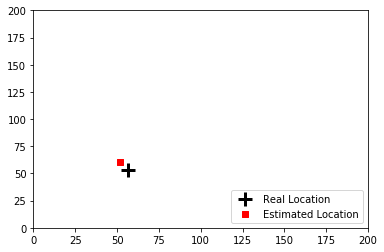

422
infered loc:
[51.71428571 60.23809524]
real loc:
[57.13636 52.30909]


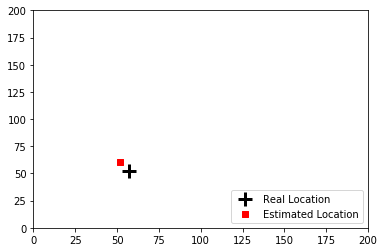

423
infered loc:
[51.71428571 60.23809524]
real loc:
[57.54545 51.83636]


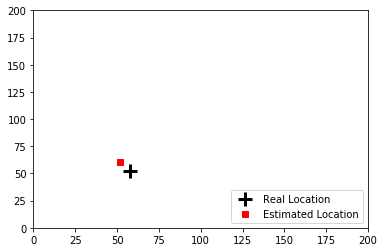

424
infered loc:
[54.921875 60.0625  ]
real loc:
[57.95455 51.36364]


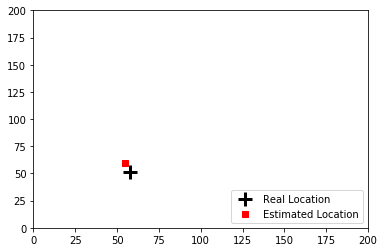

425
infered loc:
[54.921875 60.0625  ]
real loc:
[58.36364 50.89091]


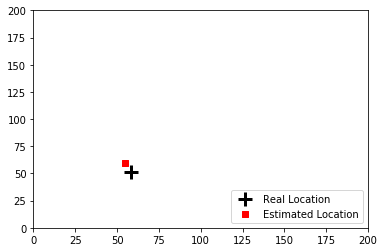

426
infered loc:
[53.26978417 52.04316547]
real loc:
[58.77273 50.41818]


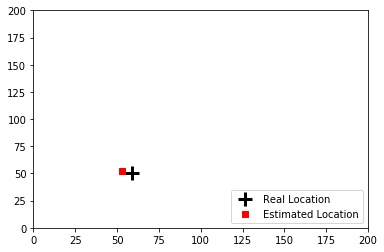

427
infered loc:
[53.26978417 52.04316547]
real loc:
[59.18182 49.94545]


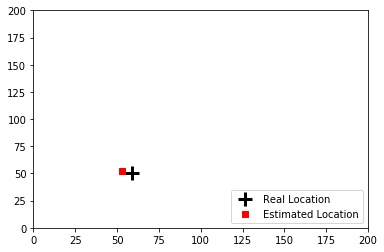

428
infered loc:
[12.         86.02727273]
real loc:
[18.  80.4]


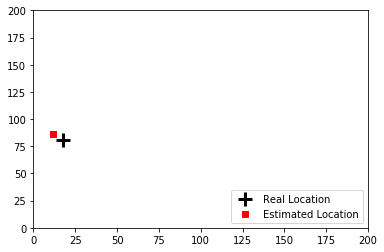

429
infered loc:
[16.56716418 78.56716418]
real loc:
[18.  80.4]


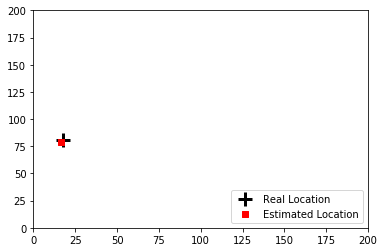

430
infered loc:
[16.56716418 78.56716418]
real loc:
[29.5 71. ]


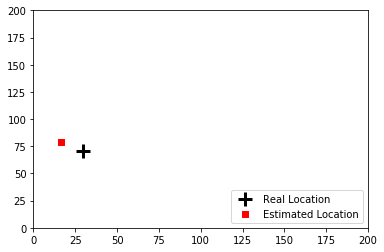

431
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


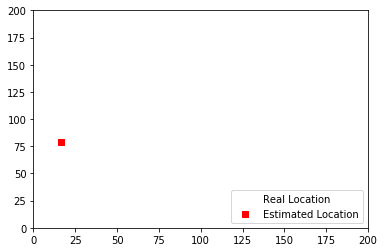

432
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


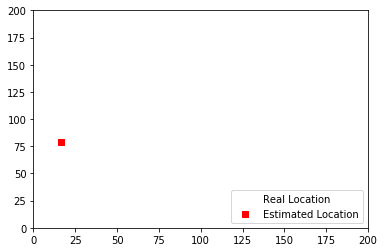

433
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


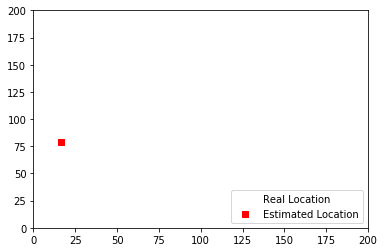

434
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


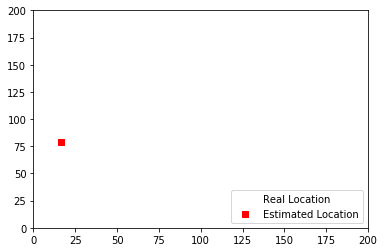

435
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


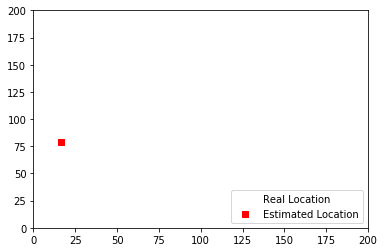

436
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


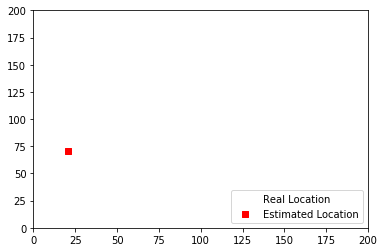

437
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


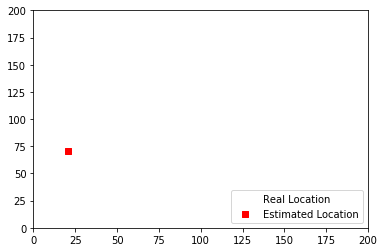

438
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


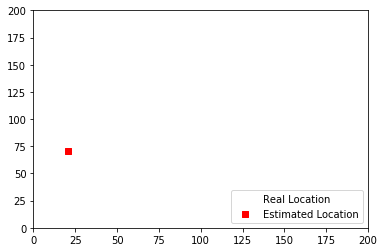

439
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


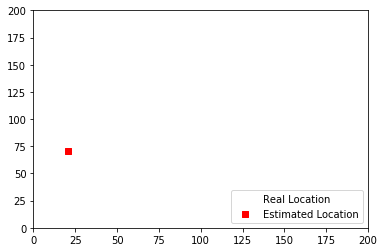

440
infered loc:
[24.         94.71497585]
real loc:
[ 25. 102.]


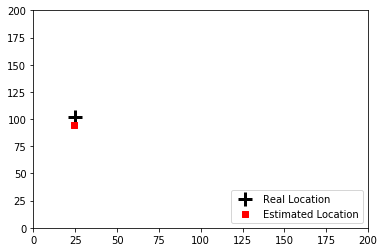

441
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


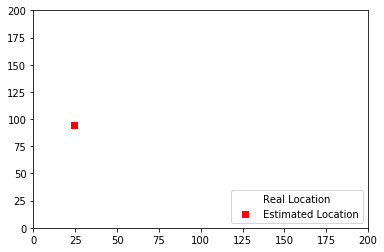

442
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


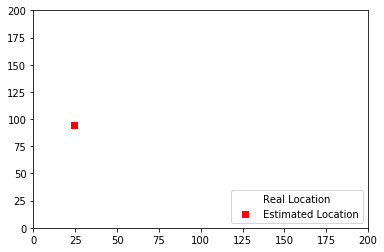

443
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


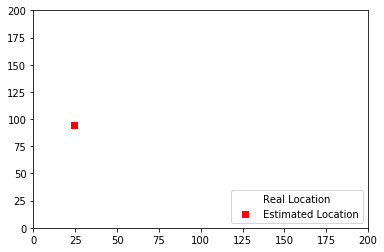

444
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


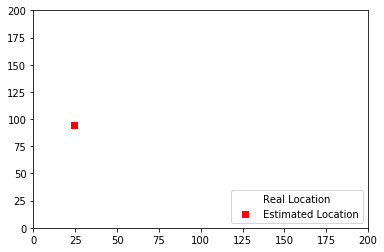

445
infered loc:
[24.         94.71497585]
real loc:
[ 18.5 102. ]


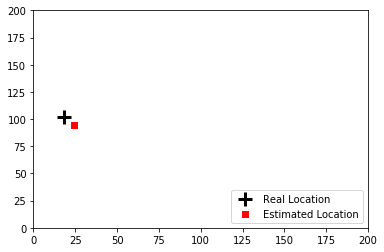

446
infered loc:
[24.         94.71497585]
real loc:
[ 21.75 102.  ]


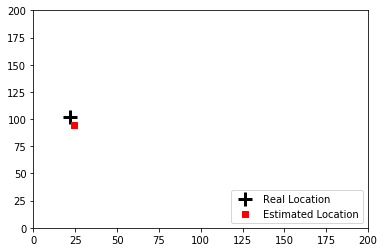

447
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


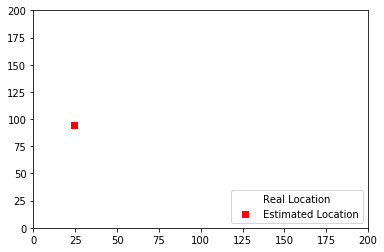

449
infered loc:
[21.         71.02727273]
real loc:
[28.375 78.75 ]


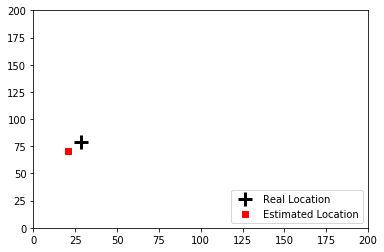

450
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


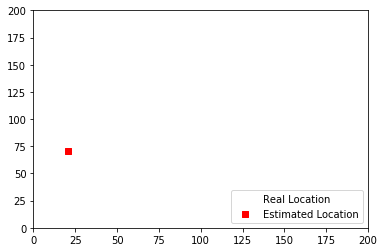

451
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


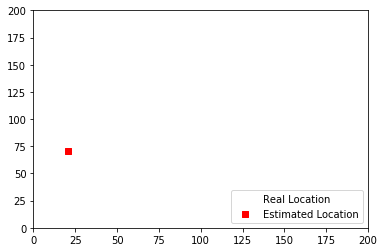

452
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


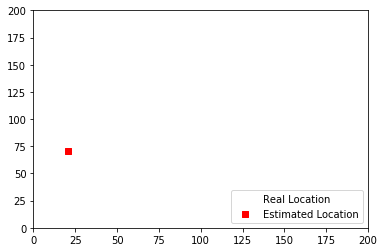

453
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


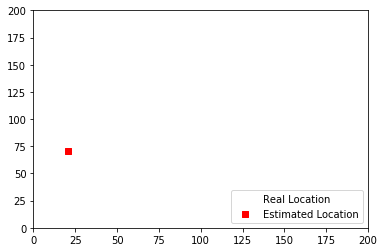

454
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


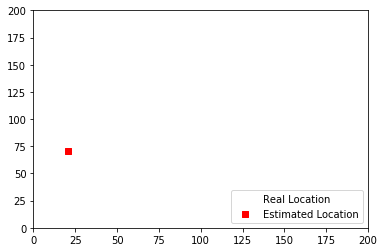

455
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


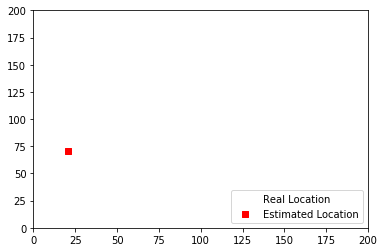

456
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


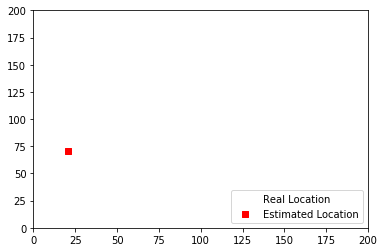

457
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


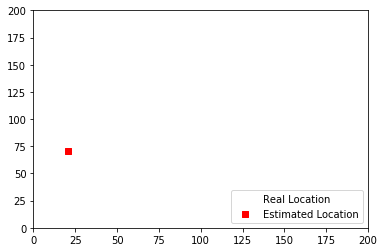

458
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


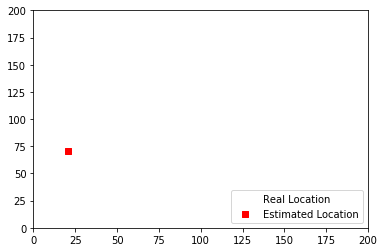

459
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


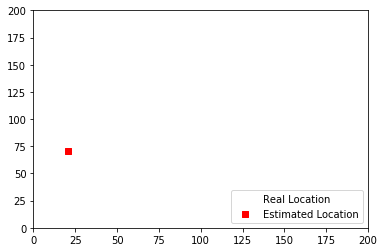

460
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


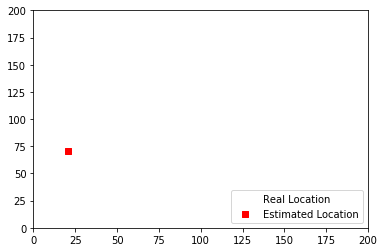

461
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


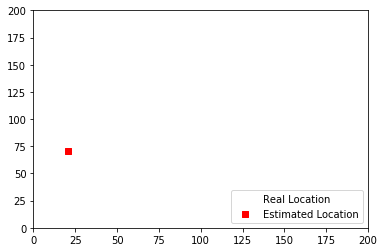

462
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


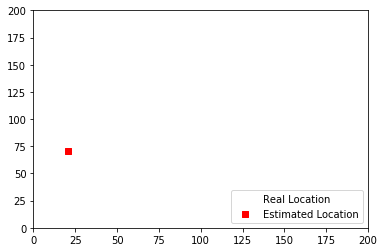

463
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


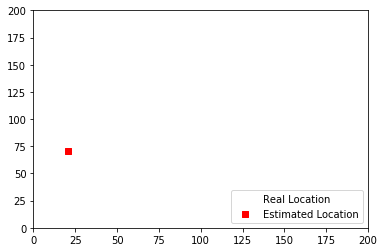

464
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


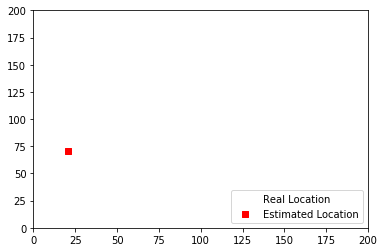

465
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


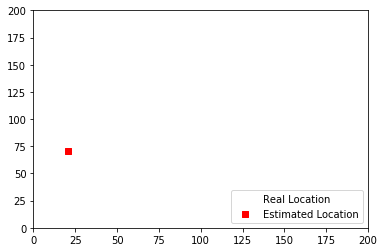

466
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


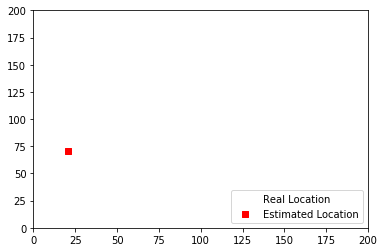

467
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


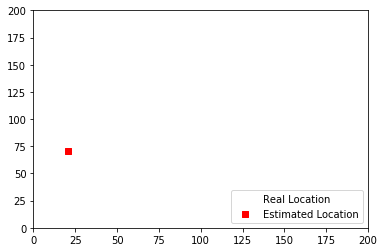

468
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


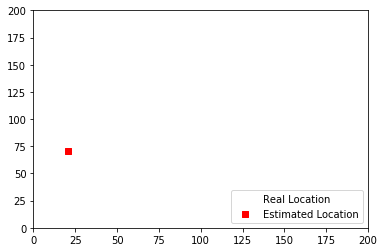

469
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


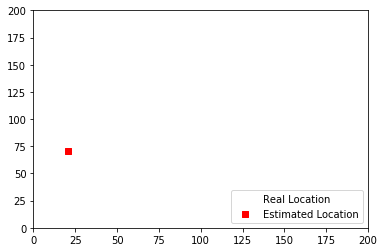

470
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


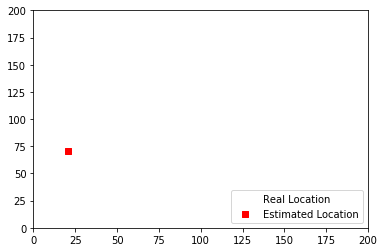

471
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


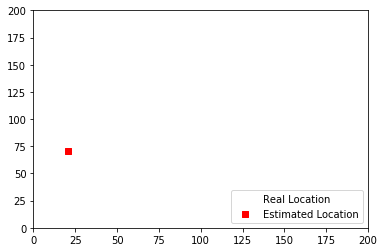

472
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


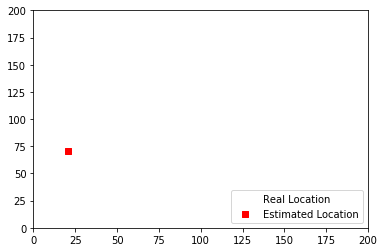

473
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


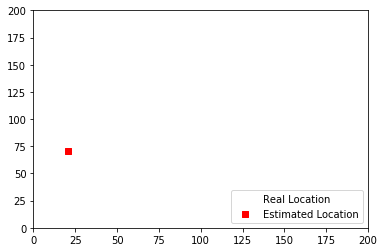

474
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


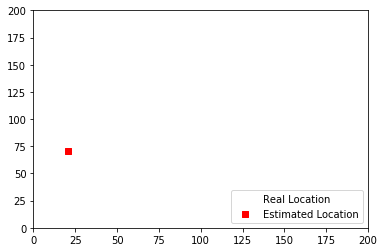

475
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


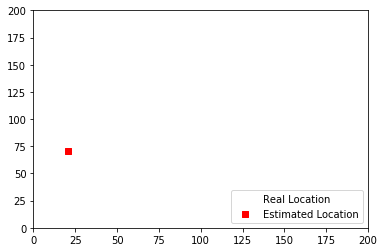

476
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


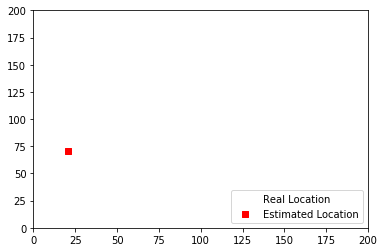

477
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


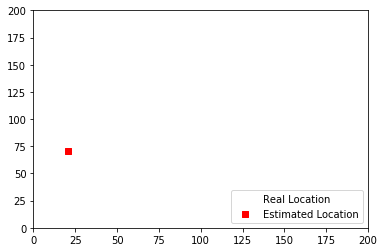

478
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


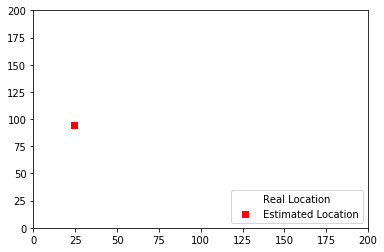

479
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


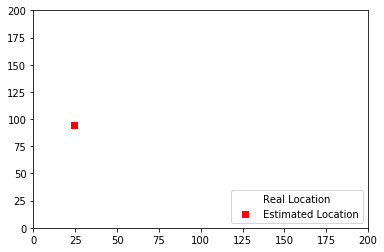

480
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


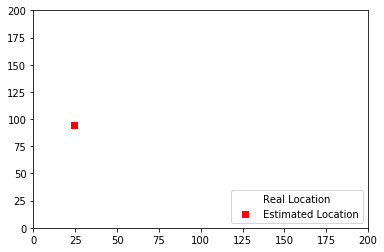

481
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


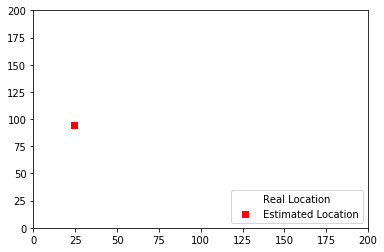

482
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


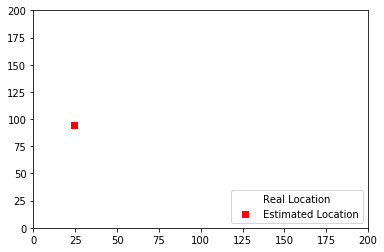

484
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


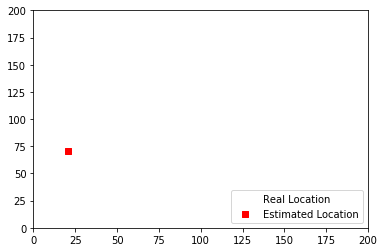

485
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


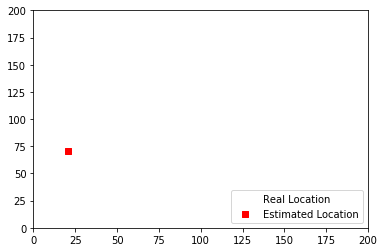

486
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


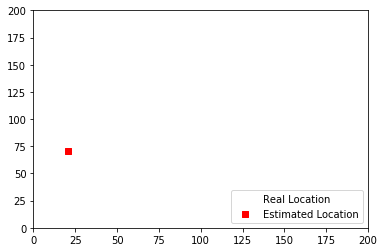

487
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


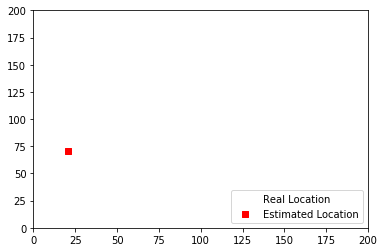

488
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


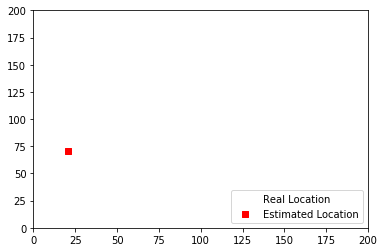

489
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


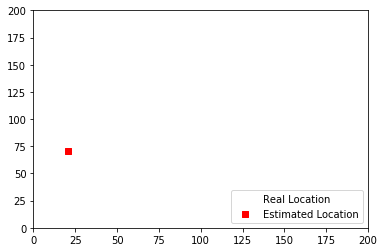

490
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


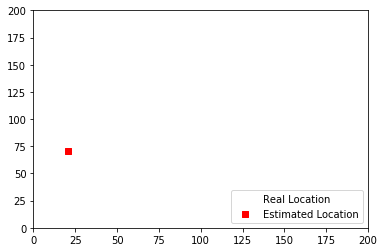

491
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


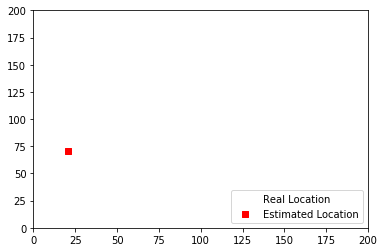

492
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


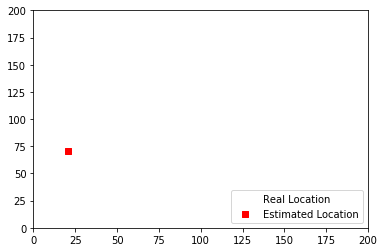

493
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


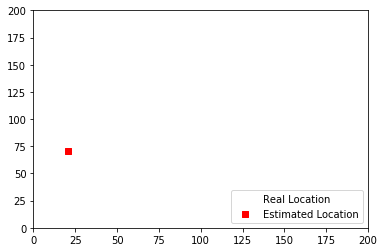

494
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


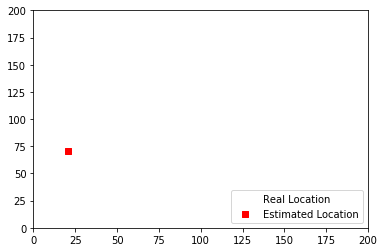

495
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


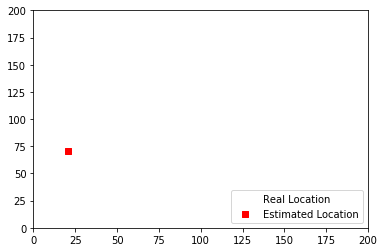

496
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


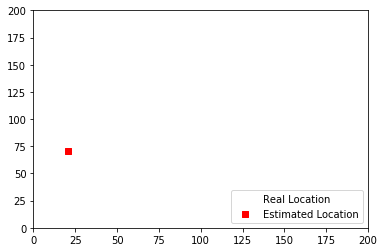

497
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


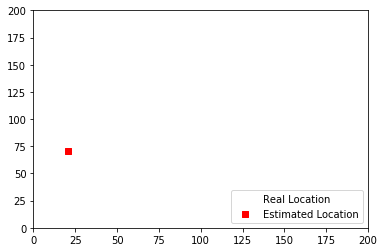

498
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


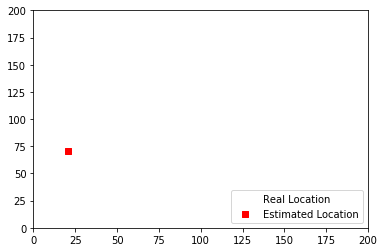

499
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


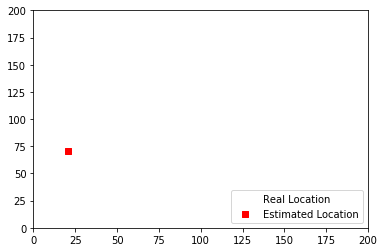

500
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


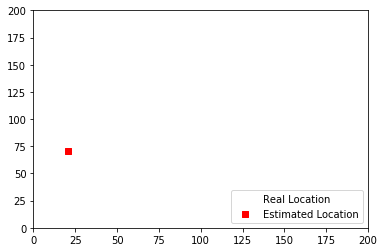

501
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


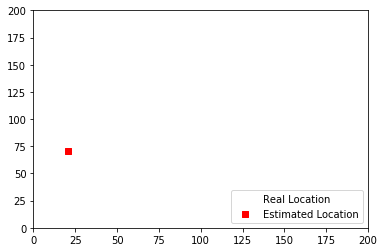

502
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


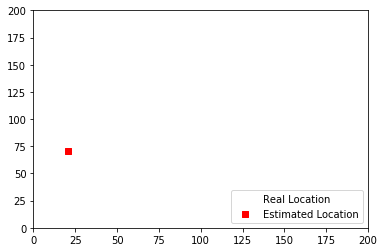

503
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


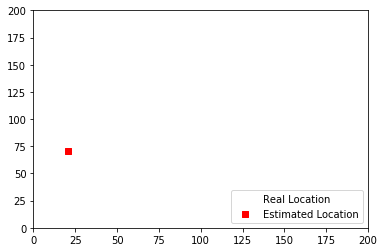

504
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


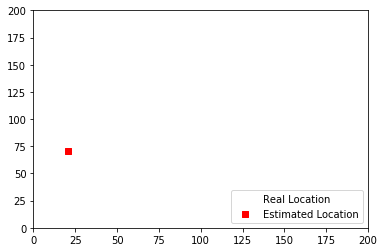

505
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


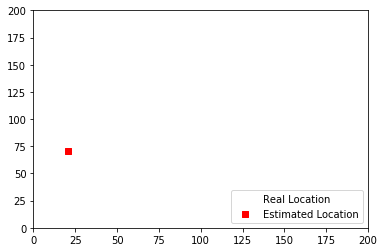

506
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


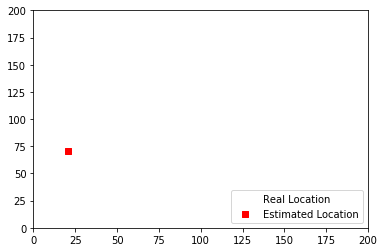

507
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


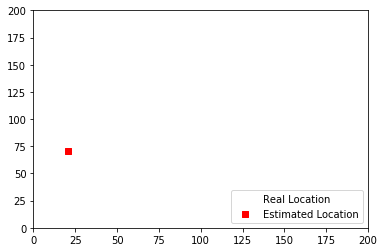

508
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


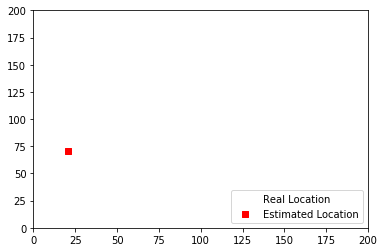

509
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


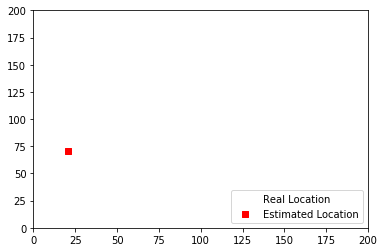

510
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


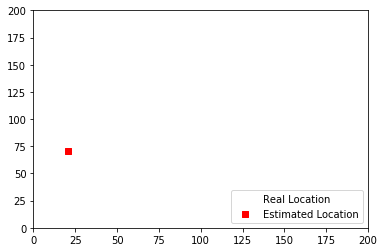

511
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


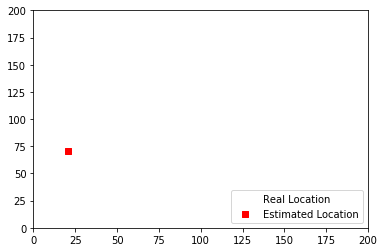

512
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


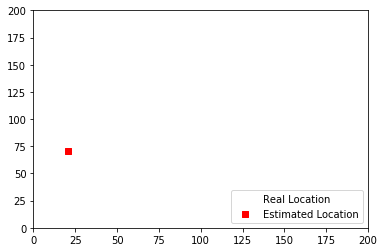

513
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


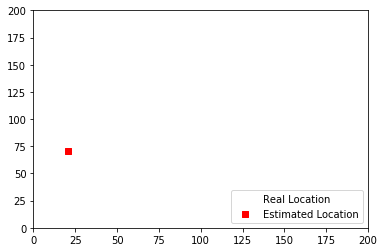

514
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


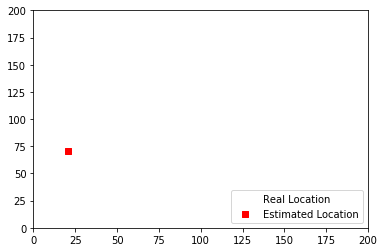

515
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


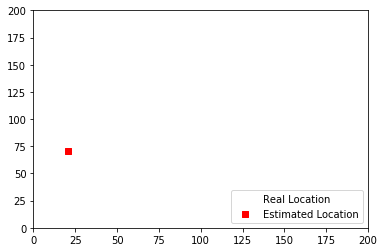

516
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


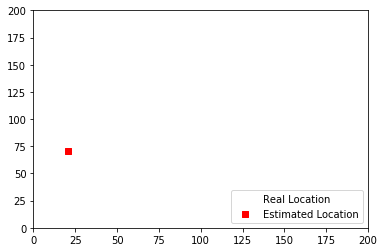

517
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


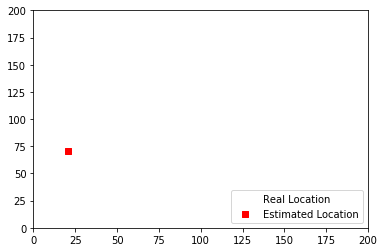

518
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


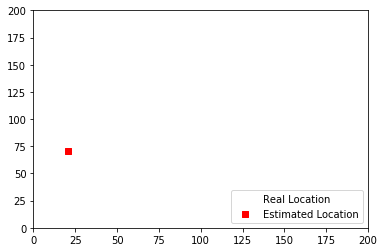

519
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


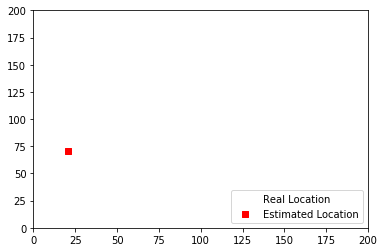

520
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


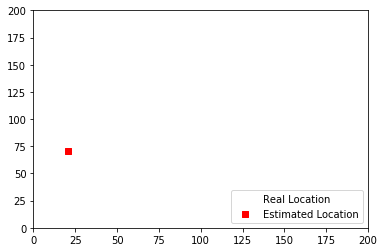

521
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


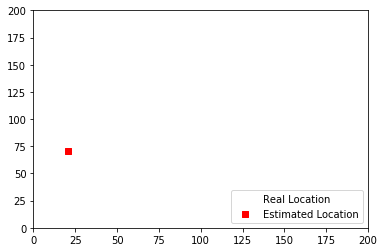

522
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


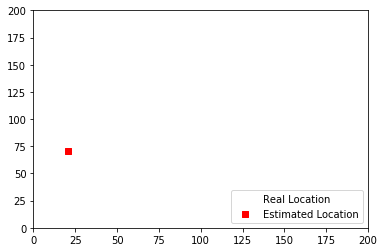

523
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


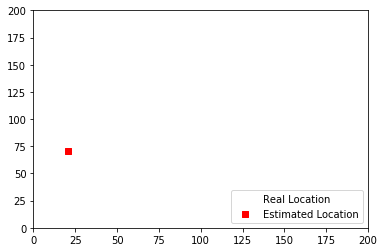

524
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


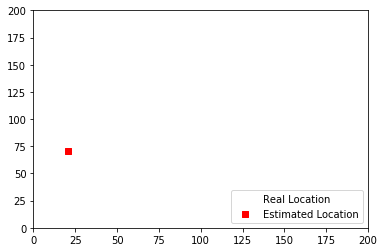

525
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


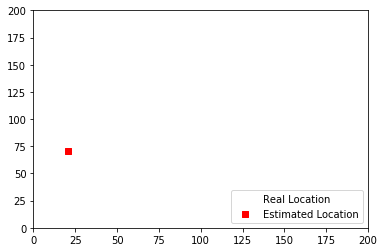

526
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


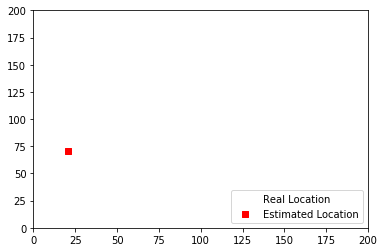

527
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


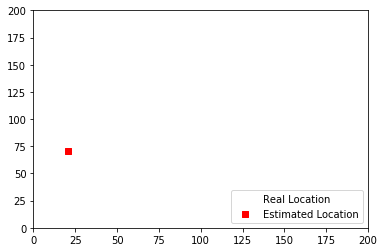

528
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


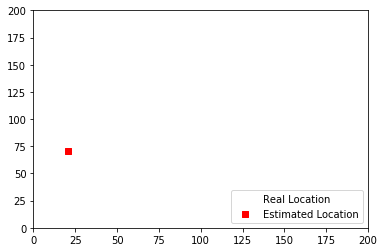

529
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


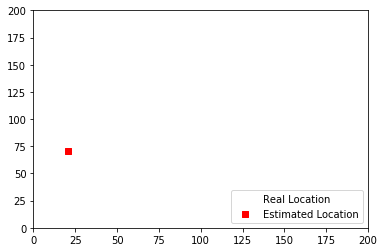

530
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


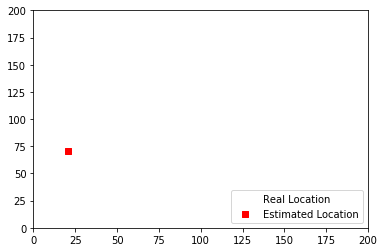

531
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


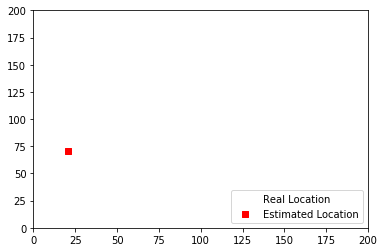

532
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


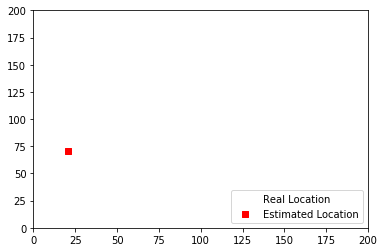

533
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


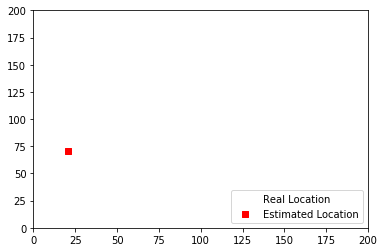

534
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


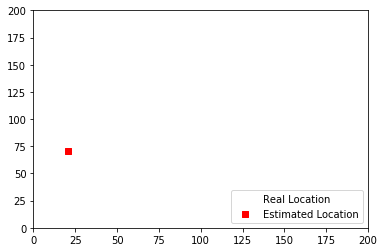

535
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


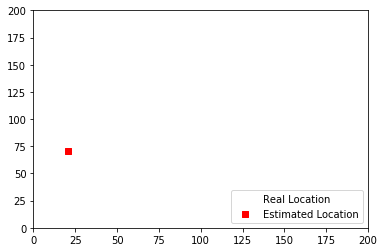

536
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


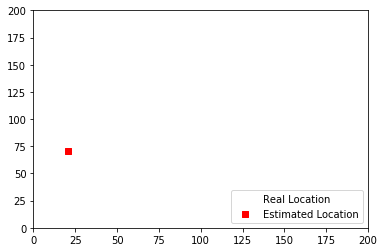

537
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


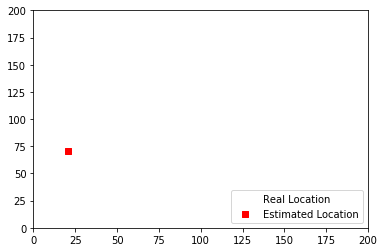

538
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


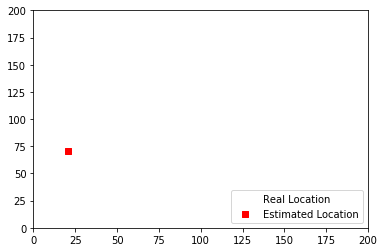

539
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


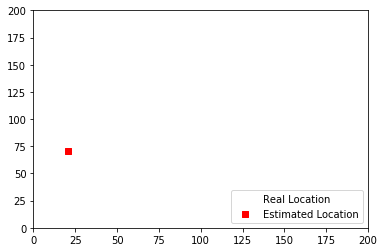

540
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


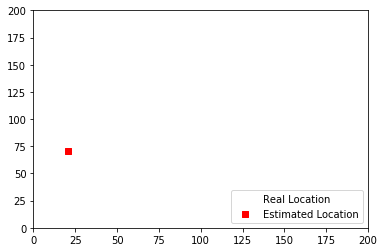

541
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


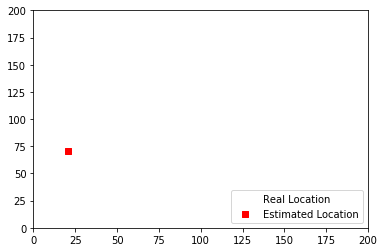

542
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


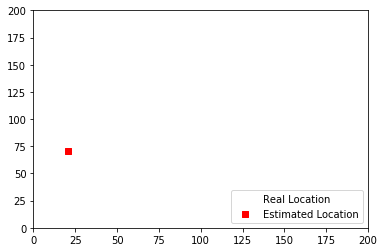

543
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


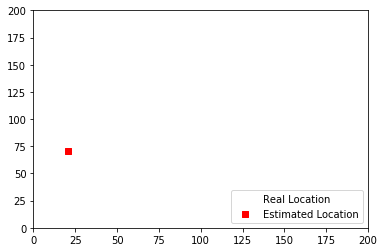

544
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


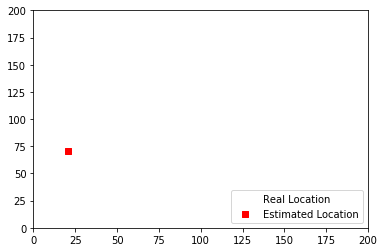

545
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


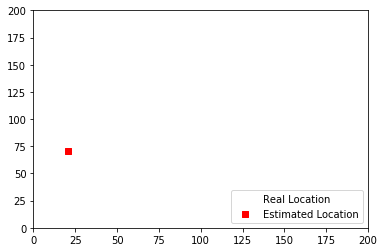

546
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


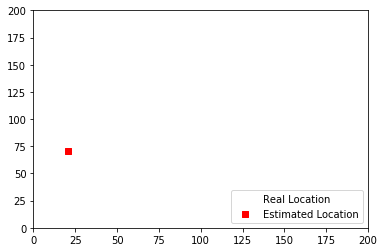

547
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


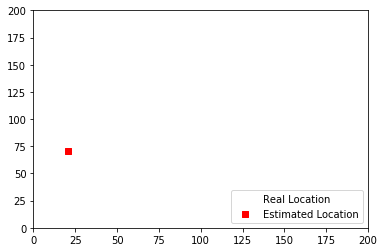

548
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


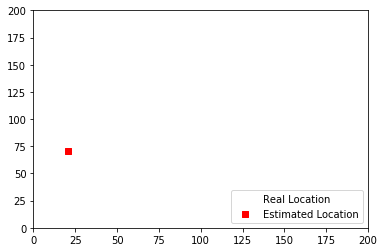

549
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


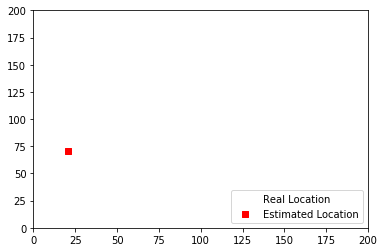

550
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


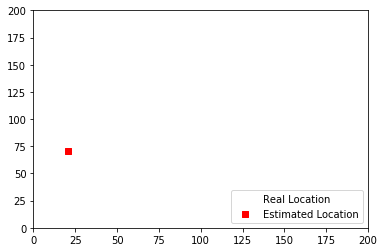

551
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


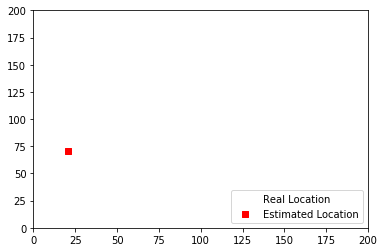

552
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


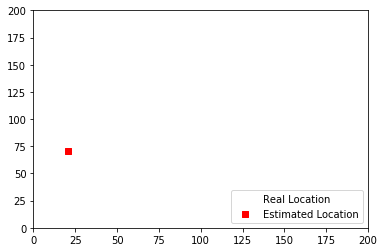

553
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


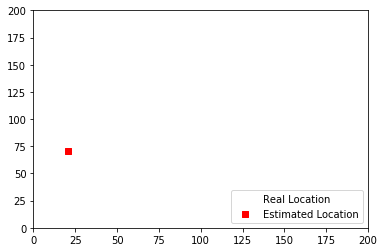

554
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


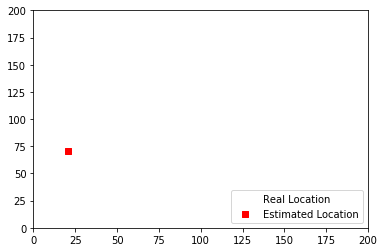

555
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


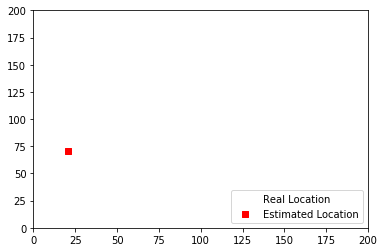

556
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


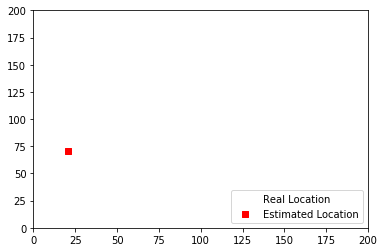

557
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


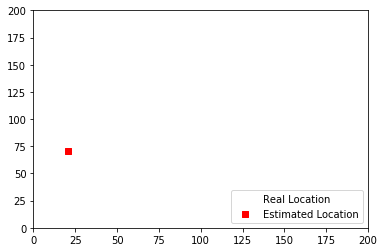

558
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


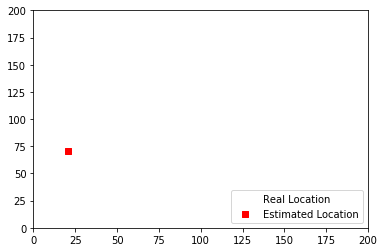

559
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


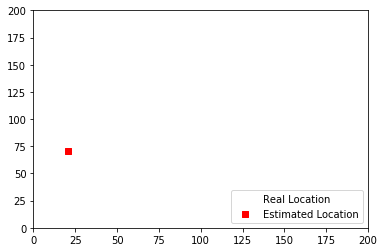

560
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


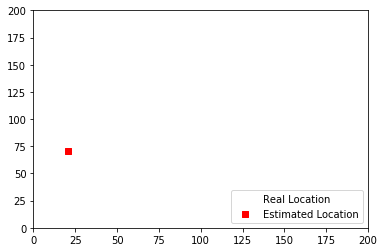

561
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


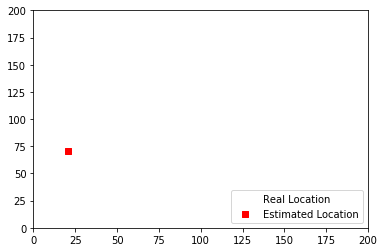

562
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


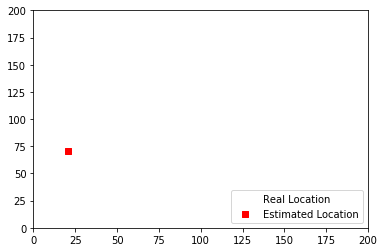

563
infered loc:
[21.         71.02727273]
real loc:
[28.4 74.1]


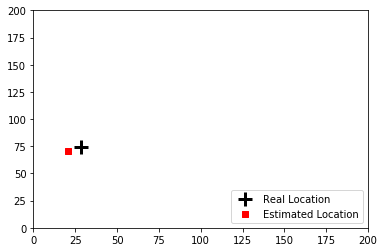

564
infered loc:
[21.         71.02727273]
real loc:
[27.3 77.2]


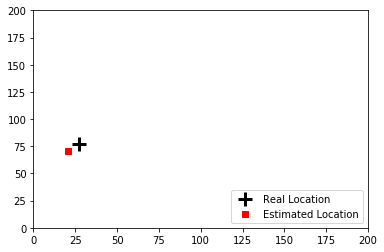

565
infered loc:
[21.         71.02727273]
real loc:
[26.2 80.3]


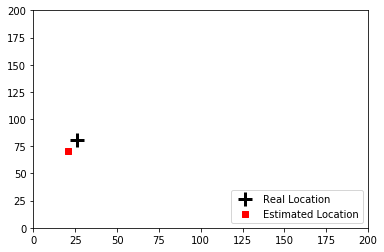

567
infered loc:
[16.56716418 78.56716418]
real loc:
[21.8 92.7]


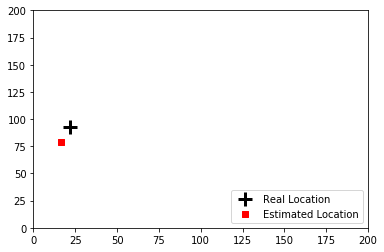

568
infered loc:
[18. 93.]
real loc:
[21.8 92.7]


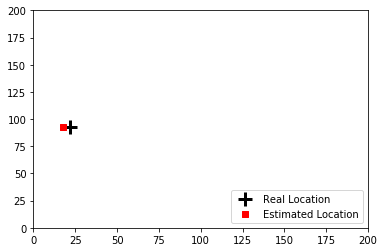

569
infered loc:
[18. 93.]
real loc:
[nan nan]


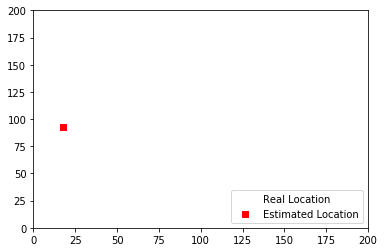

570
infered loc:
[18. 93.]
real loc:
[nan nan]


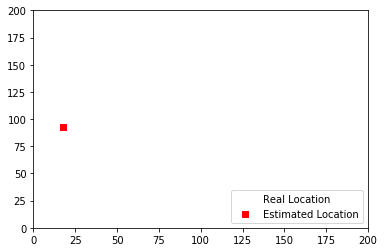

571
infered loc:
[18. 93.]
real loc:
[nan nan]


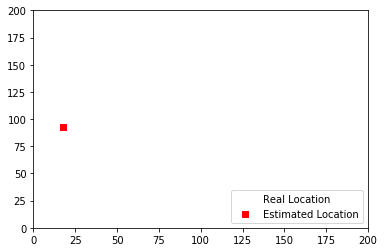

572
infered loc:
[18. 93.]
real loc:
[nan nan]


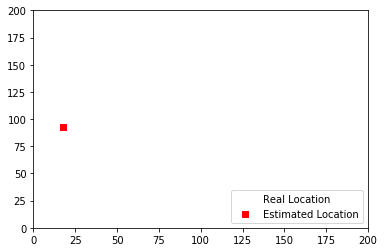

573
infered loc:
[18. 93.]
real loc:
[20.7 95.8]


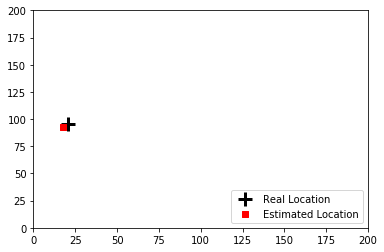

574
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


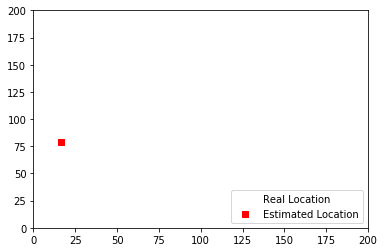

575
infered loc:
[16.56716418 78.56716418]
real loc:
[13.16667 67.66667]


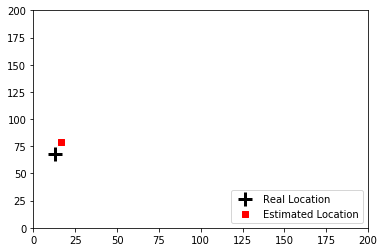

576
infered loc:
[19.48780488 64.04065041]
real loc:
[13.16667 67.66667]


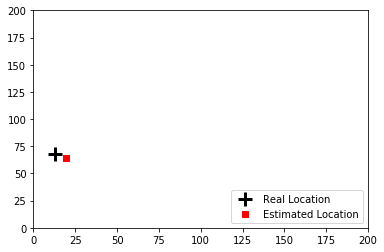

579
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


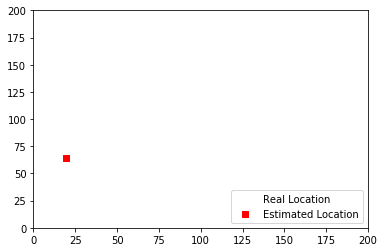

580
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


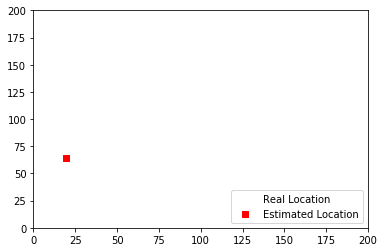

581
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


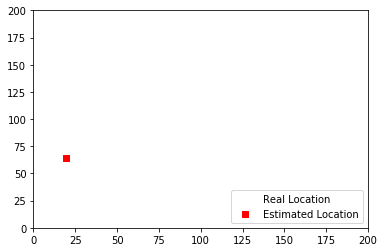

582
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


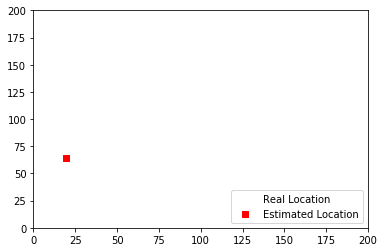

583
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


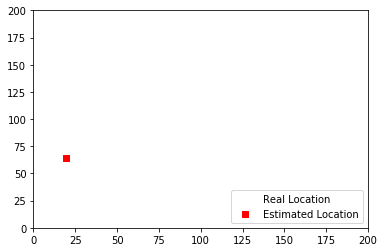

584
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


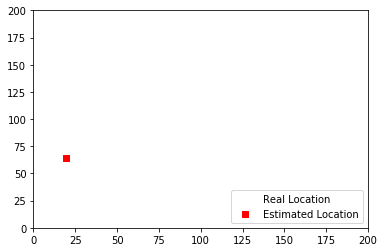

585
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


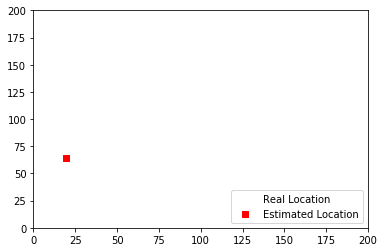

586
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


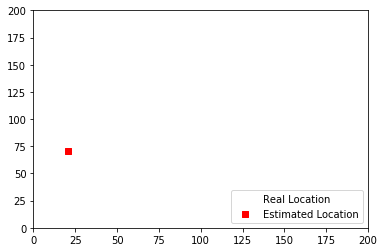

587
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


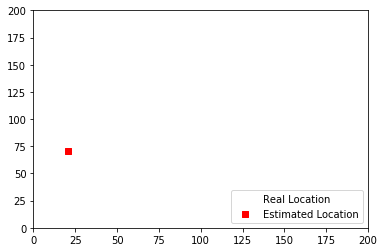

588
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


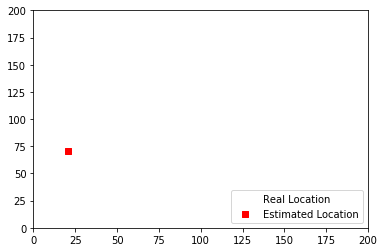

589
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


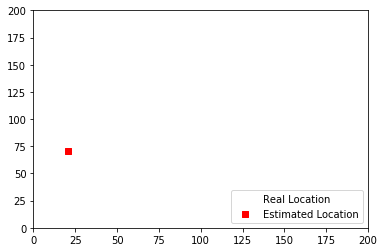

590
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


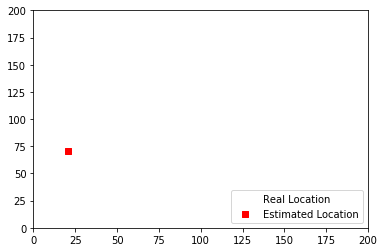

591
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


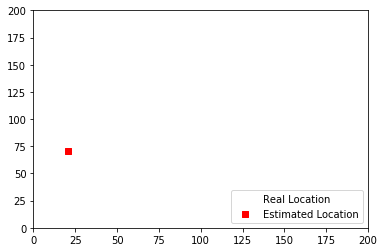

592
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


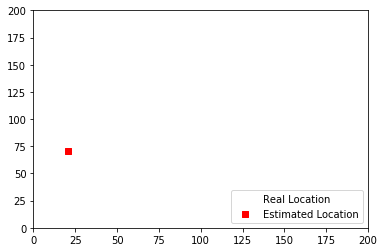

593
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


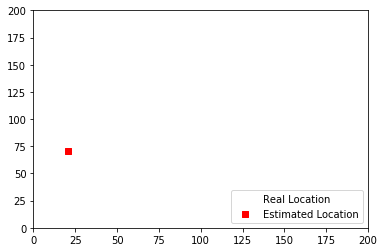

594
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


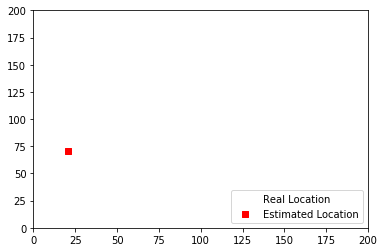

595
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


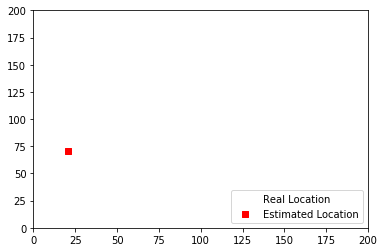

596
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


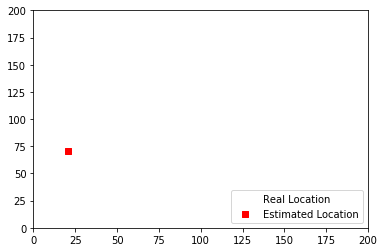

597
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


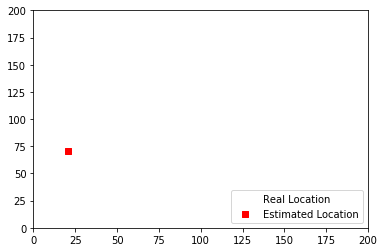

598
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


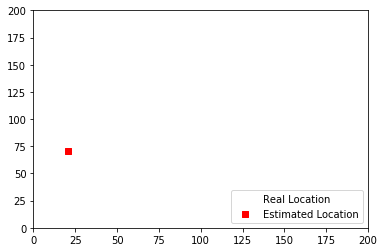

599
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


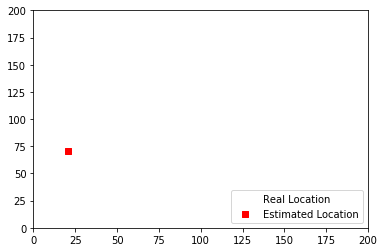

600
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


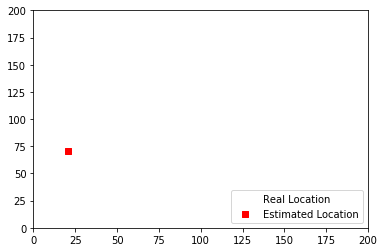

601
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


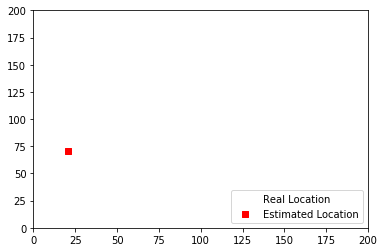

602
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


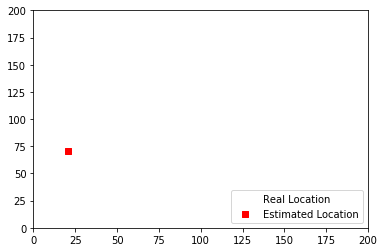

603
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


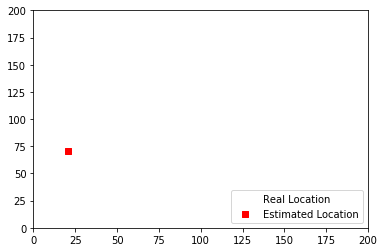

604
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


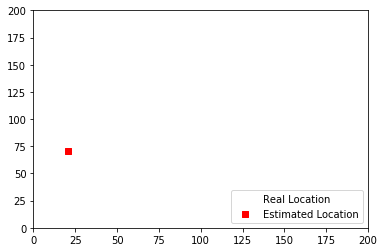

605
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


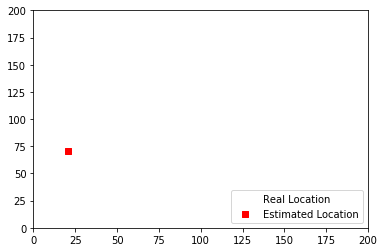

606
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


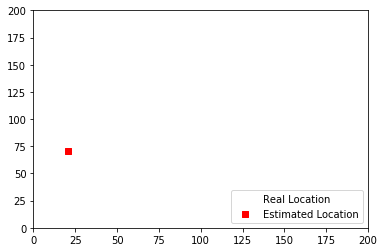

607
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


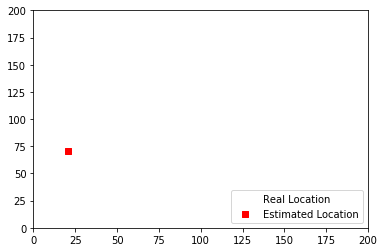

608
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


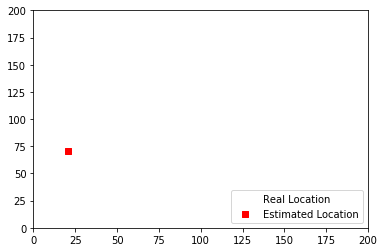

609
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


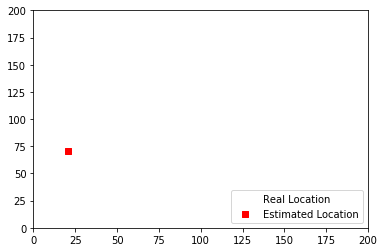

610
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


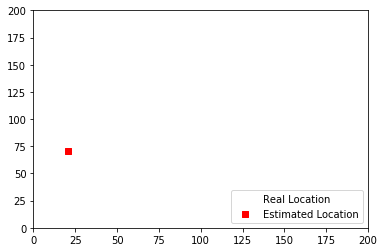

611
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


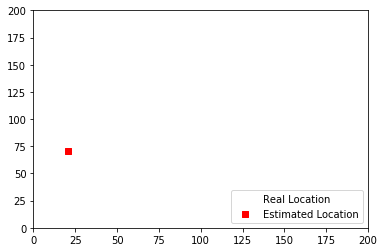

612
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


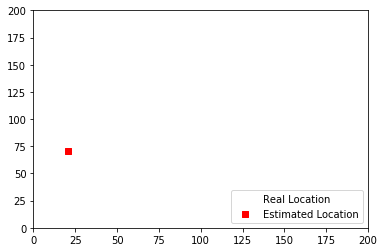

613
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


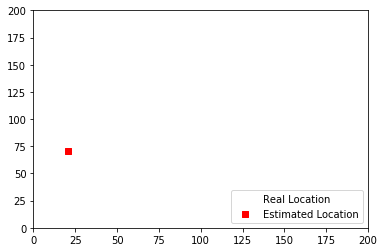

614
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


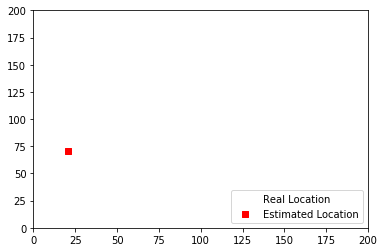

615
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


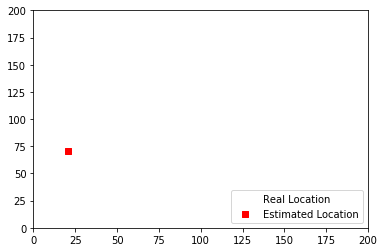

616
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


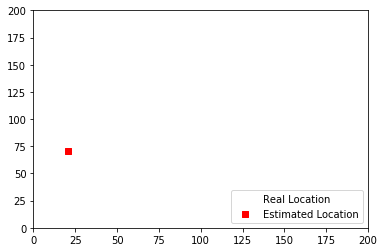

617
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


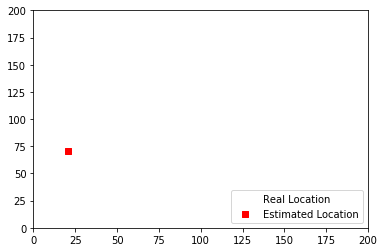

618
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


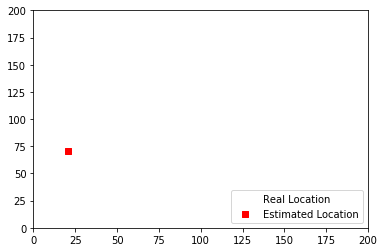

619
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


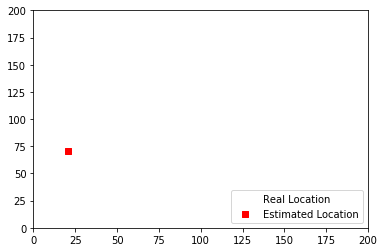

620
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


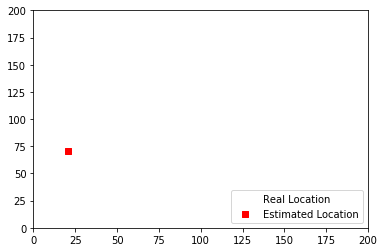

621
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


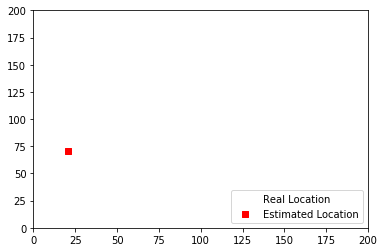

622
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


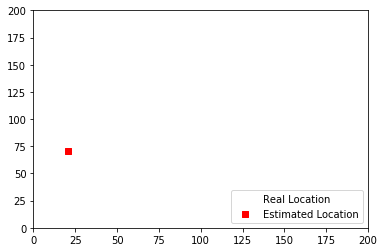

623
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


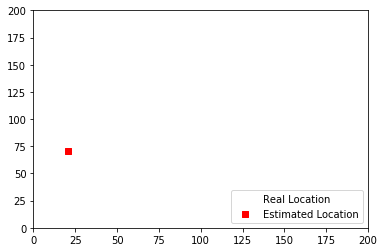

624
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


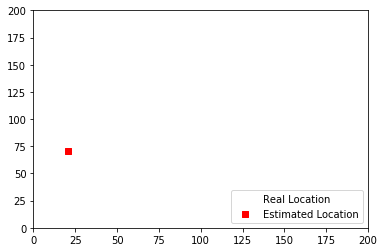

625
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


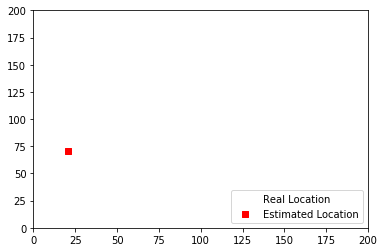

626
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


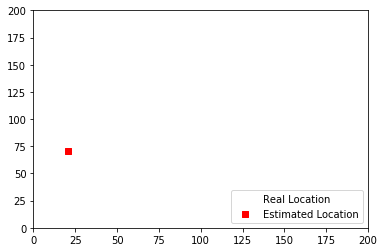

627
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


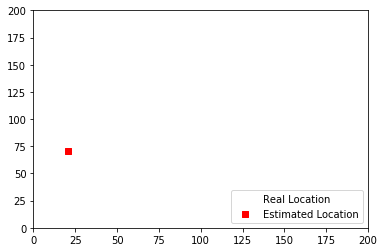

628
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


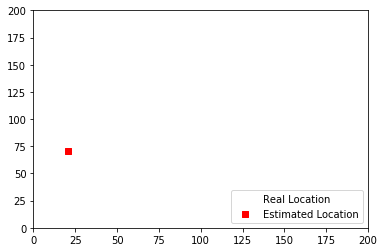

629
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


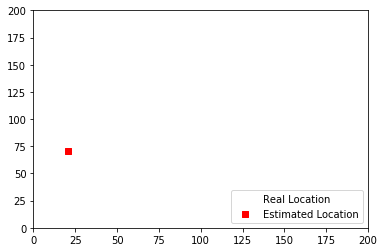

630
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


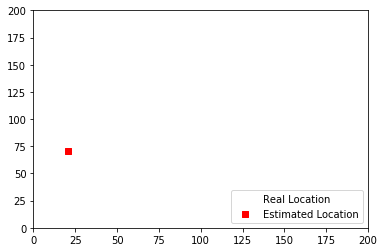

631
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


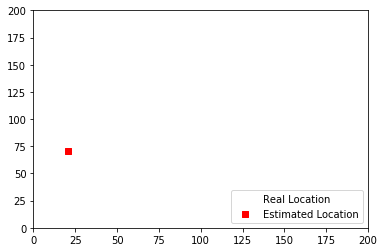

632
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


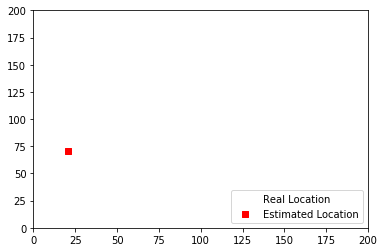

633
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


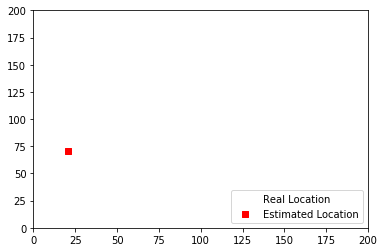

634
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


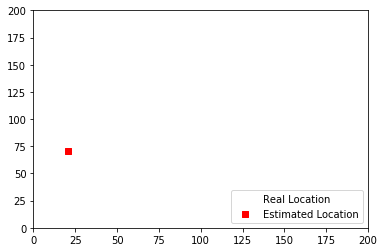

635
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


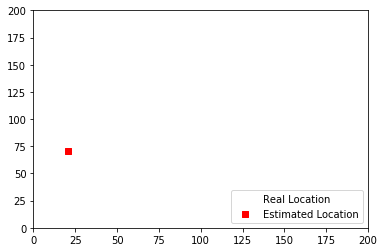

636
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


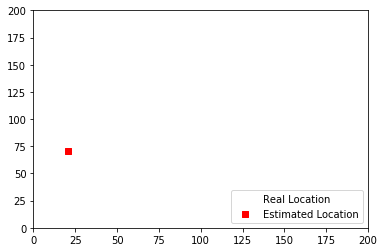

637
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


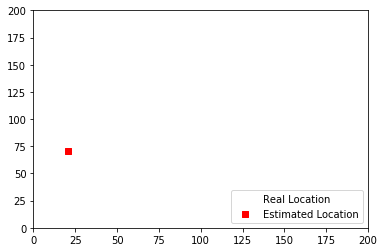

638
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


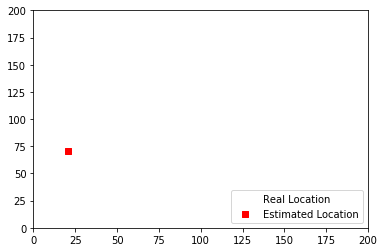

639
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


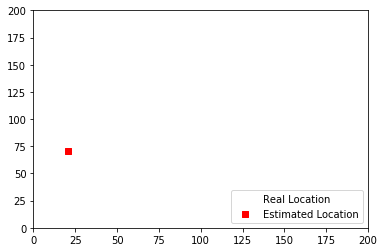

640
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


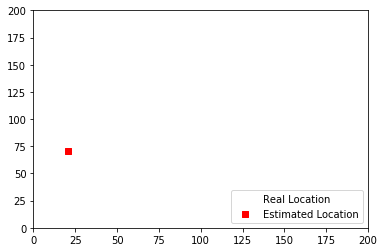

641
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


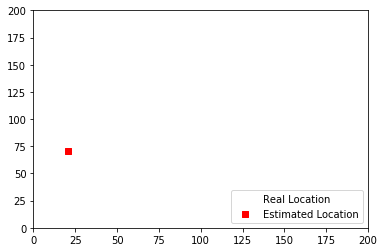

642
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


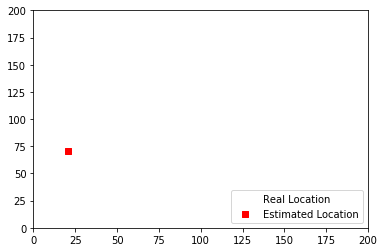

643
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


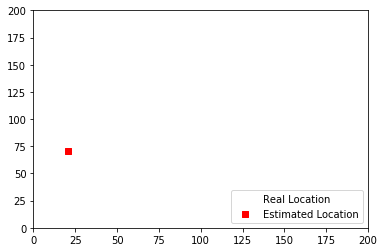

644
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


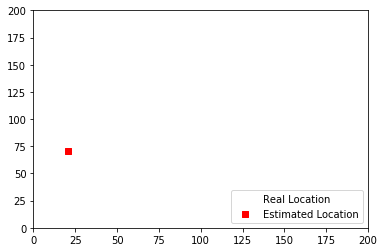

645
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


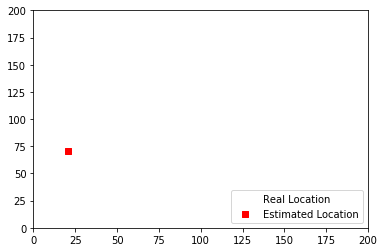

646
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


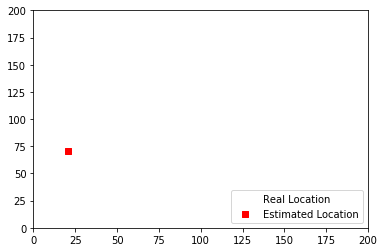

647
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


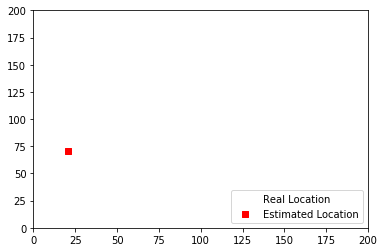

648
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


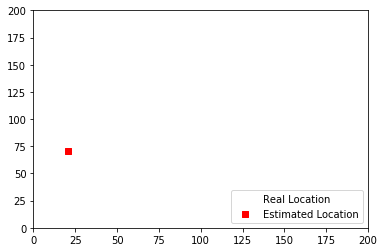

649
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


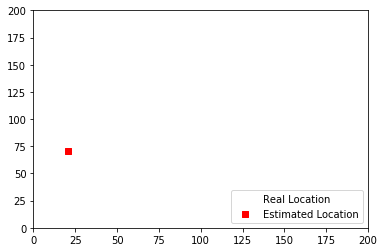

650
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


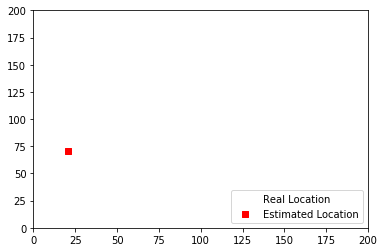

651
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


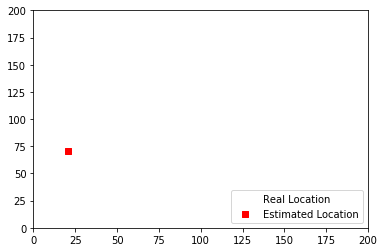

652
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


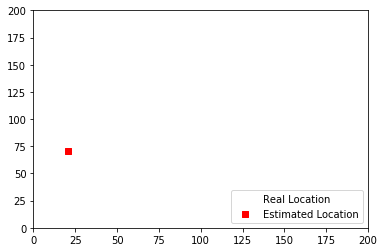

653
infered loc:
[21.         71.02727273]
real loc:
[21.33333 69.33333]


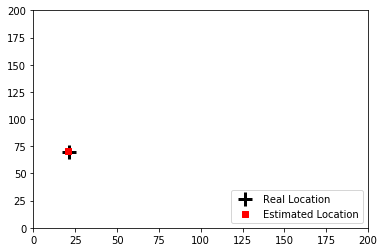

658
infered loc:
[24.         94.71497585]
real loc:
[21.  94.8]


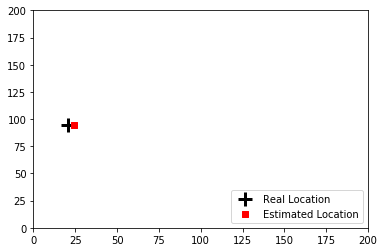

659
infered loc:
[18. 93.]
real loc:
[ 5. 94.]


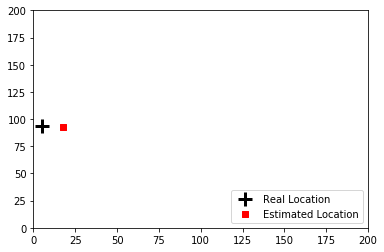

660
infered loc:
[18. 93.]
real loc:
[nan nan]


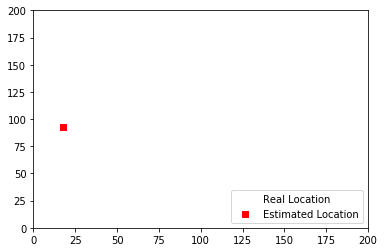

661
infered loc:
[18. 93.]
real loc:
[13.16667 79.66667]


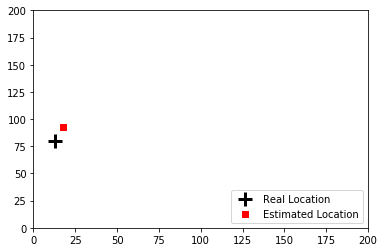

662
infered loc:
[16.56716418 78.56716418]
real loc:
[13.16667 79.66667]


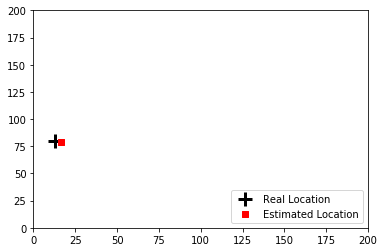

663
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


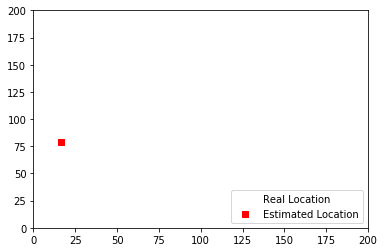

664
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


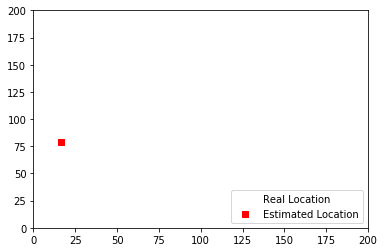

665
infered loc:
[16.56716418 78.56716418]
real loc:
[28.75    76.16667]


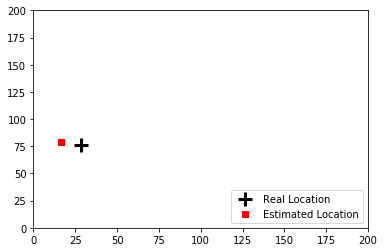

668
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


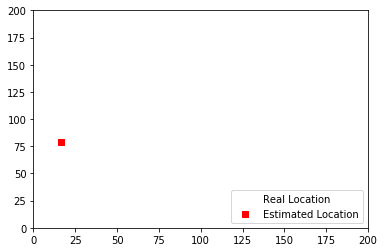

669
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


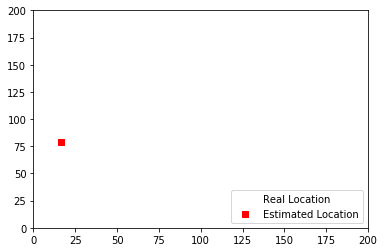

670
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


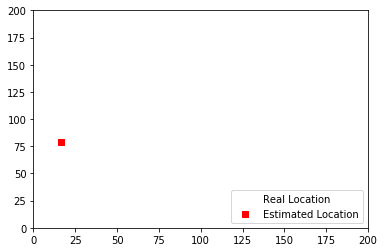

671
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


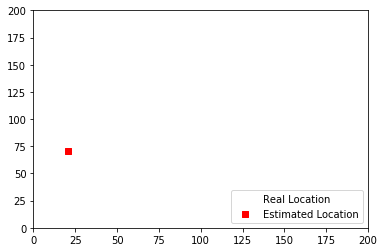

672
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


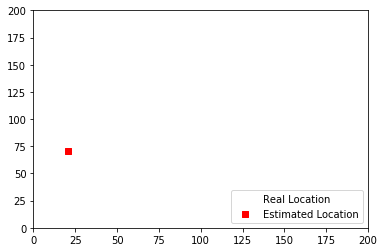

673
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


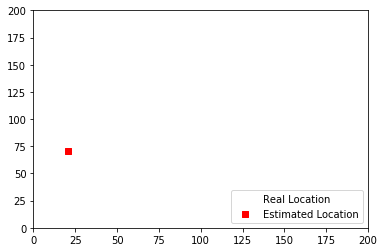

674
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


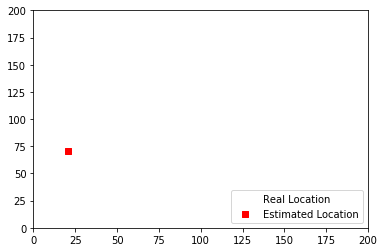

675
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


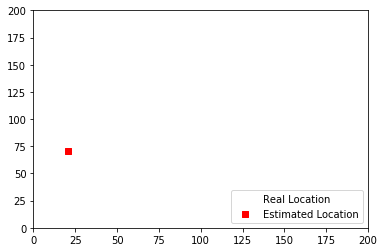

676
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


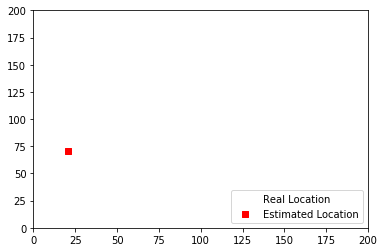

677
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


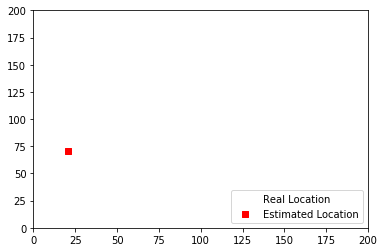

678
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


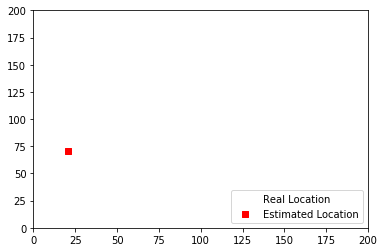

680
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


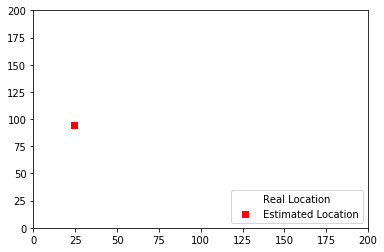

682
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


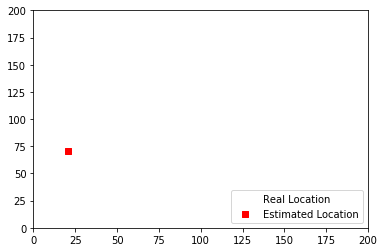

683
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


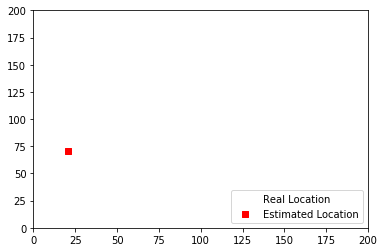

684
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


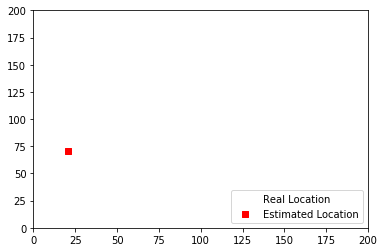

685
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


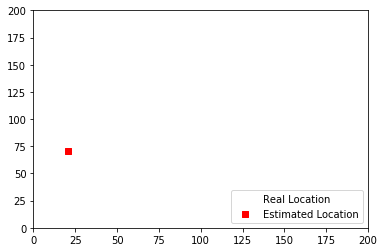

686
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


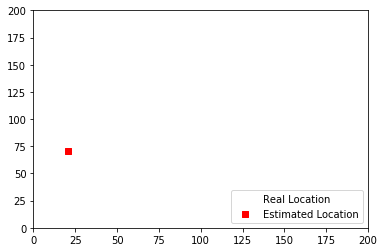

687
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


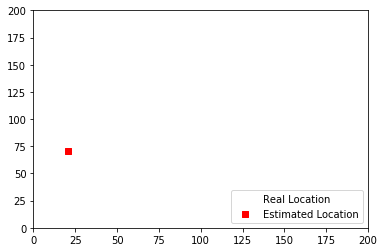

688
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


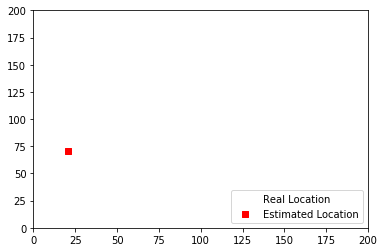

689
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


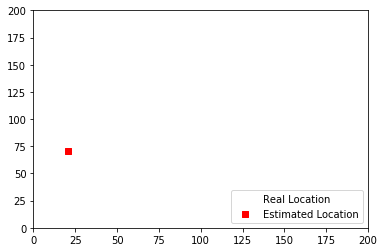

690
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


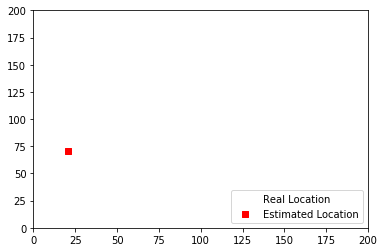

691
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


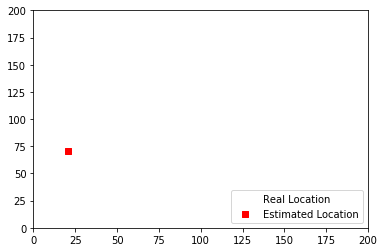

692
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


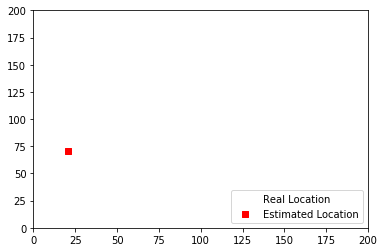

693
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


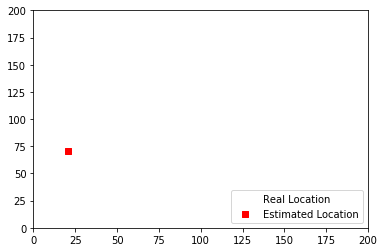

694
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


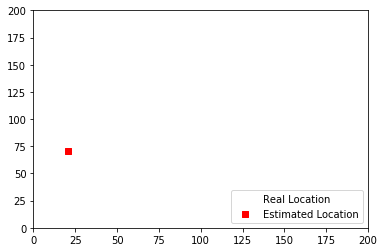

695
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


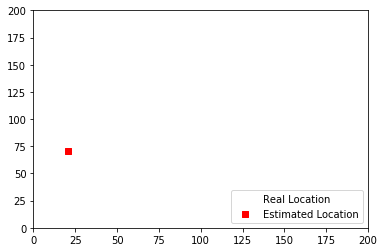

696
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


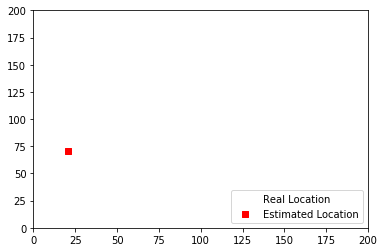

697
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


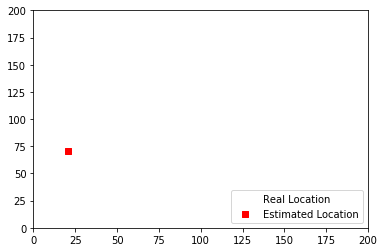

698
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


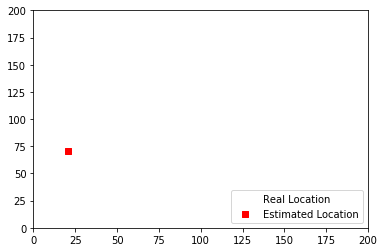

699
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


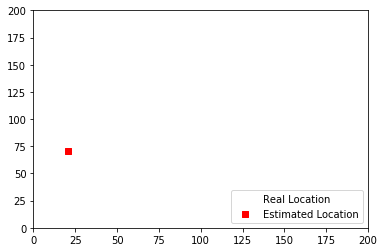

700
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


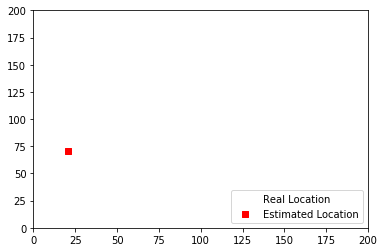

701
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


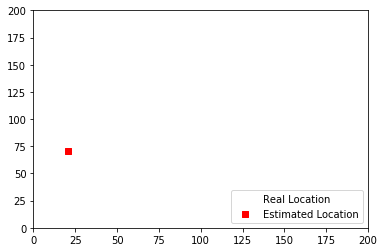

702
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


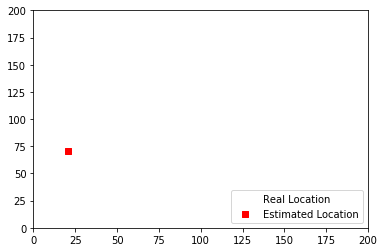

704
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


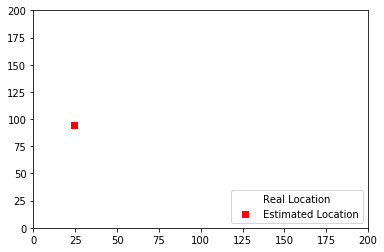

705
infered loc:
[24.         94.71497585]
real loc:
[nan nan]


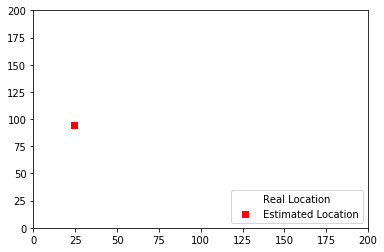

707
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


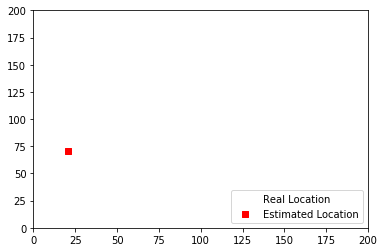

708
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


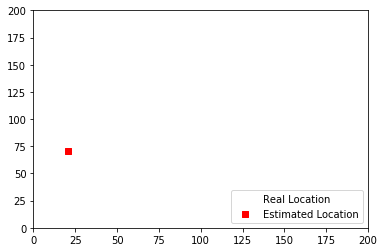

709
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


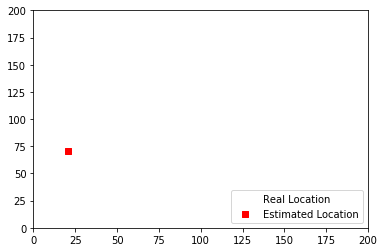

710
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


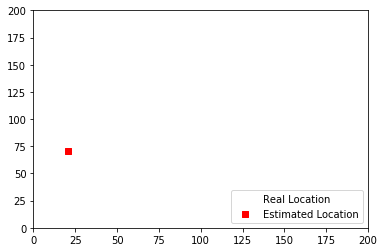

711
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


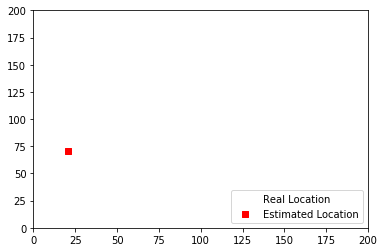

712
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


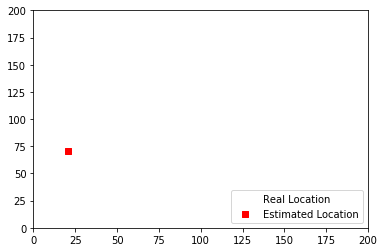

713
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


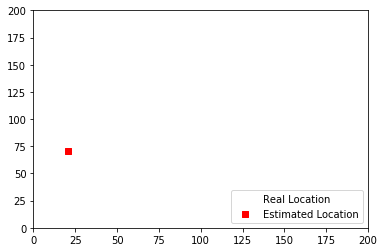

714
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


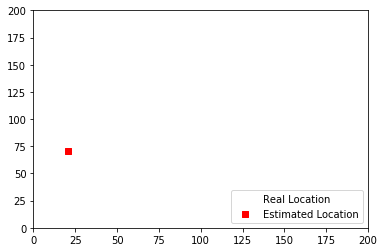

716
infered loc:
[21.         71.02727273]
real loc:
[28.6 77.2]


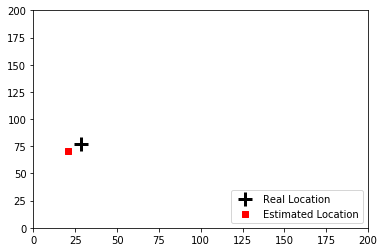

717
infered loc:
[24.         94.71497585]
real loc:
[25.9 95.8]


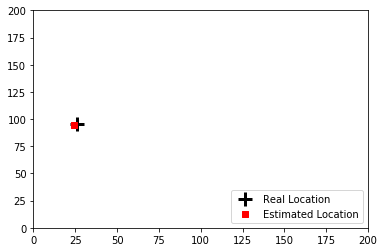

718
infered loc:
[18. 93.]
real loc:
[11.66667 78.     ]


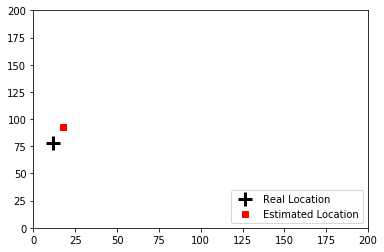

719
infered loc:
[16.56716418 78.56716418]
real loc:
[11.66667 78.     ]


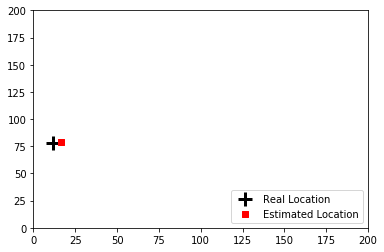

724
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


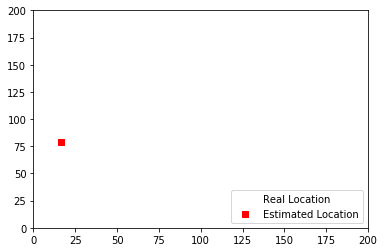

725
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


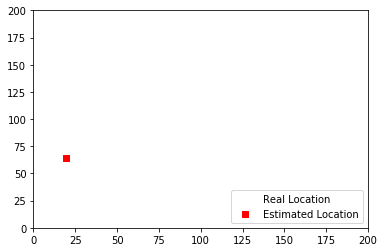

726
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


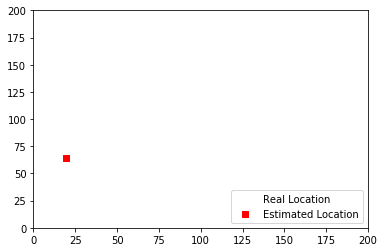

727
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


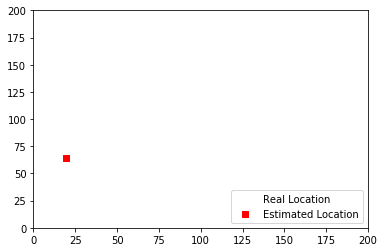

728
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


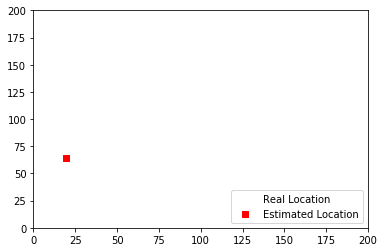

729
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


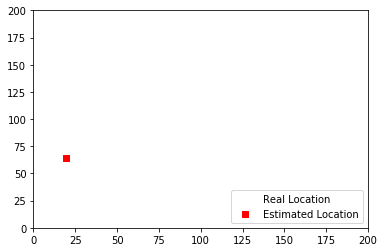

730
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


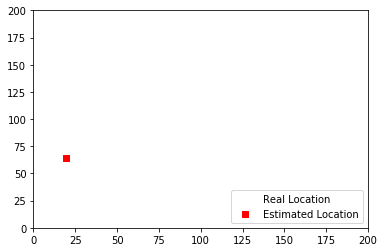

731
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


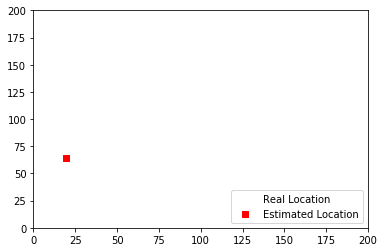

732
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


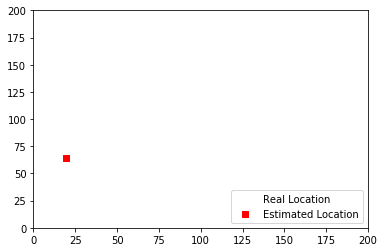

733
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


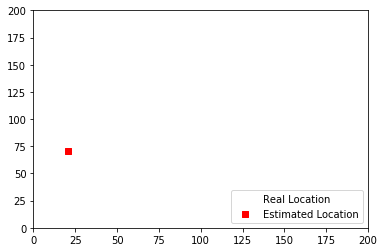

734
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


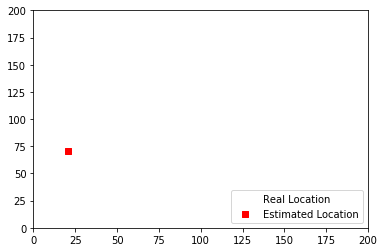

735
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


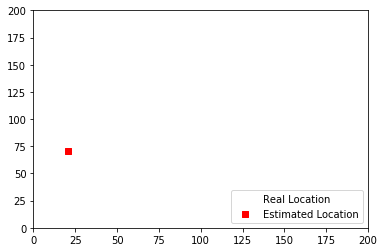

736
infered loc:
[21.         71.02727273]
real loc:
[17.25 68.5 ]


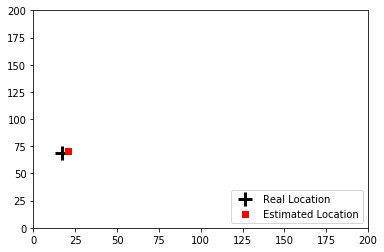

737
infered loc:
[19.48780488 64.04065041]
real loc:
[17.25 68.5 ]


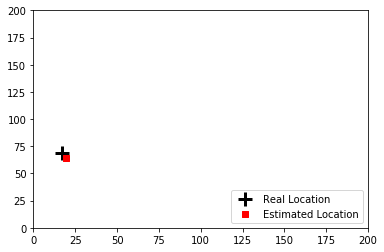

746
infered loc:
[19.48780488 64.04065041]
real loc:
[10.83333 67.19048]


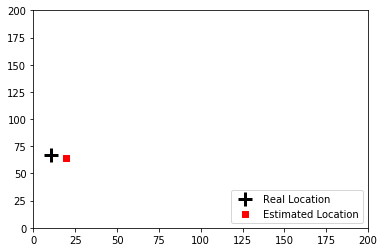

747
infered loc:
[19.48780488 64.04065041]
real loc:
[16.08333 68.2619 ]


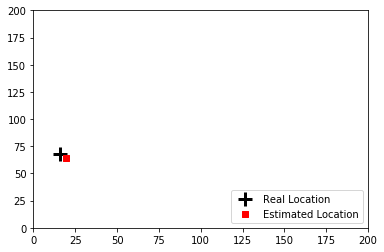

748
infered loc:
[19.48780488 64.04065041]
real loc:
[16.08333 68.2619 ]


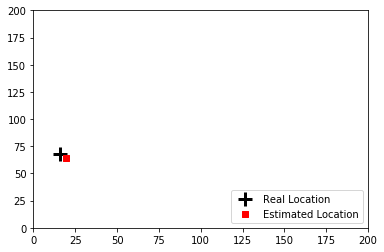

749
infered loc:
[19.48780488 64.04065041]
real loc:
[17.83333 68.61905]


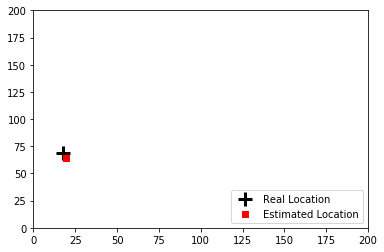

750
infered loc:
[19.48780488 64.04065041]
real loc:
[17.83333 68.61905]


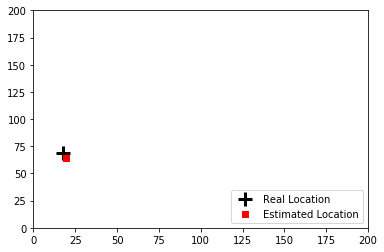

751
infered loc:
[19.48780488 64.04065041]
real loc:
[26.58333 70.40476]


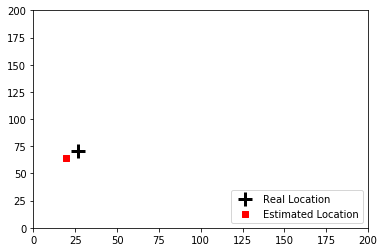

752
infered loc:
[19.48780488 64.04065041]
real loc:
[28.33333 70.7619 ]


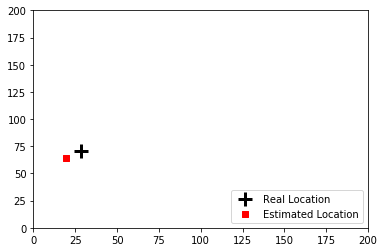

753
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


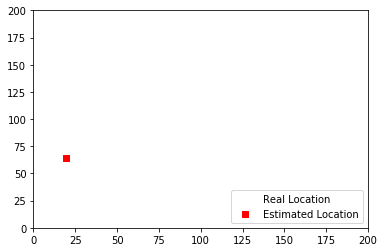

754
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


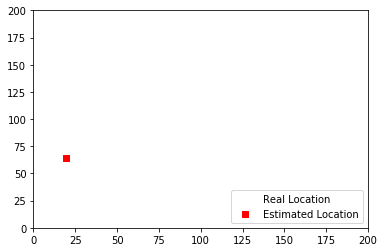

755
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


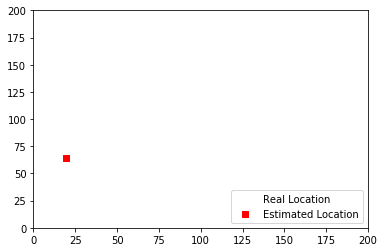

757
infered loc:
[19.48780488 64.04065041]
real loc:
[ 9.9 67. ]


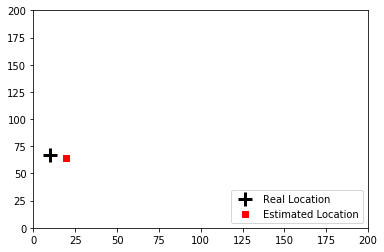

758
infered loc:
[19.48780488 64.04065041]
real loc:
[14.8 68. ]


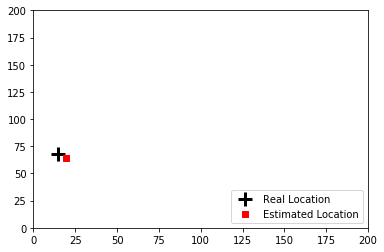

759
infered loc:
[19.48780488 64.04065041]
real loc:
[14.8 68. ]


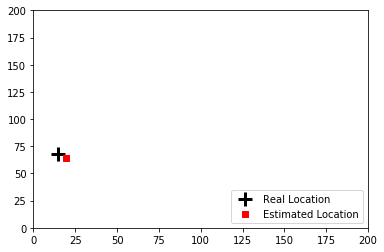

760
infered loc:
[19.48780488 64.04065041]
real loc:
[19.7 69. ]


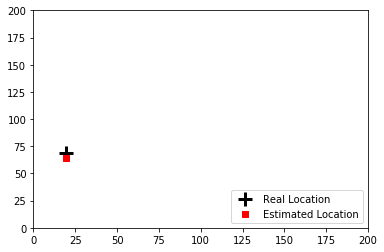

761
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


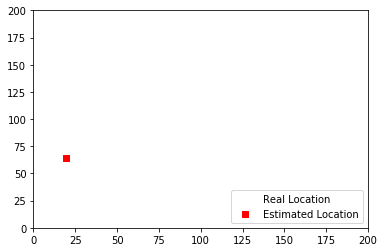

762
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


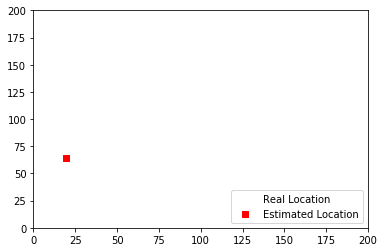

763
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


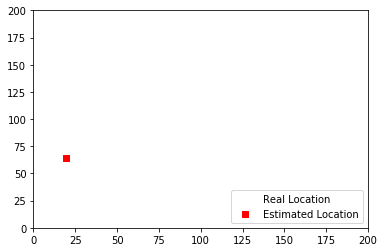

764
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


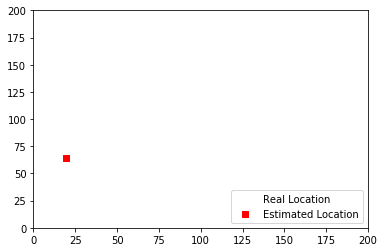

765
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


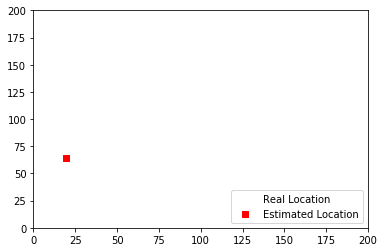

766
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


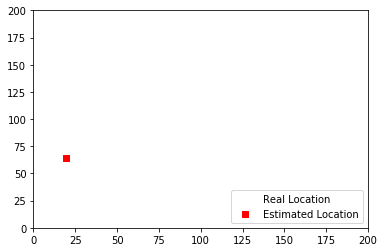

767
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


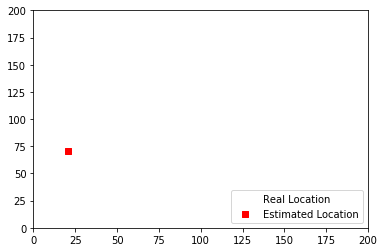

768
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


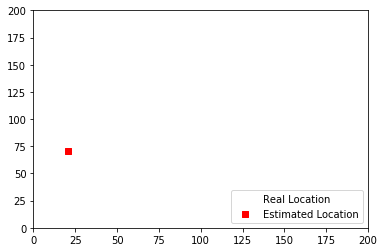

769
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


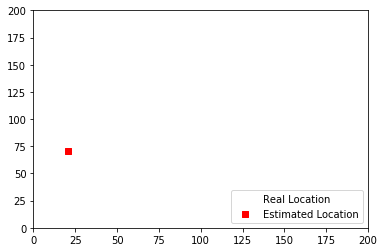

770
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


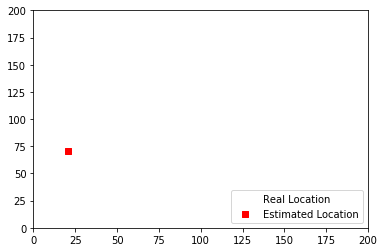

771
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


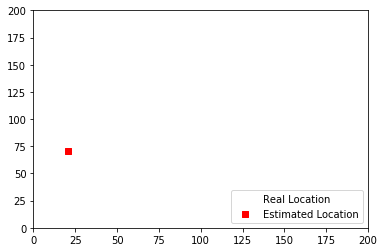

772
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


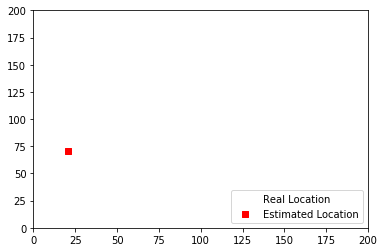

773
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


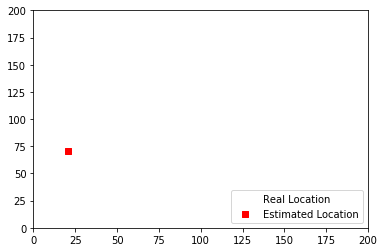

774
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


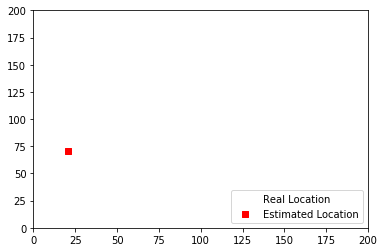

775
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


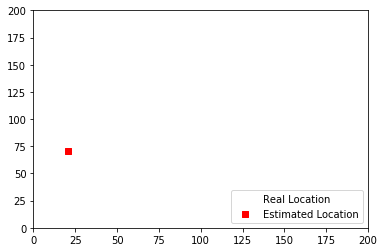

776
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


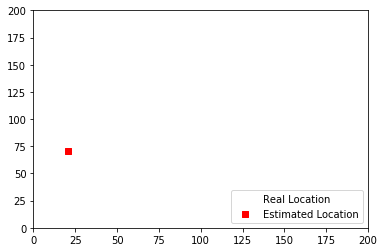

777
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


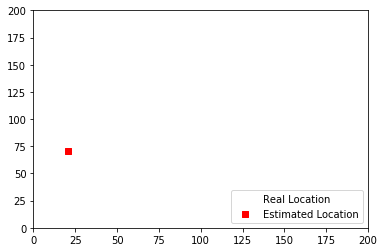

778
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


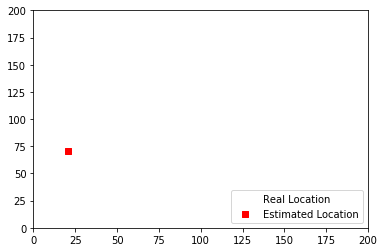

779
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


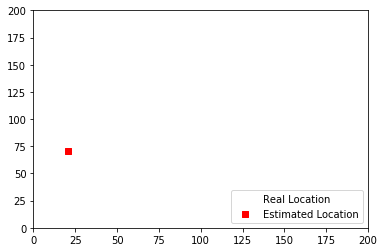

780
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


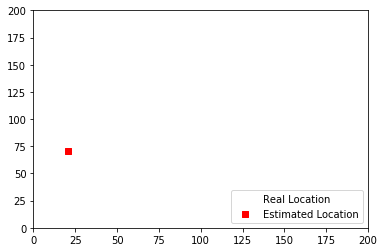

781
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


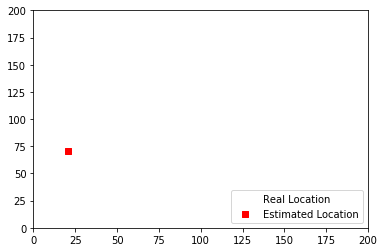

782
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


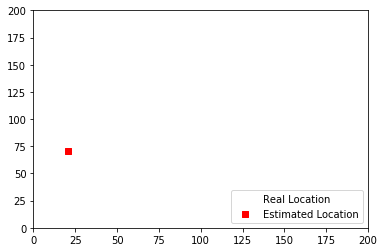

783
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


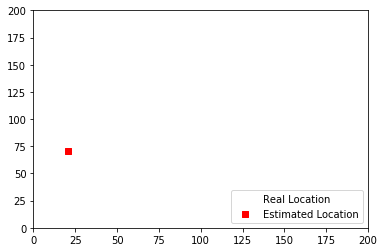

784
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


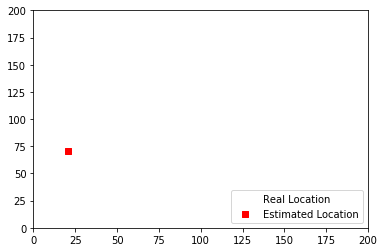

785
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


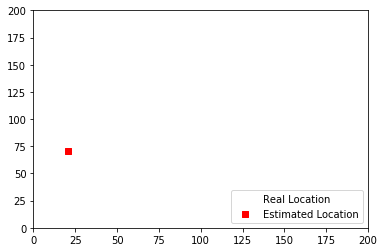

786
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


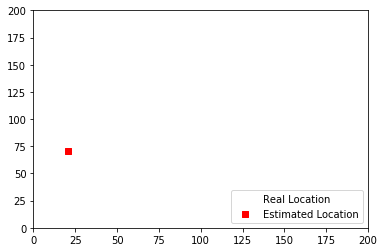

787
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


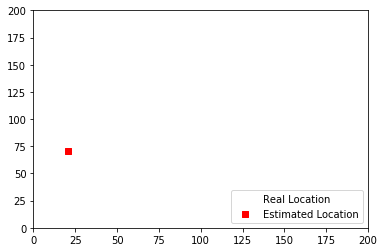

788
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


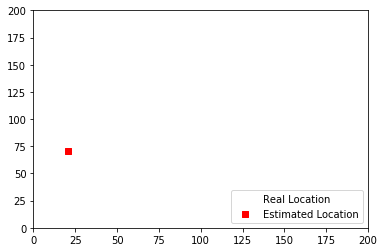

789
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


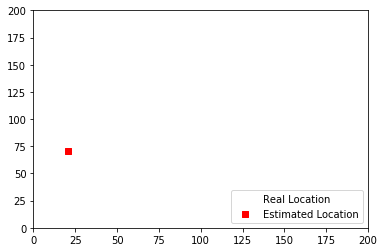

790
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


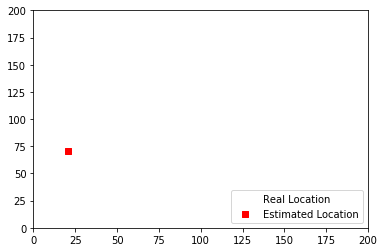

791
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


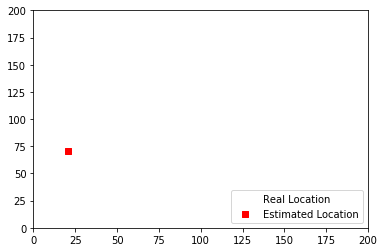

792
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


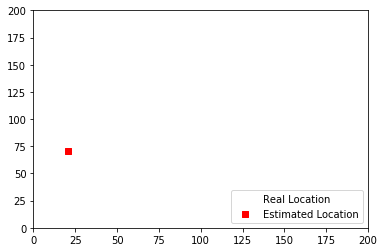

793
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


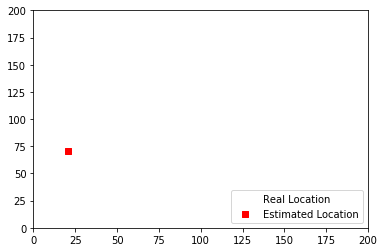

794
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


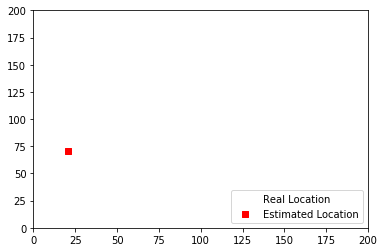

795
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


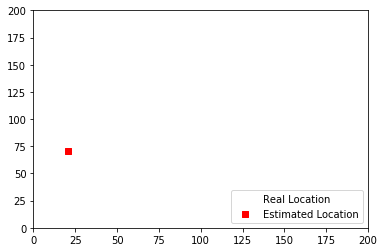

796
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


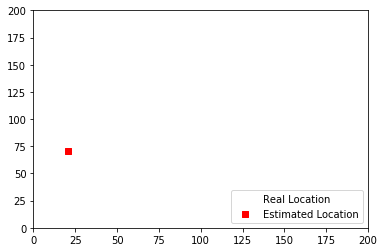

797
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


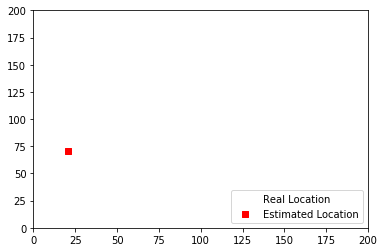

798
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


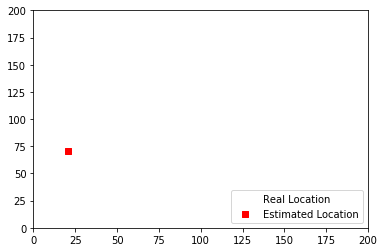

799
infered loc:
[21.         71.02727273]
real loc:
[nan nan]


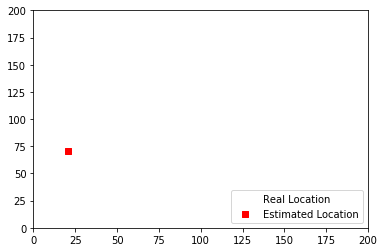

800
infered loc:
[24.         94.71497585]
real loc:
[ 18.98148 102.     ]


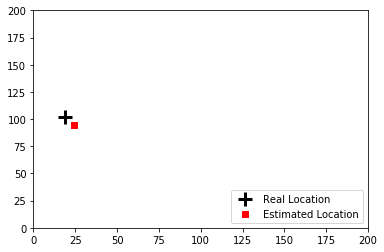

801
infered loc:
[24.         94.71497585]
real loc:
[ 20.42593 102.     ]


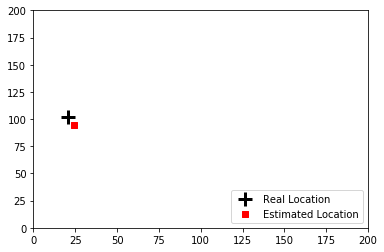

802
infered loc:
[24.         94.71497585]
real loc:
[ 21.14815 102.     ]


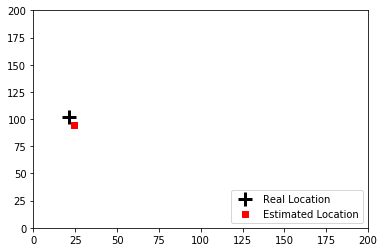

803
infered loc:
[24.         94.71497585]
real loc:
[ 21.87037 102.     ]


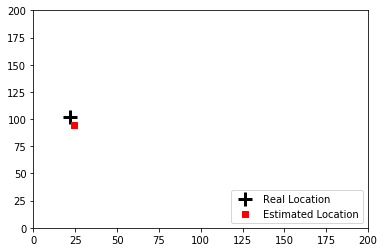

804
infered loc:
[24.         94.71497585]
real loc:
[ 22.59259 102.     ]


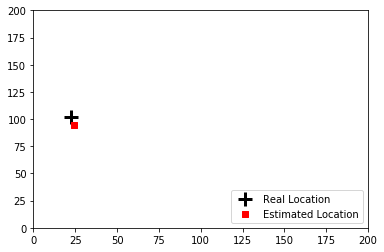

805
infered loc:
[24.         94.71497585]
real loc:
[ 23.31481 102.     ]


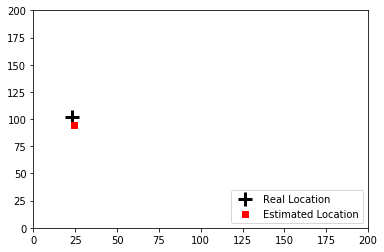

806
infered loc:
[24.         94.71497585]
real loc:
[ 24.03704 102.     ]


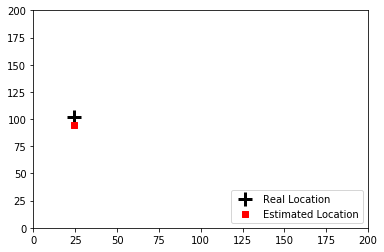

807
infered loc:
[18. 93.]
real loc:
[19.625 90.   ]


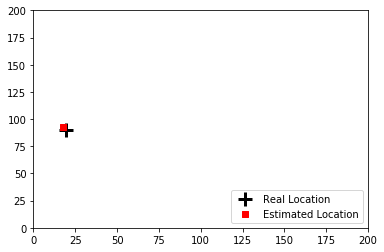

808
infered loc:
[18. 93.]
real loc:
[19.625 90.   ]


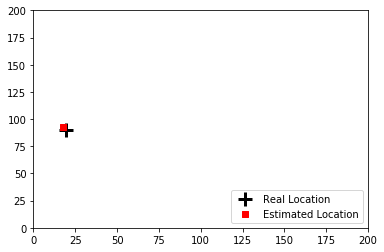

809
infered loc:
[18.         57.02727273]
real loc:
[23. 54.]


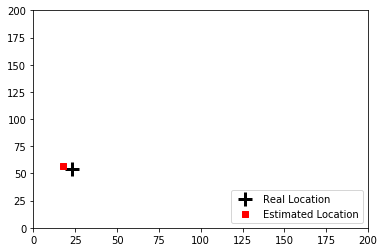

810
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


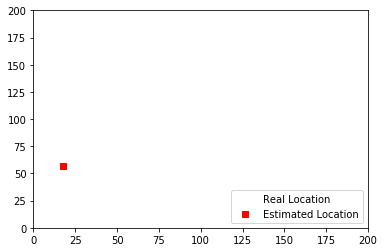

811
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


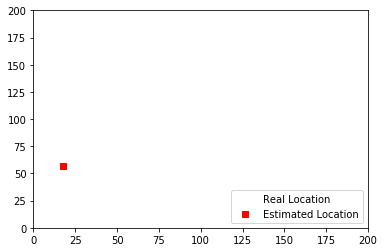

812
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


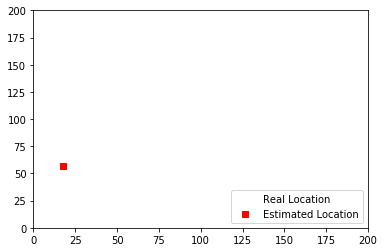

813
infered loc:
[19.48780488 64.04065041]
real loc:
[27.33333 65.33333]


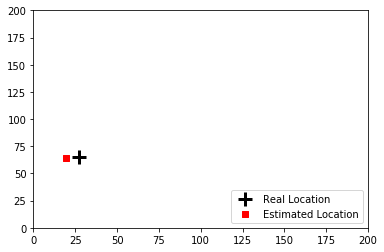

814
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


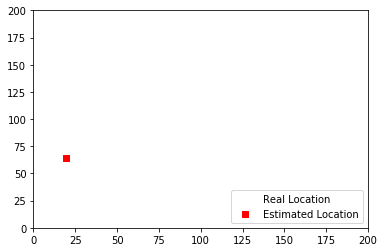

815
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


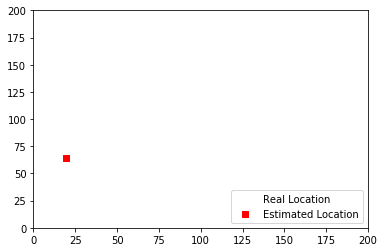

816
infered loc:
[19.48780488 64.04065041]
real loc:
[25.16667 59.66667]


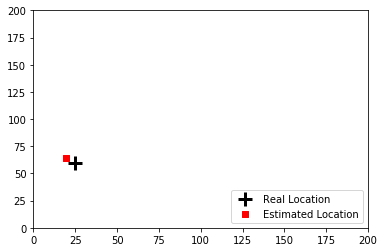

817
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


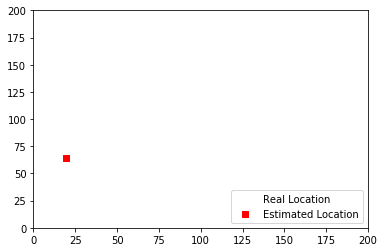

818
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


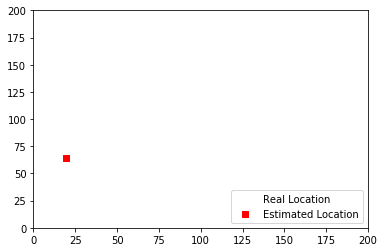

819
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


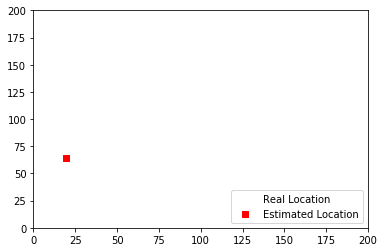

820
infered loc:
[19.48780488 64.04065041]
real loc:
[17. 58.]


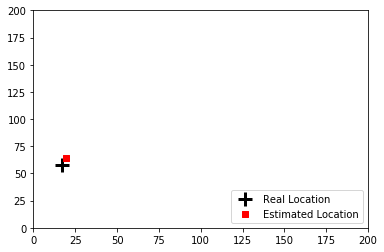

821
infered loc:
[19.48780488 64.04065041]
real loc:
[11. 62.]


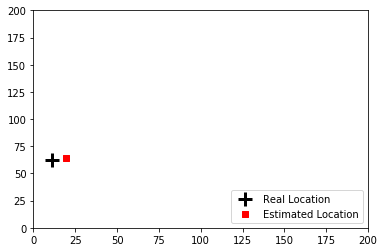

823
infered loc:
[19.48780488 64.04065041]
real loc:
[11.75 61.5 ]


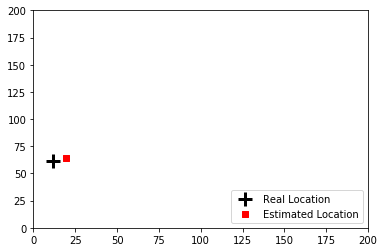

824
infered loc:
[19.48780488 64.04065041]
real loc:
[18.5 57. ]


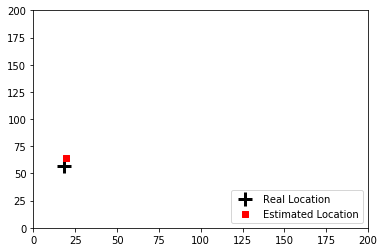

825
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


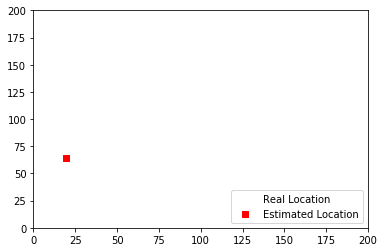

826
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


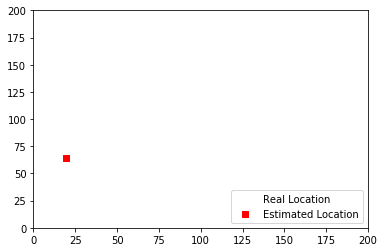

827
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


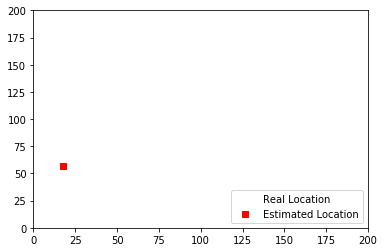

828
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


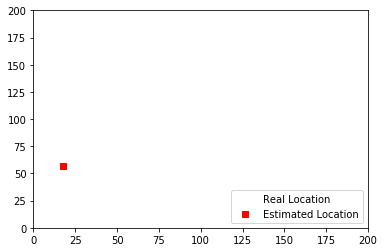

829
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


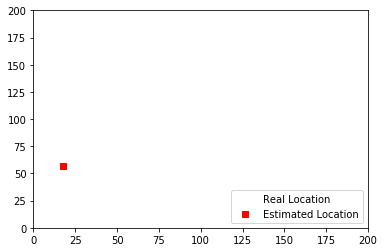

830
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


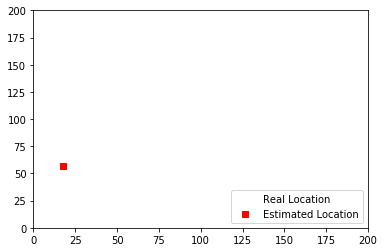

831
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


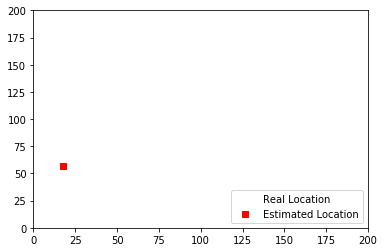

832
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


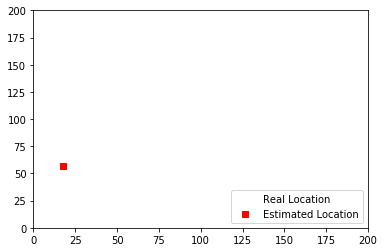

833
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


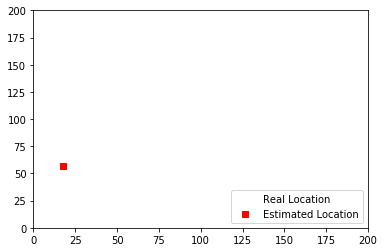

834
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


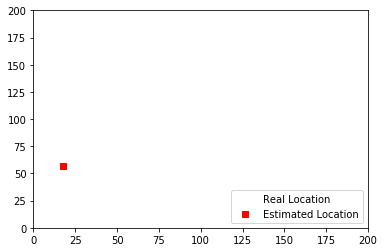

835
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


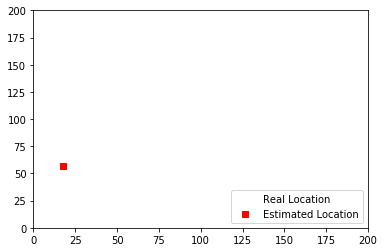

836
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


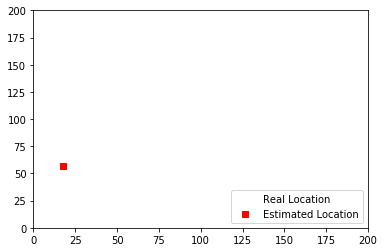

837
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


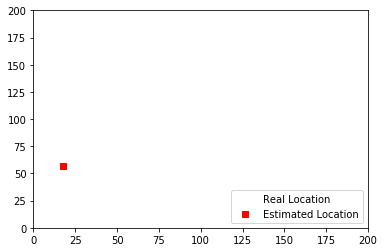

838
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


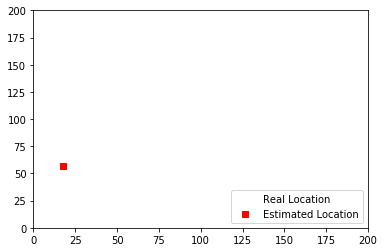

839
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


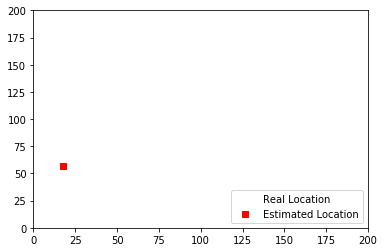

840
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


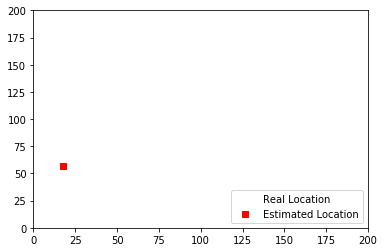

841
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


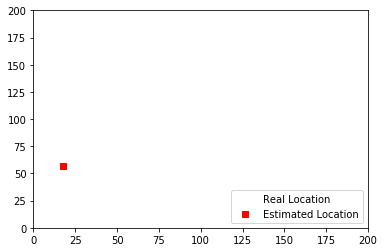

842
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


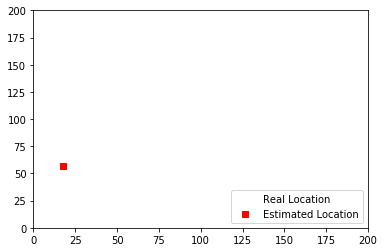

843
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


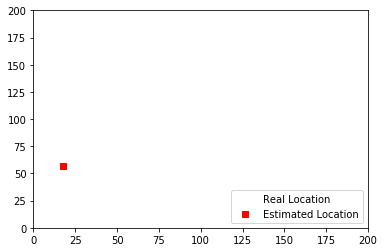

844
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


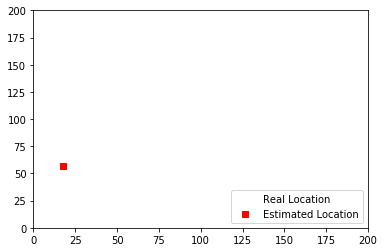

845
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


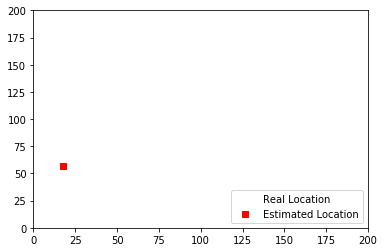

846
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


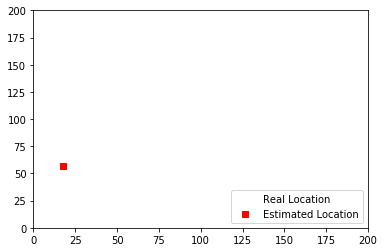

847
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


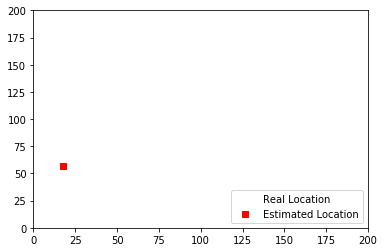

848
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


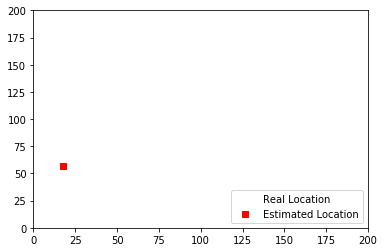

849
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


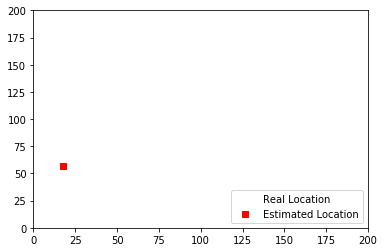

850
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


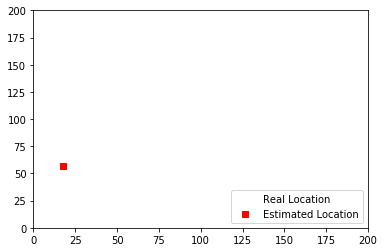

851
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


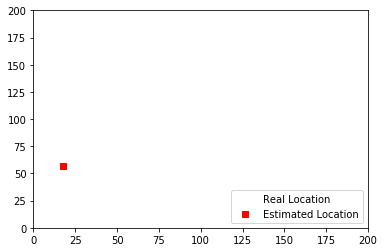

852
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


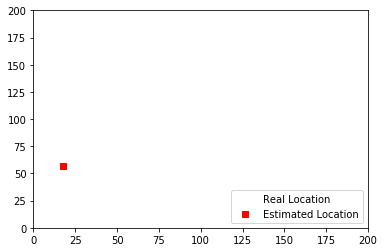

853
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


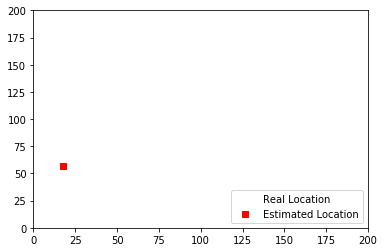

854
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


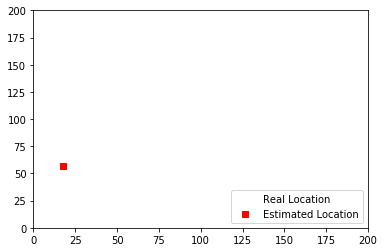

855
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


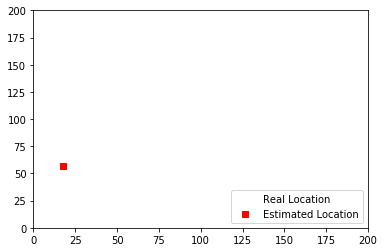

856
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


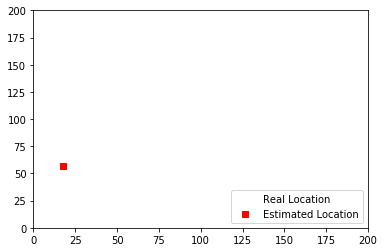

857
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


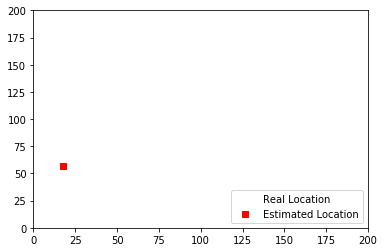

858
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


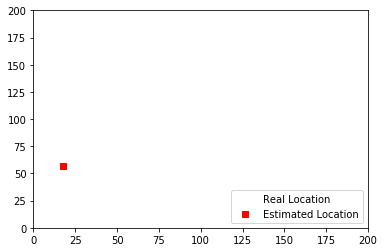

859
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


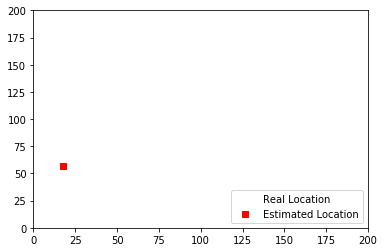

860
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


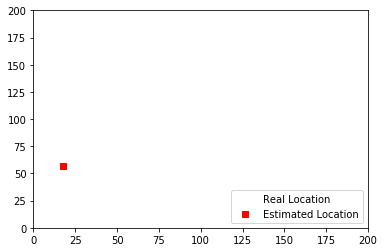

861
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


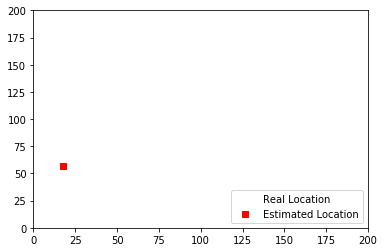

862
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


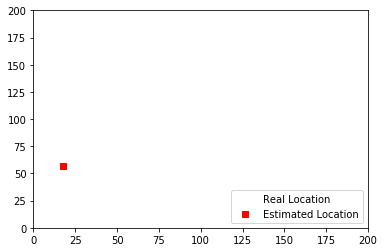

863
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


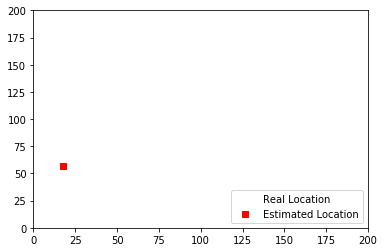

864
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


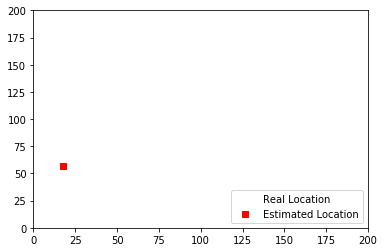

865
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


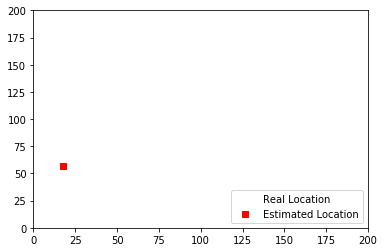

866
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


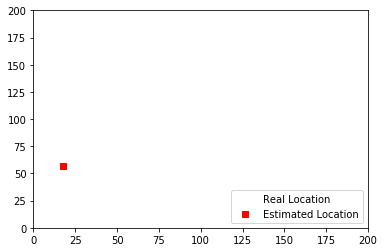

867
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


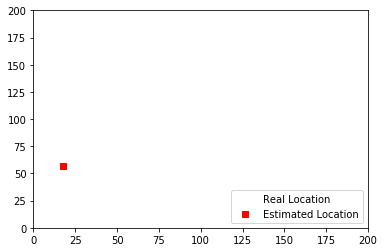

868
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


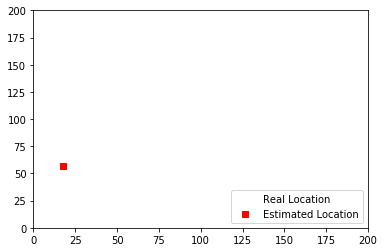

869
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


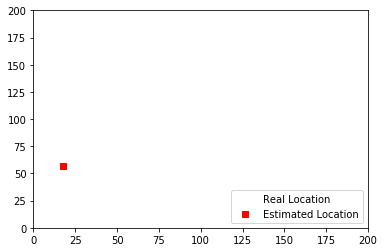

870
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


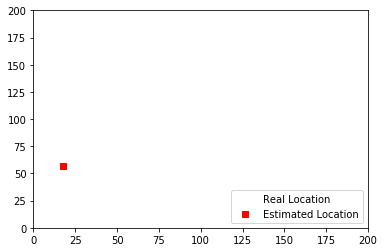

871
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


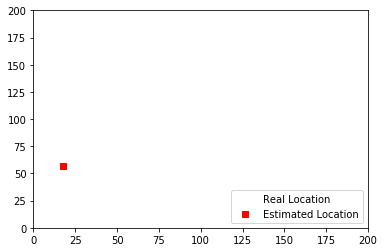

872
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


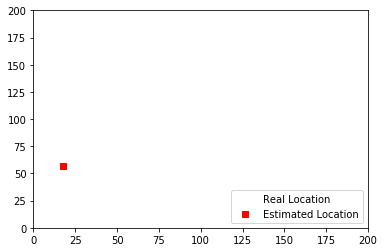

873
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


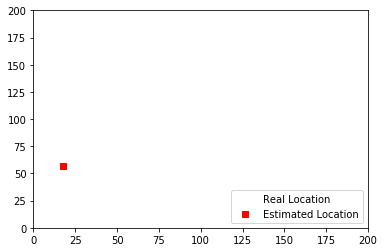

874
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


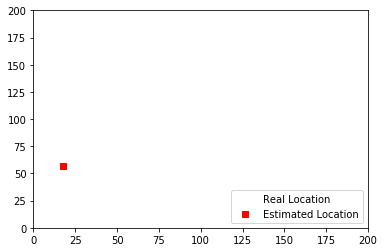

875
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


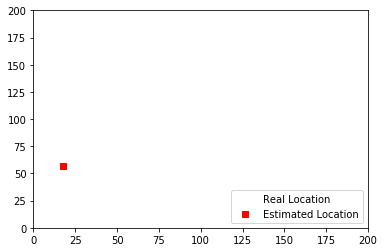

876
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


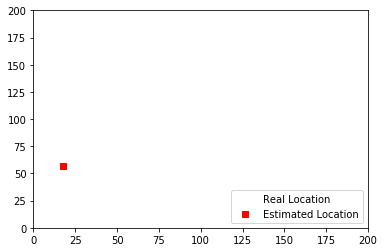

877
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


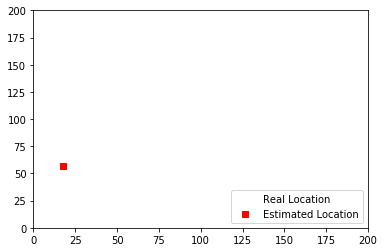

878
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


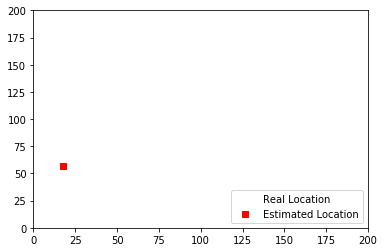

879
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


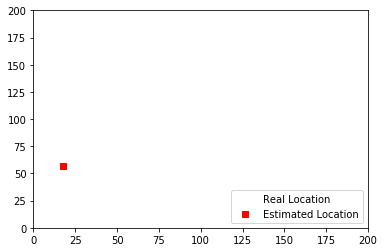

880
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


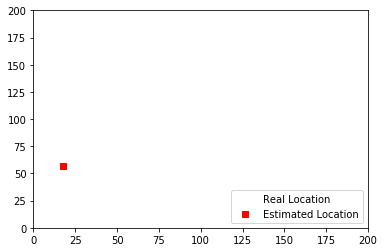

881
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


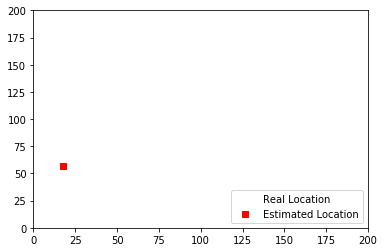

882
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


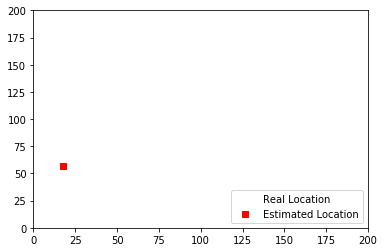

883
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


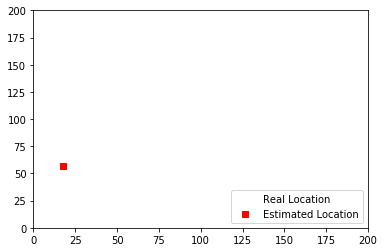

884
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


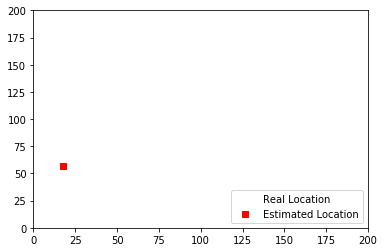

885
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


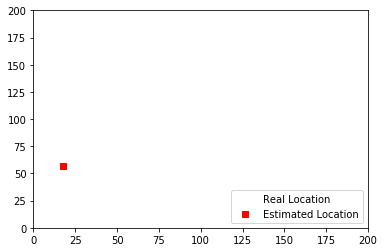

886
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


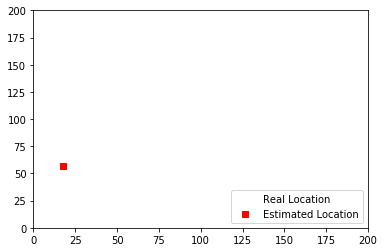

887
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


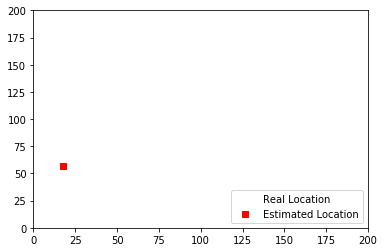

888
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


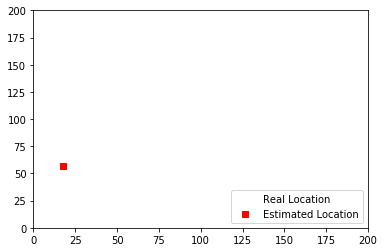

889
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


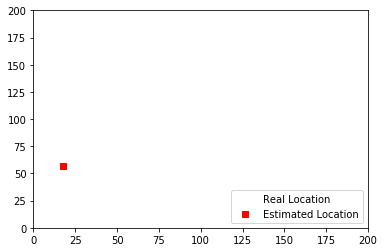

890
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


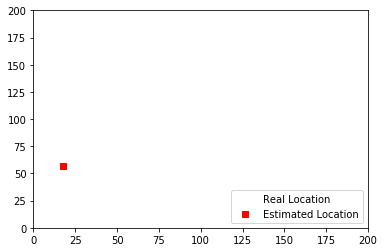

891
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


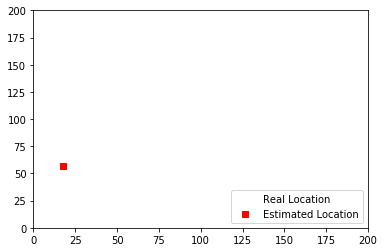

892
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


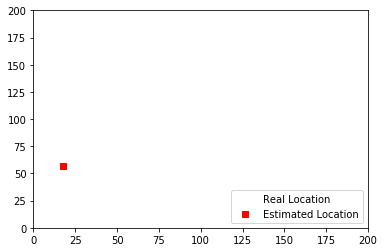

893
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


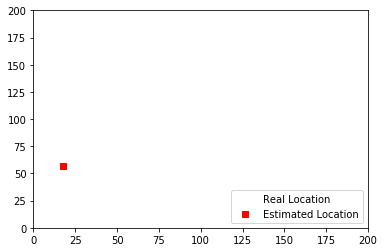

894
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


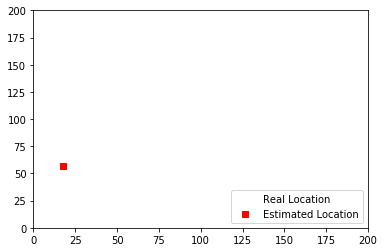

895
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


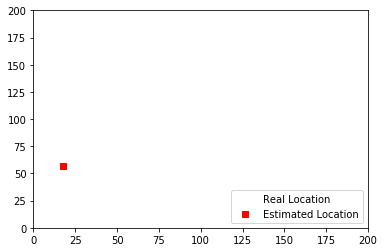

896
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


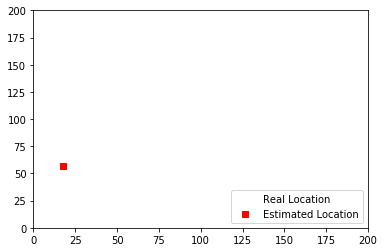

897
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


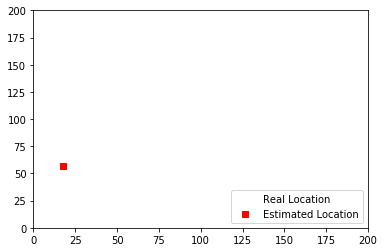

898
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


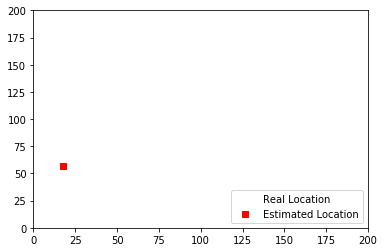

899
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


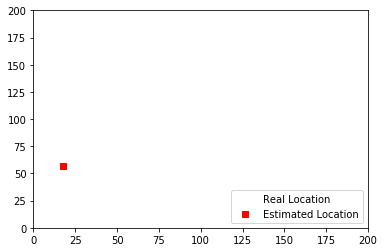

900
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


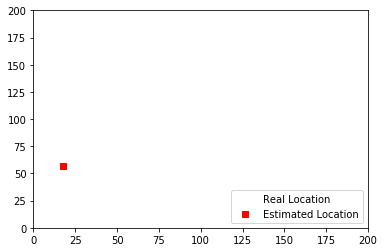

901
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


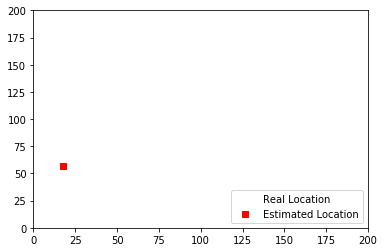

902
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


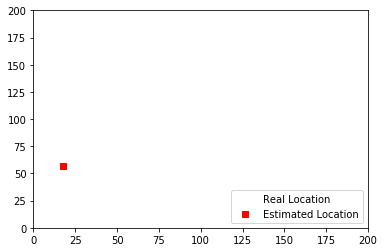

903
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


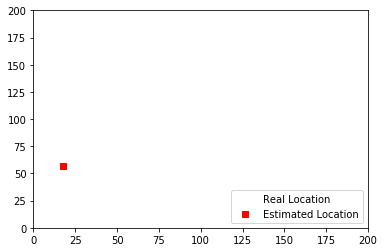

904
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


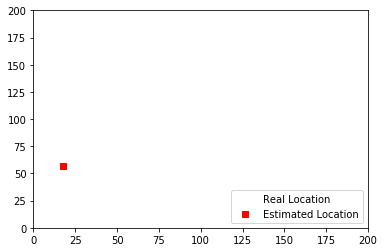

905
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


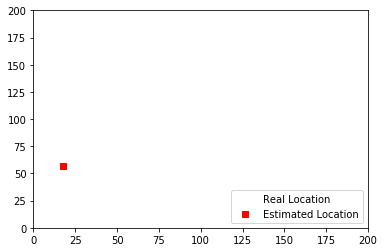

906
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


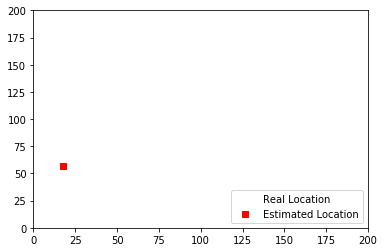

907
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


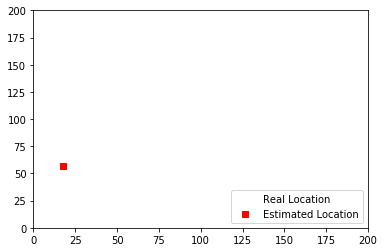

908
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


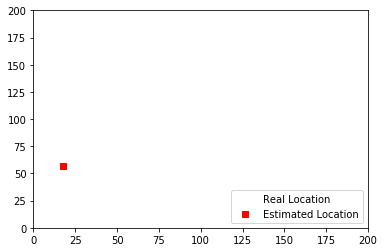

909
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


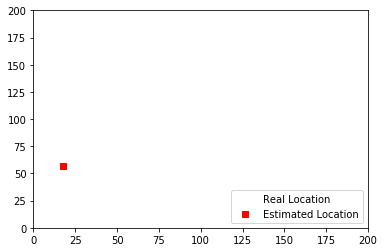

910
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


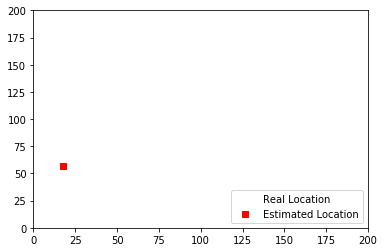

911
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


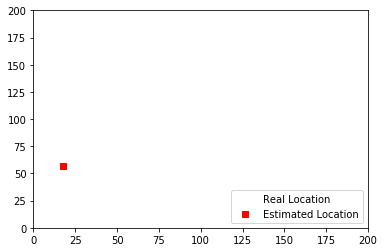

912
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


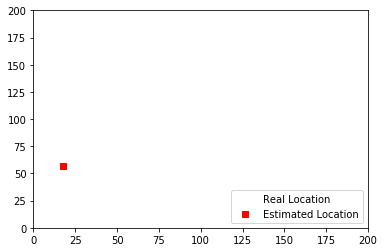

913
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


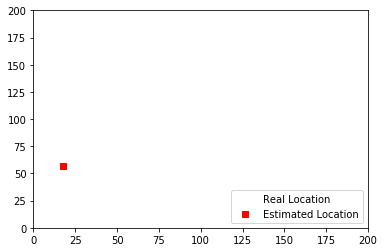

914
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


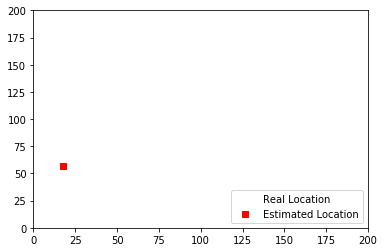

915
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


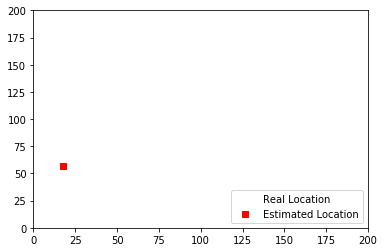

916
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


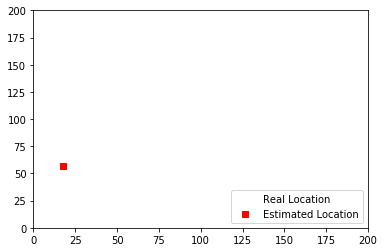

917
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


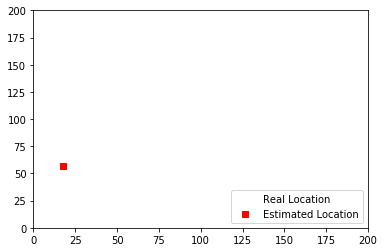

918
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


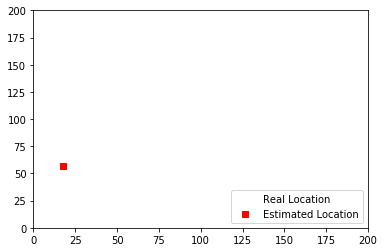

919
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


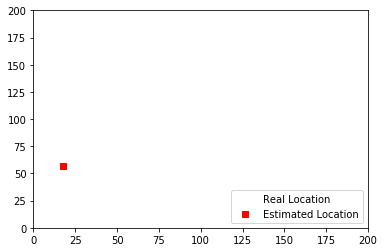

920
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


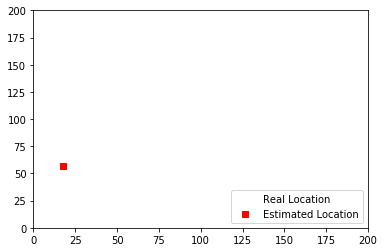

921
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


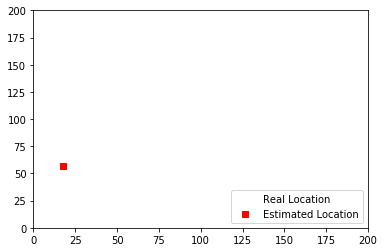

922
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


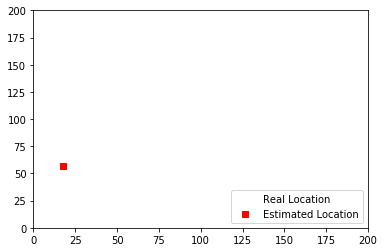

923
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


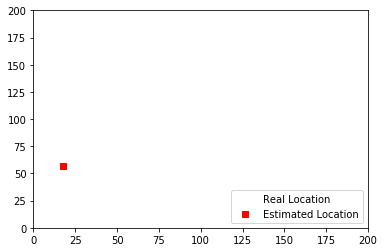

924
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


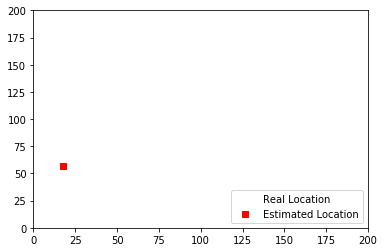

925
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


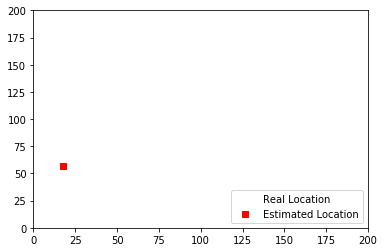

926
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


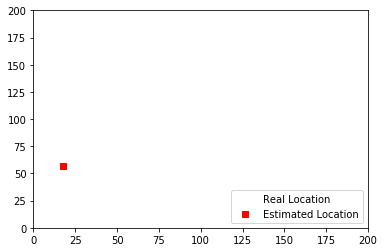

927
infered loc:
[19.48780488 64.04065041]
real loc:
[17.6 66. ]


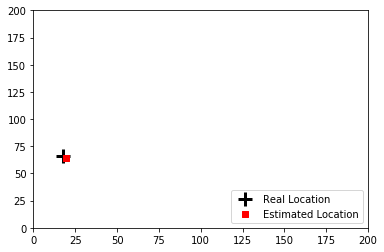

928
infered loc:
[19.48780488 64.04065041]
real loc:
[17.6 66. ]


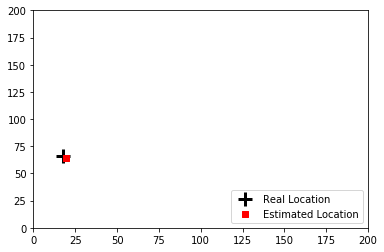

929
infered loc:
[16.56716418 78.56716418]
real loc:
[12.2 78. ]


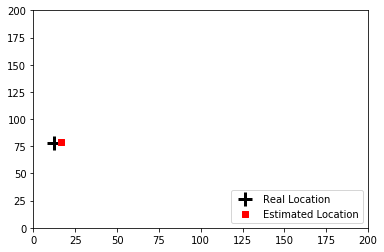

930
infered loc:
[16.56716418 78.56716418]
real loc:
[12.2 78. ]


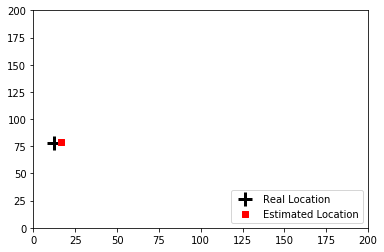

931
infered loc:
[16.56716418 78.56716418]
real loc:
[ 6.8 90. ]


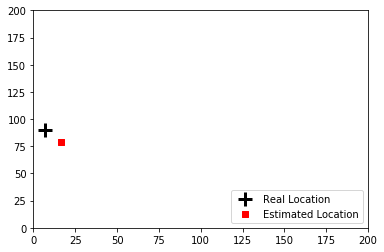

932
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


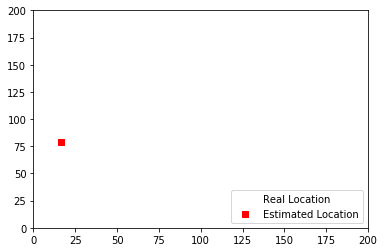

933
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


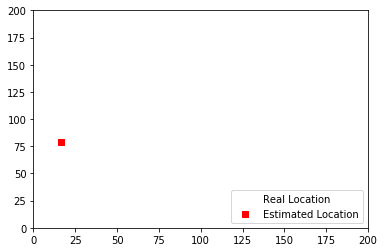

934
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


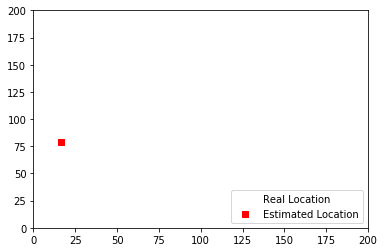

935
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


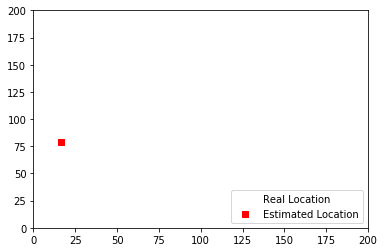

936
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


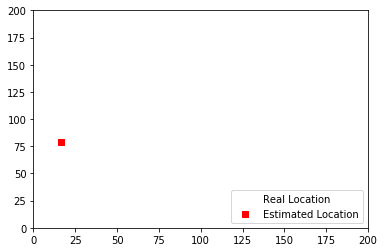

937
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


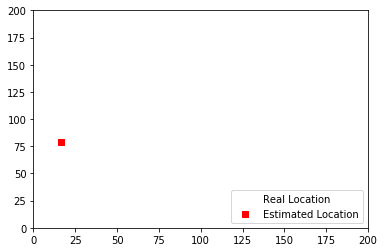

938
infered loc:
[12.         86.02727273]
real loc:
[16.      81.33333]


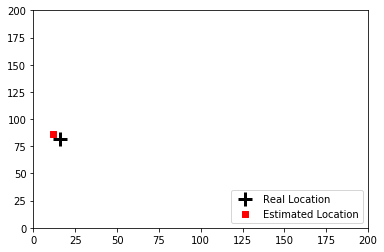

939
infered loc:
[16.56716418 78.56716418]
real loc:
[16.      81.33333]


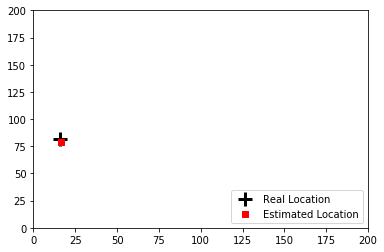

940
infered loc:
[16.56716418 78.56716418]
real loc:
[14.9 78.6]


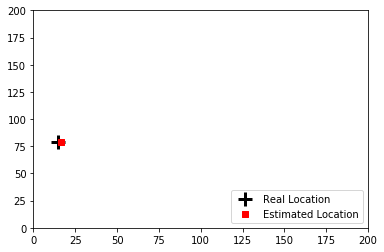

941
infered loc:
[16.56716418 78.56716418]
real loc:
[14.9 78.6]


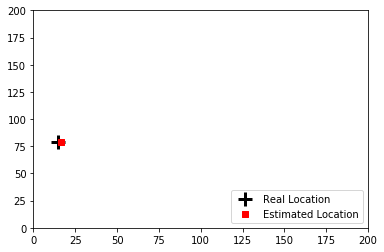

942
infered loc:
[16.56716418 78.56716418]
real loc:
[ 5. 84.]


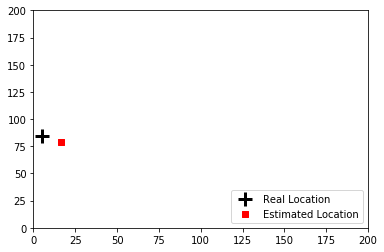

943
infered loc:
[16.56716418 78.56716418]
real loc:
[21.5 75. ]


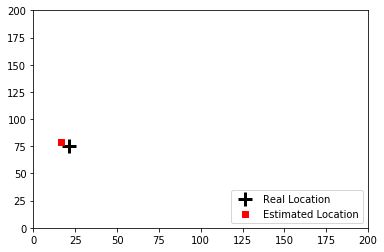

944
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


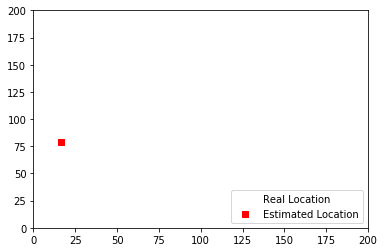

945
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


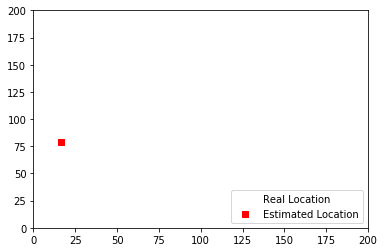

946
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


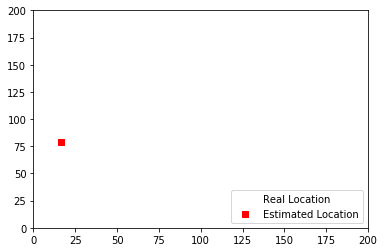

947
infered loc:
[16.56716418 78.56716418]
real loc:
[23.375 76.75 ]


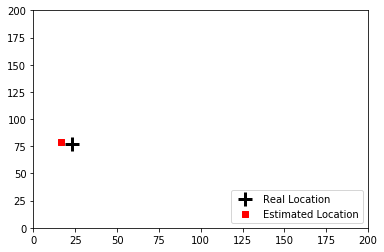

948
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


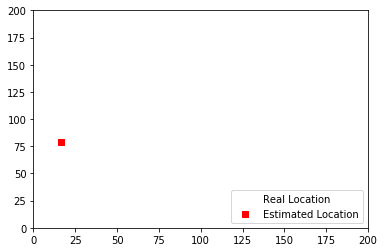

949
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


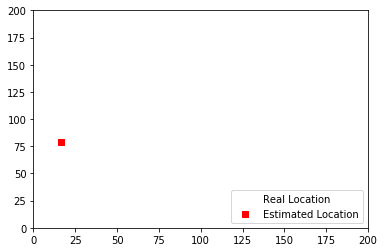

950
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


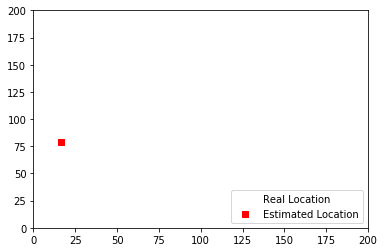

951
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


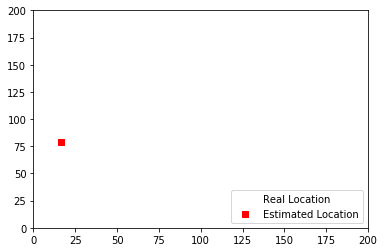

952
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


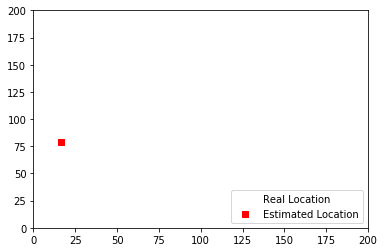

953
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


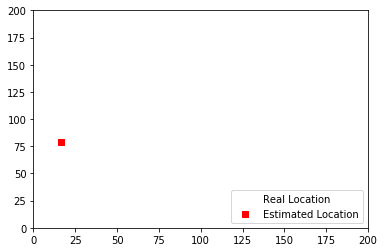

954
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


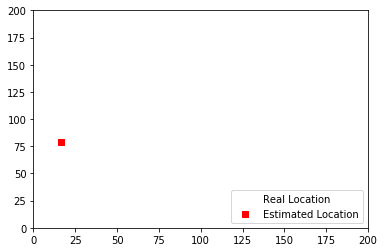

955
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


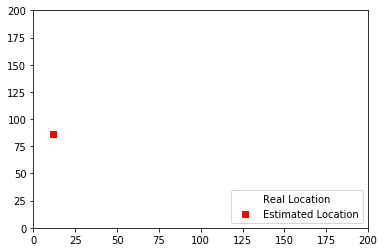

956
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


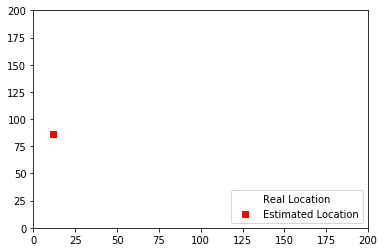

957
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


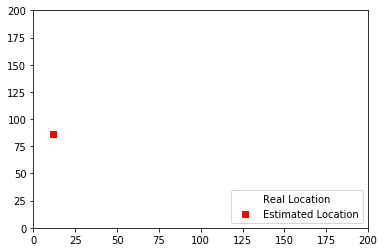

958
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


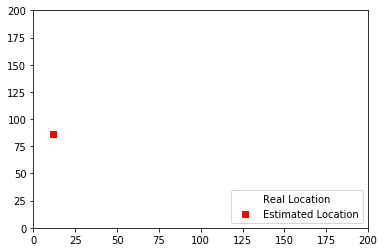

959
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


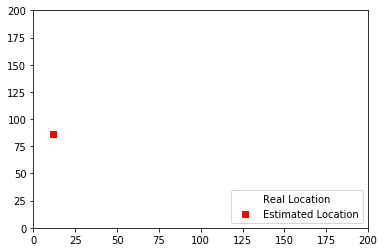

960
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


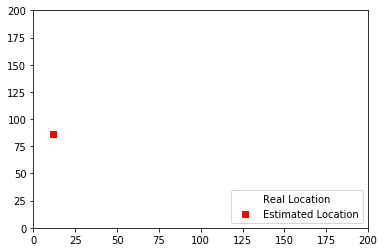

961
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


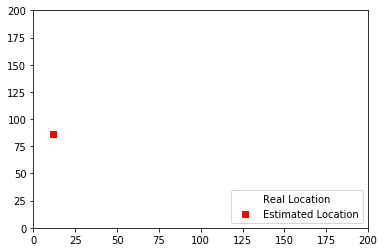

962
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


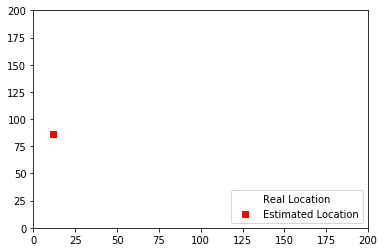

963
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


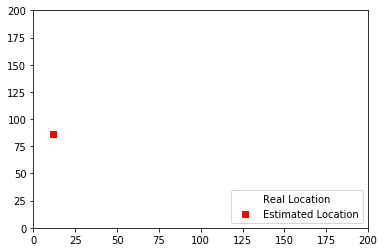

964
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


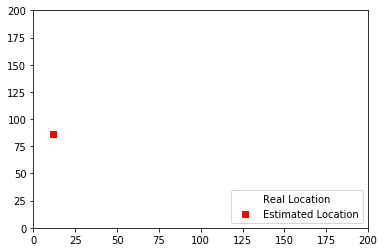

965
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


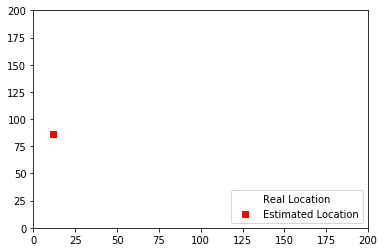

966
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


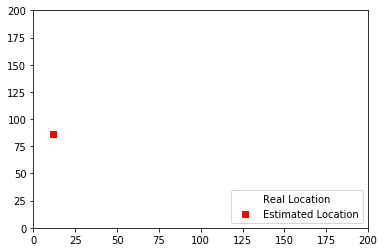

967
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


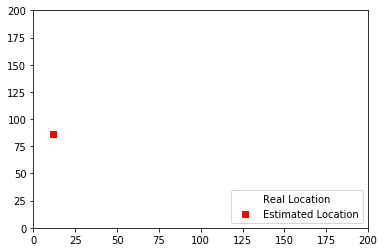

968
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


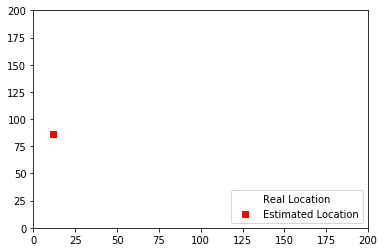

969
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


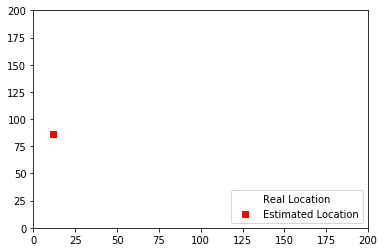

970
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


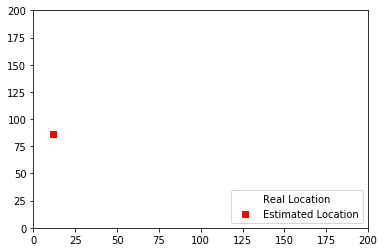

971
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


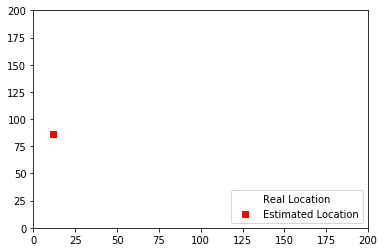

972
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


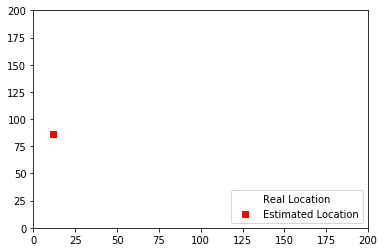

973
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


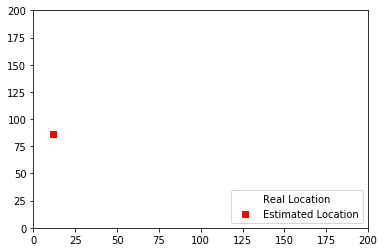

974
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


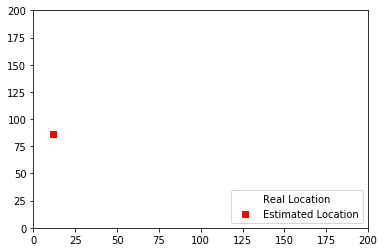

975
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


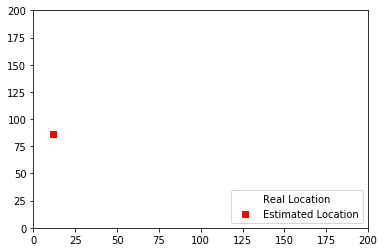

976
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


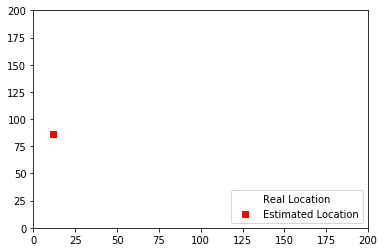

977
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


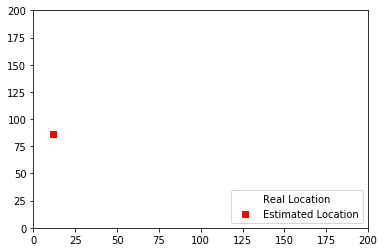

978
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


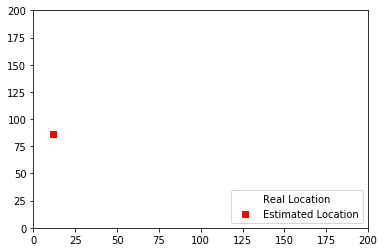

979
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


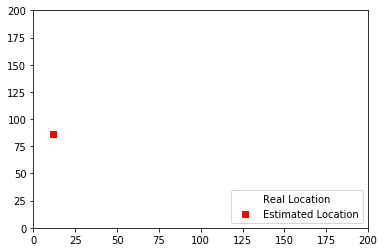

980
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


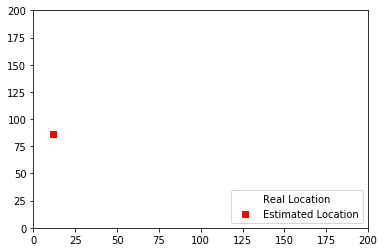

981
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


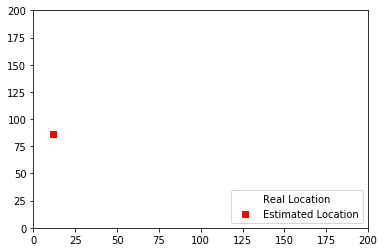

982
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


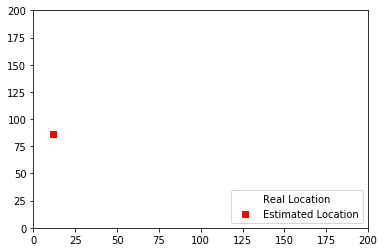

983
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


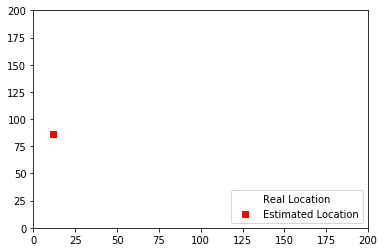

984
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


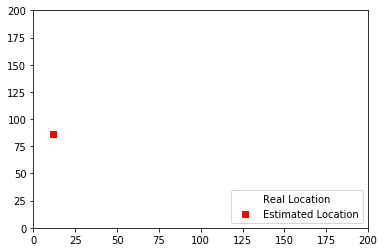

985
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


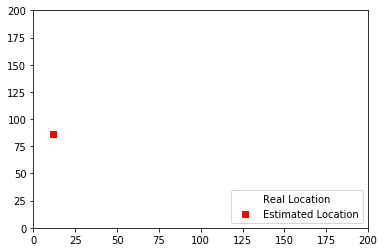

986
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


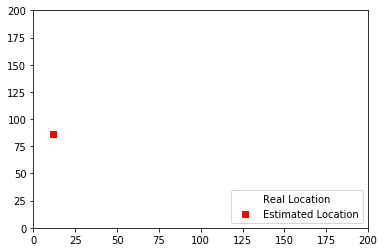

987
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


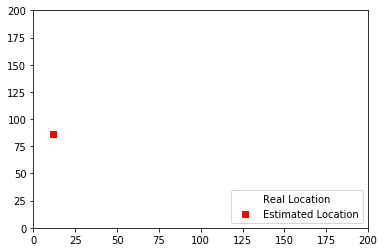

988
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


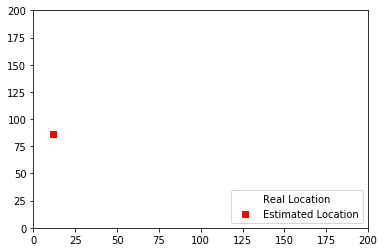

989
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


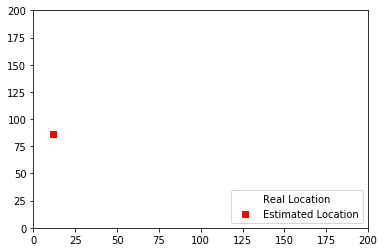

990
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


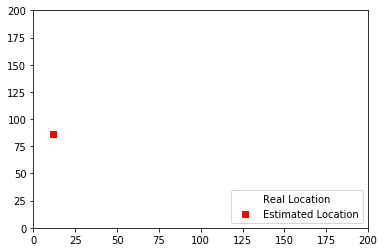

991
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


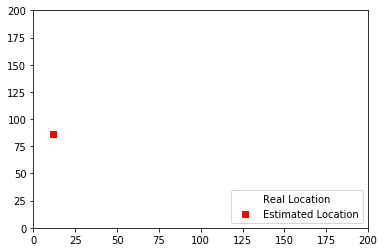

992
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


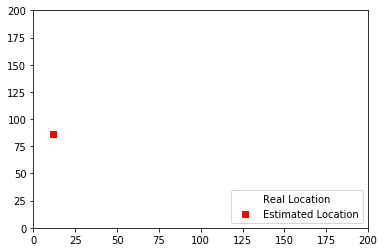

993
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


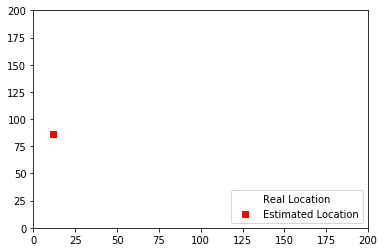

994
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


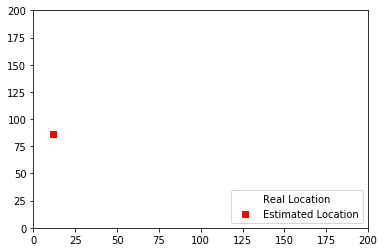

995
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


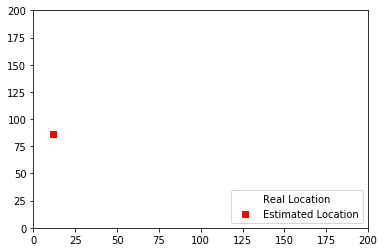

996
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


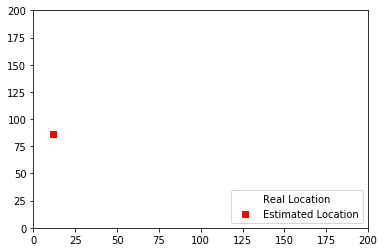

997
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


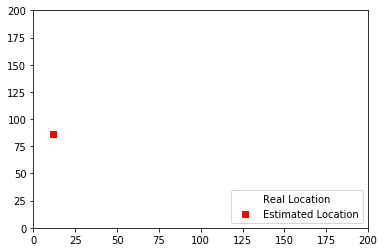

998
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


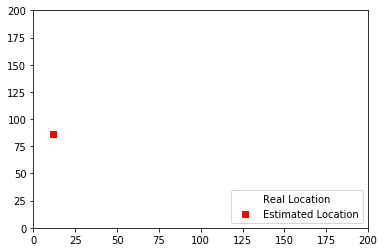

999
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


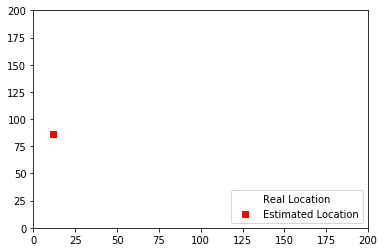

1000
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


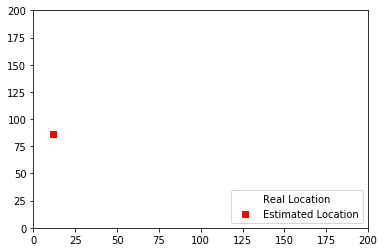

1001
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


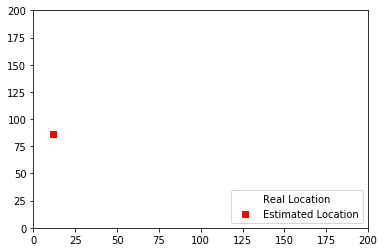

1002
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


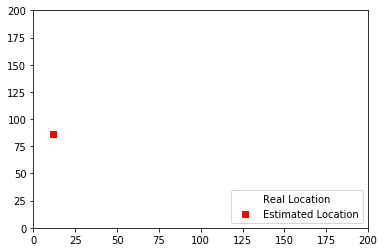

1003
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


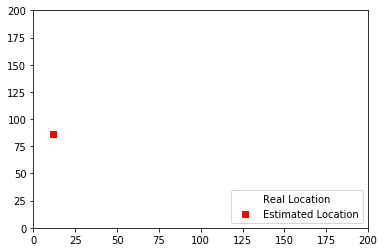

1004
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


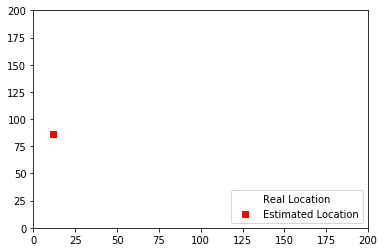

1005
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


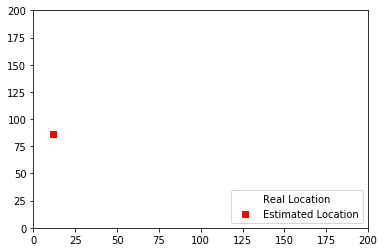

1006
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


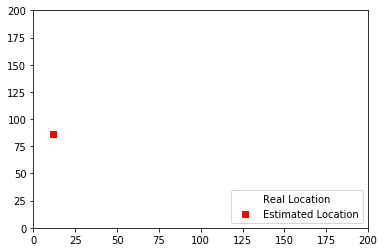

1007
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


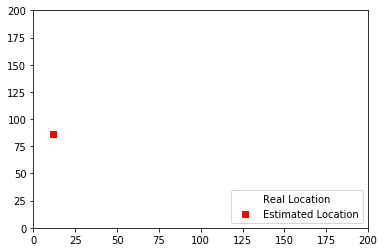

1008
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


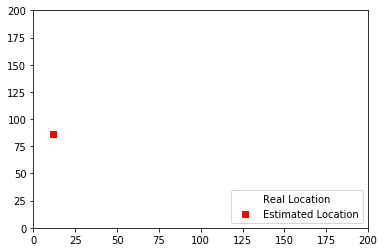

1009
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


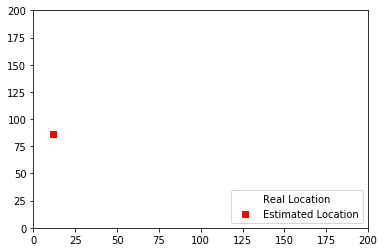

1010
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


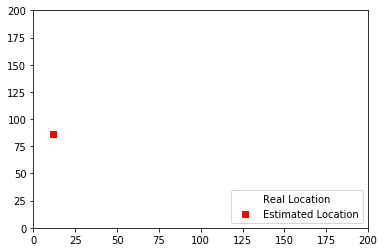

1011
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


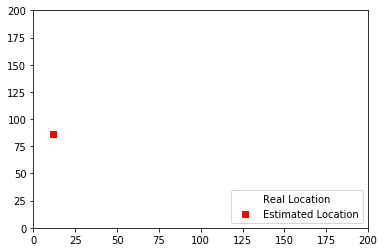

1012
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


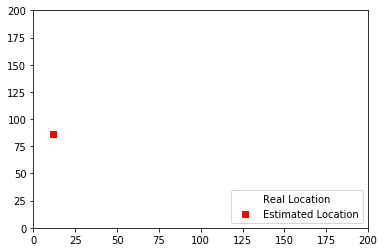

1013
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


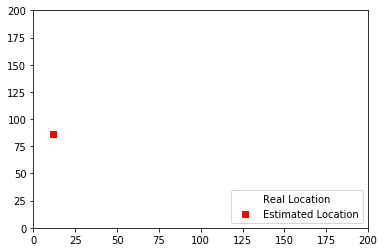

1014
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


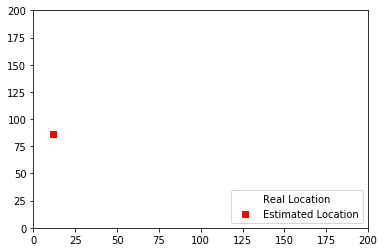

1015
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


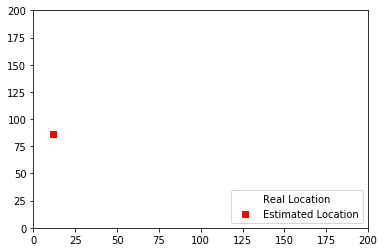

1016
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


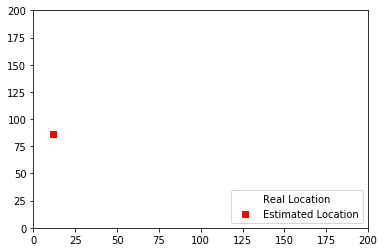

1017
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


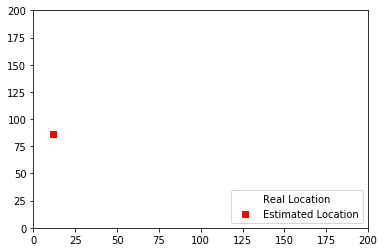

1018
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


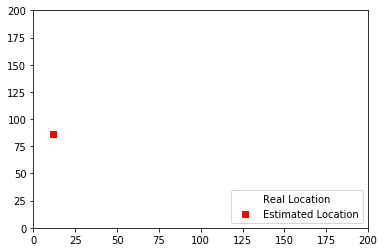

1019
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


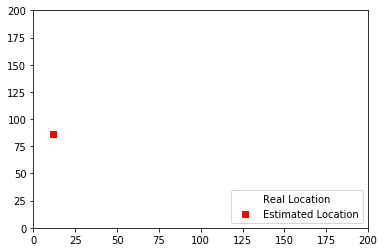

1020
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


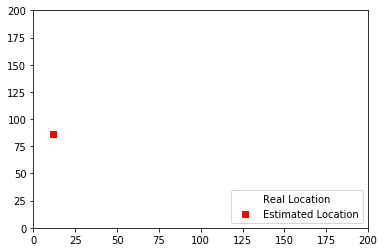

1021
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


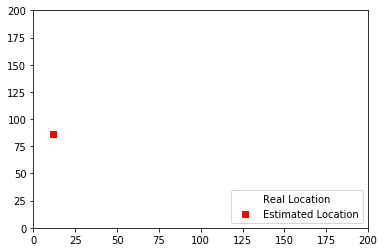

1022
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


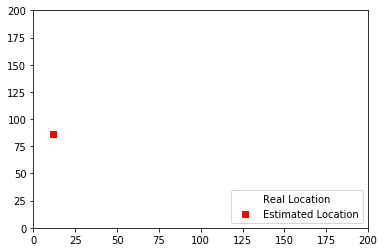

1023
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


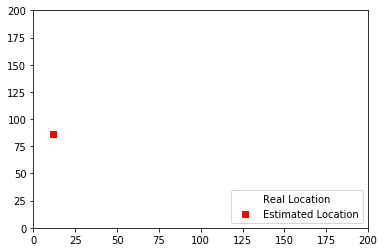

1024
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


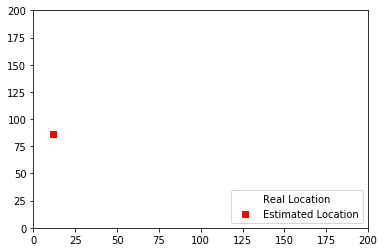

1025
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


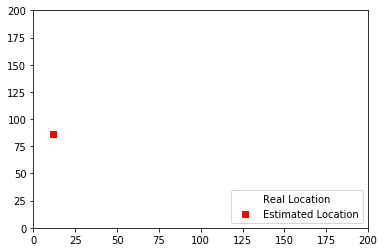

1026
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


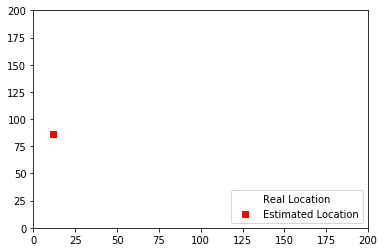

1027
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


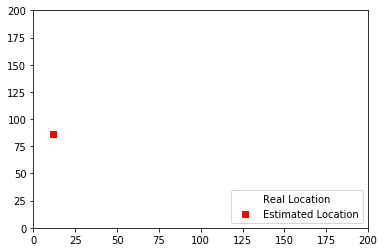

1028
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


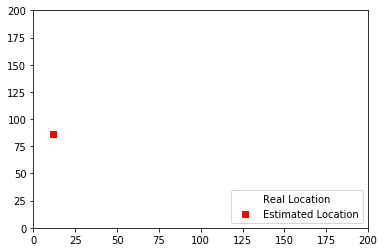

1029
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


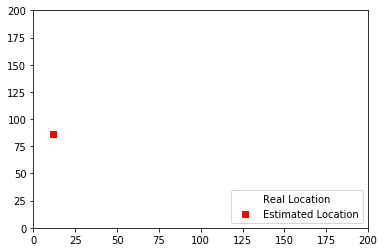

1030
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


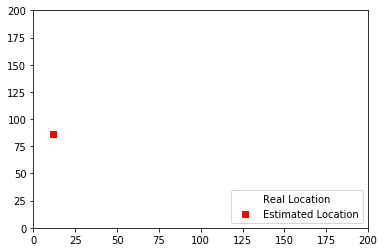

1031
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


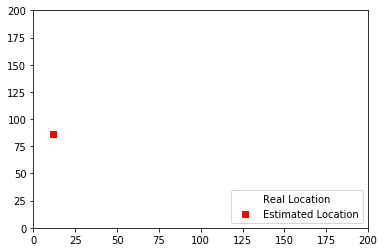

1032
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


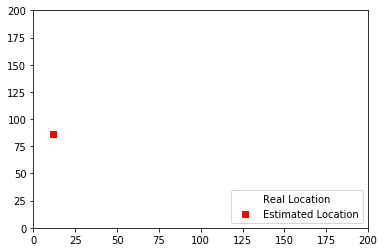

1033
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


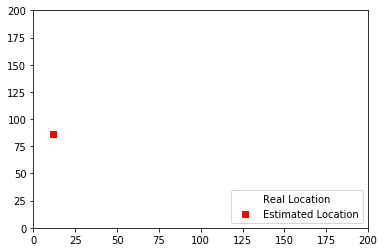

1034
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


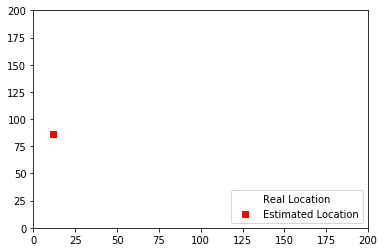

1035
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


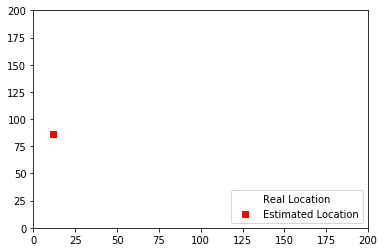

1036
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


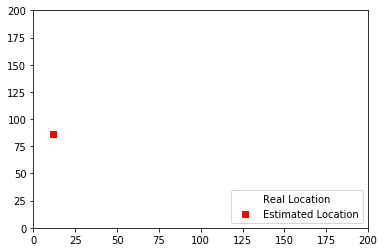

1037
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


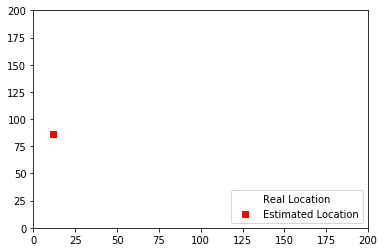

1038
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


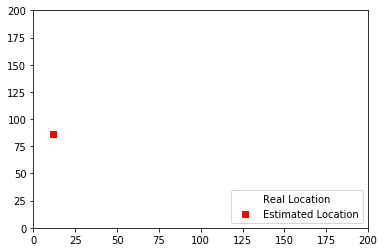

1039
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


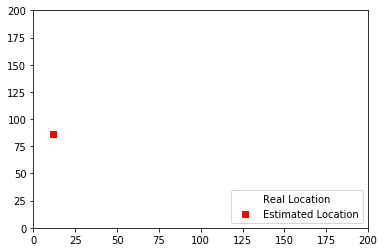

1040
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


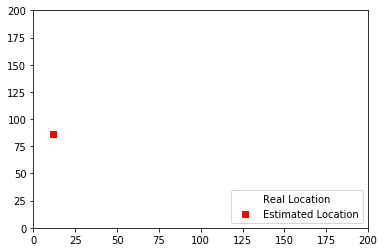

1041
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


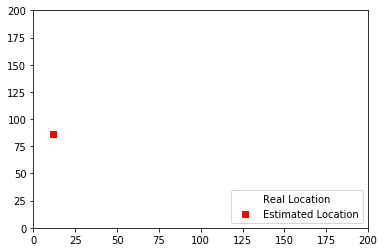

1042
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


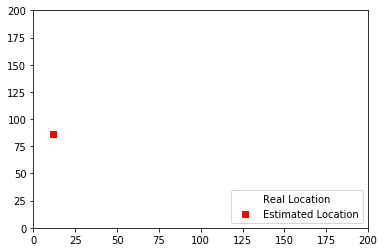

1043
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


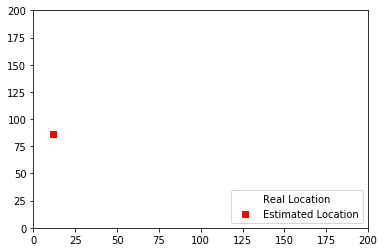

1044
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


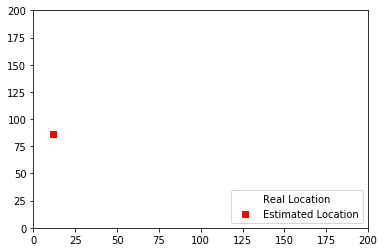

1045
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


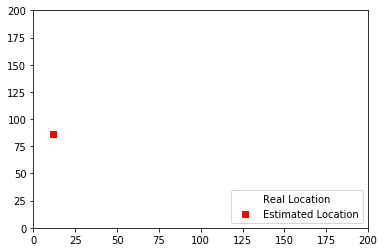

1046
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


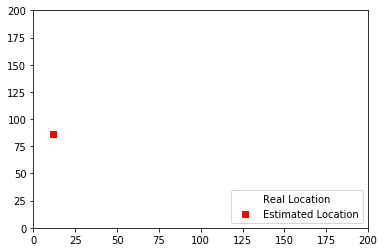

1047
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


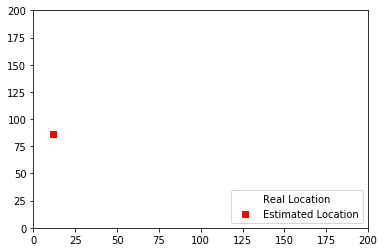

1048
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


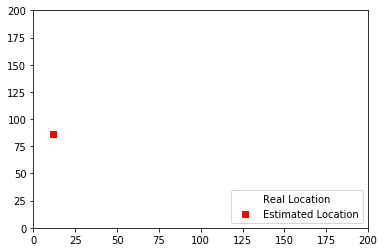

1049
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


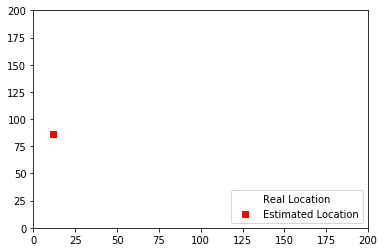

1050
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


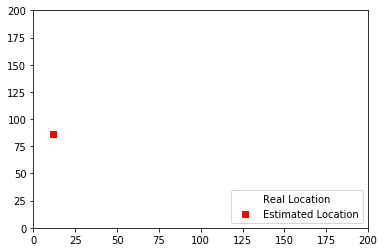

1051
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


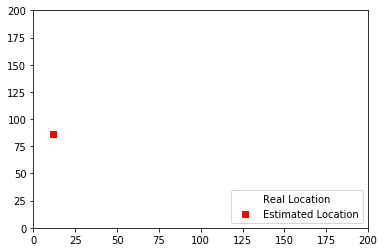

1052
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


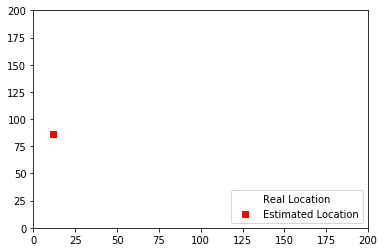

1053
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


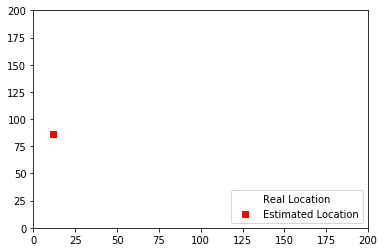

1054
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


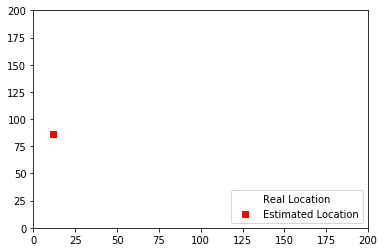

1055
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


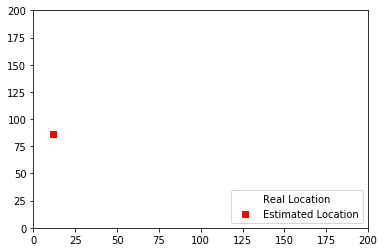

1056
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


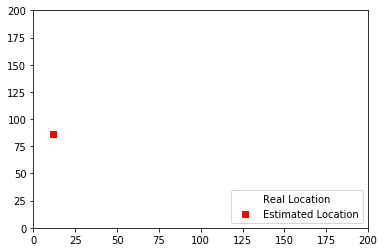

1057
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


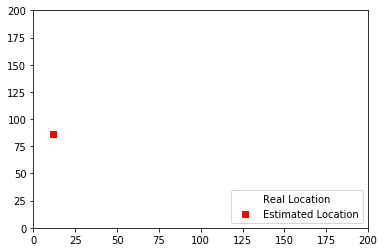

1058
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


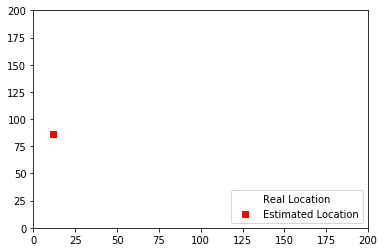

1059
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


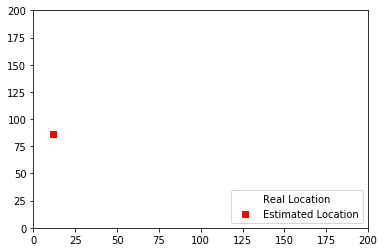

1060
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


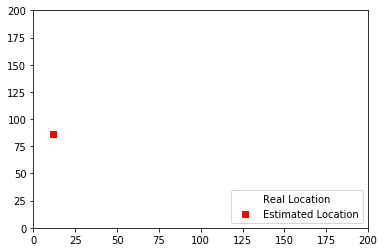

1061
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


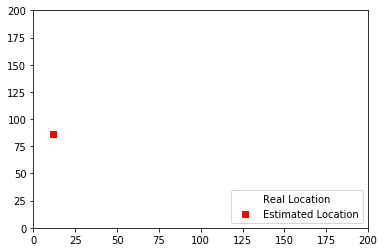

1062
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


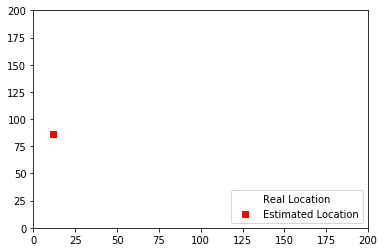

1063
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


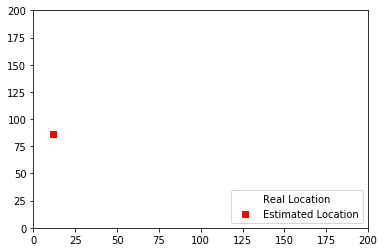

1064
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


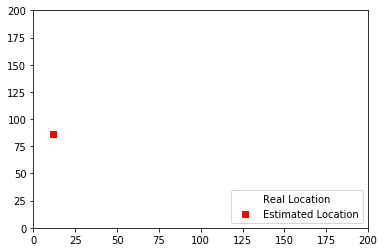

1065
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


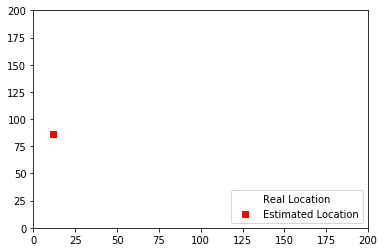

1066
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


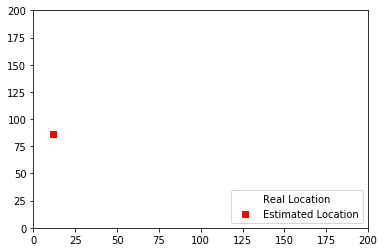

1067
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


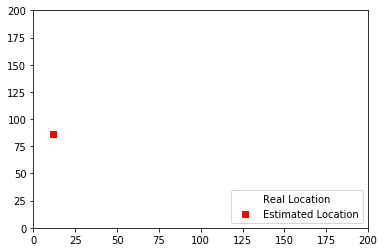

1068
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


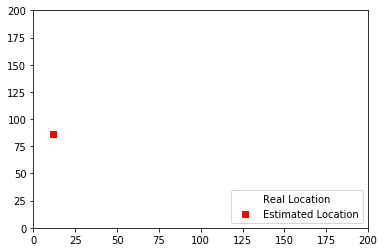

1069
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


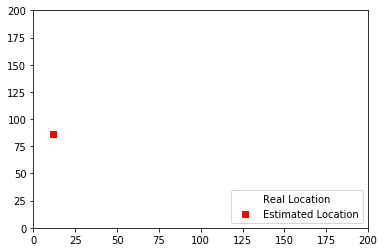

1070
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


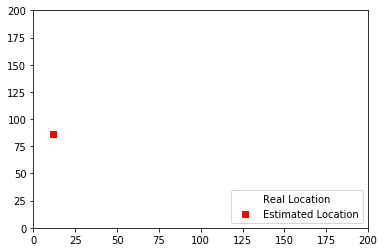

1071
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


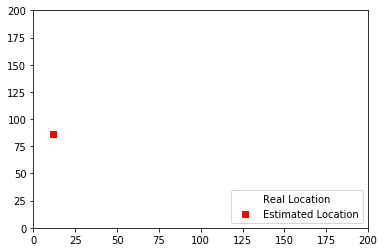

1072
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


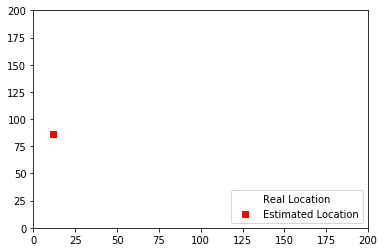

1073
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


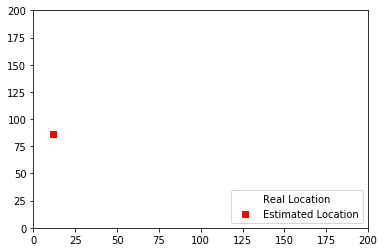

1074
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


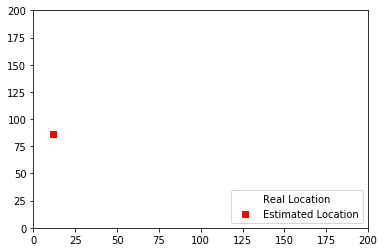

1075
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


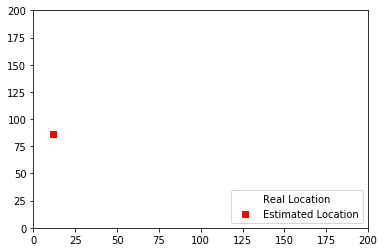

1076
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


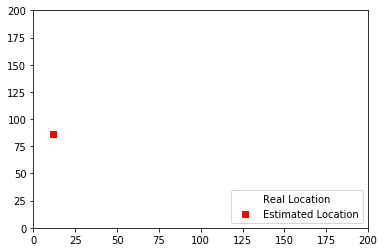

1077
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


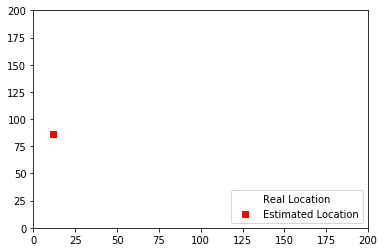

1078
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


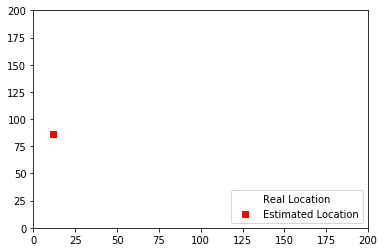

1079
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


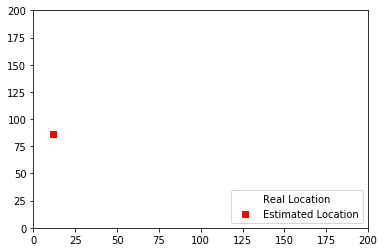

1080
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


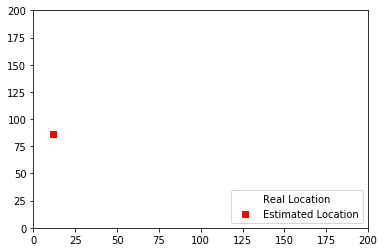

1081
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


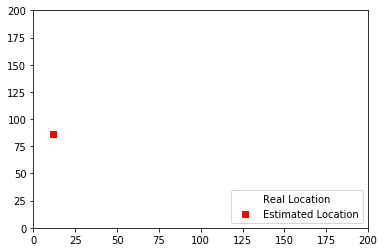

1082
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


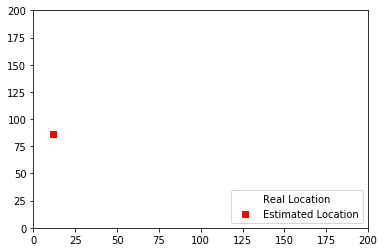

1083
infered loc:
[12.         86.02727273]
real loc:
[ 8.6 86. ]


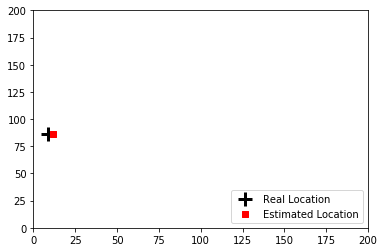

1084
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


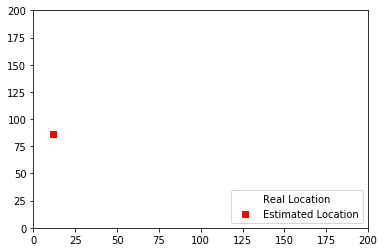

1085
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


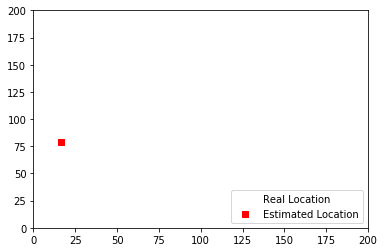

1086
infered loc:
[16.56716418 78.56716418]
real loc:
[15.8 70. ]


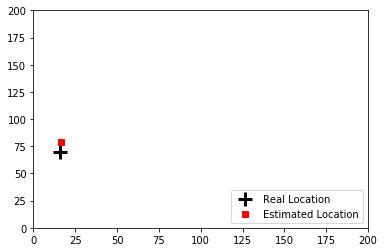

1087
infered loc:
[16.56716418 78.56716418]
real loc:
[19.4 62. ]


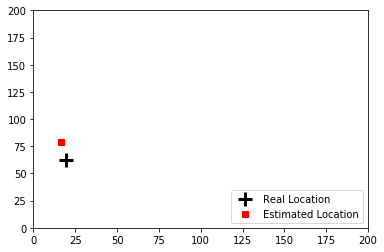

1088
infered loc:
[19.48780488 64.04065041]
real loc:
[19.4 62. ]


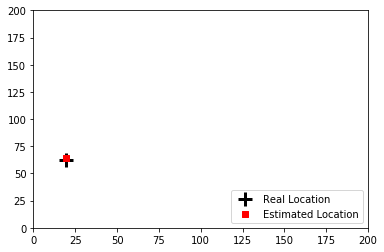

1089
infered loc:
[19.48780488 64.04065041]
real loc:
[nan nan]


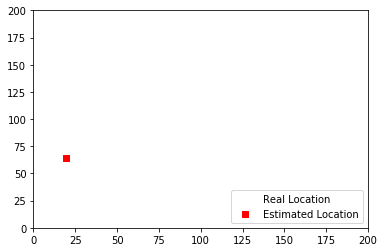

1090
infered loc:
[16.56716418 78.56716418]
real loc:
[ 8.33333 95.33333]


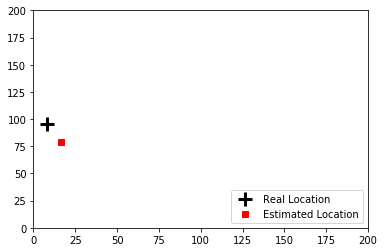

1091
infered loc:
[16.56716418 78.56716418]
real loc:
[ 7.66667 95.06667]


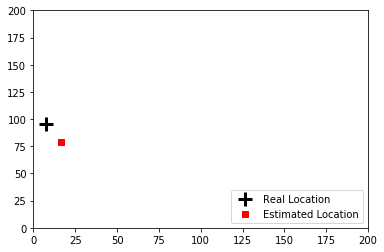

1092
infered loc:
[46.         88.76976744]
real loc:
[53.1 86.2]


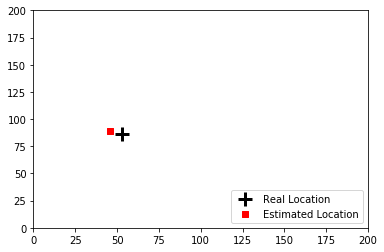

1094
infered loc:
[16.56716418 78.56716418]
real loc:
[32.7 72.6]


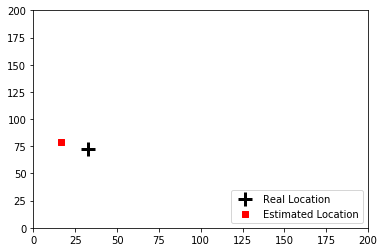

1095
infered loc:
[16.56716418 78.56716418]
real loc:
[31.1 71.8]


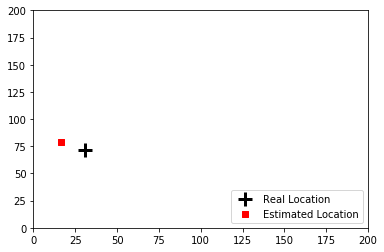

1096
infered loc:
[16.56716418 78.56716418]
real loc:
[nan nan]


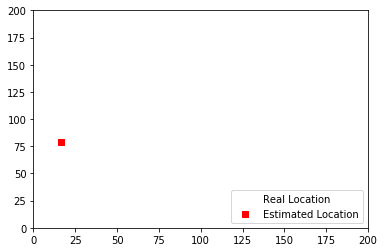

1097
infered loc:
[16.56716418 78.56716418]
real loc:
[30.03571 69.5    ]


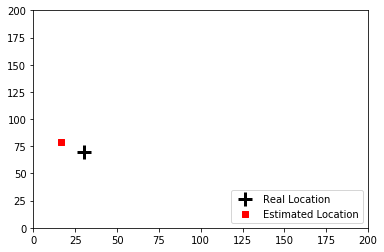

1098
infered loc:
[16.56716418 78.56716418]
real loc:
[30.57143 68.     ]


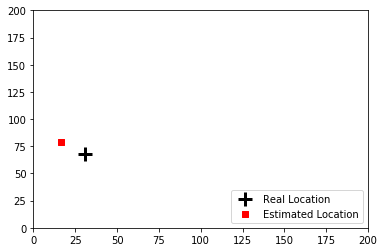

1099
infered loc:
[31.5 66.5]
real loc:
[32.17857 63.5    ]


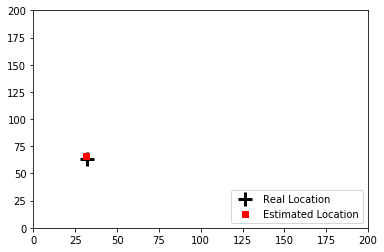

1100
infered loc:
[31.5 66.5]
real loc:
[32.71429 62.     ]


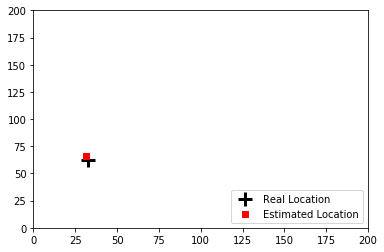

1101
infered loc:
[31.5 66.5]
real loc:
[33.25 60.5 ]


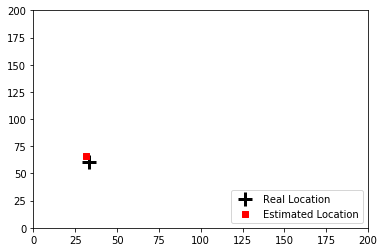

1102
infered loc:
[31.5 66.5]
real loc:
[33.78571 59.     ]


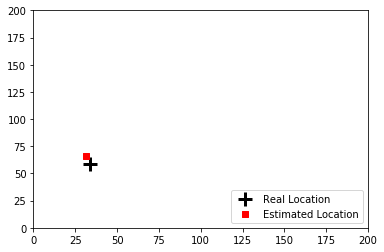

1103
infered loc:
[31.5 66.5]
real loc:
[34.32143 57.5    ]


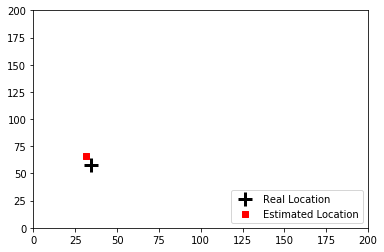

1104
infered loc:
[31.5 66.5]
real loc:
[34.85714 56.     ]


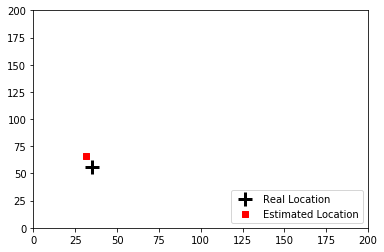

1105
infered loc:
[31.5 66.5]
real loc:
[35.39286 54.5    ]


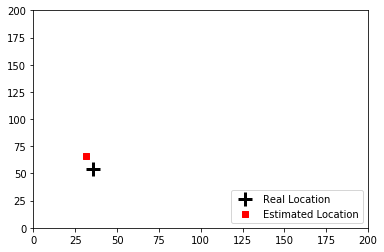

1106
infered loc:
[42.         62.02727273]
real loc:
[35.92857 53.     ]


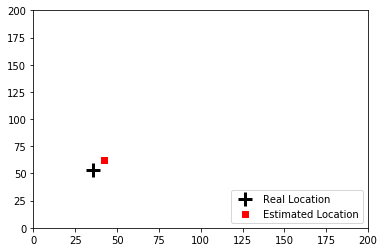

1107
infered loc:
[42.         62.02727273]
real loc:
[36.46429 51.5    ]


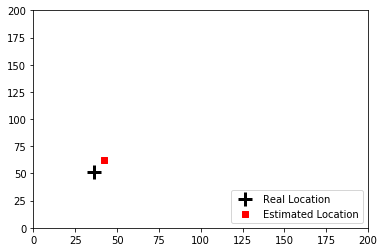

1109
infered loc:
[31.5 66.5]
real loc:
[12.78571 66.71429]


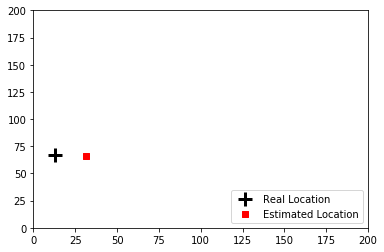

1110
infered loc:
[19.48780488 64.04065041]
real loc:
[12.78571 66.71429]


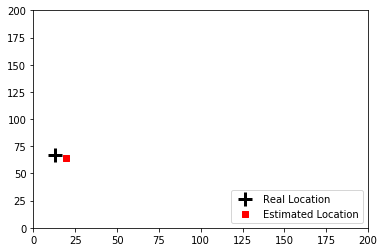

1111
infered loc:
[19.48780488 64.04065041]
real loc:
[11.39286 66.35714]


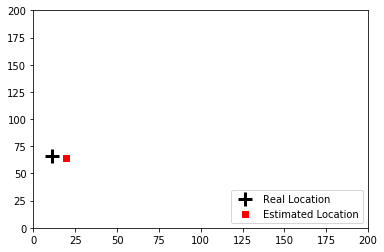

1112
infered loc:
[19.48780488 64.04065041]
real loc:
[11.39286 66.35714]


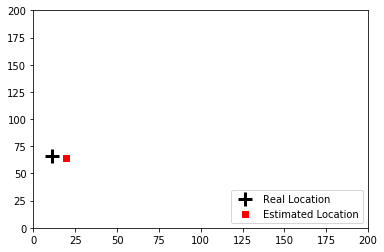

1113
infered loc:
[49.5 57. ]
real loc:
[56.05 45.8 ]


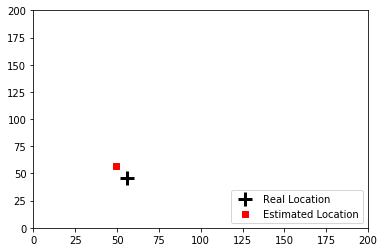

1121
infered loc:
[46.         88.76976744]
real loc:
[42.      79.18182]


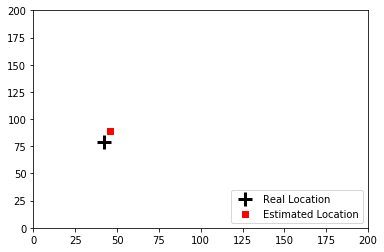

1122
infered loc:
[46.         88.76976744]
real loc:
[57. 89.]


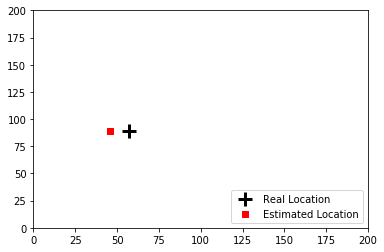

1123
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


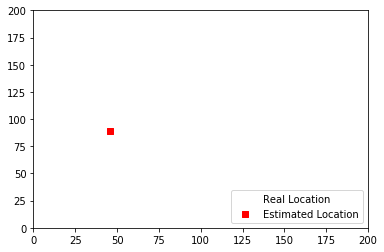

1124
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


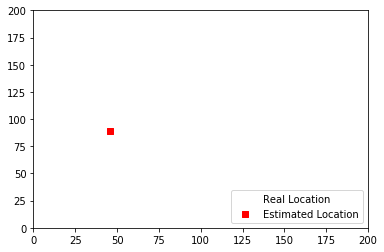

1125
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


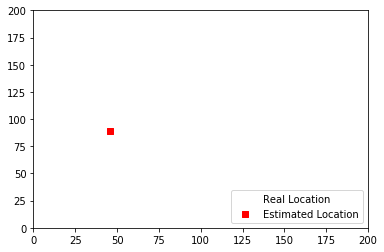

1126
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


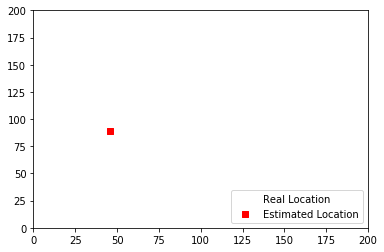

1127
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


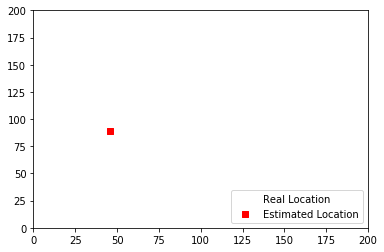

1128
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


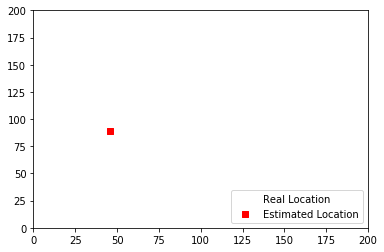

1129
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


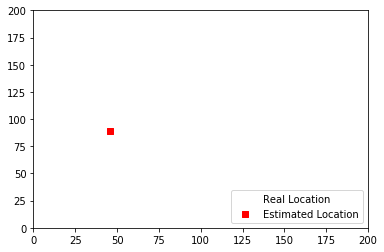

1130
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


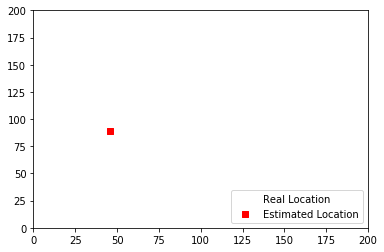

1131
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


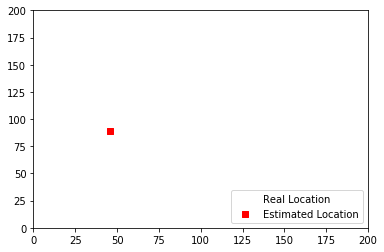

1132
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


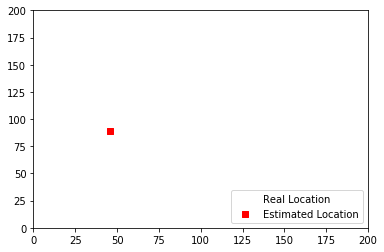

1133
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


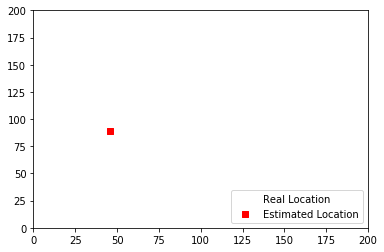

1134
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


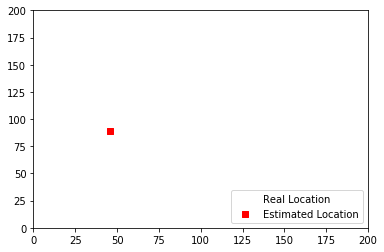

1135
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


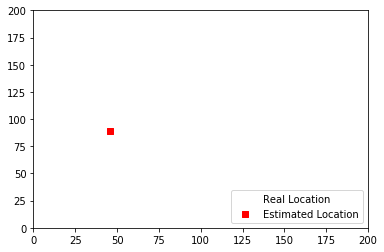

1136
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


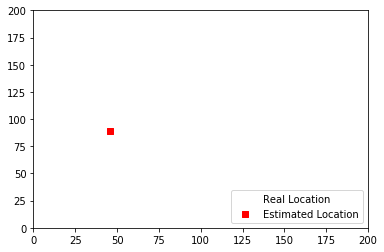

1137
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


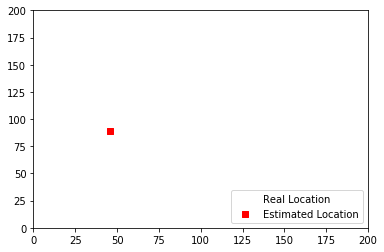

1138
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


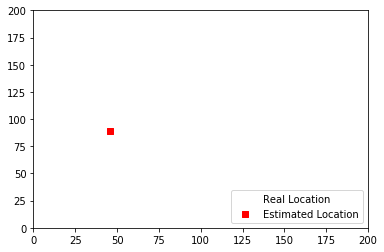

1139
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


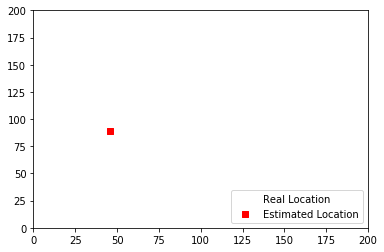

1140
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


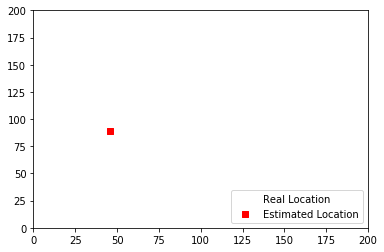

1141
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


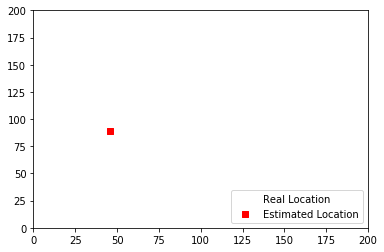

1142
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


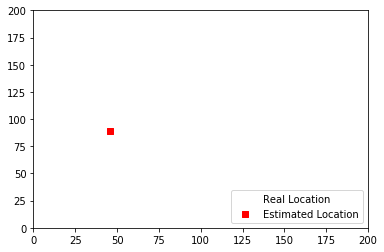

1143
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


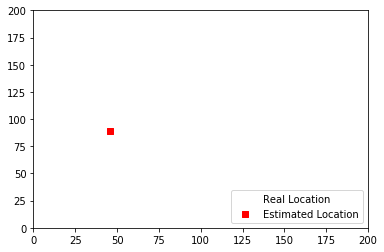

1144
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


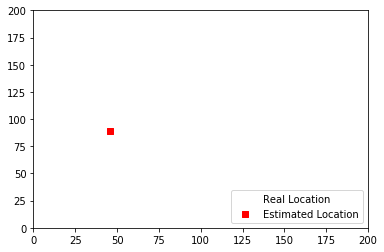

1145
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


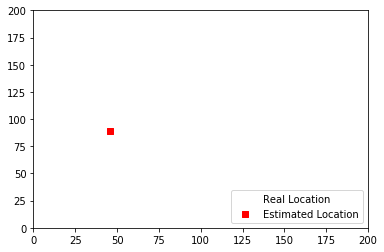

1146
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


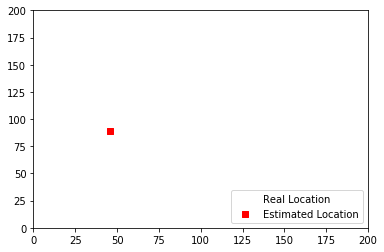

1147
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


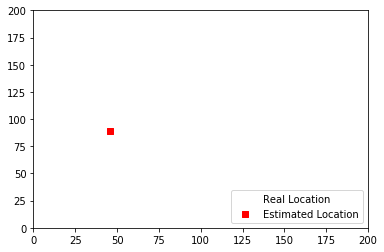

1148
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


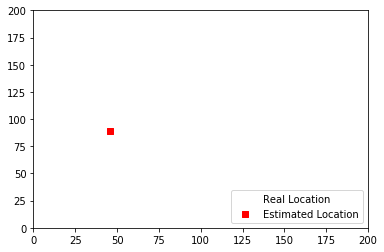

1149
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


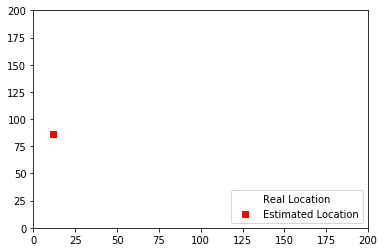

1150
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


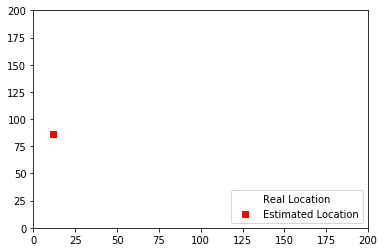

1151
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


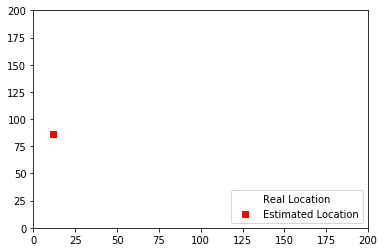

1152
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


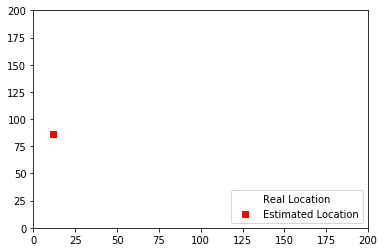

1153
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


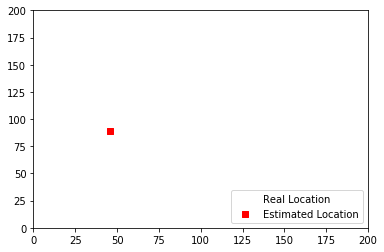

1154
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


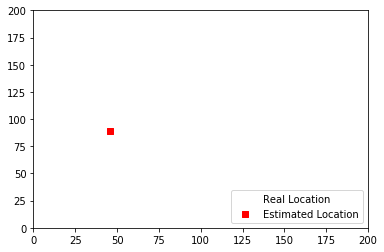

1155
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


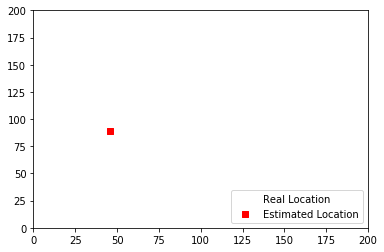

1156
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


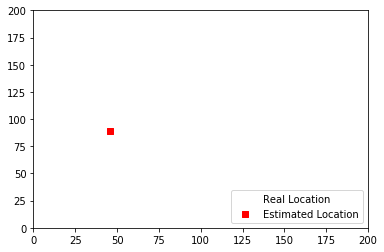

1157
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


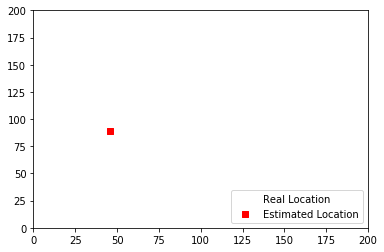

1158
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


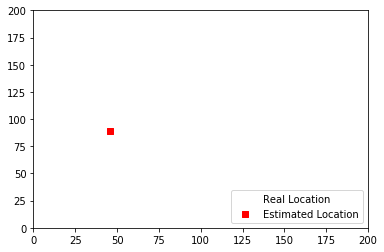

1159
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


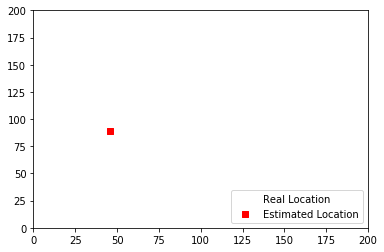

1160
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


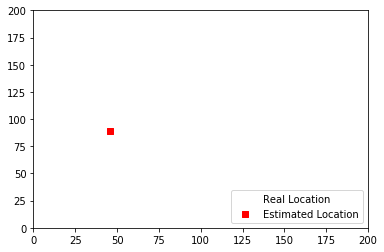

1161
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


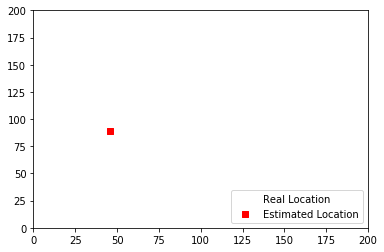

1162
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


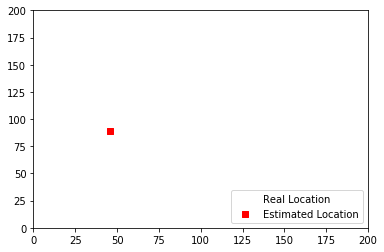

1163
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


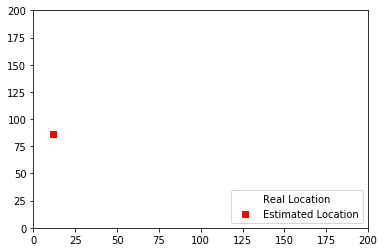

1164
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


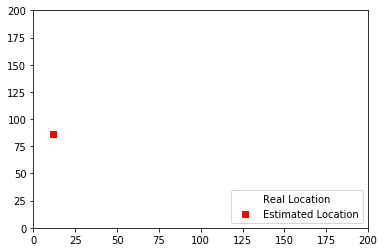

1165
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


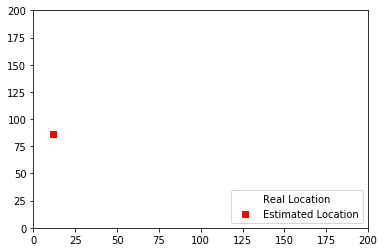

1166
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


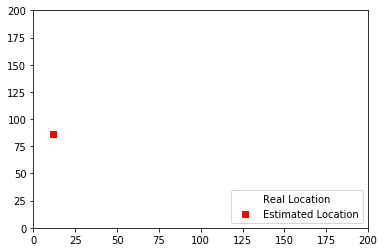

1167
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


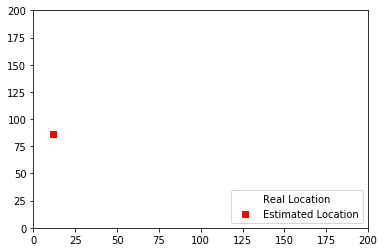

1168
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


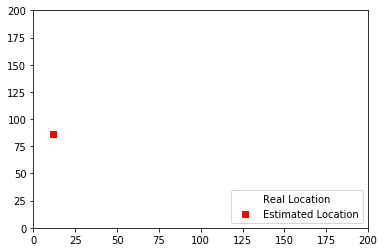

1169
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


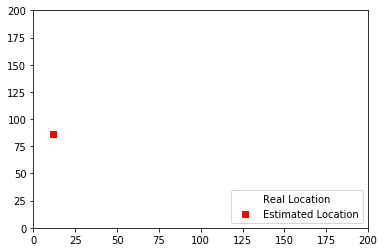

1170
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


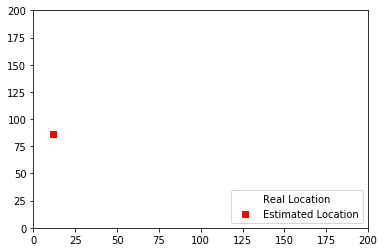

1171
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


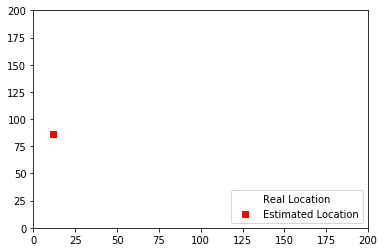

1172
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


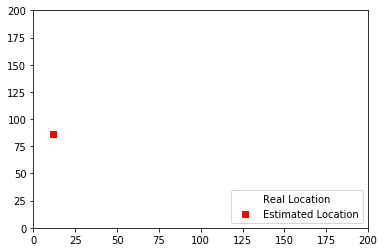

1173
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


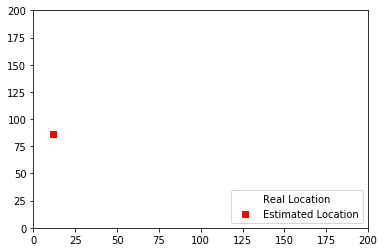

1174
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


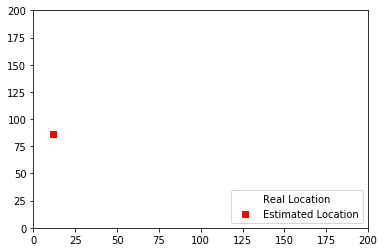

1175
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


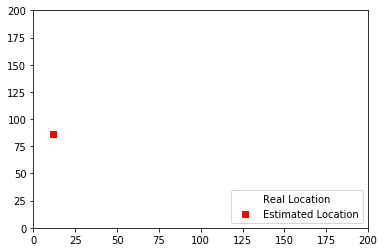

1176
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


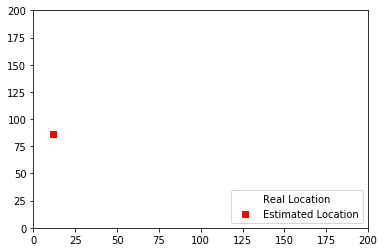

1177
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


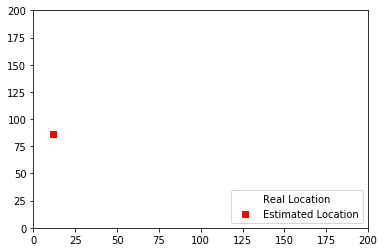

1178
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


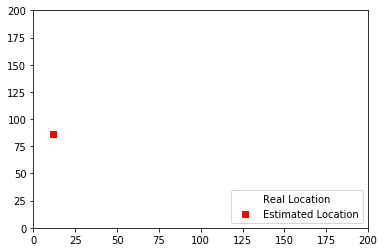

1179
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


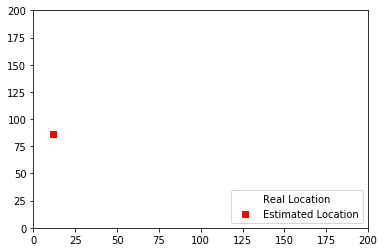

1180
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


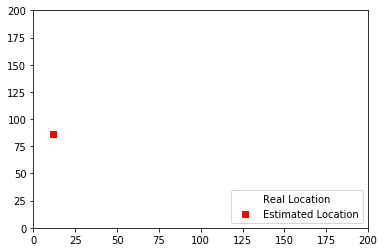

1181
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


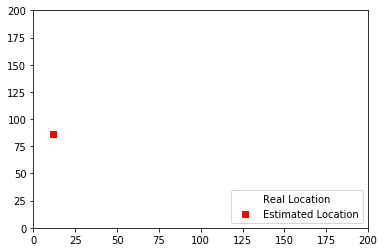

1182
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


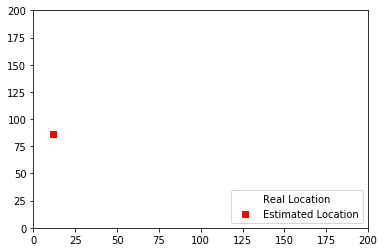

1183
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


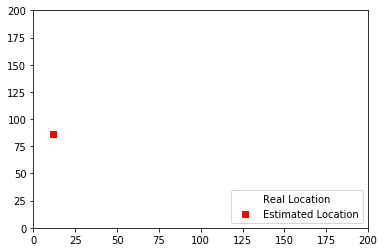

1184
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


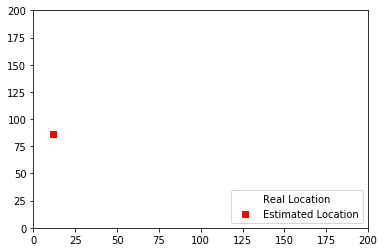

1185
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


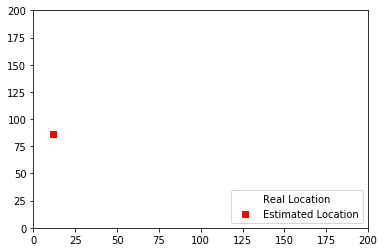

1186
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


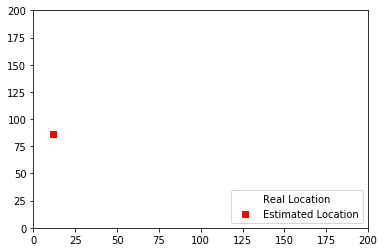

1187
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


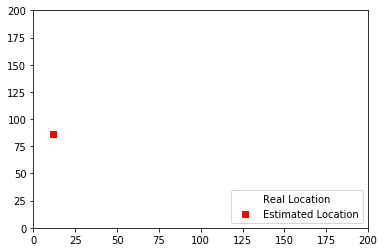

1188
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


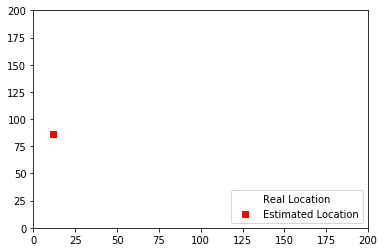

1189
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


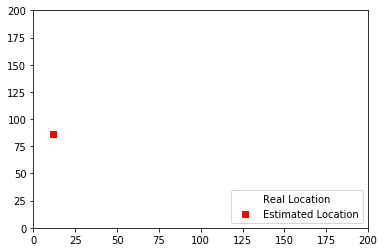

1190
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


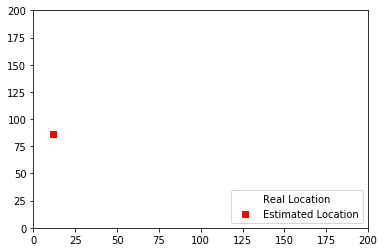

1191
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


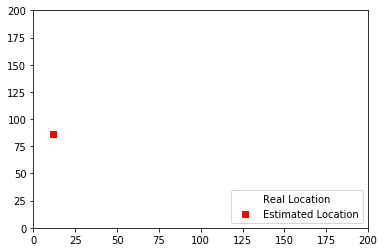

1192
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


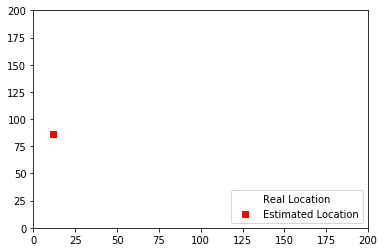

1193
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


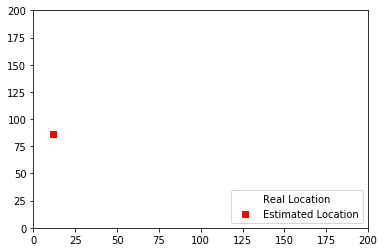

1194
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


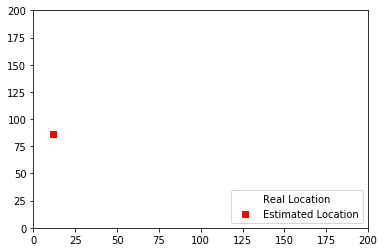

1195
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


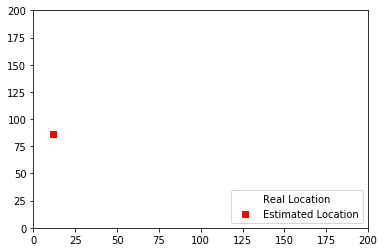

1196
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


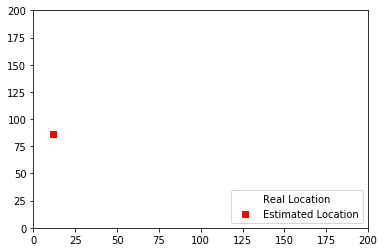

1197
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


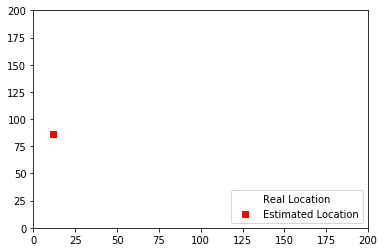

1198
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


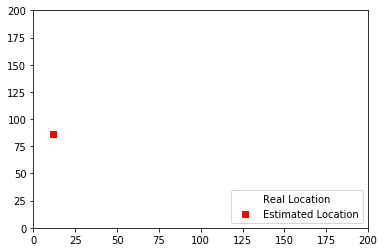

1199
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


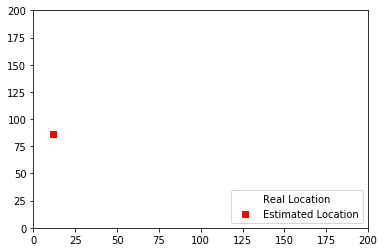

1200
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


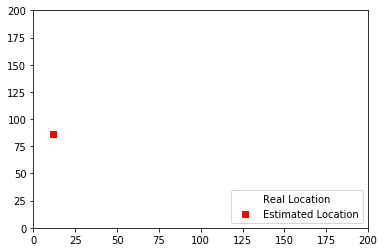

1201
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


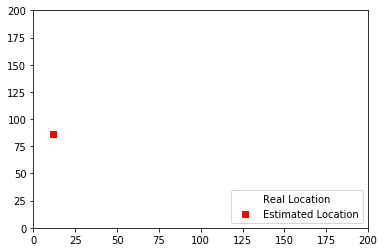

1202
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


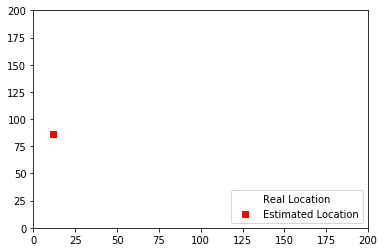

1203
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


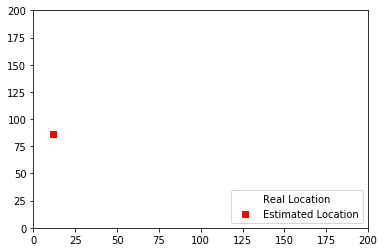

1204
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


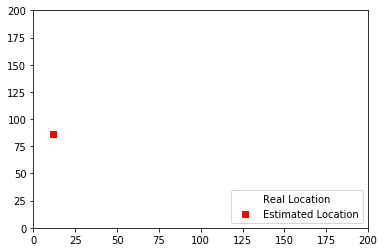

1205
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


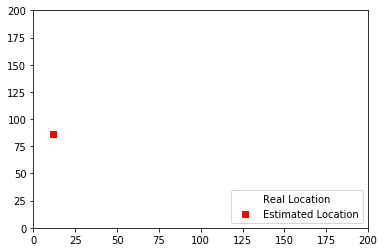

1206
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


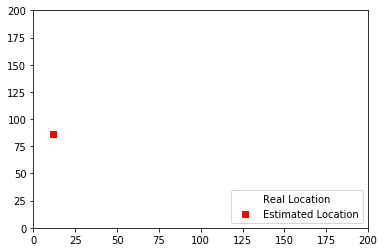

1207
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


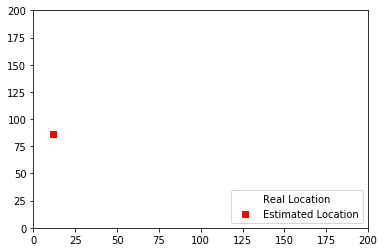

1208
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


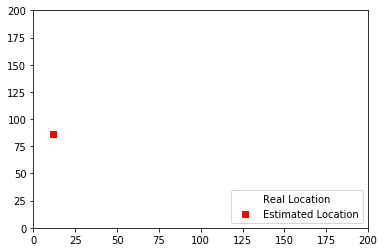

1209
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


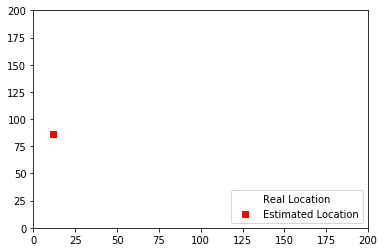

1210
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


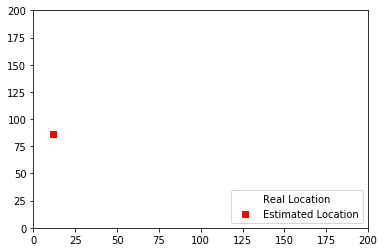

1211
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


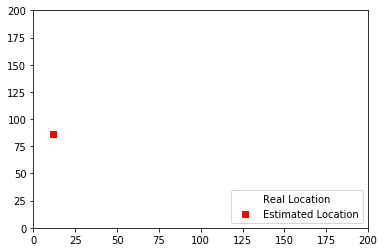

1212
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


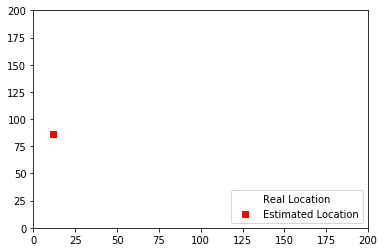

1213
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


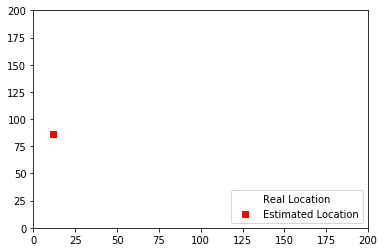

1214
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


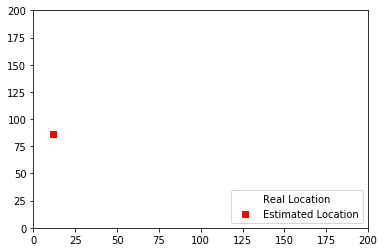

1215
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


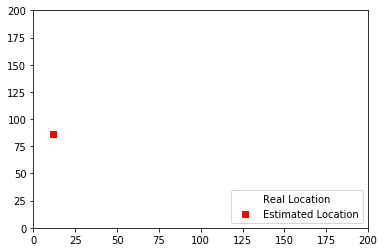

1216
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


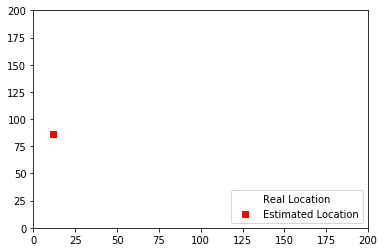

1217
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


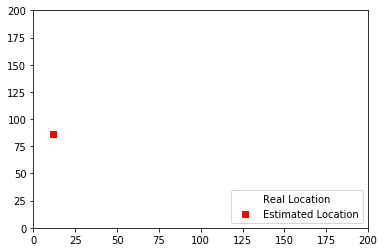

1218
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


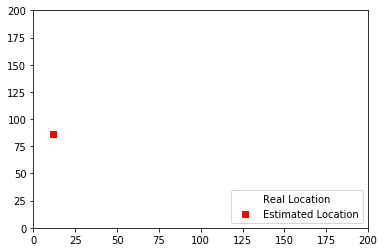

1219
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


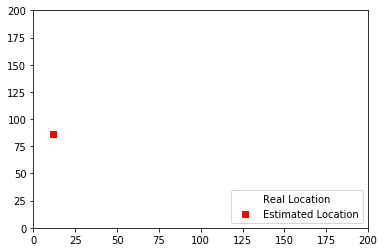

1220
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


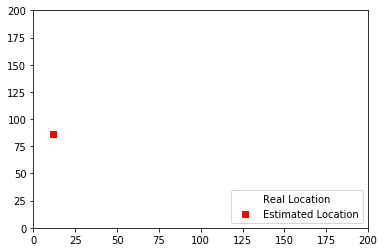

1221
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


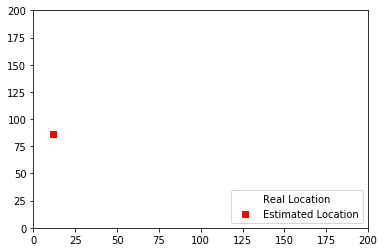

1222
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


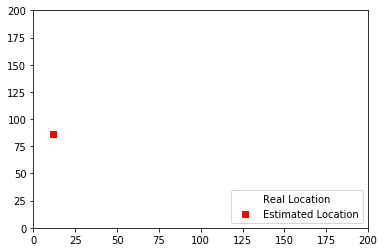

1223
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


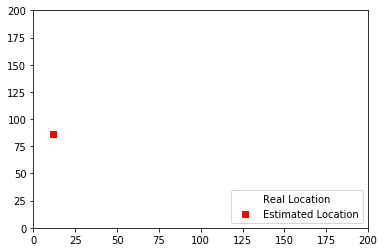

1224
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


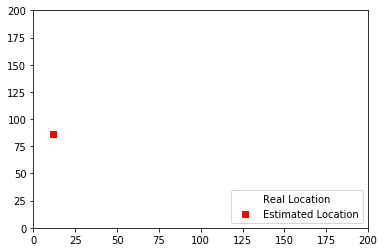

1225
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


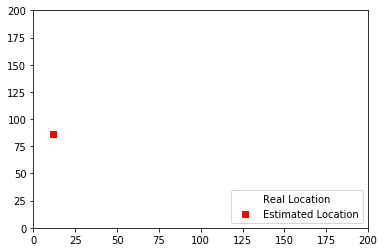

1226
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


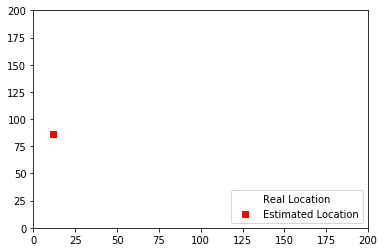

1227
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


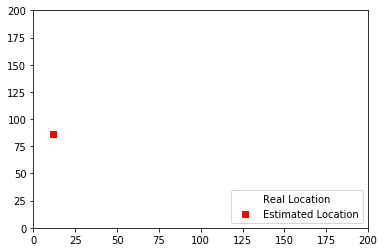

1228
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


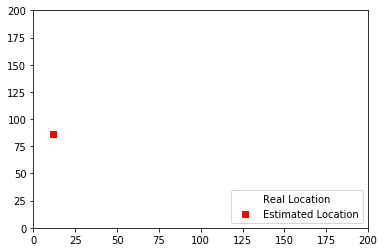

1229
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


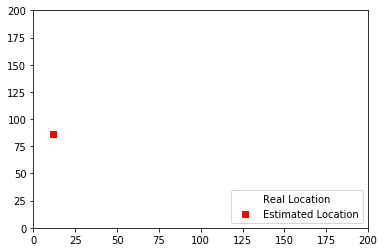

1230
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


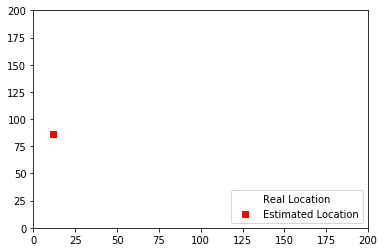

1231
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


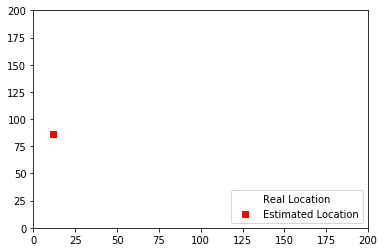

1232
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


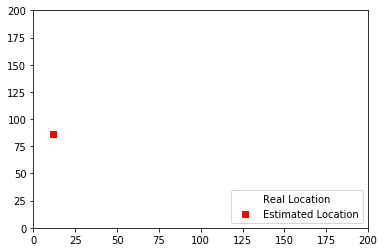

1233
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


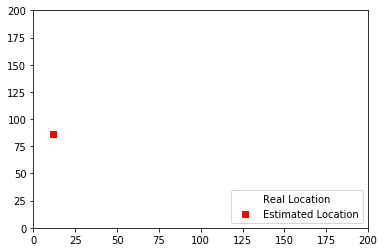

1234
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


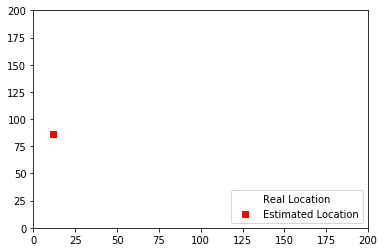

1235
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


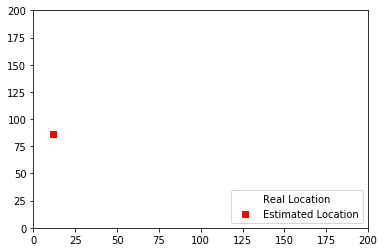

1236
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


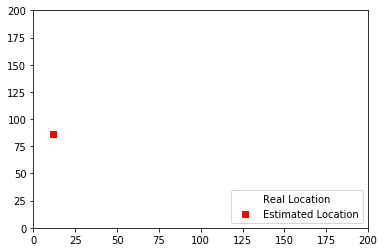

1237
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


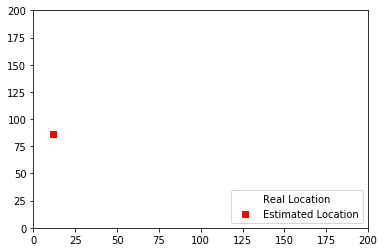

1238
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


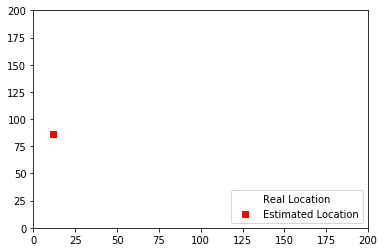

1239
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


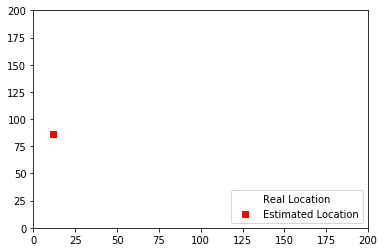

1240
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


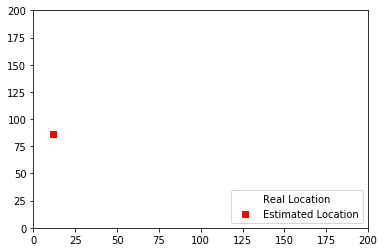

1241
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


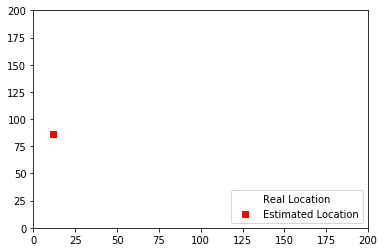

1242
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


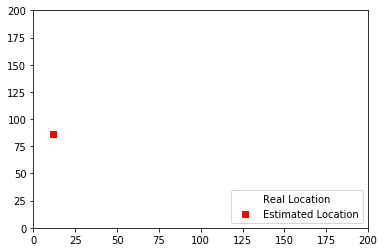

1243
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


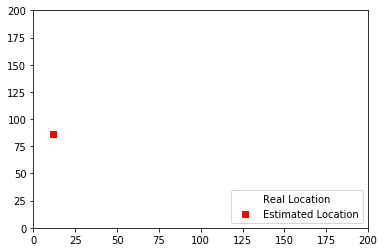

1244
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


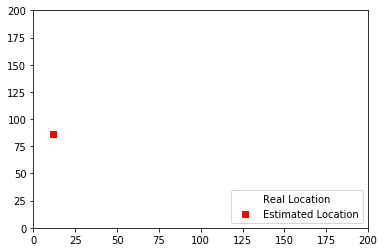

1245
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


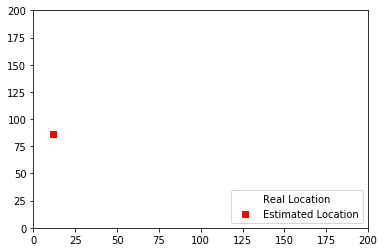

1246
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


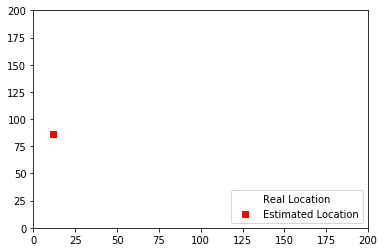

1247
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


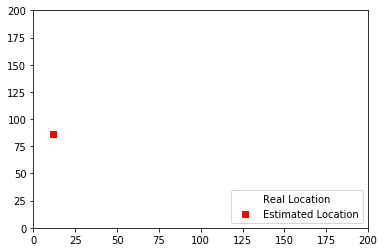

1248
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


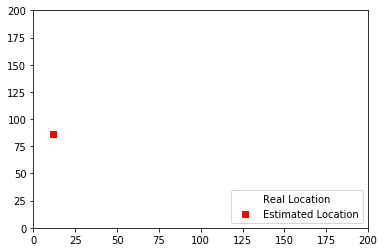

1249
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


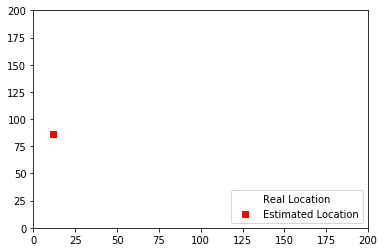

1250
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


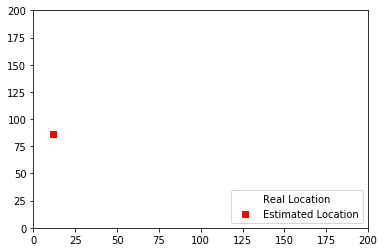

1251
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


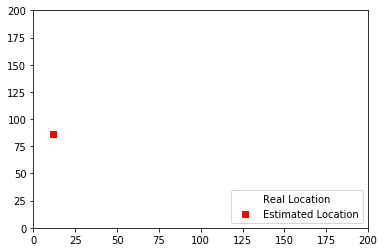

1252
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


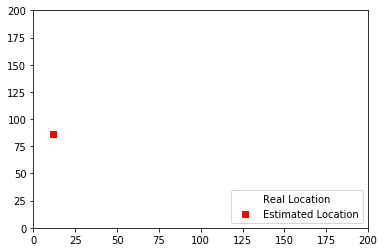

1253
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


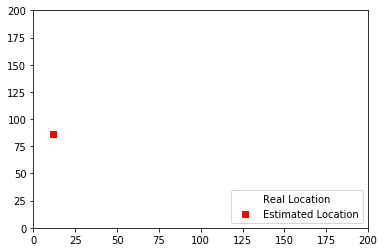

1254
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


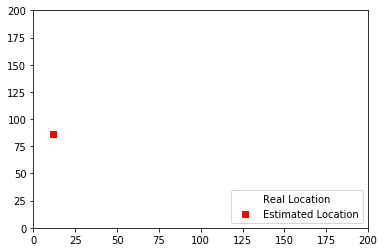

1255
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


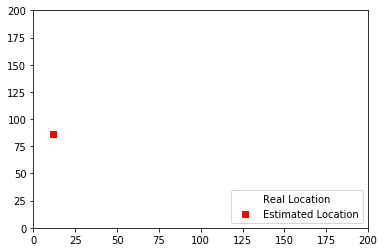

1256
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


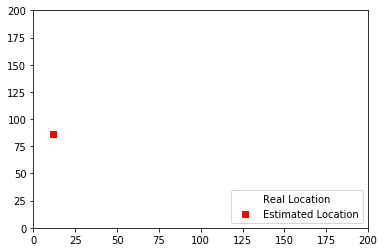

1257
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


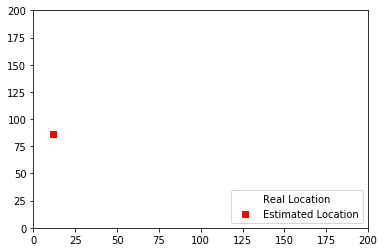

1258
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


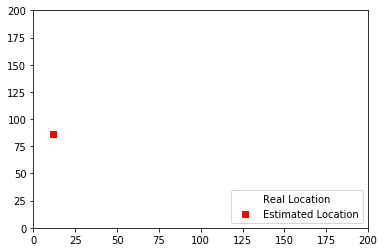

1259
infered loc:
[12.         86.02727273]
real loc:
[13.66667 84.83333]


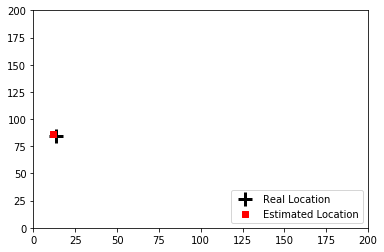

1260
infered loc:
[46.         88.76976744]
real loc:
[39.66667 87.33333]


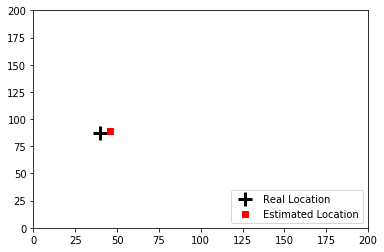

1261
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


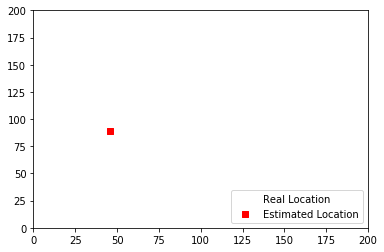

1262
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


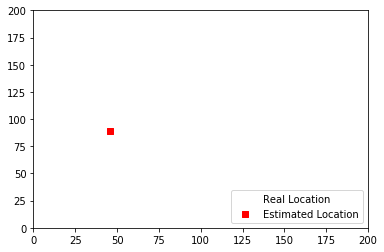

1263
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


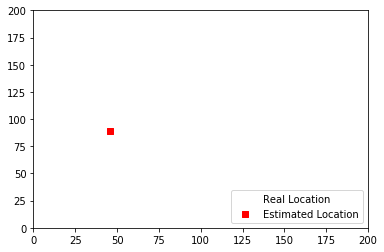

1264
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


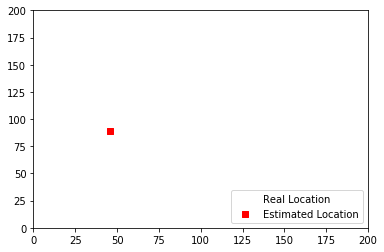

1265
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


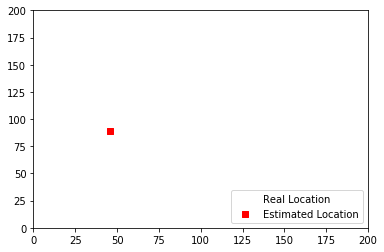

1266
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


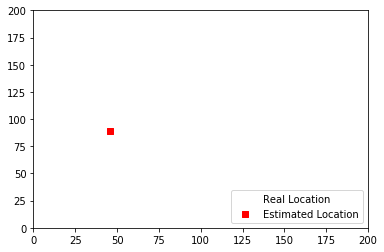

1267
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


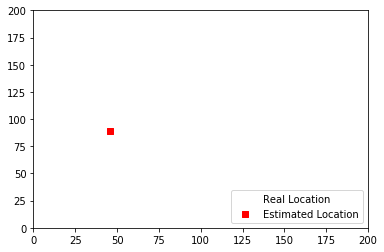

1269
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


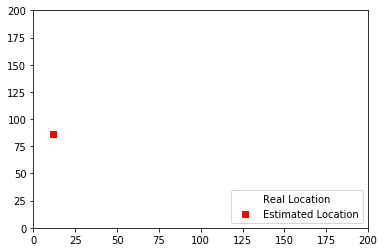

1270
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


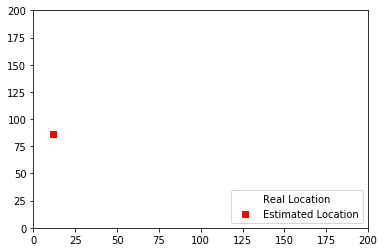

1271
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


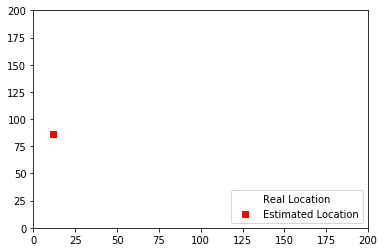

1272
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


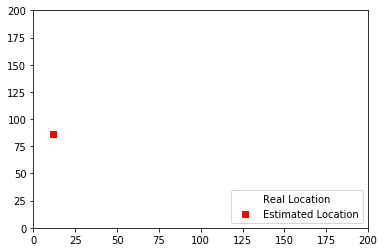

1273
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


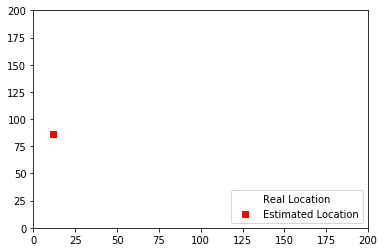

1274
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


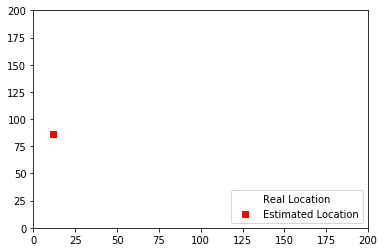

1275
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


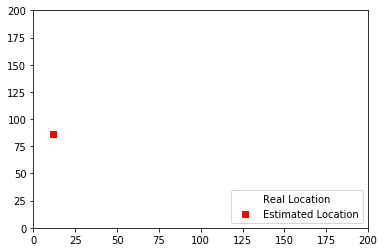

1276
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


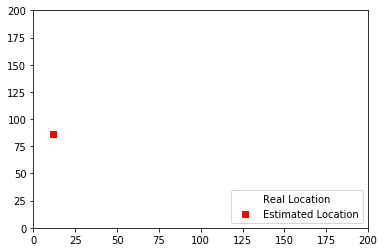

1277
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


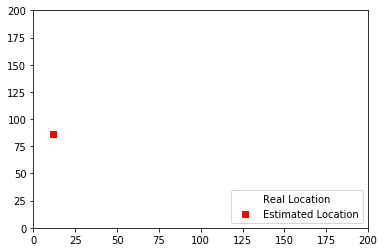

1278
infered loc:
[46.         88.76976744]
real loc:
[nan nan]


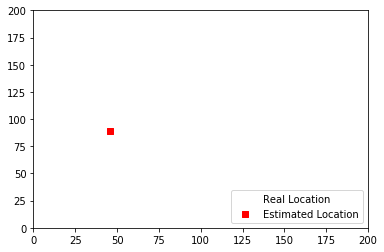

1279
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


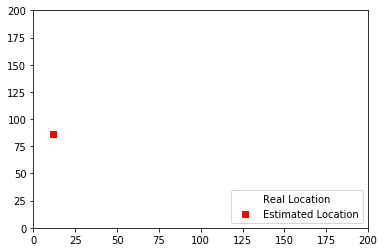

1280
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


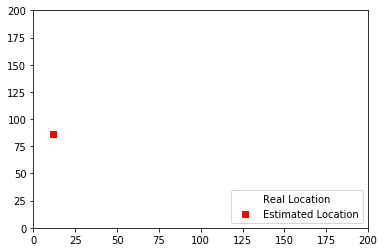

1281
infered loc:
[12.         86.02727273]
real loc:
[nan nan]


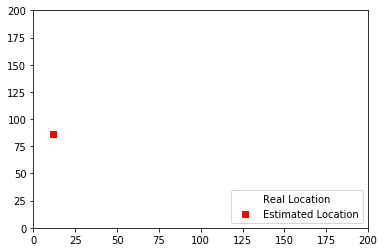

1282
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


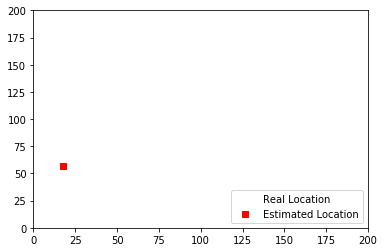

1283
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


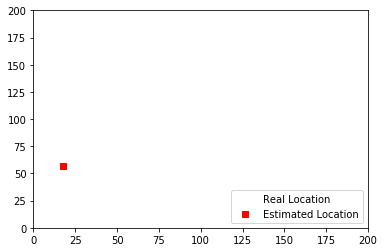

1284
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


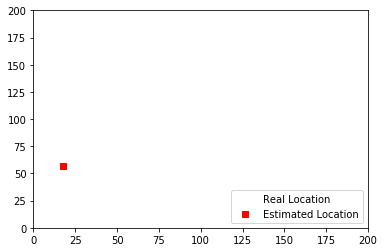

1285
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


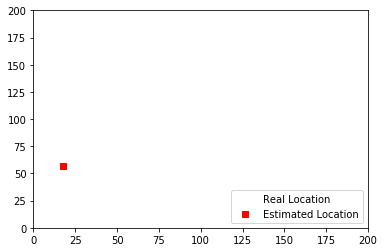

1286
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


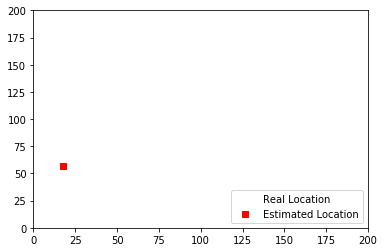

1287
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


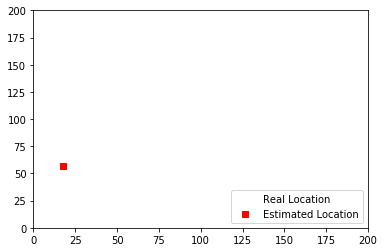

1288
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


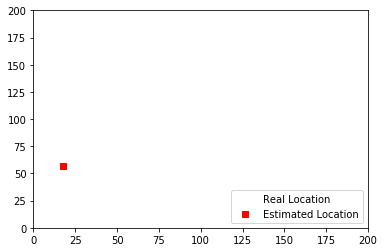

1289
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


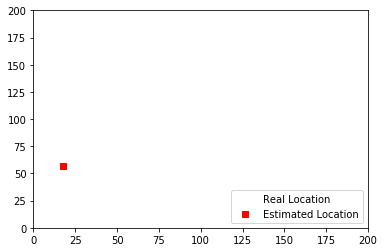

1290
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


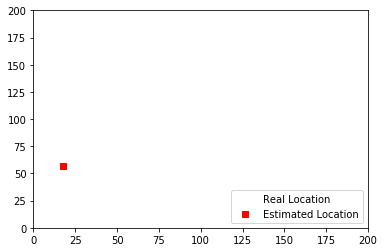

1291
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


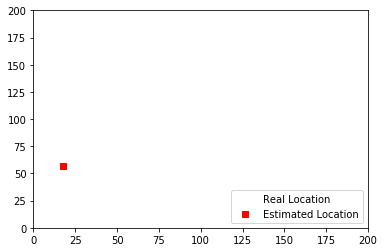

1292
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


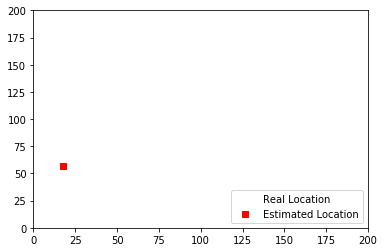

1293
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


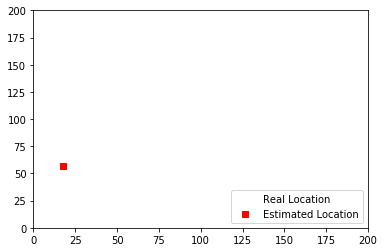

1294
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


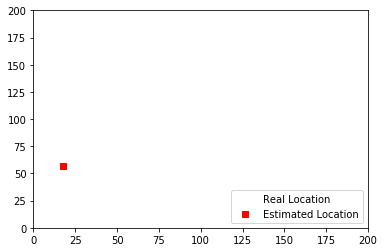

1295
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


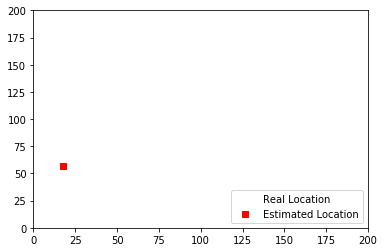

1296
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


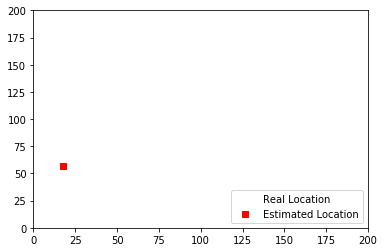

1297
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


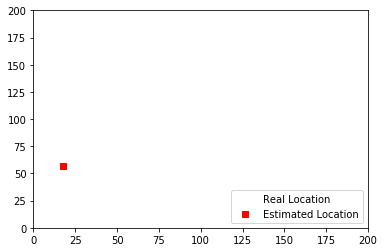

1298
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


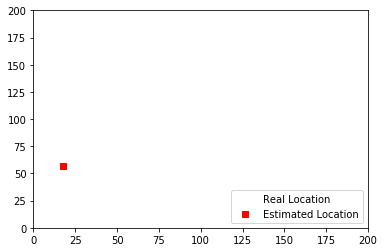

1299
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


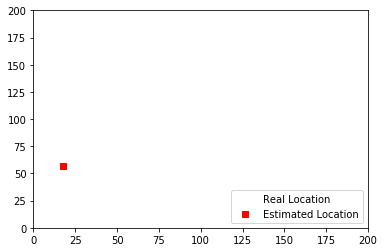

1300
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


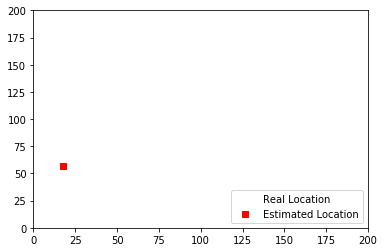

1301
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


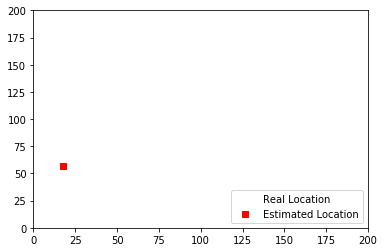

1302
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


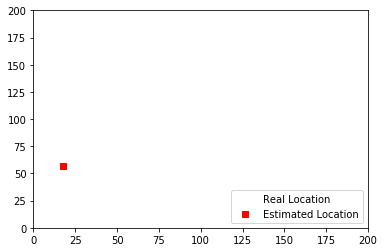

1303
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


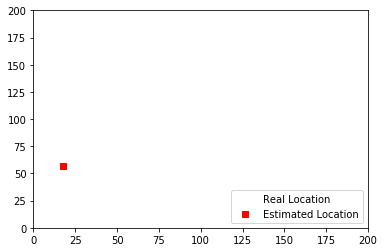

1304
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


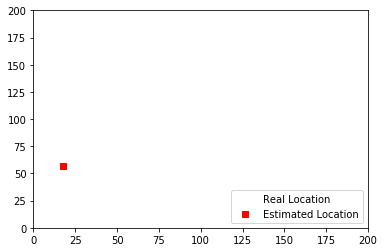

1305
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


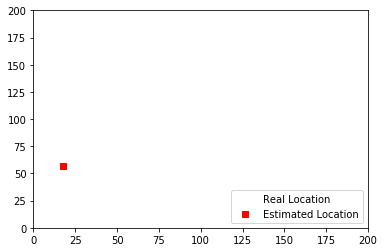

1306
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


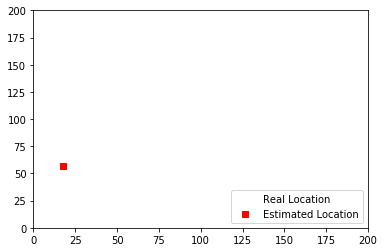

1307
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


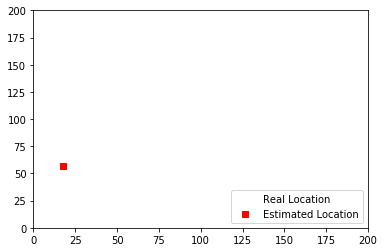

1308
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


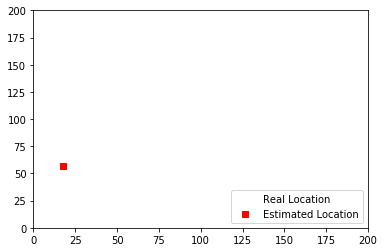

1309
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


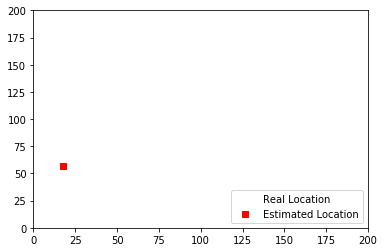

1310
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


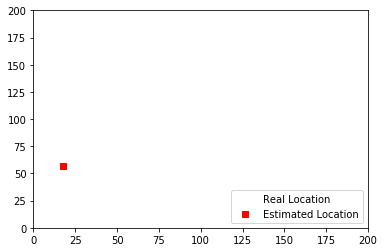

1311
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


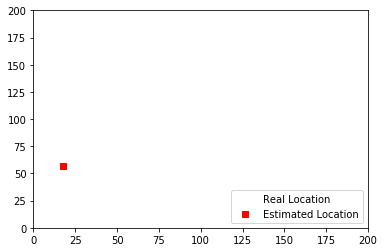

1312
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


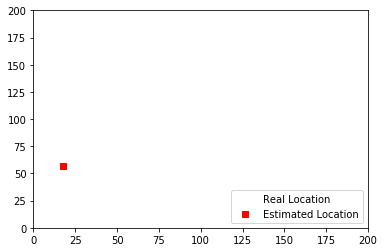

1313
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


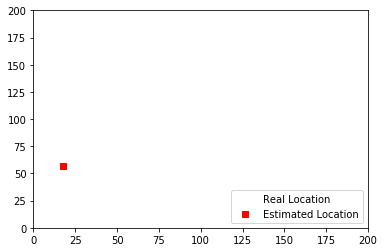

1314
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


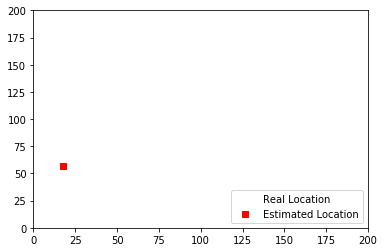

1315
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


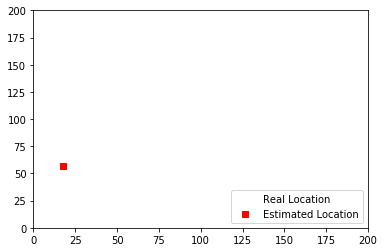

1316
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


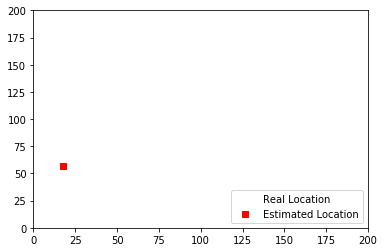

1317
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


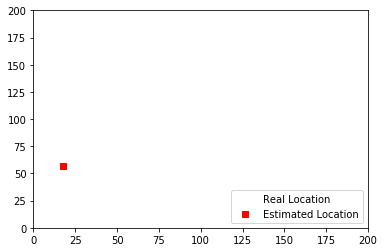

1318
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


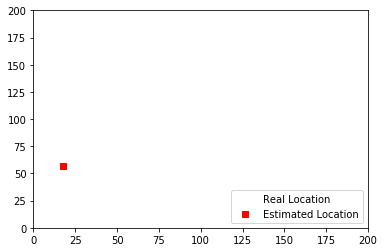

1319
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


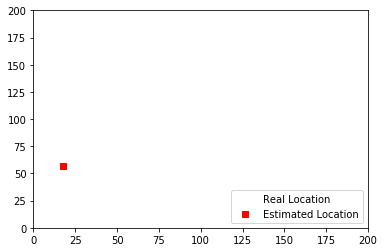

1320
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


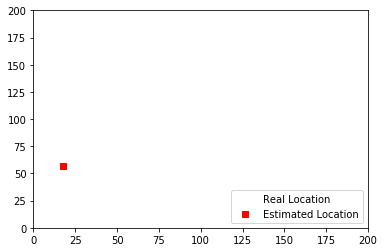

1321
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


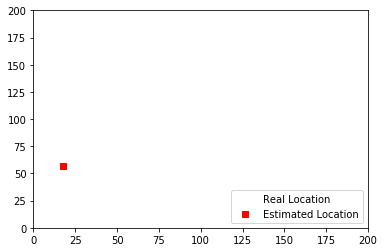

1322
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


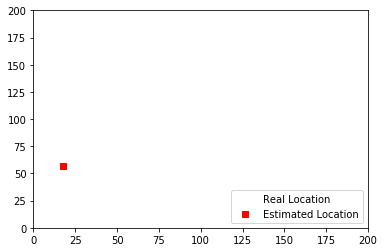

1323
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


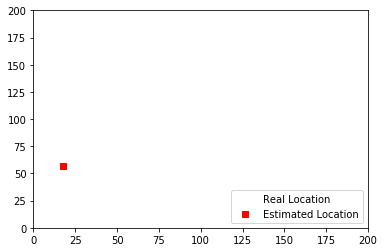

1324
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


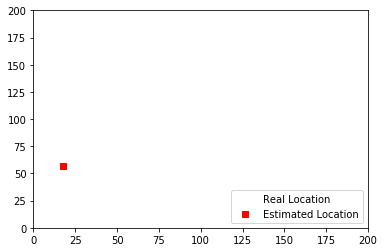

1325
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


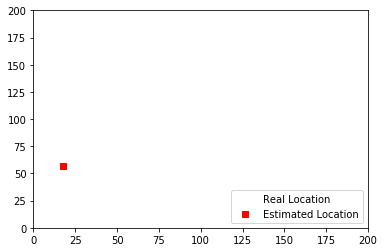

1326
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


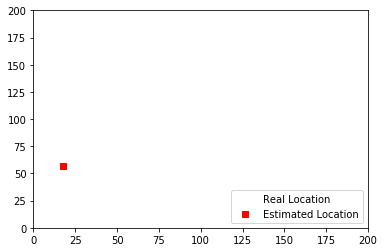

1327
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


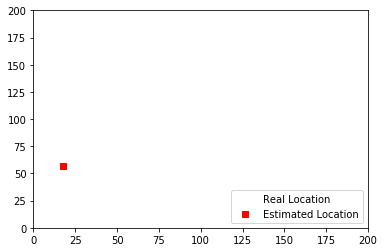

1328
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


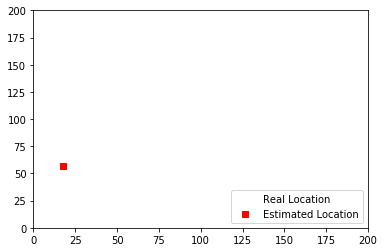

1329
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


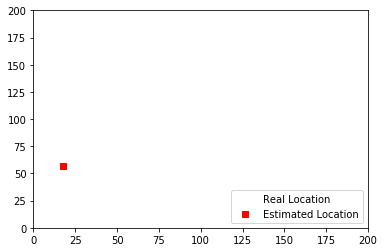

1330
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


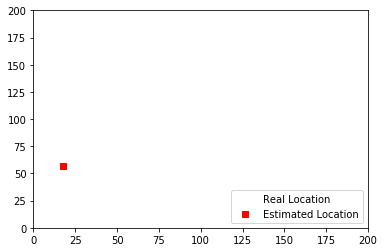

1331
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


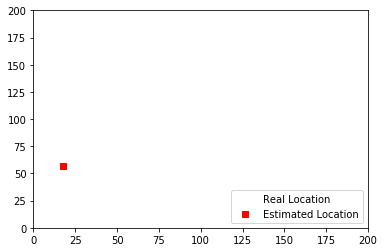

1332
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


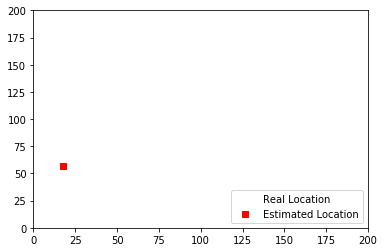

1333
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


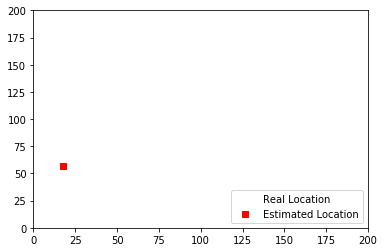

1334
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


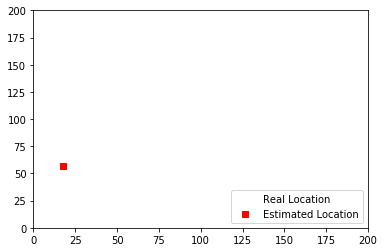

1335
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


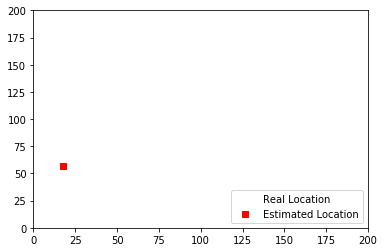

1336
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


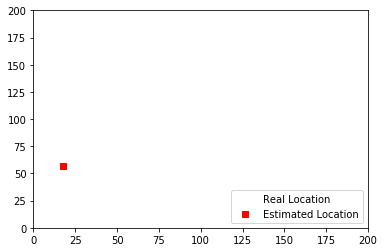

1337
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


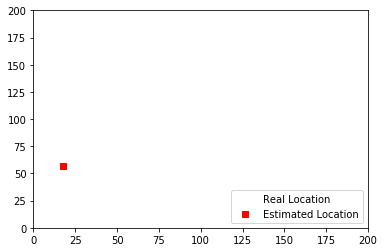

1338
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


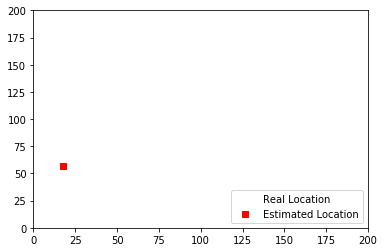

1339
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


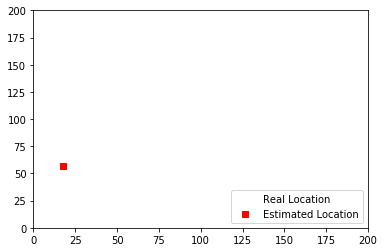

1340
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


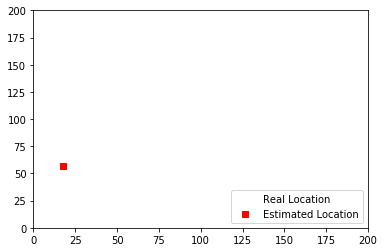

1341
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


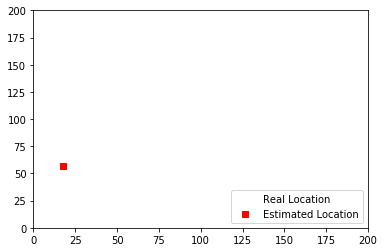

1342
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


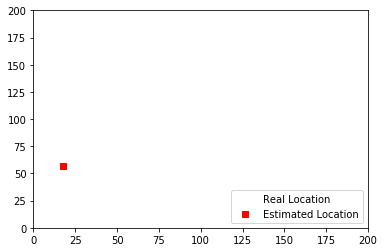

1343
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


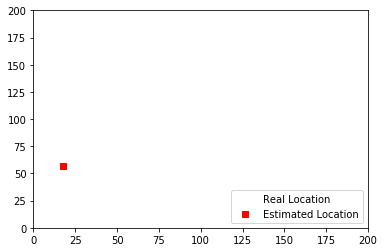

1344
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


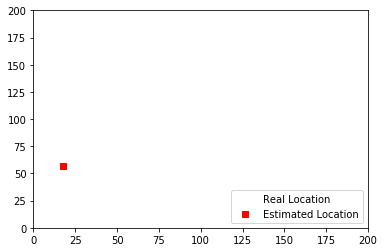

1345
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


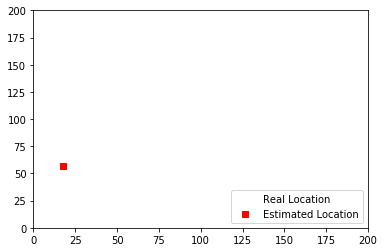

1346
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


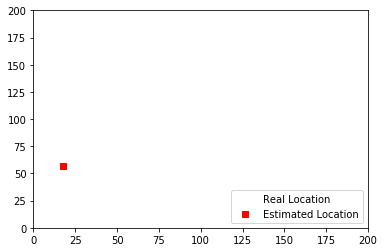

1347
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


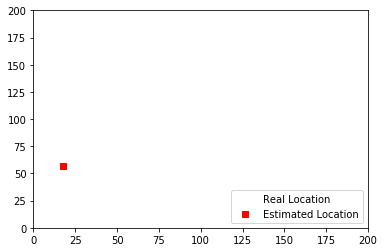

1348
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


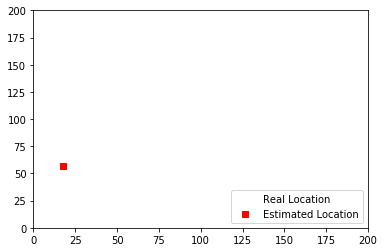

1349
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


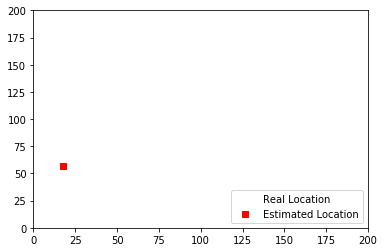

1350
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


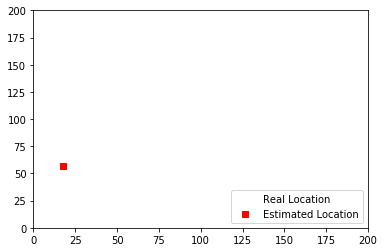

1351
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


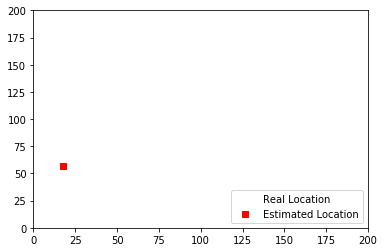

1352
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


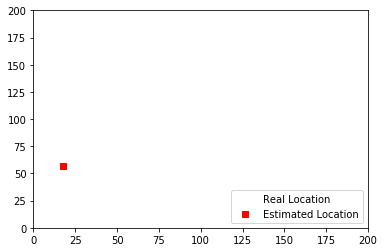

1353
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


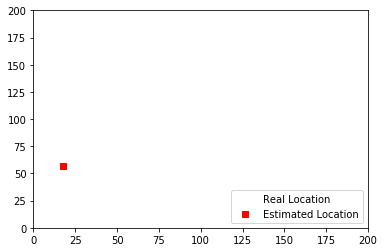

1354
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


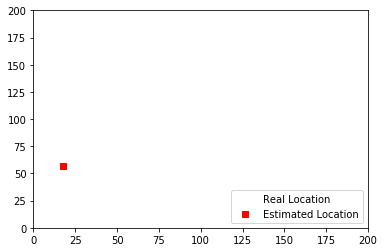

1355
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


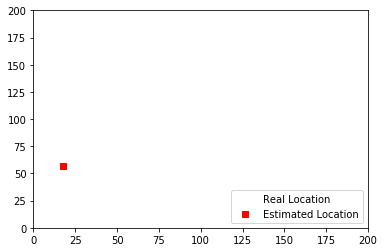

1356
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


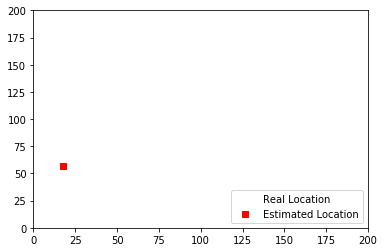

1357
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


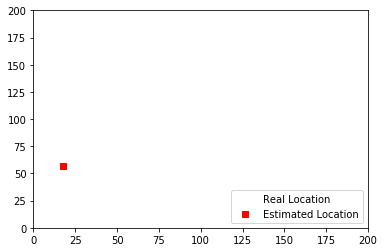

1358
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


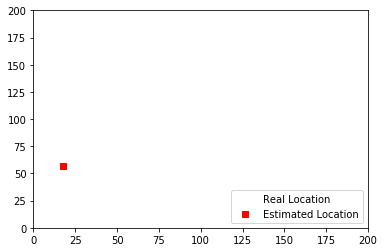

1359
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


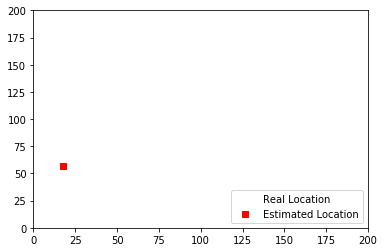

1360
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


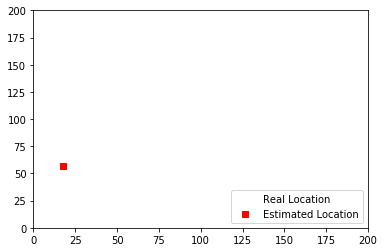

1361
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


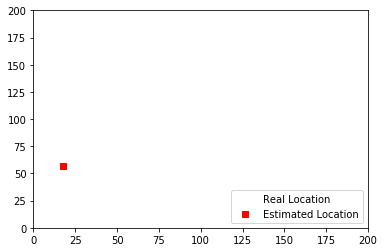

1362
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


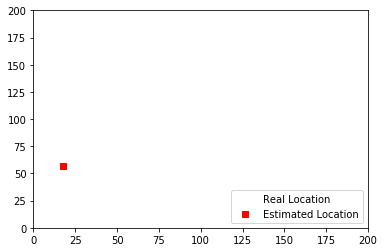

1363
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


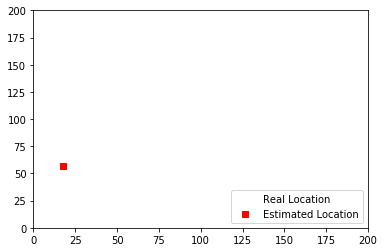

1364
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


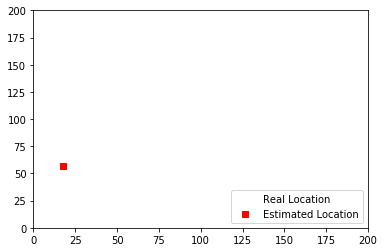

1365
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


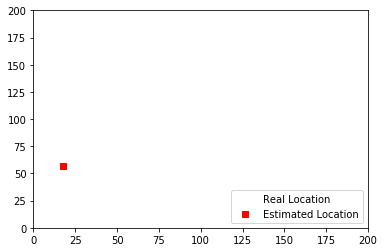

1366
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


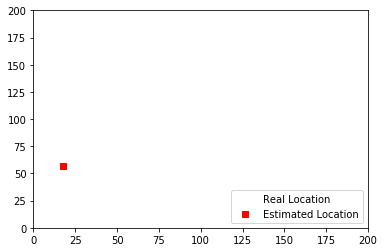

1367
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


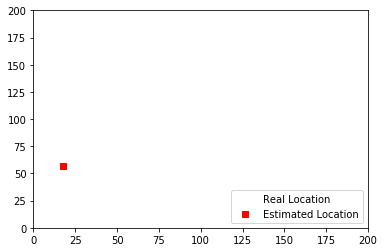

1368
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


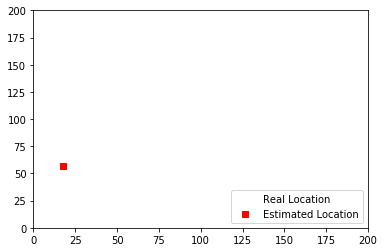

1369
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


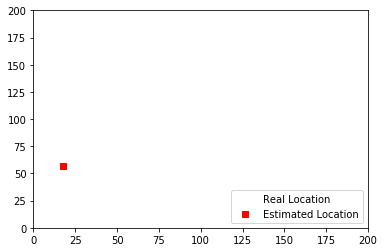

1370
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


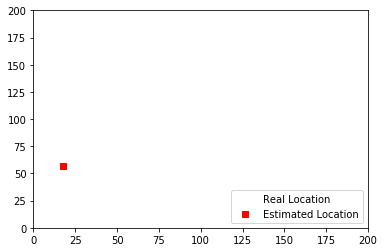

1371
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


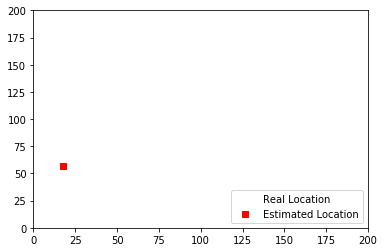

1372
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


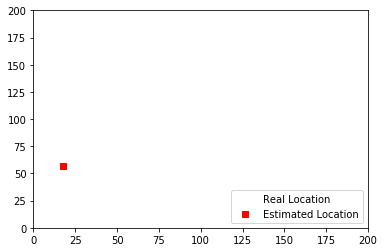

1373
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


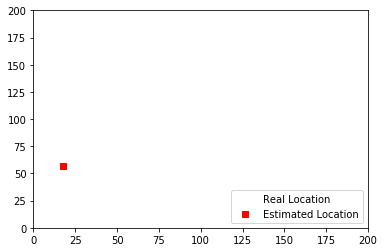

1374
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


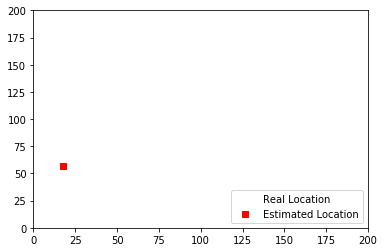

1375
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


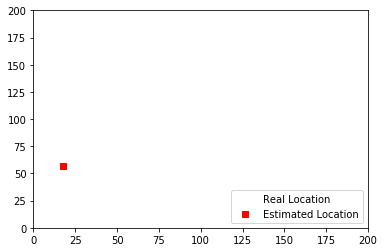

1376
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


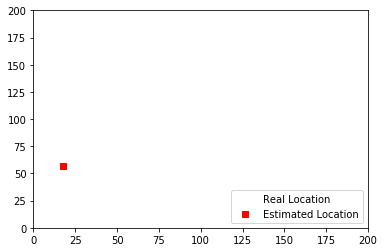

1377
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


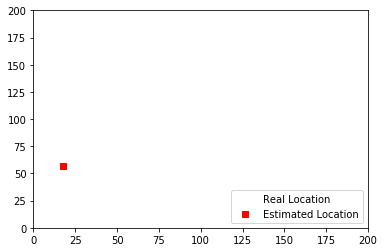

1378
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


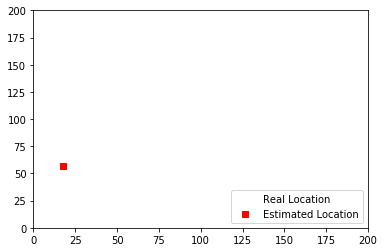

1379
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


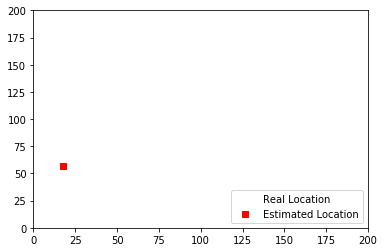

1380
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


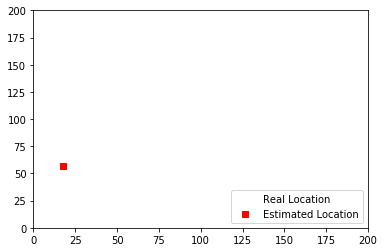

1381
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


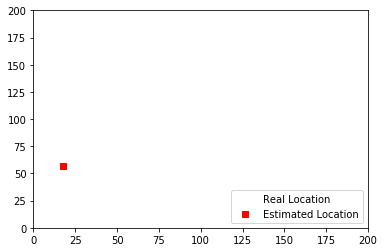

1382
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


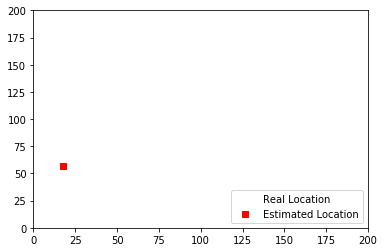

1383
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


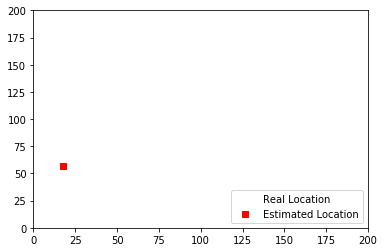

1384
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


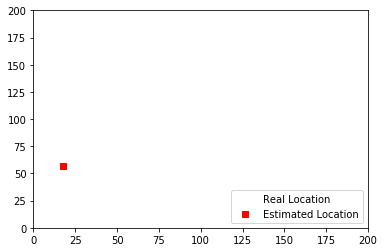

1385
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


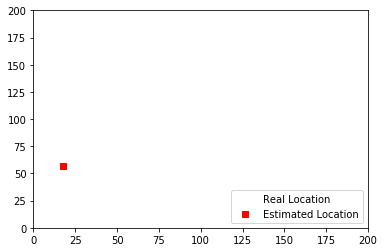

1386
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


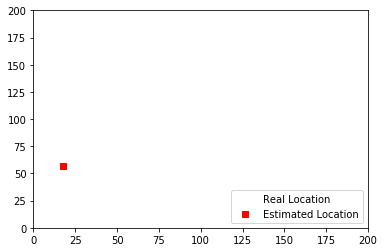

1387
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


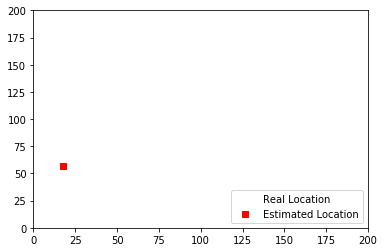

1388
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


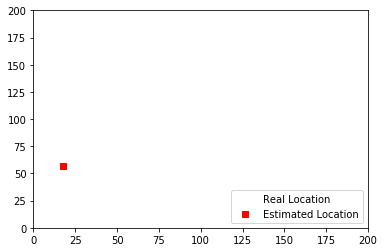

1389
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


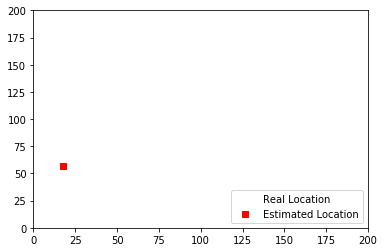

1390
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


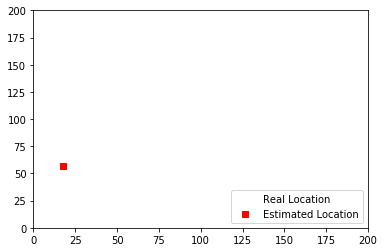

1391
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


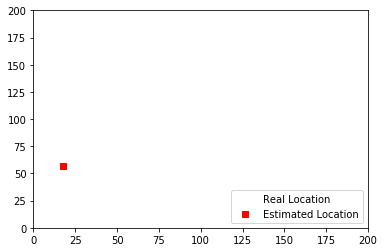

1392
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


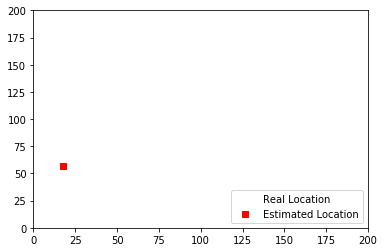

1393
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


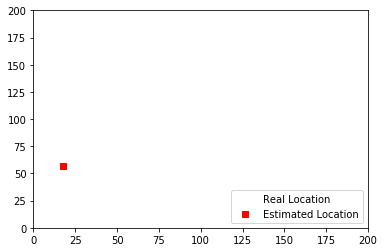

1394
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


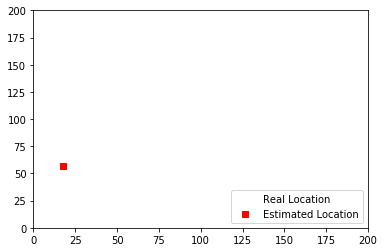

1395
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


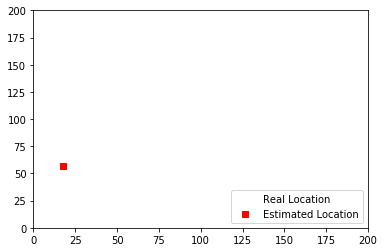

1396
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


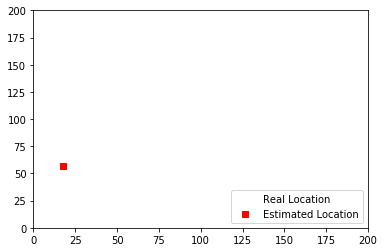

1397
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


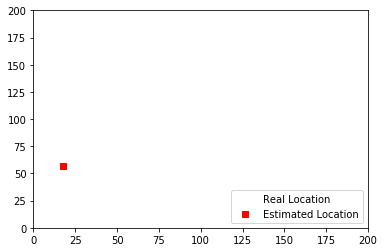

1398
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


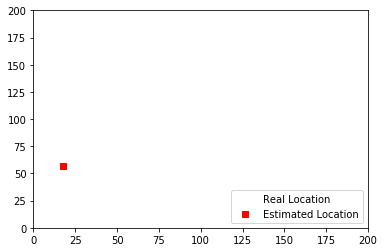

1399
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


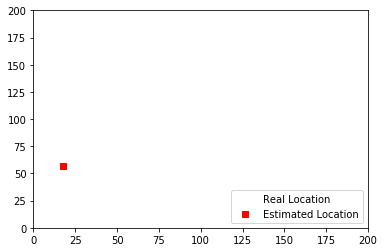

1400
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


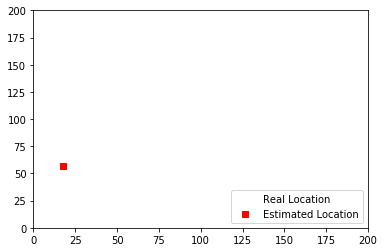

1401
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


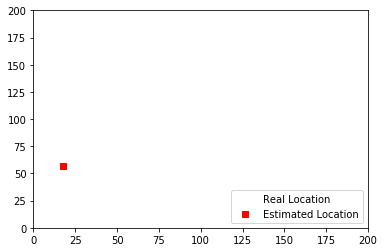

1402
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


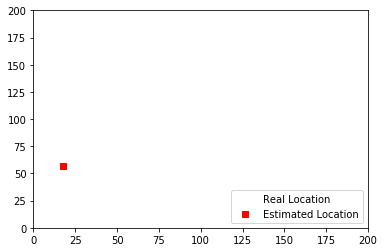

1403
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


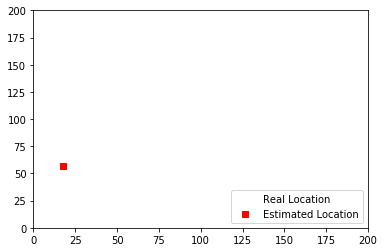

1404
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


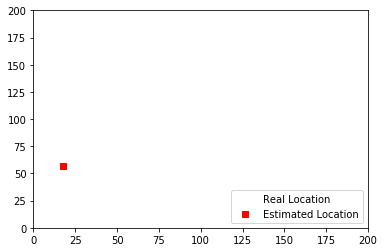

1405
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


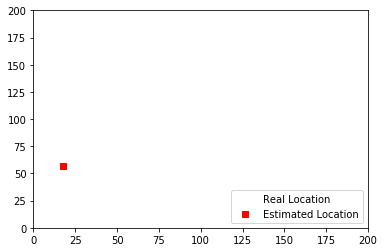

1406
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


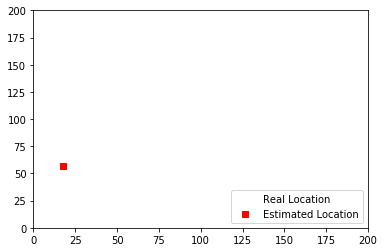

1407
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


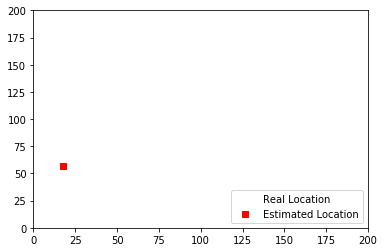

1408
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


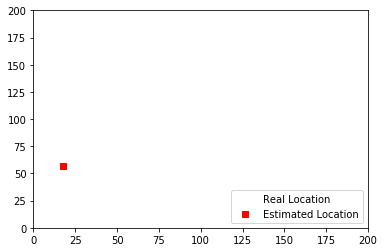

1409
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


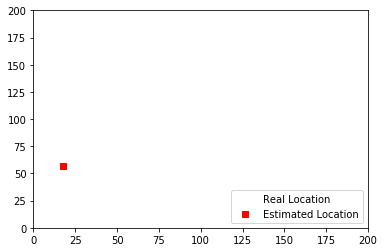

1410
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


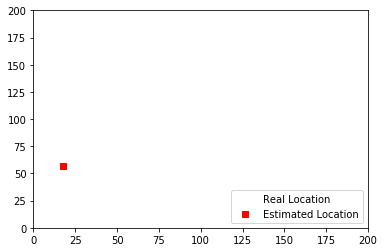

1411
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


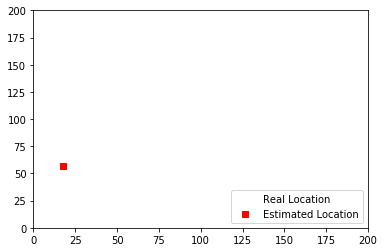

1412
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


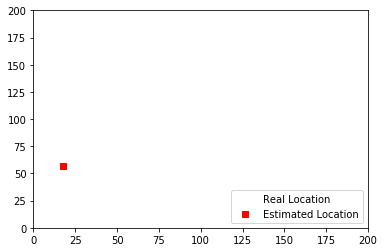

1413
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


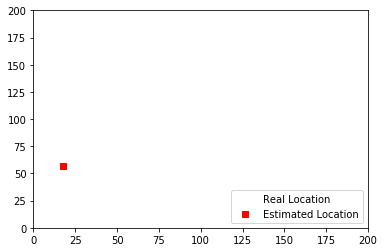

1414
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


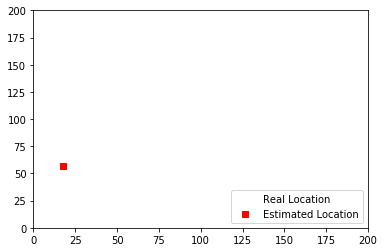

1415
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


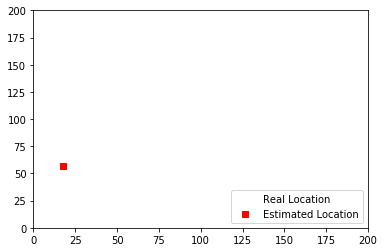

1416
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


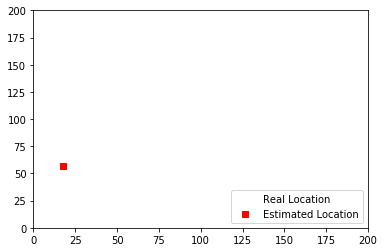

1417
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


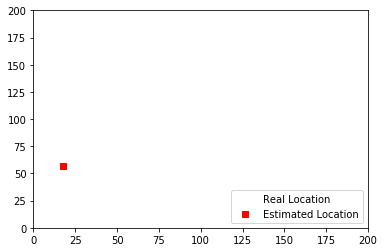

1418
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


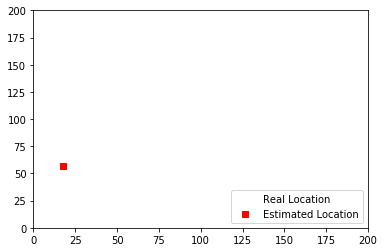

1419
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


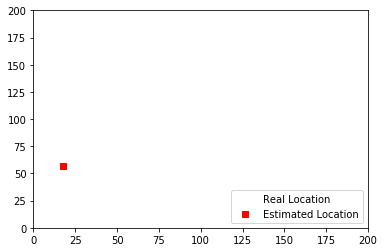

1420
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


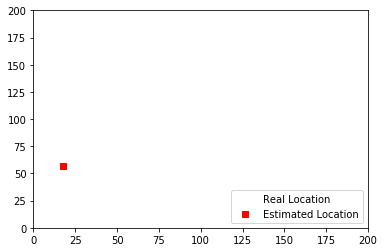

1421
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


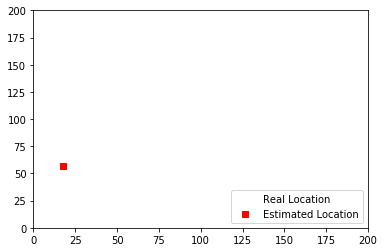

1422
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


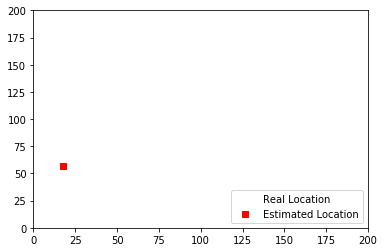

1423
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


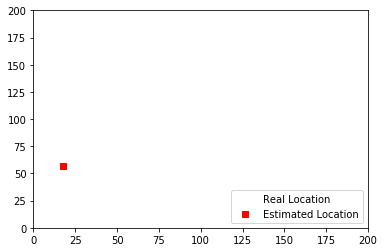

1424
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


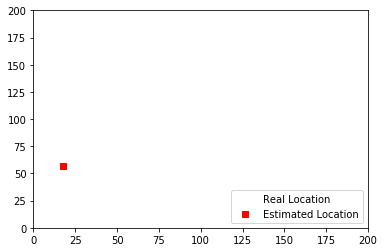

1425
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


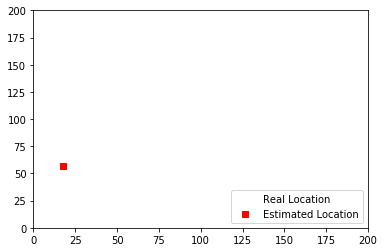

1426
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


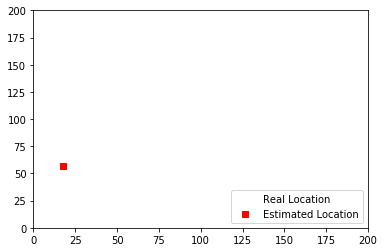

1427
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


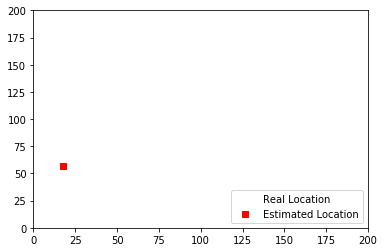

1428
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


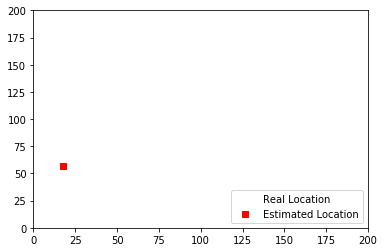

1429
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


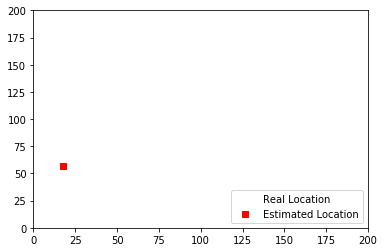

1430
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


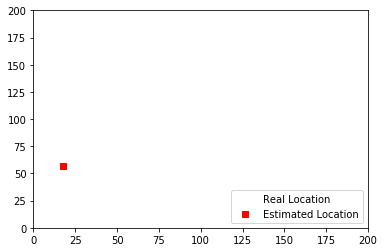

1431
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


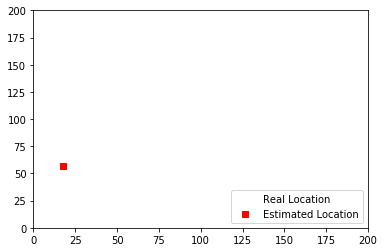

1432
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


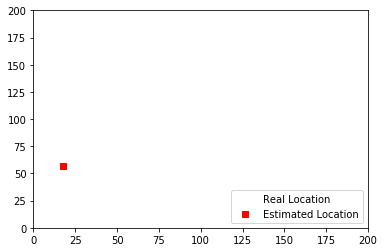

1433
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


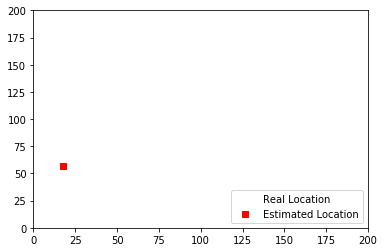

1434
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


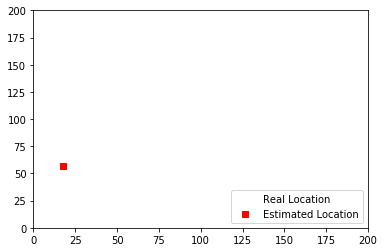

1435
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


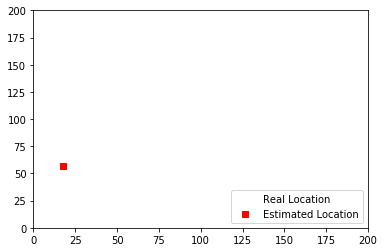

1436
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


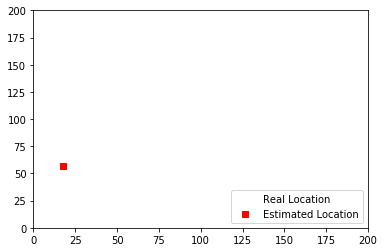

1437
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


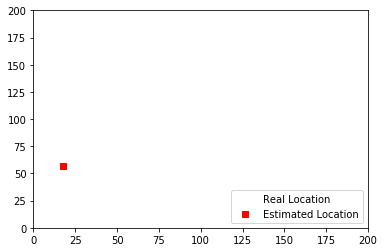

1438
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


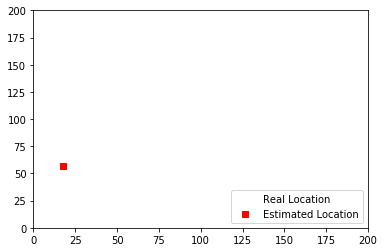

1439
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


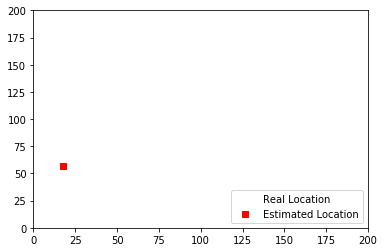

1440
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


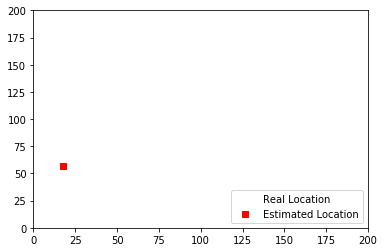

1441
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


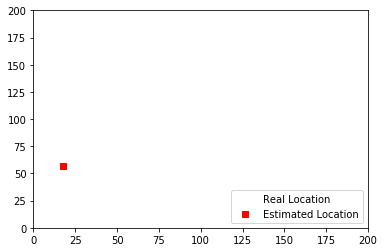

1442
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


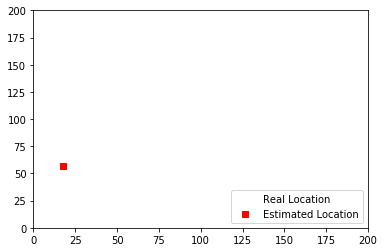

1443
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


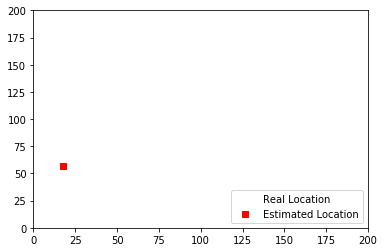

1444
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


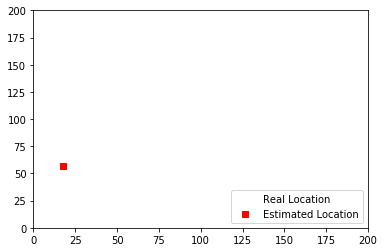

1445
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


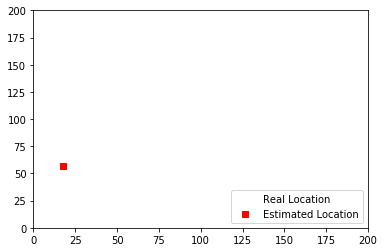

1446
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


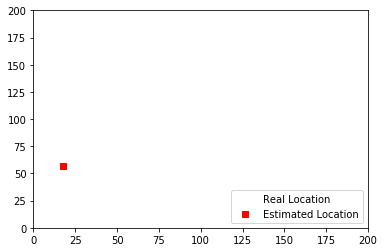

1447
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


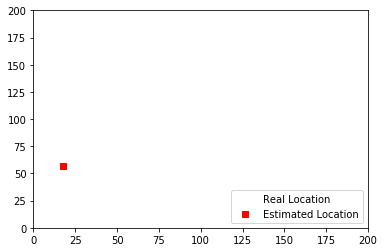

1448
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


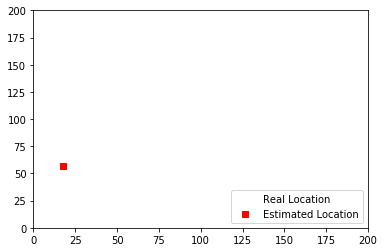

1449
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


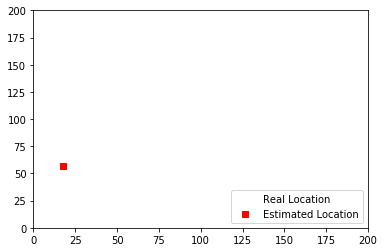

1450
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


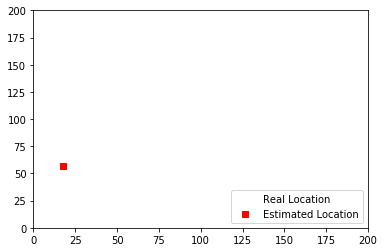

1451
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


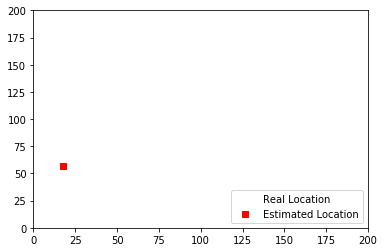

1452
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


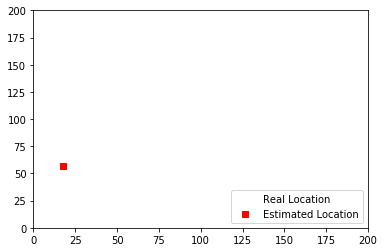

1453
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


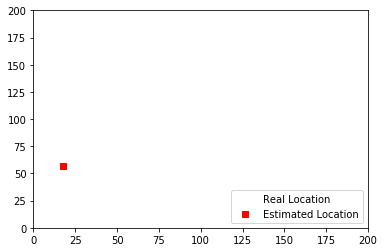

1454
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


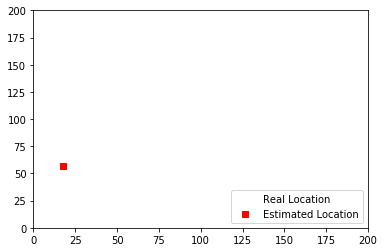

1455
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


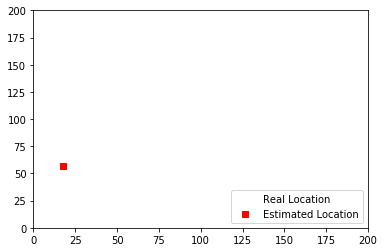

1456
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


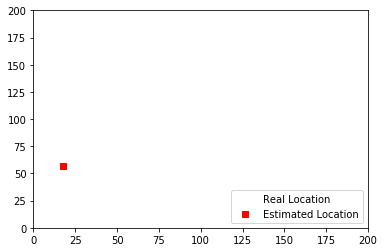

1457
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


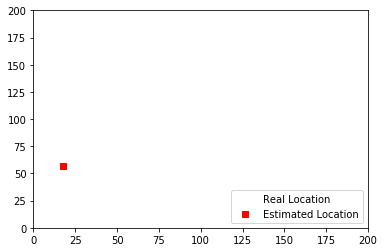

1458
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


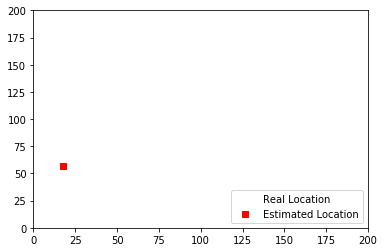

1459
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


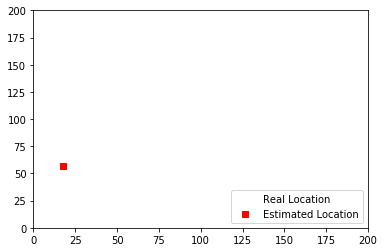

1460
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


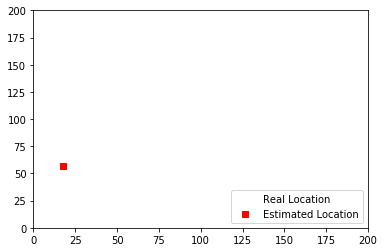

1461
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


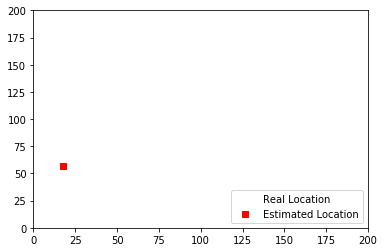

1462
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


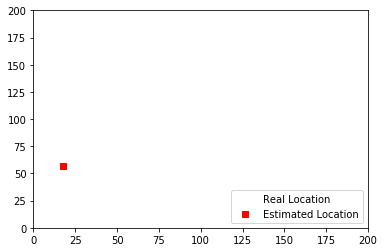

1463
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


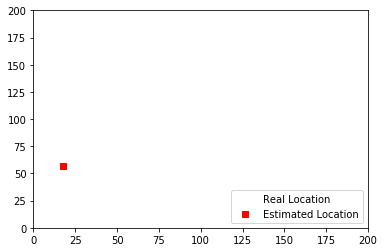

1464
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


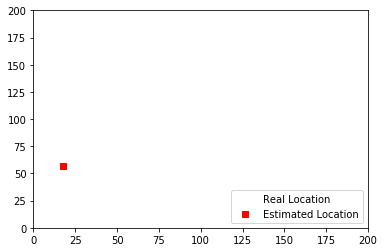

1465
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


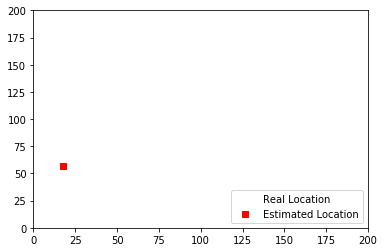

1466
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


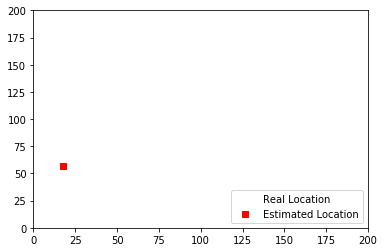

1467
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


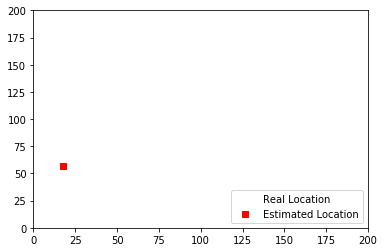

1468
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


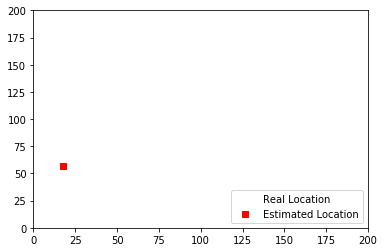

1469
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


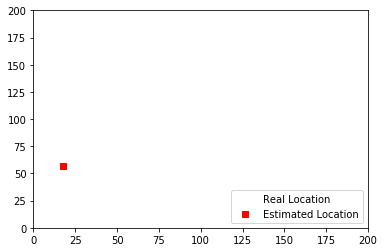

1470
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


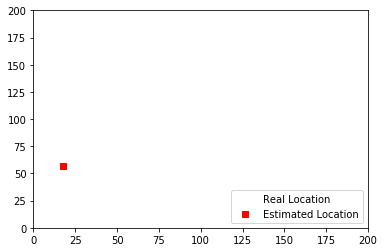

1471
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


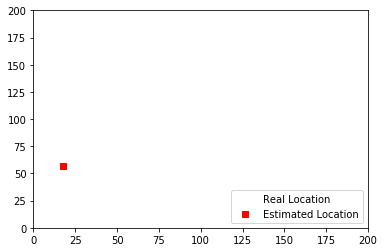

1472
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


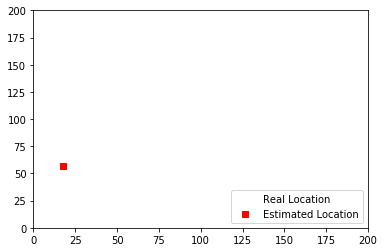

1473
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


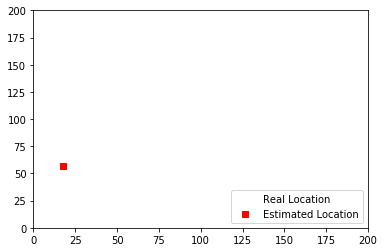

1474
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


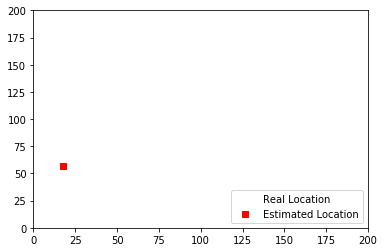

1475
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


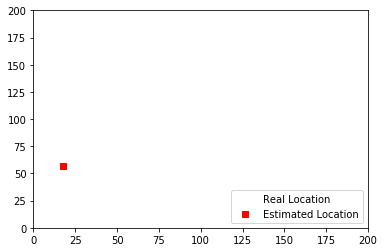

1476
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


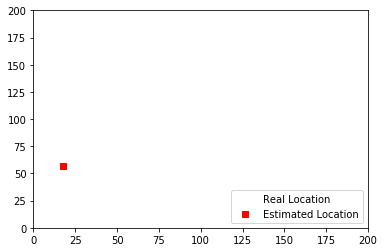

1477
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


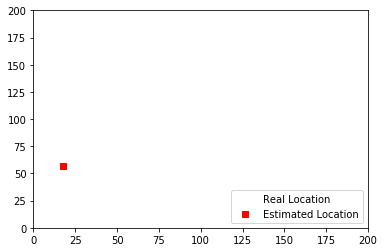

1478
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


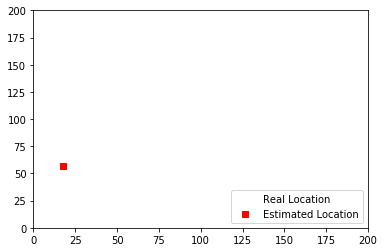

1479
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


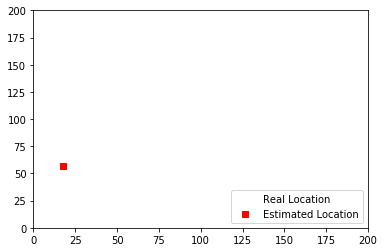

1480
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


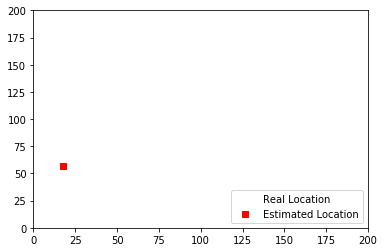

1481
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


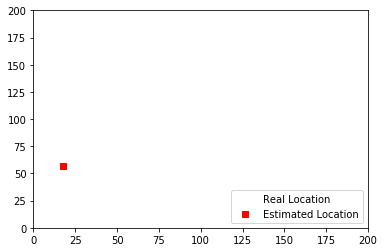

1482
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


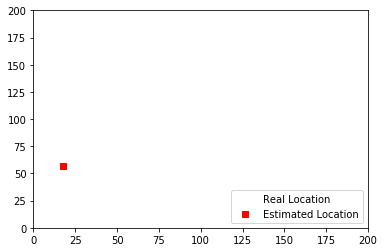

1483
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


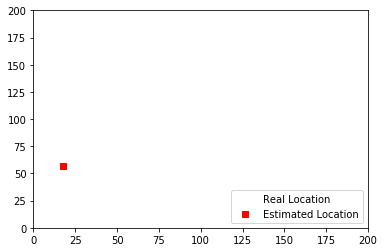

1484
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


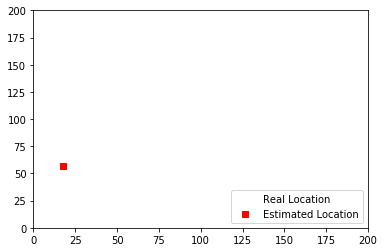

1485
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


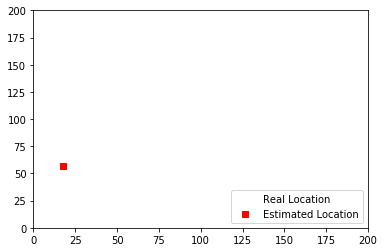

1486
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


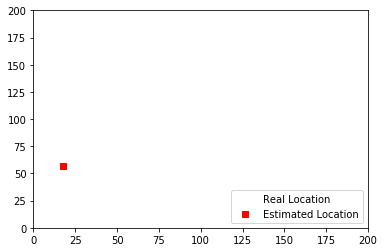

1487
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


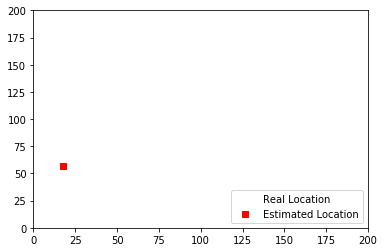

1488
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


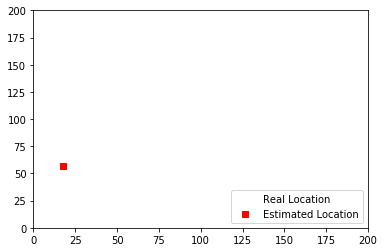

1489
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


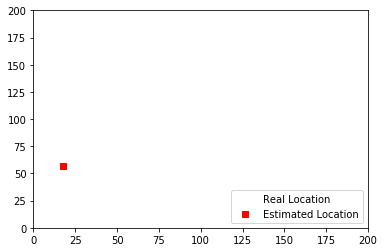

1490
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


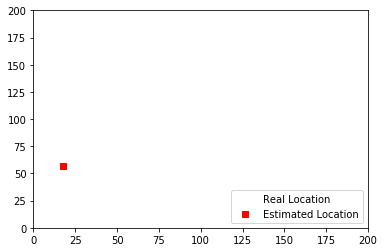

1491
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


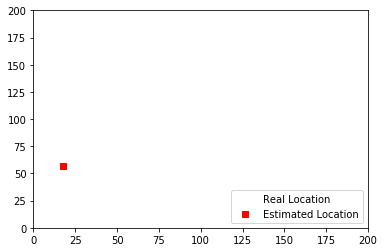

1492
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


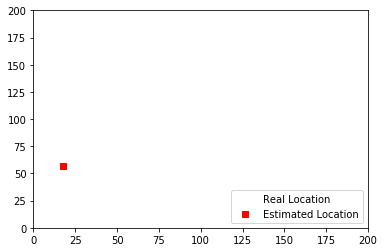

1493
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


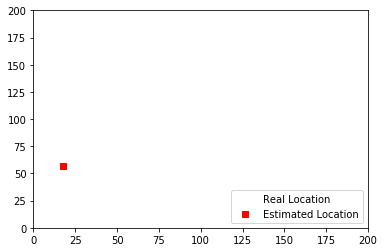

1494
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


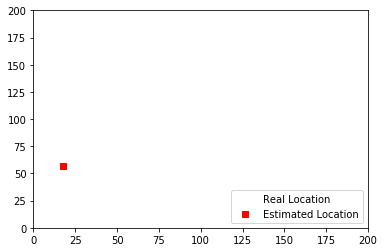

1495
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


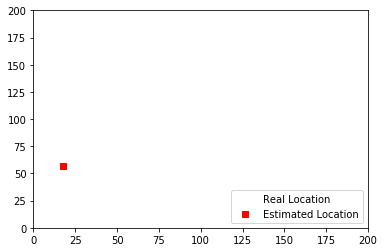

1496
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


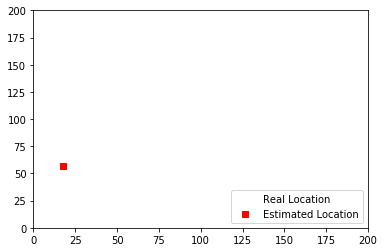

1497
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


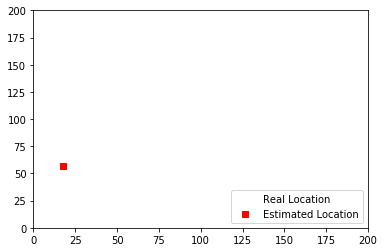

1498
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


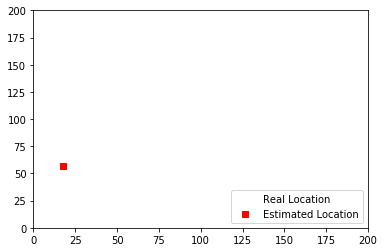

1499
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


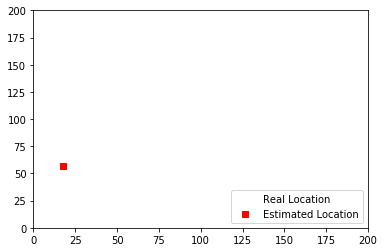

1500
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


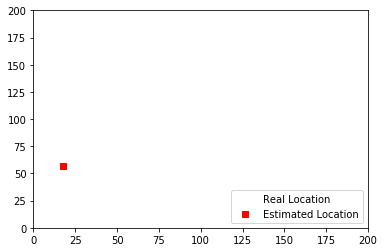

1501
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


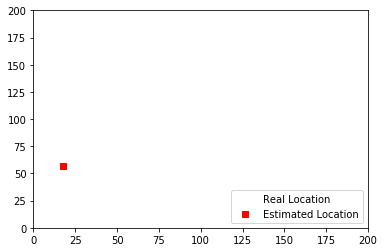

1502
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


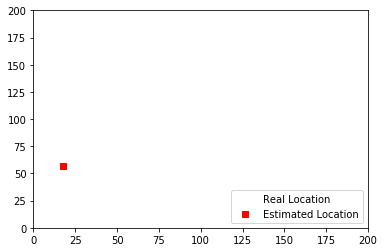

1503
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


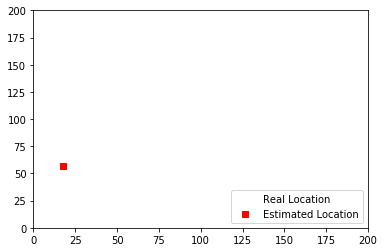

1504
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


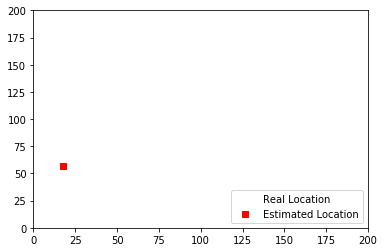

1505
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


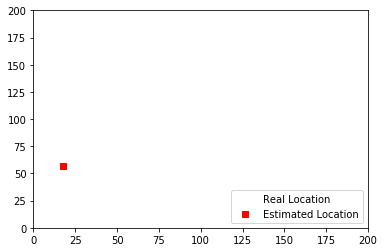

1506
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


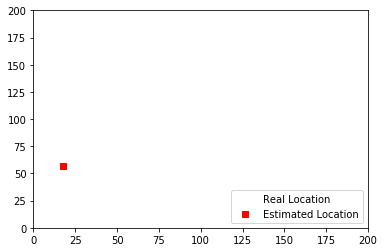

1507
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


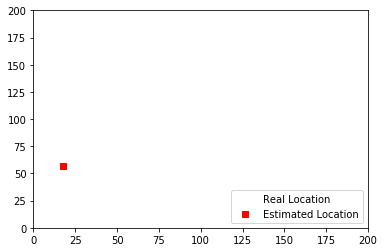

1508
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


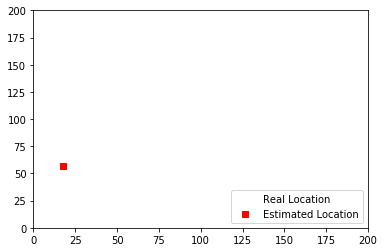

1509
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


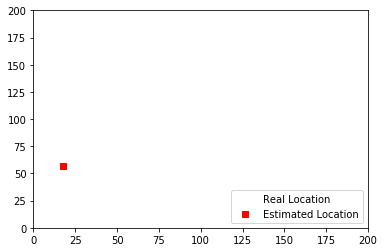

1510
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


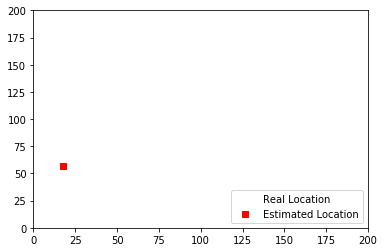

1511
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


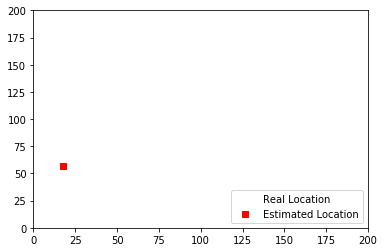

1512
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


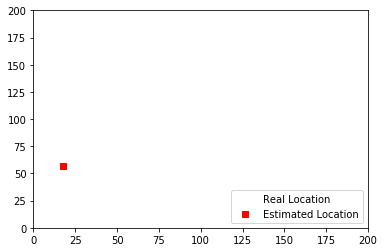

1513
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


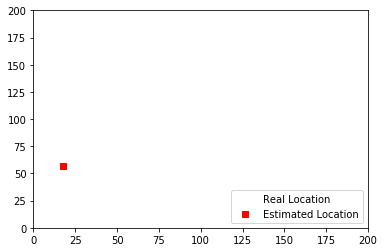

1514
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


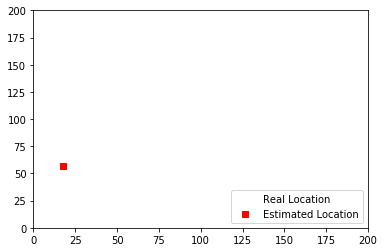

1515
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


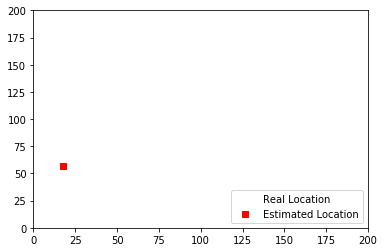

1516
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


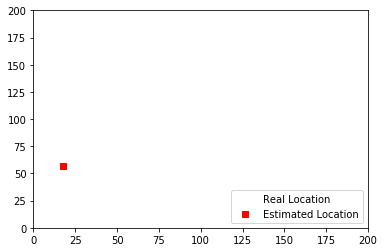

1517
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


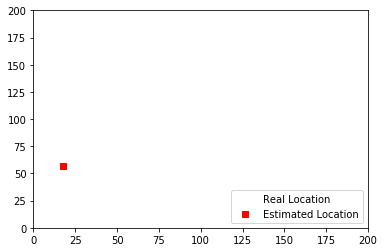

1518
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


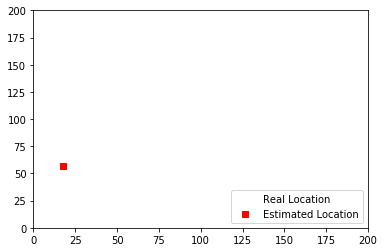

1519
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


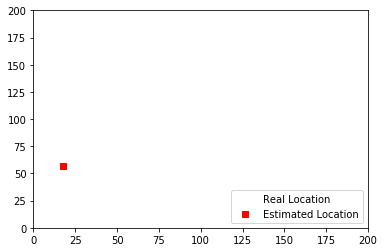

1520
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


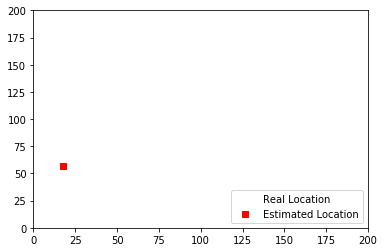

1521
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


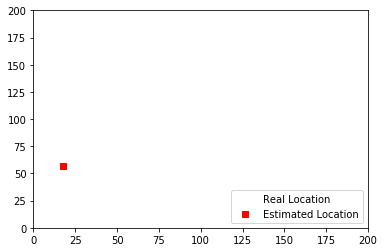

1522
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


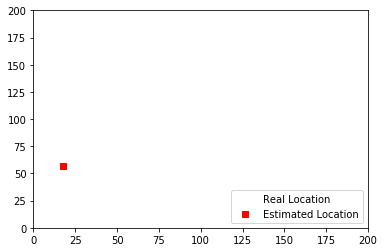

1523
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


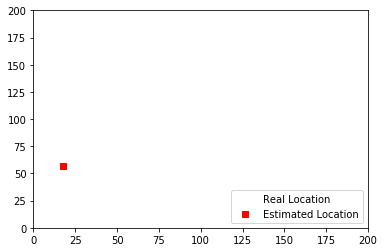

1524
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


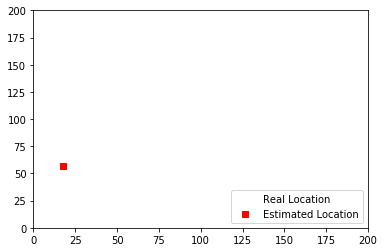

1525
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


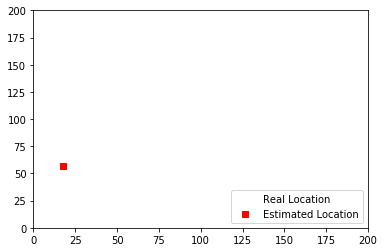

1526
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


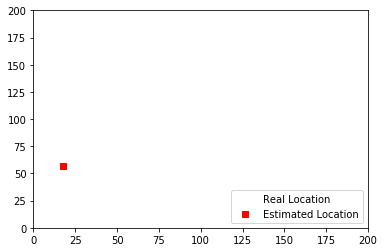

1527
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


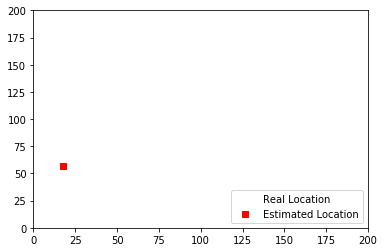

1528
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


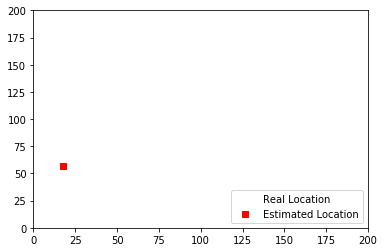

1529
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


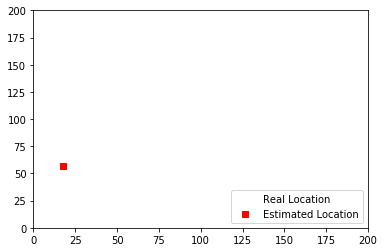

1530
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


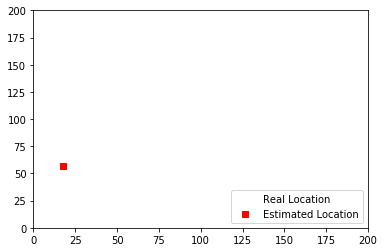

1531
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


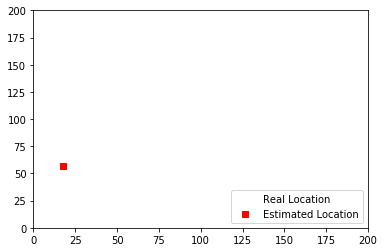

1532
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


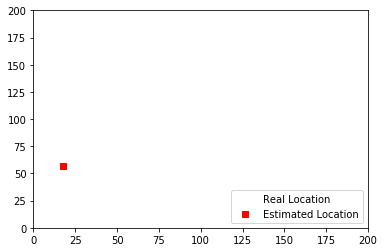

1533
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


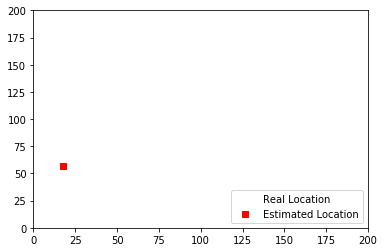

1534
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


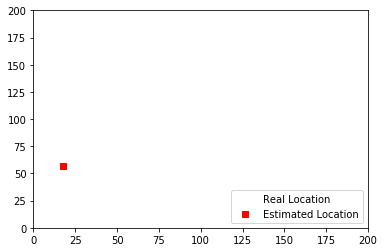

1535
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


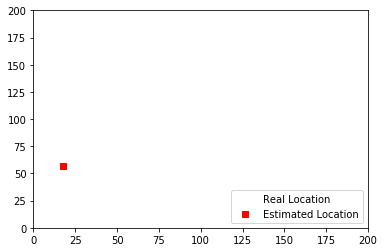

1536
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


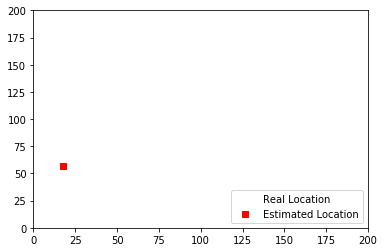

1537
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


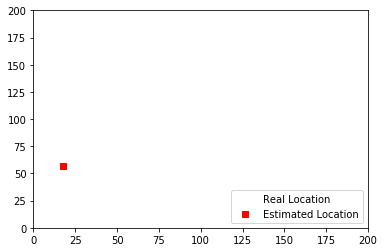

1538
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


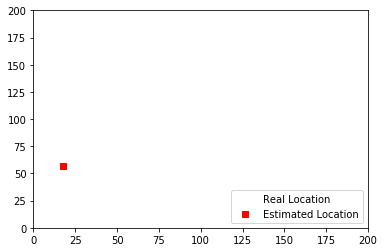

1539
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


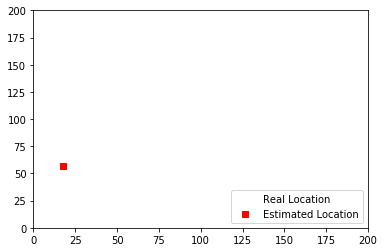

1540
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


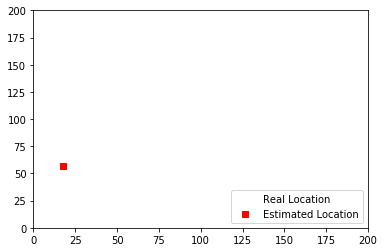

1541
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


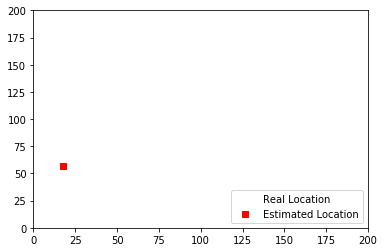

1542
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


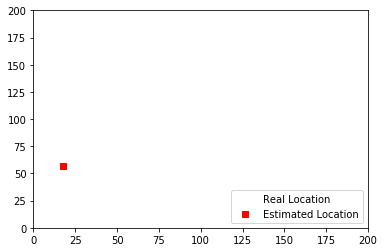

1543
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


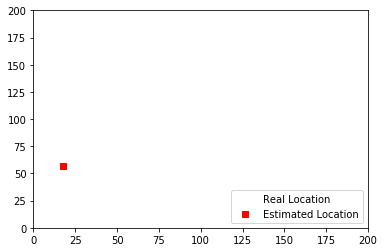

1544
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


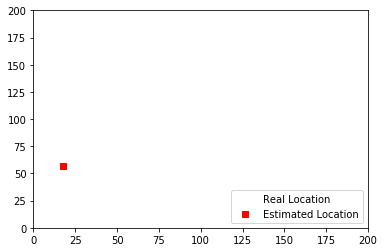

1545
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


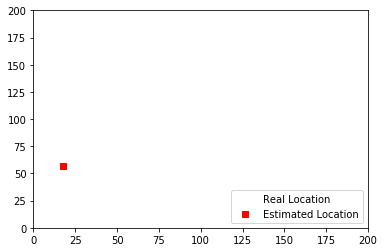

1546
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


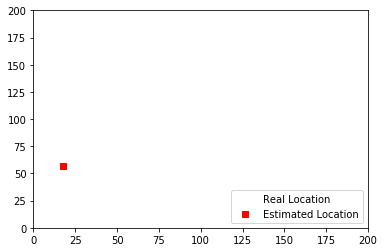

1547
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


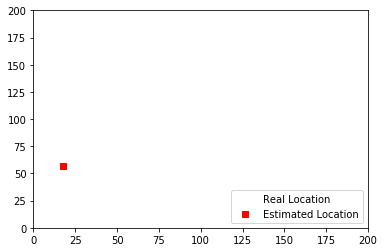

1548
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


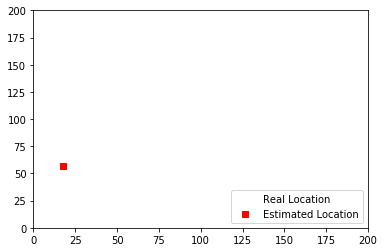

1549
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


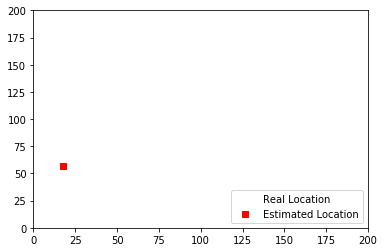

1550
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


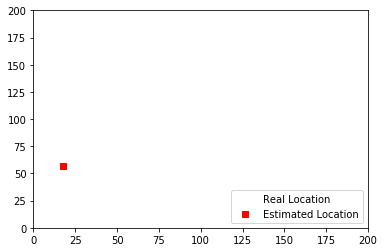

1551
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


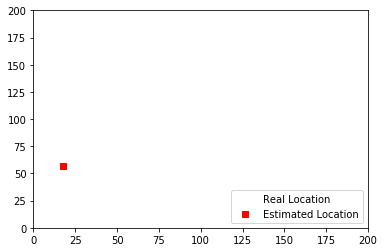

1552
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


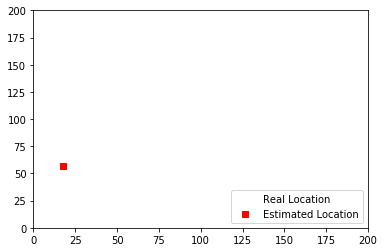

1553
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


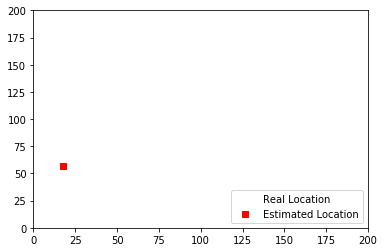

1554
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


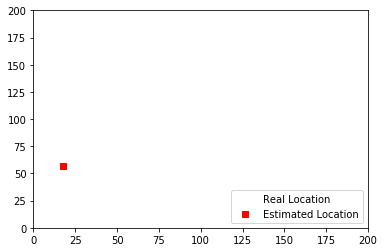

1555
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


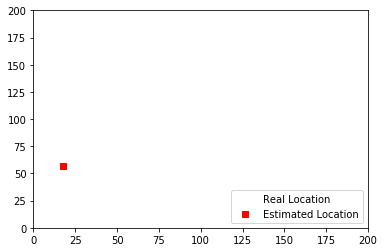

1556
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


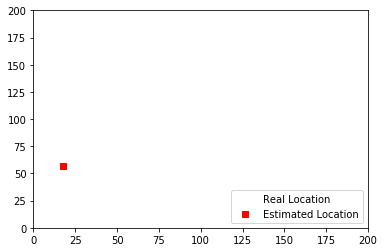

1557
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


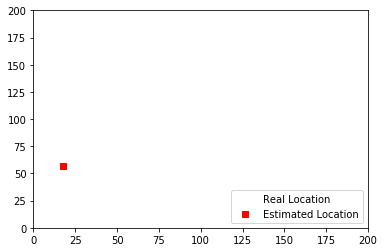

1558
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


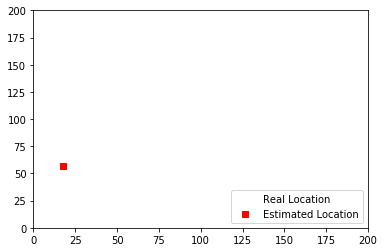

1559
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


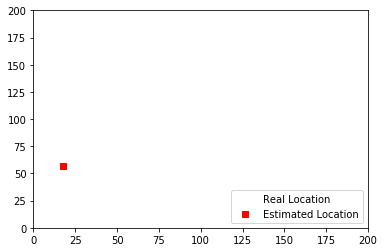

1560
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


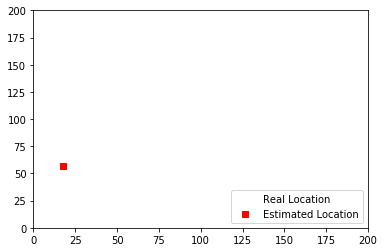

1561
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


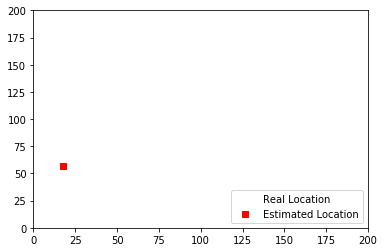

1562
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


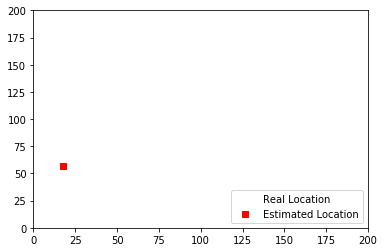

1563
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


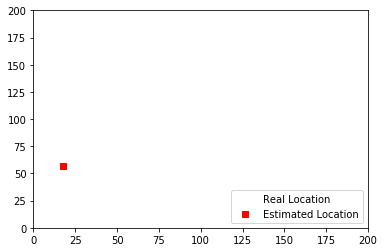

1564
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


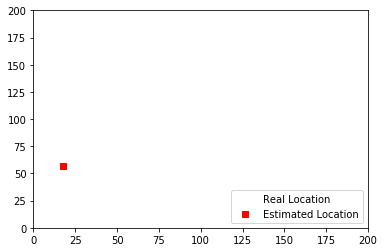

1565
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


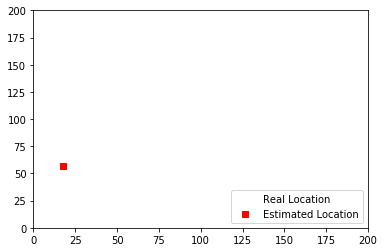

1566
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


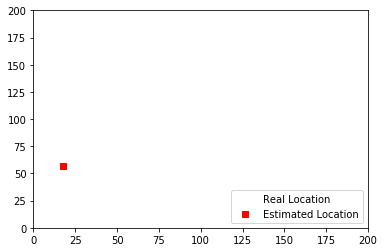

1567
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


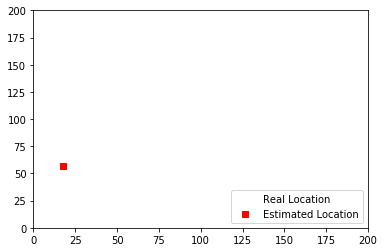

1568
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


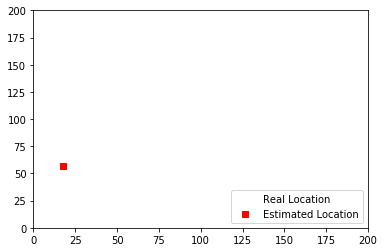

1569
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


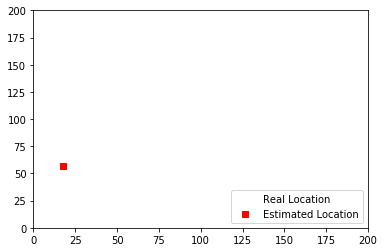

1570
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


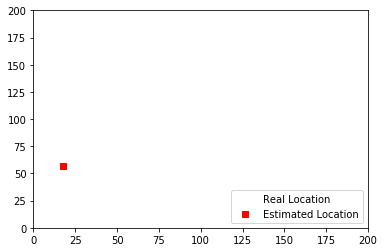

1571
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


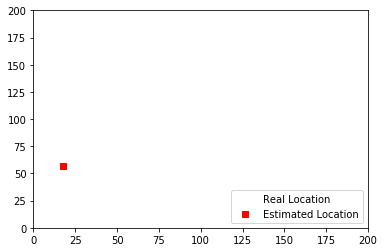

1572
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


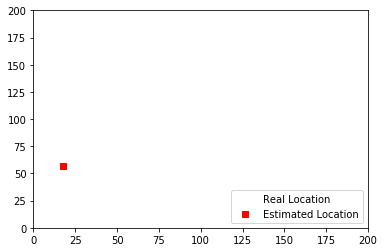

1573
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


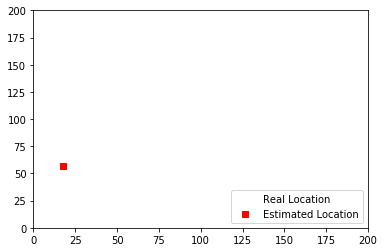

1574
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


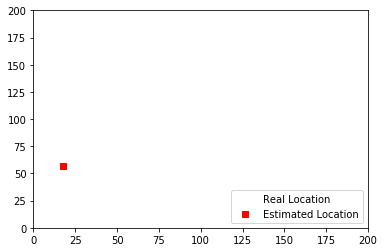

1575
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


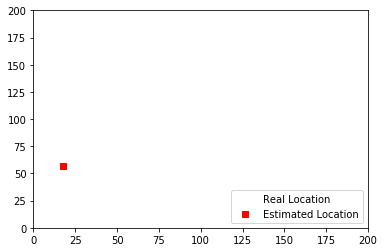

1576
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


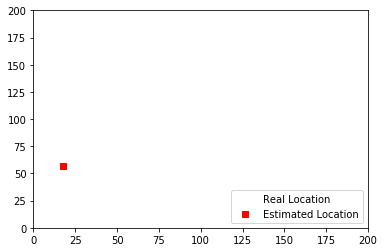

1577
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


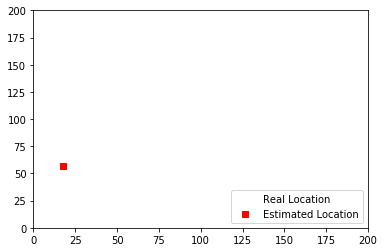

1578
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


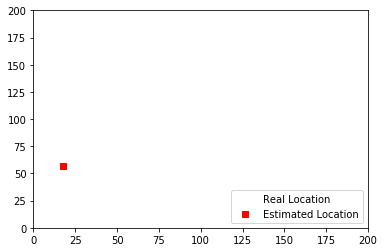

1579
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


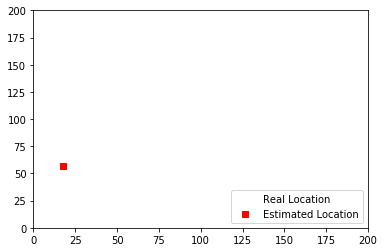

1580
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


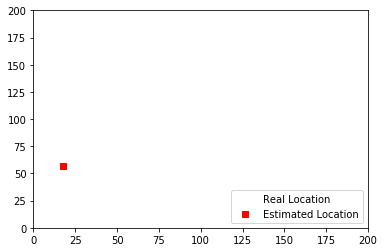

1581
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


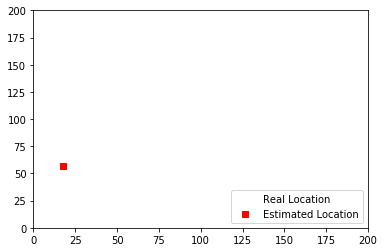

1582
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


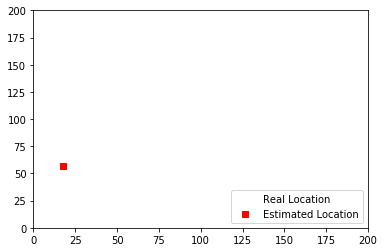

1583
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


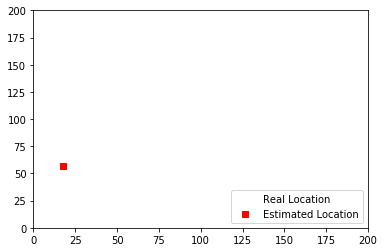

1584
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


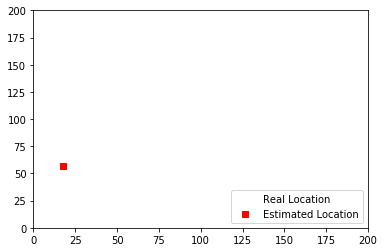

1585
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


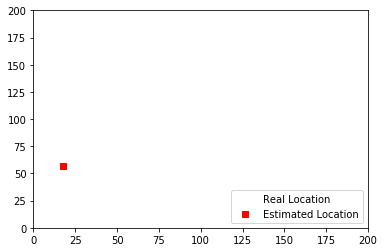

1586
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


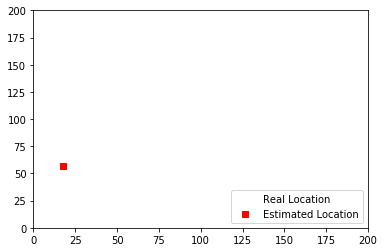

1587
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


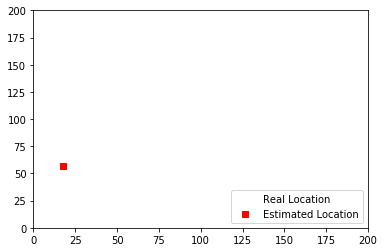

1588
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


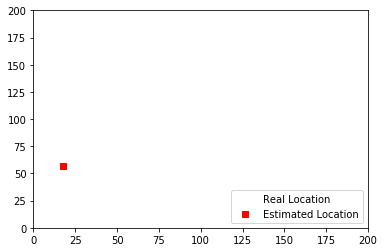

1589
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


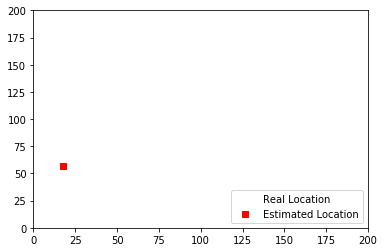

1590
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


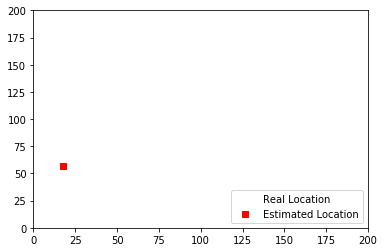

1591
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


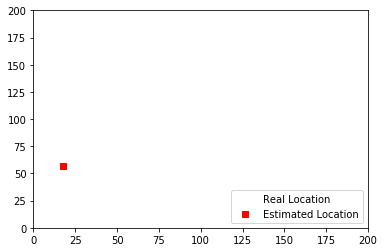

1592
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


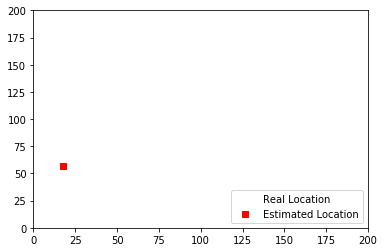

1593
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


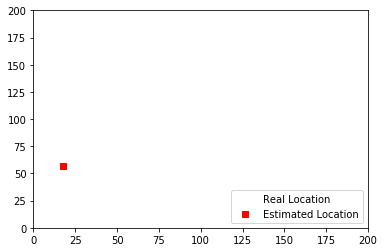

1594
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


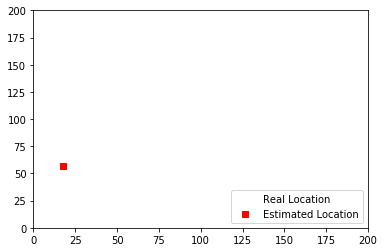

1595
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


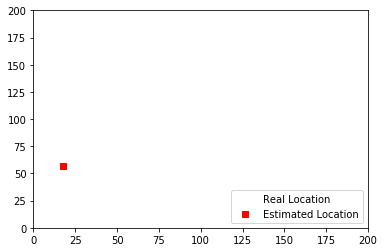

1596
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


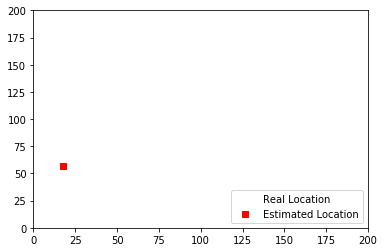

1597
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


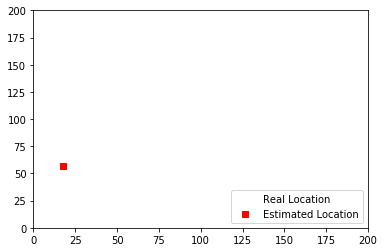

1598
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


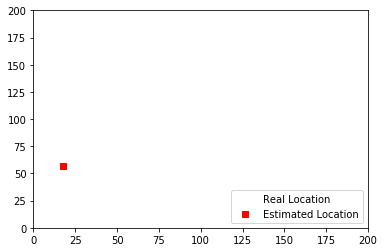

1599
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


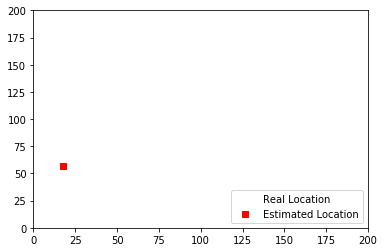

1600
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


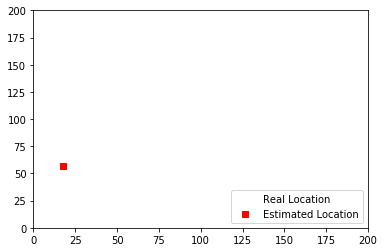

1601
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


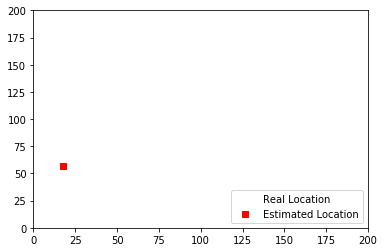

1602
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


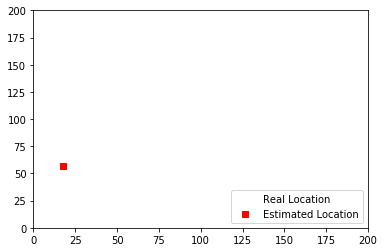

1603
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


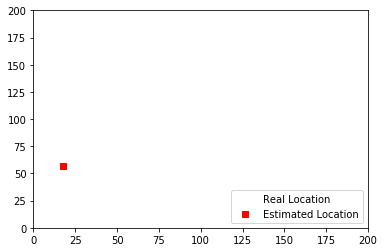

1604
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


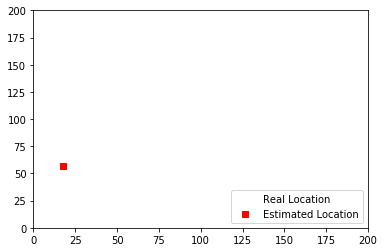

1605
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


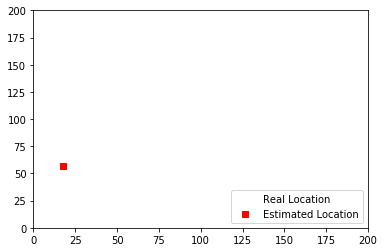

1606
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


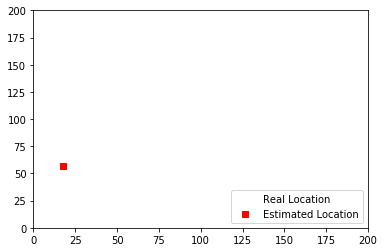

1607
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


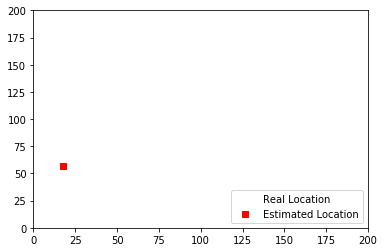

1608
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


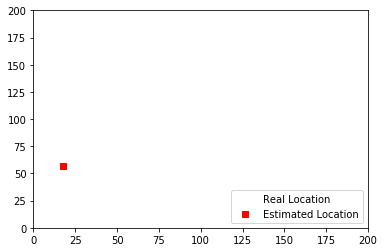

1609
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


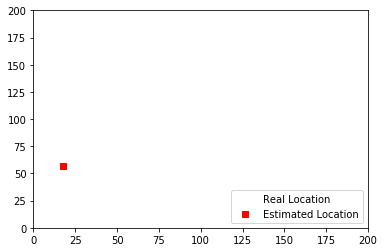

1610
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


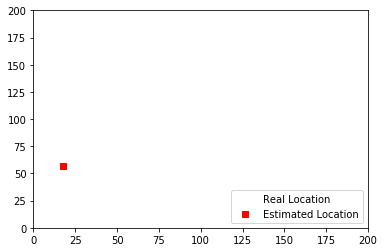

1611
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


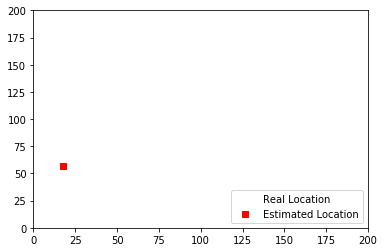

1612
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


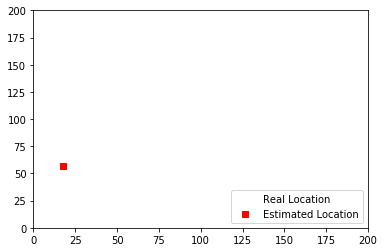

1613
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


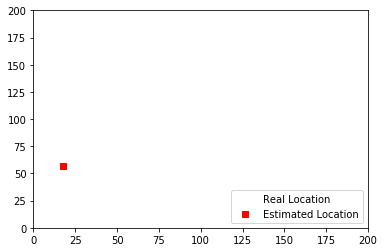

1614
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


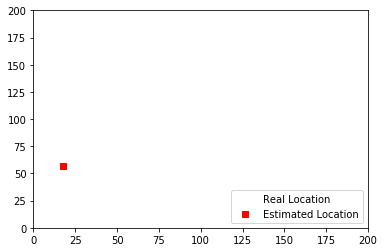

1615
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


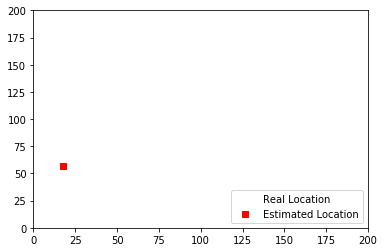

1616
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


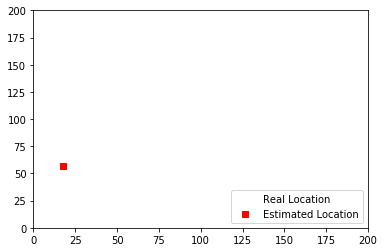

1617
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


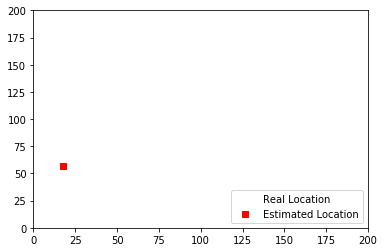

1618
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


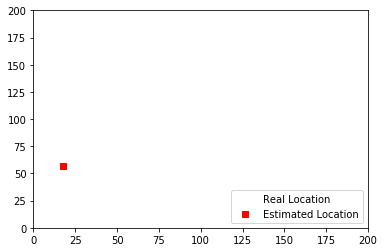

1619
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


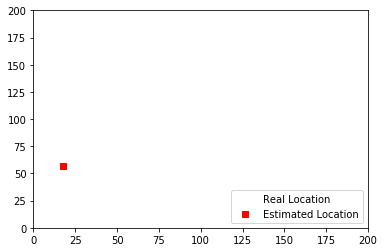

1620
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


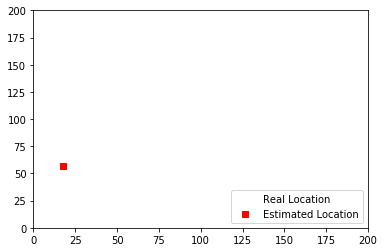

1621
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


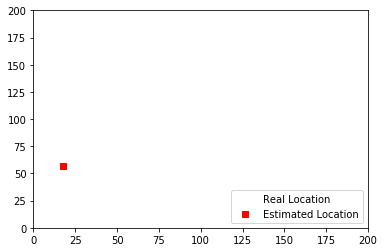

1622
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


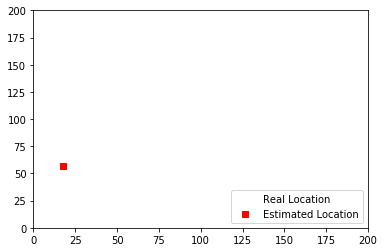

1623
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


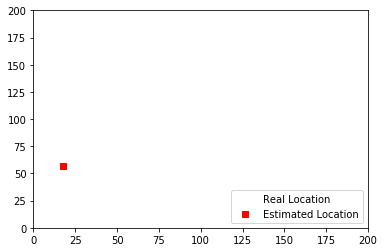

1624
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


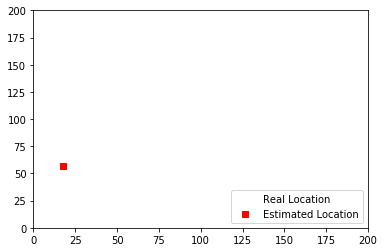

1625
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


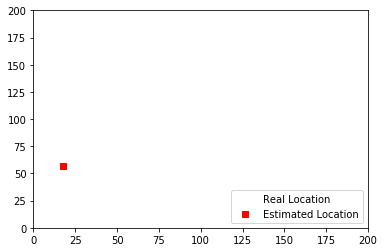

1626
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


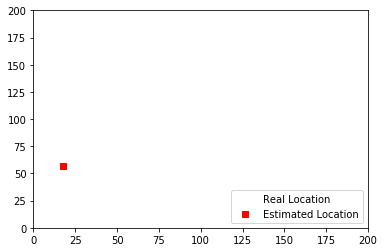

1627
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


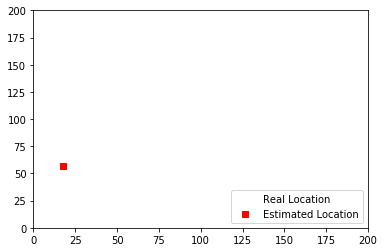

1628
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


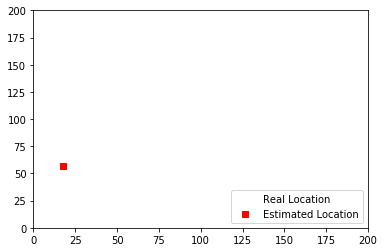

1629
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


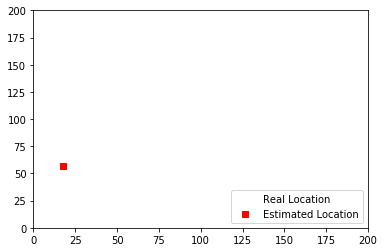

1630
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


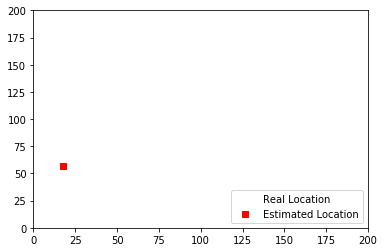

1631
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


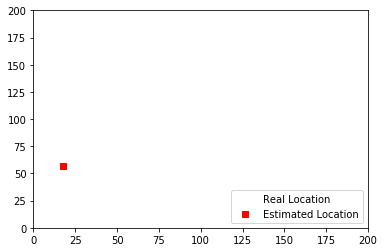

1632
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


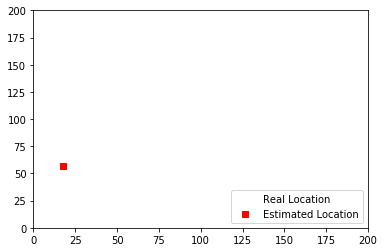

1633
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


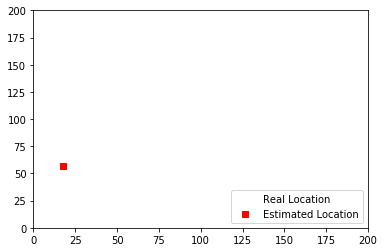

1634
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


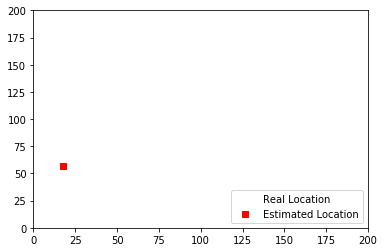

1635
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


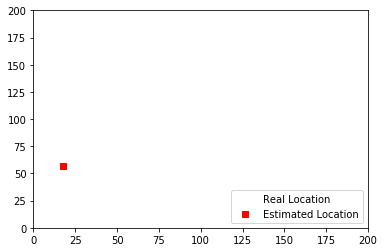

1636
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


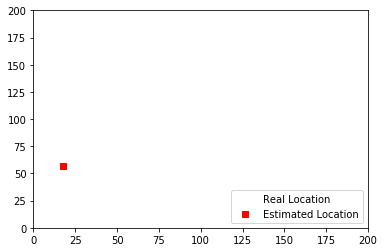

1637
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


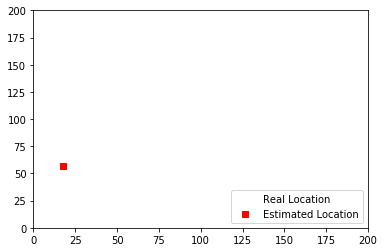

1638
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


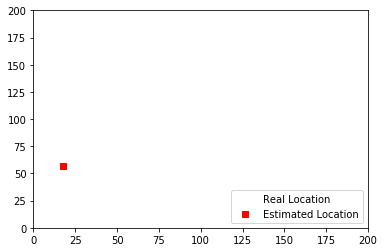

1639
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


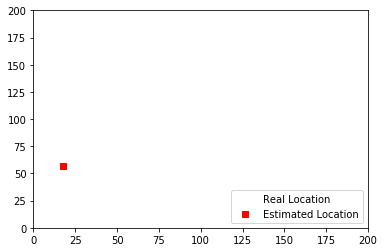

1640
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


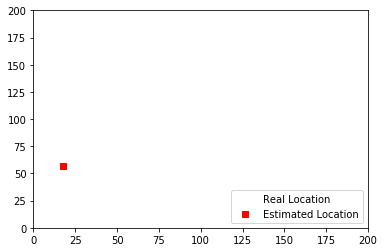

1641
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


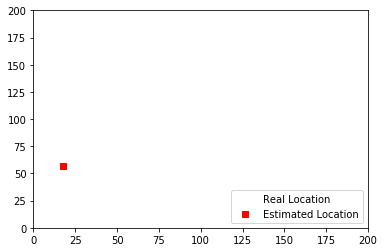

1642
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


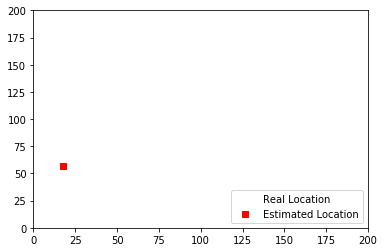

1643
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


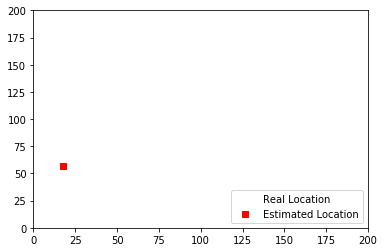

1644
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


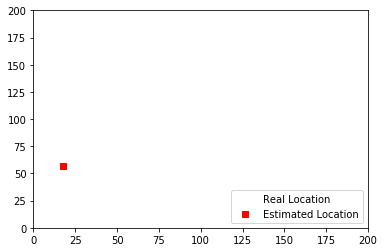

1645
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


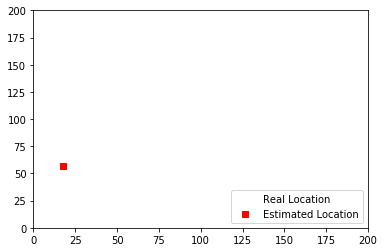

1646
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


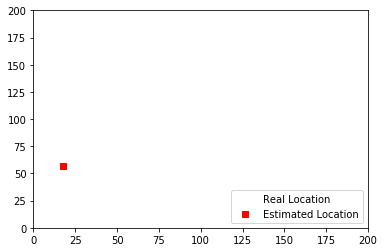

1647
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


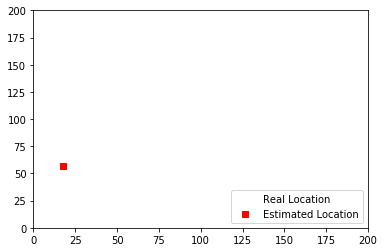

1648
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


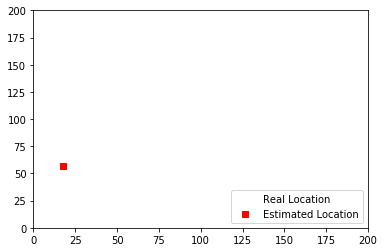

1649
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


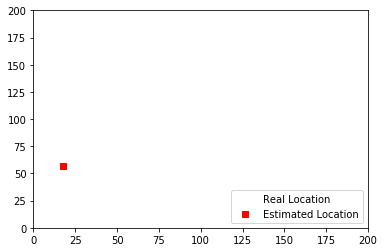

1650
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


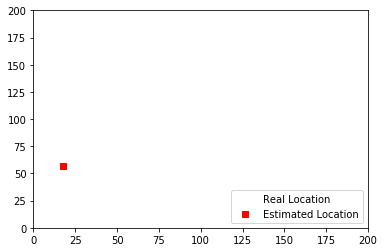

1651
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


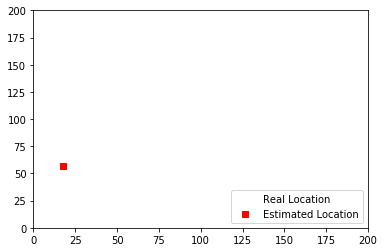

1652
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


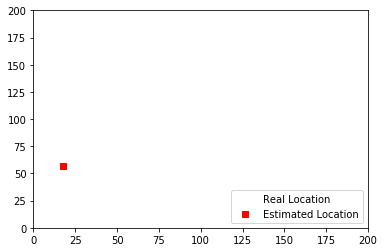

1653
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


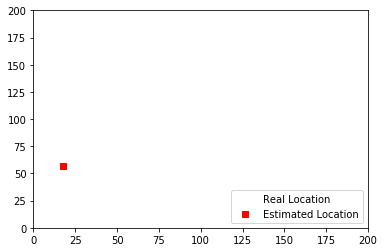

1654
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


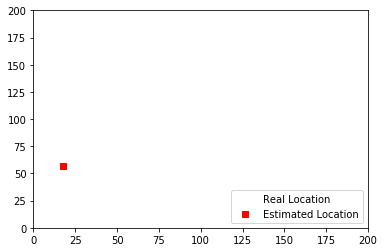

1655
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


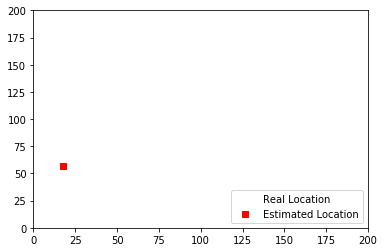

1656
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


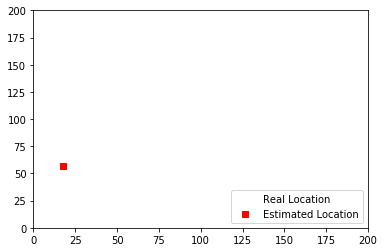

1657
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


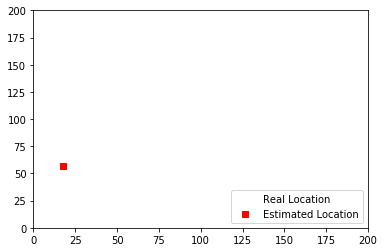

1658
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


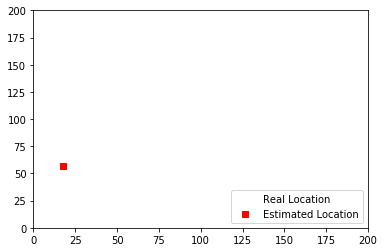

1659
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


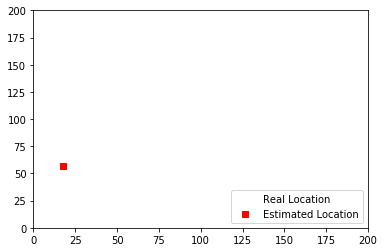

1660
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


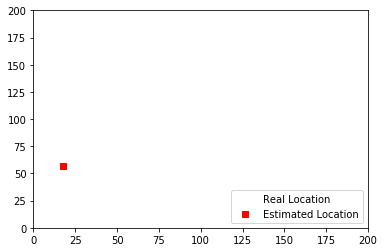

1661
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


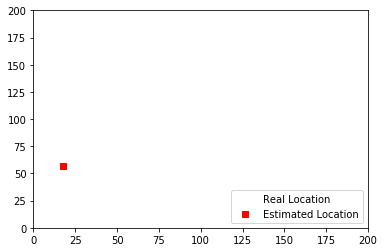

1662
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


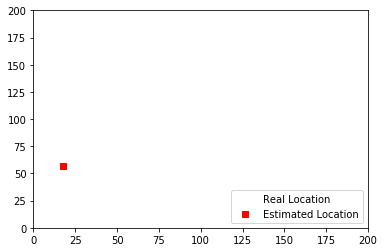

1663
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


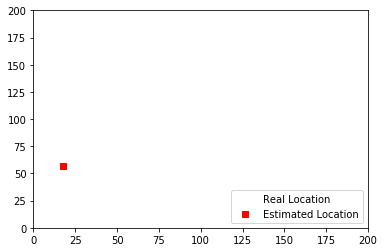

1664
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


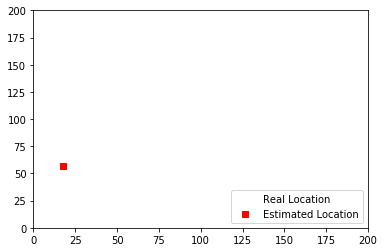

1665
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


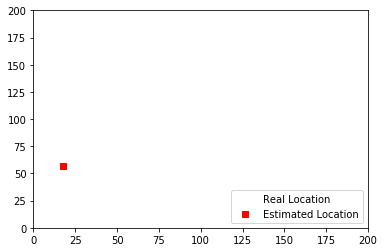

1666
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


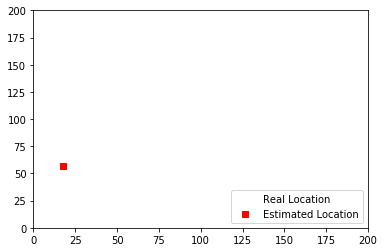

1667
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


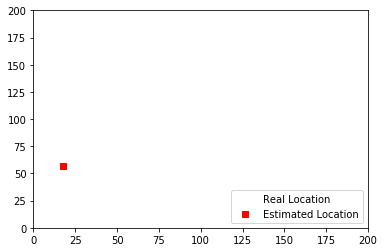

1668
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


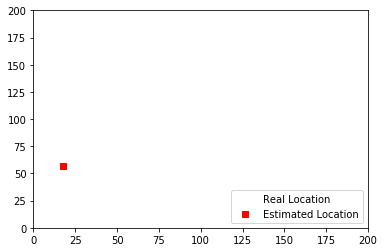

1669
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


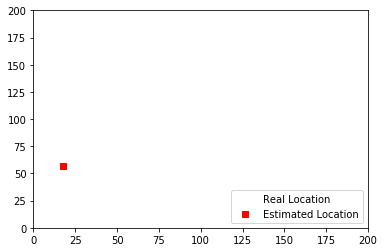

1670
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


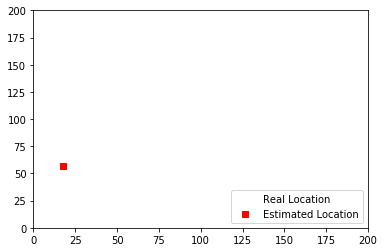

1671
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


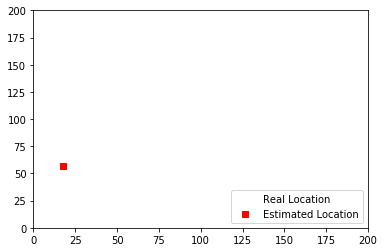

1672
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


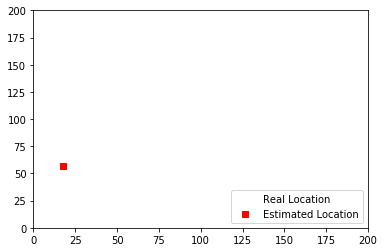

1673
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


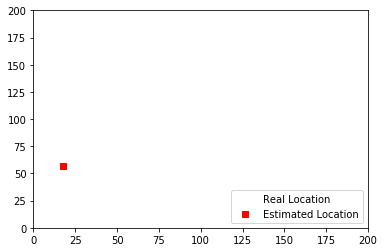

1674
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


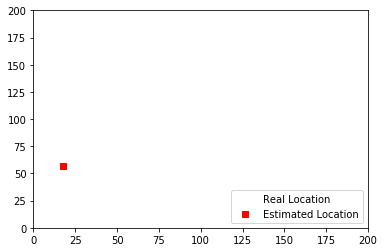

1675
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


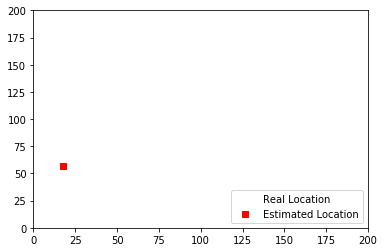

1676
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


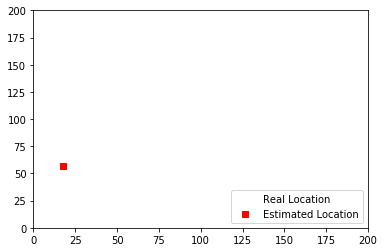

1677
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


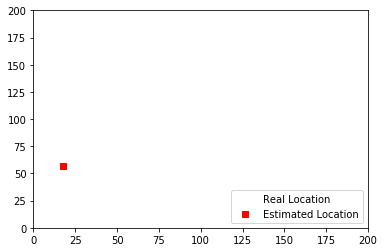

1678
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


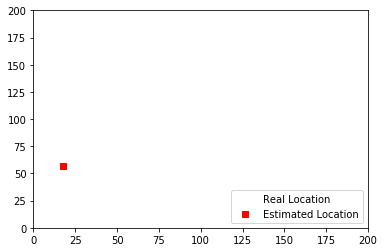

1679
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


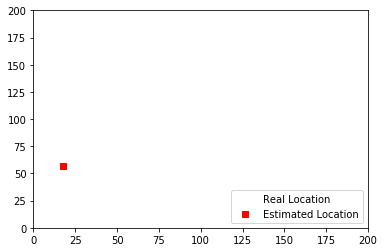

1680
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


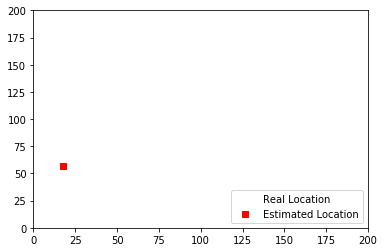

1681
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


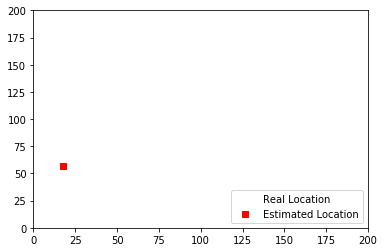

1682
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


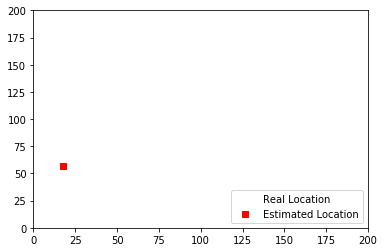

1683
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


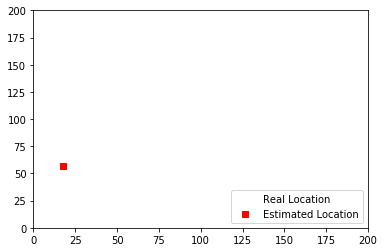

1684
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


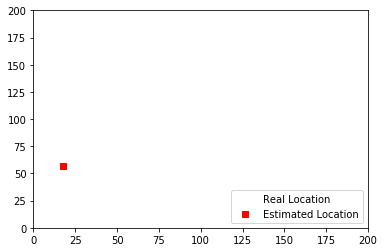

1685
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


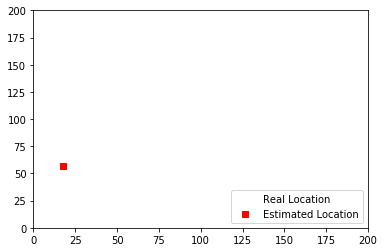

1686
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


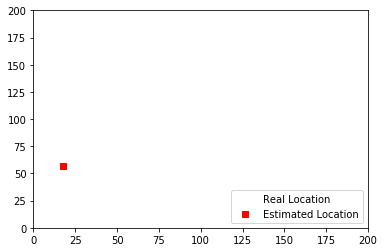

1687
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


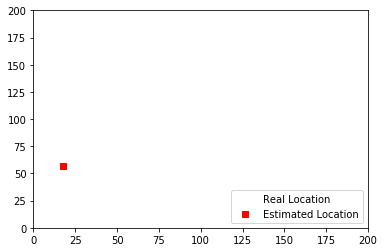

1688
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


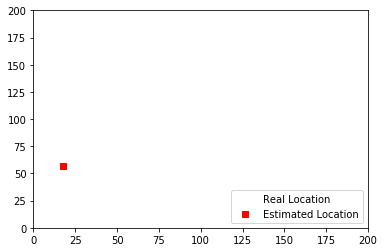

1689
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


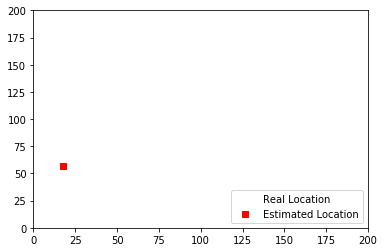

1690
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


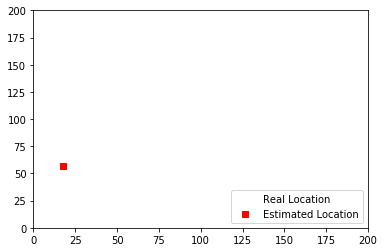

1691
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


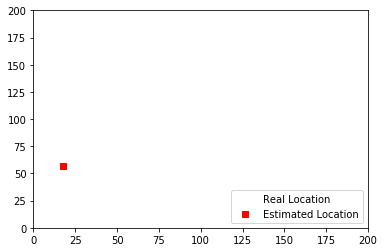

1692
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


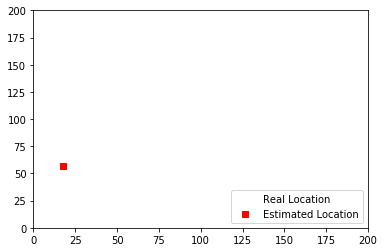

1693
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


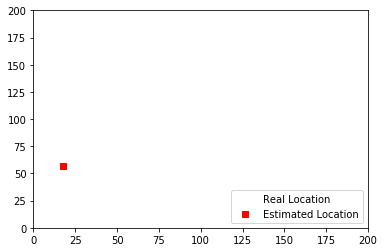

1694
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


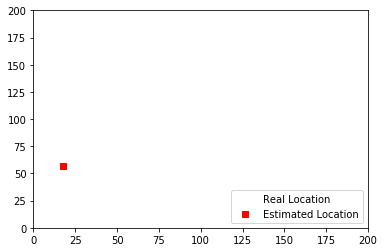

1695
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


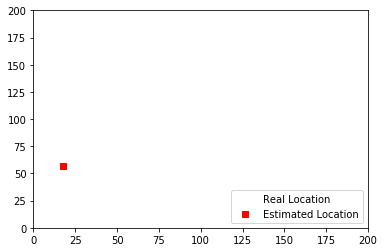

1696
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


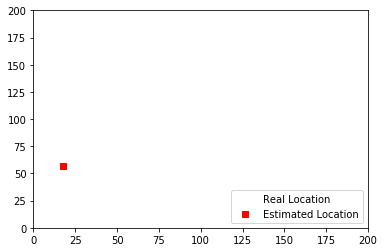

1697
infered loc:
[18.         57.02727273]
real loc:
[nan nan]


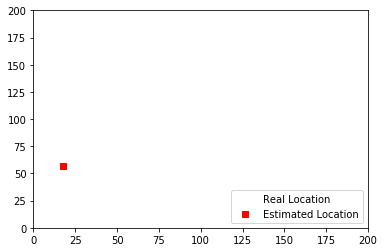

1698


In [ ]:
%matplotlib inline
plt.figure()
readFileCSV()

In [ ]:
len(simulated_sensor_readings)

In [ ]:
completed_dataset = ['time', 'gt(x)', 'gt(y)', 'gt_motion_readings', 'sim_motion_readings']
for i in range(0, len(simulated_sensor_readings)):
    completed_dataset.append((dataset[i + 1], simulated_sensor_readings[i]))

In [ ]:
import pandas as pd

indices_to_keep = [0, 1, 2, 3, 4, 5, 11, 15, 16, 17, 18, 19, 20, 21]

templist = [[0] * 14]
for i in range(0, len(dataset[1:, 3])):
    numlist = [int(s) for s in dataset[1:, 3][i] if s.isdigit()]
    numlist = [numlist[j] for j in range(0, len(numlist)) if j in indices_to_keep]
    templist.append(numlist)
    
templist_modified = [[0] * 14]
for row in range(1, len(templist)):
    history = templist_modified[row - 1]
    row_modified = [0] * 14
    for i in range(len(history)):    
        if (templist[row][i] == 0 and history[i] == 1):
            row_modified[i] = 1
        
        elif (templist[row][i] == 0 and history[i] == 0):
            row_modified[i] = 0
        
        elif (templist[row][i] == 1 and history[i] == 1):
            row_modified[i] = 0
            
        elif (templist[row][i] == 1 and history[i] == 0):
            row_modified[i] = 1
        
    templist_modified.append(row_modified)

del templist_modified[0]    

    
columns = ['time', 'gt(x)', 'gt(y)', 'gt_motion_readings', 'sim_motion_readings']
index = range(0, len(simulated_sensor_readings))

df = pd.DataFrame(index = index, columns = columns)

datadict = {'time' : dataset[1:, 0], 'gt(x)' : dataset[1:, 1], 'gt(y)' : dataset[1:, 2], 
            'gt_motion_readings' : templist_modified, 'sim_motion_readings' : simulated_sensor_readings}

df = pd.DataFrame(datadict)

In [ ]:
templist

In [ ]:
df

In [ ]:
row

In [ ]:
gt_readings = {}

for sensor in range(0, 14):
    gt_readings[sensor] = []
    for i in range(0, len(df['gt_motion_readings'])):
        gt_readings[sensor].append(df['gt_motion_readings'][i][sensor])
        
        
sim_readings = {}

for sensor in range(0, 14):
    sim_readings[sensor] = []
    for i in range(0, len(df['sim_motion_readings'])):
        sim_readings[sensor].append(df['sim_motion_readings'][i][sensor])

In [ ]:
import matplotlib.pyplot as plt

for i in range(len(gt_readings)):
    plt.plot(list(range(0,len(gt_readings[i]))), gt_readings[i])
    plt.show()

In [ ]:
import matplotlib.pyplot as plt

for i in range(len(sim_readings)):
    plt.plot(list(range(0,len(sim_readings[i]))), sim_readings[i])
    plt.show()

In [ ]:
print("please start simulation in casi now.")

In [ ]:
aa = [[0.8, 0], [0, 0]]
print(aa)
# print(*np.where(aa == np.max(aa)))
print(list(zip(*np.where(aa == np.max(aa)))))
np.mean(list(zip(*np.where(aa == np.max(aa)))), axis = 0)

In [ ]:
from random import shuffle
x = [i for i in range(8)]
shuffle(x)
print(x)

In [ ]:
x